# Multimodal Visual and Simulated Muscle Activations for Grounded Semantics of Hand-related Descriptions
## Source Code
### Published in SemDial 2018 (https://semdial.hypotheses.org/)

#### Import these libaries first:

In [1]:
import pandas as pd
from sklearn.metrics import *
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from collections import defaultdict as dd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from slir import SparseLinearRegression #install here: https://github.com/KamitaniLab/slir
from sklearn.neural_network import MLPClassifier
import math
import keras
from keras.datasets import imdb
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.embeddings import Embedding
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Bidirectional, Activation
from keras.layers import Conv2D,Conv1D, MaxPooling2D, MaxPooling1D, SpatialDropout1D
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dropout
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils.np_utils import to_categorical
from keras.layers import Dense, Input,  Flatten
from keras.layers import Conv1D, MaxPooling1D, AveragePooling1D, Embedding
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
import operator
import re
from collections import Counter
from IPython.display import HTML, display
from IPython.display import Image
import pickle

C:\Users\morod\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Read data, remove punctuation, stem, tokenize the descriptions, and add camera one-hot encoding

In [2]:
def read_raw_data():
    # To use mirror data, change the data to `hand_data3_mirror.csv`
    data = pd.read_csv('../data/hand_data3_separated.csv',  index_col=False) 

    # remove punctuation
    data['desc_list'] = data.description.apply(lambda x: [i for i in re.sub(r'[^\w\s]','',str(x)).lower().split()])
    data['desc_str'] = data.desc_list.apply(lambda x: ' '.join(x))

    # add one-hot encoding for the camera
    camera_data = pd.get_dummies(data.camera_angle)
    data = pd.concat([data, camera_data], axis=1)
    cols = data.columns.tolist()
    cols = cols[:8] + cols[-4:] + cols[8:-4]
    data = data[cols]
    
    # get words and vocabs
    words = [y for x in data.desc_list for y in x]
    vocab = list(set(words))
    # print('number of unique words in our data:', len(vocab), '\nnumber of word tokens in our data: ', len(words))
    
    return data, words, vocab

### Split off some of the data for test/eval/held out (this should only be done the first time)

In [13]:
data, words, vocab = read_raw_data()

train_data, test_data = train_test_split(data, test_size=0.2)
test_data, heldout_data = train_test_split(test_data, test_size=0.5)

#To use mirror data, change these data to `...data_mirror`
train_data.to_pickle("../data/train_data3_separated.pkl")
test_data.to_pickle("../data/test_data3_separated.pkl")
heldout_data.to_pickle("../data/heldout_data3_separated.pkl")

train_data.shape, test_data.shape, heldout_data.shape

((1555, 1014), (194, 1014), (195, 1014))

In [3]:
data, words, vocab = read_raw_data()
display(data)

,poseID,camera_angle,description,T1,T2,T3,T4,T5,above,behind,...,f993,f994,f995,f996,f997,f998,f999,f1000,desc_list,desc_str
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,2.610000e-06,7.220000e-06,5.780000e-07,2.680000e-06,1.190000e-05,9.060000e-07,9.820000e-06,7.085950e-04,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...
1,0,above,pointing,0.0,0.0,0.0,0.0,0.0,1,0,...,2.060000e-05,9.680000e-08,2.620000e-06,2.340000e-07,1.800000e-06,1.200000e-06,3.880000e-05,4.150000e-06,[pointing],pointing
2,0,left,side veiw of hand,0.0,0.0,0.0,0.0,0.0,0,0,...,1.240000e-05,2.780000e-05,5.840000e-06,6.270000e-06,7.440000e-05,1.690000e-06,3.740000e-05,7.576890e-04,"[side, veiw, of, hand]",side veiw of hand
3,0,behind,hand away all fingers slightly bent inwards,0.0,0.0,0.0,0.0,0.0,0,1,...,3.760000e-06,3.960000e-05,1.220000e-05,2.200000e-06,1.900000e-05,6.490000e-07,6.760000e-05,5.140000e-05,"[hand, away, all, fingers, slightly, bent, inw...",hand away all fingers slightly bent inwards
4,1,straight_on,hand raised; palm facing self; pinky slightly ...,0.0,0.0,0.0,0.0,0.3,0,0,...,3.880000e-06,8.530000e-06,7.780000e-07,1.780000e-06,1.080000e-05,9.950000e-07,6.590000e-06,6.100050e-04,"[hand, raised, palm, facing, self, pinky, slig...",hand raised palm facing self pinky slightly bent
5,1,above,about to grab someone on the shoulder hand,0.0,0.0,0.0,0.0,0.3,1,0,...,3.090000e-05,1.880000e-07,3.800000e-06,4.510000e-07,3.420000e-06,2.410000e-06,9.680000e-05,7.240000e-06,"[about, to, grab, someone, on, the, shoulder, ...",about to grab someone on the shoulder hand
6,1,left,fingers slightly curved; palm facing right,0.0,0.0,0.0,0.0,0.3,0,0,...,1.730000e-05,2.600000e-05,8.810000e-06,7.690000e-06,7.690000e-05,2.770000e-06,6.110000e-05,7.018750e-04,"[fingers, slightly, curved, palm, facing, right]",fingers slightly curved palm facing right
7,1,behind,back of hand,0.0,0.0,0.0,0.0,0.3,0,1,...,4.700000e-06,4.370000e-05,1.120000e-05,3.570000e-06,3.130000e-05,7.370000e-07,8.490000e-05,9.130000e-05,"[back, of, hand]",back of hand
8,2,straight_on,One finger is down while all others are up,0.0,0.0,0.0,0.0,0.7,0,0,...,5.250000e-06,1.350000e-05,1.470000e-06,2.020000e-06,1.570000e-05,1.800000e-06,8.510000e-06,6.622640e-04,"[one, finger, is, down, while, all, others, ar...",one finger is down while all others are up
9,2,above,All fingers are bend except one,0.0,0.0,0.0,0.0,0.7,1,0,...,2.910000e-05,1.380000e-07,3.260000e-06,4.620000e-07,2.510000e-06,2.480000e-06,9.970000e-05,8.080000e-06,"[all, fingers, are, bend, except, one]",all fingers are bend except one


### Read in data, stack it, and clean it

In [4]:
def read_in_data():
    train_data = pd.read_pickle("../data/train_data3_separated.pkl") # To use mirror data, change to 'train_data_mirror'
    test_data = pd.read_pickle("../data/test_data3_separated.pkl")   # To use mirror data, change to 'test_data_mirror'
    return train_data, test_data

def read_in_heldout_data():
    heldout_data = pd.read_pickle("../data/heldout_data3_separated.pkl") # To use mirror data, change to 'heldout_data_mirror'
    return heldout_data

def stack_training_data(mydata):
    s = mydata.apply(lambda x: pd.Series(x['desc_list']),axis=1).stack().reset_index(level=1, drop=True)
    s.name = 'word'
    mydata = mydata.join(s)
    return mydata

def remove_unwated_words(mydata, vocab, words):
    wanted_words = list(set(words))
    unwanted_words = {'hand', 'and', 'the', 'a', 'with', 'is', 'are', 'to', 'of', 'finger', 'fingers', 'thumb'}
    unwanted_tags = {}
    for curr_word in vocab:
        if curr_word in unwanted_words:
            wanted_words.remove(curr_word)
    mydata = mydata.loc[mydata['word'].isin(wanted_words)]
    return mydata

In [5]:
_, words, vocab = read_raw_data()
train_data, test_data = read_in_data()
train_data = stack_training_data(train_data)
train_data = remove_unwated_words(train_data, vocab, words)
train_data[:10]

,poseID,camera_angle,description,T1,T2,T3,T4,T5,above,behind,...,f994,f995,f996,f997,f998,f999,f1000,desc_list,desc_str,word
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,front
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,left
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,all
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,standing
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,upwards
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,slighly
0,0,straight_on,front of left hand with all fingers standing u...,0.0,0.0,0.0,0.0,0.0,0,0,...,7.220000e-06,5.780000e-07,2.680000e-06,0.000012,9.060000e-07,0.000010,0.000709,"[front, of, left, hand, with, all, fingers, st...",front of left hand with all fingers standing u...,curled
1,0,above,pointing,0.0,0.0,0.0,0.0,0.0,1,0,...,9.680000e-08,2.620000e-06,2.340000e-07,0.000002,1.200000e-06,0.000039,0.000004,[pointing],pointing,pointing
2,0,left,side veiw of hand,0.0,0.0,0.0,0.0,0.0,0,0,...,2.780000e-05,5.840000e-06,6.270000e-06,0.000074,1.690000e-06,0.000037,0.000758,"[side, veiw, of, hand]",side veiw of hand,side
2,0,left,side veiw of hand,0.0,0.0,0.0,0.0,0.0,0,0,...,2.780000e-05,5.840000e-06,6.270000e-06,0.000074,1.690000e-06,0.000037,0.000758,"[side, veiw, of, hand]",side veiw of hand,veiw


### Training code

In [6]:
# Change these parameters to edit the data used to train
# To use only tendon data to train, use START_COL = 'T1' END_COL = 'T5'
# To use only visual data to train, use START_COL = 'f1' END_COL = 'f1000'
# To use all data to train, use START_COL = 'T1' END_COL = 'f1000'
START_COL = 'T1' 
END_COL = 'f1000'

In [7]:
class Model:
    """
    This class holds either a WAC logreg model (WAC) or a WAC NN model (NN)
    """
    pass

    def WAC_model(self, model):
        """
        Stores a WAC logreg model
        
        Args:
            model: The WAC logreg model to store
        """
        self.model_type = 'WAC'
        self.model = model
    
    def NN_model(self, model, word_encoder, one_hot_encoder):
        """
        Stores a WAC NN model
        
        Args:
            model: The NN model to store
            word_encoder: The word encoder used to encode and decode words into classes
            one_hot_encoder: Used to one-hot-encode words
        """
        self.model_type = 'NN'
        self.model = model
        self.word_encoder = word_encoder
        self.one_hot_encoder = one_hot_encoder
        

def get_rand_normal(mu=0, sigma=0.1, only_pos=False): 
    """
    Helper function to get a normal distribution
    Args:
        mu: The mu value to use for the standard deviation
        signma: The signma value to use for the standard deviation
        only_pos: If to only spread in the positive direction (not implemented)
    """
    return np.random.normal(mu, sigma)

def spreadalize(df, sigma=0.1, only_pos=True):
    """
    Spreads every tendon activation in the given data fram along a random distribution
    Args:
        df: The data frame to spread
        signma: The signma value to use for the standard deviation
        only_pos: If to only spread in the positive direction (not implemented)
    """
    for i, row in df.iterrows():
        #IF ONLY ZEROES: df.set_value(i, 'T1', abs(newval) if only_pos else newval)
        df.set_value(i, 'T1', row["T1"]+get_rand_normal(sigma=sigma, only_pos=only_pos))
        df.set_value(i, 'T2', row["T2"]+get_rand_normal(sigma=sigma, only_pos=only_pos))
        df.set_value(i, 'T3', row["T3"]+get_rand_normal(sigma=sigma, only_pos=only_pos))
        df.set_value(i, 'T4', row["T4"]+get_rand_normal(sigma=sigma, only_pos=only_pos))
        df.set_value(i, 'T5', row["T5"]+get_rand_normal(sigma=sigma, only_pos=only_pos))
    return df

def train(mydata, min_train=5, num_negs=1, spread_tendon_data=False, debug=True, useNN = False):
    """
    Trains the model
    Args:
        mydata: The data to use to train - pandas dataframe
        min_train: The minimum number of times a word has to appear in the data for a classifier to be build for that word
        num_negs: The number of negative examples to use for every classifier in the logreg model. 
                  This number is multiplied by the number of pos examples found
        spread_tendon_data= If to spread out the values of the tendons along a normal distribution. 
        debug: If to print debug messages
        useNN: If to train using a NN
        
    Returns:
        The trained model
    """
    
    if useNN:
        from sklearn.preprocessing import OneHotEncoder
        from sklearn import preprocessing
        
        words = list(set(mydata.word))[1:] 
        we = preprocessing.LabelEncoder()
        we.fit(words)
        lbls = we.transform(words)
        enc = OneHotEncoder()
        lbls = lbls.reshape(len(lbls), 1)
        enc.fit(lbls)
        X_train = []
        y_train = []
        for word in words:
            pos_data = mydata[mydata.word == word]
            if len(pos_data) < min_train: continue
            pos_data = pos_data if not spread_tendon_data else spreadalize(pos_data)
            y = we.transform([word])
            y = enc.transform(y.reshape(-1, 1)).toarray()[0]
            #X = pos_data.append(neg_data)
            X = pos_data
            X = X.loc[:,START_COL:END_COL].as_matrix() #NOTE: changed from .ix to .loc
            for i in range(0,len(X)): y_train.append(y)
            for x in X: X_train.append(x)

        X_train = np.matrix(X_train)
        y_train = np.matrix(y_train)
        model = Sequential()
        model.add(Dense(X_train.shape[1]+5, activation='tanh', input_shape=(X_train.shape[1],)))
        #model.add(Dense(int(X_train.shape[1]), activation='tanh'))
        #model.add(Dropout(0.25))
        #model.add(Conv1D(X_train.shape[1], 2, activation='tanh', input_shape=(X_train.shape[0], X_train.shape[1])))
        #model.add(AveragePooling1D(2))
        model.add(Dense(int(X_train.shape[1]), activation='tanh'))
        model.add(Dense(int(X_train.shape[1]/2), activation='tanh'))
        model.add(Dense(len(words),activation='softmax'))
        model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics = ['accuracy'])
        #print(model.summary())

        model.fit(X_train, y_train, verbose=0, shuffle=True, epochs=15, batch_size=256)

        mymodel = Model()
        mymodel.NN_model(model, we, enc)
        return mymodel
        
    else:
        wacs = {}

        if debug: print("training with start col", START_COL, "end col", END_COL)

        words = list(set(mydata.word))[1:] # why does it have nan for the first element?
        for word in words:
            pos_data = mydata[mydata.word == word]
            if len(pos_data) < min_train: continue
            pos_data = pos_data if not spread_tendon_data else spreadalize(pos_data)

            negs = num_negs * len(pos_data)
            neg_data = mydata[~mydata.desc_str.str.contains(word)].sample(negs, replace=True) # make sure the word isn't anywhere in any other description
            neg_data = neg_data if not spread_tendon_data else spreadalize(neg_data)

            y = [1] * len(pos_data) + [0] * negs
            X = pos_data.append(neg_data)
            X = X.loc[:,START_COL:END_COL].as_matrix() #NOTE: changed from .ix to .loc
            regr = linear_model.LogisticRegression() #
            #regr = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(2, 1), random_state=1)
            #regr = SparseLinearRegression(n_iter=len(nwacs[w]), prune_threshold = 1.0e-10, prune_mode=2)
            regr.fit(X, y) # train
            wacs[word] = regr
        
        mymodel = Model()
        mymodel.WAC_model(wacs)
        return mymodel

### Testing Code

In [8]:
def eval_sample(mdl, row, model_type):
    """
    Evaluates a single row of data
    
    Args:
        mdl: the model/classifier to use
        row: the row of data to evaluate on
        model_type: the type of the model. Either "WAC" or "NN"
        
    Returns:
        The output/prediction of the model
    """
    if(model_type == 'WAC'):
        feats = row.loc[START_COL: END_COL].as_matrix().reshape(1, -1)
        return mdl.predict_proba(feats)[0][1]
    else:
        feats = row.loc[START_COL: END_COL].as_matrix().reshape(1, -1)
        return mdl.predict_proba(feats, verbose=0)[0]
    
def make_id(row):
    """
    Turns a single row into a string id
    Args:
        A single row
    Returns:
        A string id
    """
    return str(row.poseID) + str(row.camera_angle)

def compose(words, row, model): 
    """
    Composes a fit between the given words and a given hand
    Args:
        words: A list of words that describe a hand
        row: A row in the data for a single hand
        model: the model to use to compose as a Model class
        
    Returns:
        A number representing how well the words fit the hand. The higher, the better fit.
    """
    if(model.model_type == 'WAC'):
        wacs = model.model
        fits = ([eval_sample(wacs[w], row, model.model_type) for w in words if w in wacs])
        return sum(fits) 
    else:        
        nn = model.model
        le = model.word_encoder
        fits = []
        for w in words:
            es = eval_sample(nn, row, model.model_type)
            try:
                nmlbl = le.transform([w])[0]
                fits.append(es[nmlbl])
            except ValueError:
                #print(w, "not in label encoder")
                continue
        return sum(fits) 

def compose_avrg(words, row, model): 
    """
    Composes a fit between the given words and a given hand by averaging rather than adding fits.
    Args:
        words: A list of words that describe a hand
        row: A row in the data for a single hand
        model: the model to use to compose as a Model class
        
    Returns:
        A number representing how well the words fit the hand. The higher, the better fit.
    """
    if(model.model_type == 'WAC'):
        wacs = model.model
        fits = ([eval_sample(wacs[w], row, model.model_type) for w in words if w in wacs])
        if len(fits) == 0:
            return 0
        return sum(fits) / float(len(fits)) #return the average of the fits
    else:        
        nn = model.model
        le = model.word_encoder
        fits = []
        for w in words:
            es = eval_sample(nn, row, model.model_type)
            try:
                nmlbl = le.transform([w])[0]
                fits.append(es[nmlbl])
            except ValueError:
                #print(w, "not in label encoder")
                continue
        if len(fits) == 0:
            return 0
        return sum(fits) / float(len(fits)) #return the average of the fits  
    
def compose_list(words, row, model):
    """
    Composes a list of fits between the given words and a given hand.
    Args:
      words: A list of words that describe a hand
      row: A row in the data for a single hand
      model: the model to use to compose as a Model class
        
    Returns:
      A list  representing how well each words fits the hand. The higher, the better fit.
    """
    if(model.model_type == 'WAC'):
        fits = [(format(eval_sample(wacs[w], row, model.model_type), '.2f'), w) for w in words if w in wacs]
        return fits
    else:
        nn = model.model
        le = model.word_encoder
        fits = []
        for w in words:
            es = eval_sample(nn, row, model.model_type)
            try:
                nmlbl = le.transform([w])[0]
                fits.append(es[nmlbl])
            except ValueError:
                #print(w, "not in label encoder")
                continue
        return fits


def compose_with_weights(words, row, wacs): 
    """
    Composes while regarding the weight of each of the words.
    Composes the fit of the words by dividing by the frequency of the word
    """
    #print(words, [ctr[w] for w in words])
    fits = [(eval_sample(wacs[w], row, 'WACS') * 100 /ctr[w]) for w in words if w in wacs]
    #fits.append(0)
    return sum(fits)

def compose_with_weights_avrg(words, row, wacs): 
    """
    Composes the average while regarding the weight of each of the words.
    """
    fits = [(eval_sample(wacs[w], row, 'WACS') * 100 /ctr[w]) for w in words if w in wacs]
    if len(fits) == 0:
        return 0
    return sum(fits) / float(len(fits)) #return the average of the fits

def compose_with_weights_list(words, row, wacs): 
    """
    Composes a list while regarding the weight of each of the words.
    """
    fits = [(format(((eval_sample(wacs[w], row, 'WACS') * 100)/ctr[w]), '.2f'),w) for w in words if w in wacs]
    return fits

def test(wacs, mytest_data, num_distractors=4, debug=False, only_test_on_first_row=False, use_these_distractors=None):
    """
    Tests the model using Experiment 1 as described in the paper
    Args:
        wacs: the model to use. Either WAC_logreg or WAC_NN
        mytest_data: the testing data
        num_distractors: The number of distractor hands to use in the test
        debug: if to display debugging info
        only_test_on_first_row: if to only test on the first row of data 
        use_these_distractors: If to use a specific list of distractors
        
    Returns:
        gold: A list of correct answers
        guess: A list of guessed answers
        guess_fit: A list of fits for every guess. How confident the guesses are
    """
    gold = list()
    guess = list()
    guess_fit = list()
    
    tests_skipped = 0
    total_tests = 0
    
    if only_test_on_first_row:
        data_to_test = mytest_data.iloc[[0]]
    else:
        data_to_test = mytest_data
    
    for index,row in data_to_test.iterrows():
       
        c_guess = list()
        words = row.desc_list
        if debug:
            print("%%%%%%%%%%%%%%%%%%%%") #DEBUG
            print("What pose best matches this description: '" + " ".join(words) + "'") #DEBUG
            print(make_id(row) + "     " + str(compose_list(words, row, wacs))) #DEBUG    
        p = compose(words, row, wacs)
        
        total_tests += 1
        if p == 0:  # the case where none of the words are in wac
            if(not only_test_on_first_row):
                #print("WORDS NOT IN WAC, SKIPPING")
                tests_skipped += 1
                continue;
            else:
                return "NO_WORDS_IN_WAC", "NO_WORDS_IN_WAC", 0.1
            
        c_guess.append((make_id(row),p)) # add the current row's probability to the guess
        
        #The distractors are found differently if only testing on first row
        if (use_these_distractors is not None):
            distractors = use_these_distractors.sample(num_distractors)
        elif(not only_test_on_first_row):
            complement_test_data = mytest_data[(mytest_data.index != index) & (mytest_data.poseID != row.poseID)] # make sure the current row isn't in the distractors
            distractors = complement_test_data.sample(num_distractors)
        else:
            distractors = mytest_data[(mytest_data.index != index) & (mytest_data.poseID != row.poseID)] # make sure the current row isn't in the distractors
        
        
        for d_ind, d_row in distractors.iterrows():
            if debug:
                print(make_id(d_row) + "     " + str(compose_list(words, d_row, wacs))) #DEBUG
            c_guess.append((make_id(d_row),compose(words, d_row, wacs))) # check the words against distractors
            
        c_guess.sort(key=operator.itemgetter(1)) # sort based on probability
        if debug:
            print("CORRECT ANSWER: " + make_id(row))    #DEBUG
            print("SELECTED ANSWER: " + str(c_guess[-1][0])) #DEBUG
        gold.append(make_id(row))
        guess.append(c_guess[-1][0]) # the highest probable one is the final guess
        guess_fit.append(c_guess[-1][1])
        
    if debug: print("Total tests skipped: " + str(tests_skipped) + " out of " + str(total_tests) + "    " + str(tests_skipped/total_tests))
    return gold, guess, guess_fit
    
def test2(wacs, mytest_data, num_distractors=4, debug=False,  only_test_on_first_row=False, use_these_distractors=None):
    """
    Tests the model using Experiment 2 as described in the paper
    Args:
        wacs: the model to use. Either WAC_logreg or WAC_NN
        mytest_data: the testing data
        num_distractors: The number of distractor descriptions to use in the test
        debug: if to display debugging info
        only_test_on_first_row: if to only test on the first row of data 
        use_these_distractors: If to use a specific list of distractors
        
    Returns:
        gold: A list of correct answers
        guess: A list of guessed answers
        guess_fit: A list of fits for every guess. How confident the guesses are
    """
    if debug: 
        print("USING TEST 2")
    tests_skipped = 0
    total_tests = 0
        
    gold = list()
    guess = list()
    guess_fit = list()
    
    if only_test_on_first_row:
        data_to_test = mytest_data.iloc[[0]]
    else:
        data_to_test = mytest_data
    
    for index,row in data_to_test.iterrows():
        c_guess = list()
        words = row.desc_list
        if debug:
            print("%%%%%%%%%%%%%%%%%%%%") #DEBUG
            print("What description best matches this pose: '" + make_id(row) + "'\n") #DEBUG
            display(Image('../data/screenshots-jpg/pic{}.jpg'.format(make_id(row)), width=200, height=100))
            print(" ".join(words) + "     " + str(compose_list(words, row, wacs)) + " -> " + str(compose_avrg(words, row, wacs)) +  "\n") #DEBUG    
        p = compose_avrg(words, row, wacs)
        
        total_tests += 1       
        if p == 0:  # the case where none of the words are in wac
            if(not only_test_on_first_row):
                #print("WORDS NOT IN WAC, SKIPPING")
                tests_skipped += 1
                continue;
            else:
                return "NO_WORDS_IN_WAC", "NO_WORDS_IN_WAC", 0.1
            
        c_guess.append((words,p)) # add the current row's probability to the guess
        
        #The distractors are found differently if only testing on first row
        if (use_these_distractors is not None):
            distractors = use_these_distractors.sample(num_distractors)
        elif(not only_test_on_first_row):
            complement_test_data = mytest_data[(mytest_data.index != index) & (mytest_data.poseID != row.poseID)] # make sure the current row isn't in the distractors
            distractors = complement_test_data.sample(num_distractors)
        else:
            distractors = mytest_data[(mytest_data.index != index) & (mytest_data.poseID != row.poseID)] # make sure the current row isn't in the distractors
    
        for d_ind, d_row in distractors.iterrows():
            if debug:
                print(" ".join(d_row.desc_list) + "     " + str(compose_list(d_row.desc_list, row, wacs)) + " -> " + str(compose_avrg(d_row.desc_list, row, wacs))   + "\n") #DEBUG
            c_guess.append((d_row.desc_list,compose_avrg(d_row.desc_list, row, wacs))) # check the words against distractors
            
        c_guess.sort(key=operator.itemgetter(1)) # sort based on probability
        if debug:
            print("CORRECT ANSWER: " + " ".join(words))    #DEBUG
            print("SELECTED ANSWER: " + " ".join(c_guess[-1][0]) + " Fit: " + str(c_guess[-1][1])) #DEBUG
        gold.append(" ".join(words))
        guess.append(" ".join(c_guess[-1][0])) # the highest probable one is the final guess
        guess_fit.append(c_guess[-1][1])
        
    if debug: print("Total tests skipped: " + str(tests_skipped) + " out of " + str(total_tests) + "    " + str(tests_skipped/total_tests))
    return gold, guess, guess_fit
    

### K-fold Cross Validation

In [9]:
from tqdm import tqdm

def cross_validation(m, num_negs, num_distractors, start_col, end_col, num_out=1, random_seed=-1, debug=False, debug_testing=False, 
                     spread_tendon_data=False, end_early=False, dataName="unnamedcrossvalidation", use_test2=False, 
                     eval_on_heldout=False, range_dist=False, min_distr=1, max_distr=4, useNN = False, num_times_repeat=1):
    """
    Runs a K-Fold Cross Validation
    Args:
        m: the min number a word has to appear to train on
        num_negs: number of negative examples
        start_col, end_col: the starting and ending cols to use for training
        num_out: the k in the k-fold 
        debug: if to show debug traininginfo
        debug_testing: if to show debug testing info
        spread_tendon_data: if to spread tendon data while training
        end_early: if to stop corss validating after 2 tries
        dataName: what to call the cross validated data
        use_test2: if to use test 2 or test 1
        eval_on_heldout: if to evaluate on the heldout data
        range_dist: if to use a set range of number of distractors
        min_distr: the min number of testing distractors to use (only enabled if range_dist is true)
        max_distr: the max number of testing distractors to use (only enabled if range_dist is true)
        use_NN: If to use the NN model variant
        num_times_repeat: number of times to repeat the validation
        
    Returns:
       The results to produce a plot for cross validation
    """
    
    if random_seed > 0: np.random.seed(random_seed)
    else: np.random.seed(None)
        
    #fix max distr
    max_distr = max_distr + 1;
    
    #grab data
    _, words, vocab = read_raw_data()
    train_data_unstacked, test_data = read_in_data()
    if eval_on_heldout:
        heldout_data_unstacked = read_in_heldout_data()
        #display(heldout_data_unstacked)
        train_data_unstacked = train_data_unstacked.append(heldout_data_unstacked)
        
    #display(train_data_unstacked)
    if eval_on_heldout:
        data_to_eval = heldout_data_unstacked
    else:
        data_to_eval = train_data_unstacked
    
    
    #average of all results
    all_results = list()
    
    for i in range (0, num_times_repeat):
        #fill in result lists
        curr_result = {}
        if range_dist:
            for i in range(min_distr, max_distr):
                curr_result[i] = list()
        else:
            curr_result[num_distractors] = list()


        totalTries = 0
        correctGuess = 0
        with tqdm(total=data_to_eval.shape[0]) as pbar:
            for index, row in data_to_eval.groupby(np.arange(len(data_to_eval))//num_out):
                if end_early and (totalTries == 2): return (correctGuess/totalTries)

                #isolate the out_data and select rest of data to be trained
                out_data = row #get the out_data to be used for evaluation

                #The testing function will sample from the distractors
                distractors = test_data

                # LEGACY CODE
                #if range_dist:
                #    distractors = test_data.sample(max_distr)
                #else:
                #    distractors = test_data.sample(num_distractors)  

                out_data = out_data.append(distractors) #add more distractors to the out data

                #if debug: print("[" + str(totalTries / train_data_unstacked.shape[0])[:6] + "% complete] ----------------------------------")
                if debug: 
                    print("Taking out the following: " + str(out_data.shape) + 
                          " With " + str(len(row)) + " rows to be evaluated and " + str(len(distractors)) + " rows of distractors")
                    #display(out_data) #Enable to see out data

                train_data_out = train_data_unstacked.copy() #make copy of training data

                #take out the out data
                #LEGACY train_data_out.drop(out_data.index[0], inplace=True) 
                train_data_out.drop(row.index, inplace=True)

                train_data_stacked = stack_training_data(train_data_out) #stack the training data to get ready for training
                train_data_ready = remove_unwated_words(train_data_stacked, vocab, words) #clean the training data to get ready for training

                #run training and test 
                global START_COL
                global END_COL
                START_COL = start_col
                END_COL = end_col

                #train
                model = train(train_data_ready, min_train=m, num_negs=num_negs, spread_tendon_data=spread_tendon_data, debug=debug, useNN=useNN)

                #check if doing a range of distractors
                if range_dist:
                    start = min_distr
                    stop = max_distr
                else :
                    start = num_distractors
                    stop = num_distractors + 1

                #testing
                for curr_num_distr in range(start, stop):
                    if debug: print("\n\n TESTING " + str(curr_num_distr) + " DISTRACTORS \n\n")

                    if not use_test2:
                        gold, guess, guess_fit = test(model, row, num_distractors=curr_num_distr, debug=debug_testing, use_these_distractors=distractors)
                    else:
                        gold, guess, guess_fit = test2(model, row, num_distractors=curr_num_distr, debug=debug_testing, use_these_distractors=distractors)
                    #acc = accuracy_score(gold, guess)

                    if gold == "NO_WORDS_IN_WAC":
                        print("SKIPPING: no words in wac")
                        continue #skip

                    totalTries += 1
                    #print(gold)
                    #print(guess)
                    acc = accuracy_score(gold, guess)
                    curr_result[curr_num_distr].append(acc)
                    overall_acc = sum(curr_result[curr_num_distr]) / len(curr_result[curr_num_distr])

                    if debug: print('Accuracy of last batch: '+ str(acc));
                    if debug: print('Overall accuracy: ' + str(overall_acc))

                    # Saving the objects:
                    #with open(dataName+".pkl", 'wb') as f:
                    #    pickle.dump([curr_result, range(totalTries)], f)

                if debug: print("Current results: " + str(curr_result))

                pbar.update(len(row))
                
        all_results.append(curr_result)
                
    #aggregate and average results
    avrg_result = {}
    #prepare avrg_result
    if range_dist:
        for i in range(min_distr, max_distr):
            avrg_result[i] = list()
    else:
        avrg_result[num_distractors] = list()
        
    for distr in range(1, len(avrg_result)+1):
        for fold in  range(0, math.ceil(len(data_to_eval)/num_out)):
            sumVals = 0
            for result in all_results:
                sumVals = sumVals + result[distr][fold]
            avrg_result[distr].append(sumVals / len(all_results)) #average of the x fold of the y num of distractors
    
    #print("All results:")
    #display(all_results)
    #print("Average results:")
    #display(avrg_result)
    return avrg_result

# Graph the Results


## Collect the data for the experiment 1 graph:

In [ ]:
NUMBER_OF_DISTRACTORS_TO_TEST = 5 #starts at 1 and goes to this number. This is the number of distractors per batch
M_value = 1
NUM_OUT = 50
USE_TEST2 = False
DEBUG = False
MORE_DEBUG = False
NUM_NEGS = 3
EVAL_ON_HELDOUT = True
USE_NN = False
NUM_TIMES_REPEAT_TEST = 5

#Tendon only data
print("TENDON ONLY")
Ts = list() 
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'T5', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendon_crossvalidation", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Ts.append((sum(value)/len(value)))
    
#Visual only data
print("VISUAL ONLY")
Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='above', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="visual_crossvalidation", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Vs.append((sum(value)/len(value)))
    
#Tendon and Visual data
print("TENDON AND VISUAL")
T_Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendonvisual_crossvalidation", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    T_Vs.append((sum(value)/len(value)))
    
#calculate baseline
Bs = list() 
Ns = list()
for num_distract_curr in range (1, NUMBER_OF_DISTRACTORS_TO_TEST+1):
    Ns.append(num_distract_curr)
    Bs.append(1.0/(1.0+num_distract_curr))   
    
print("Saving the following to a .pkl file: ")
print([Ts, Vs, T_Vs, Bs, Ns])

    
# Saving the objects:
with open('cross_heldout_exp1_data3_wac.pkl', 'wb') as f:
    pickle.dump([Ts, Vs, T_Vs, Bs, Ns], f)

print("DONE!")

## Collect the data for the experiment 2 graph:

In [ ]:
NUMBER_OF_DISTRACTORS_TO_TEST = 5 #starts at 1 and goes to this number. This is the number of distractors per batch
M_value = 1
NUM_OUT = 50
USE_TEST2 = True
DEBUG = False
MORE_DEBUG = False
NUM_NEGS = 3
EVAL_ON_HELDOUT = False
USE_NN = False
NUM_TIMES_REPEAT_TEST = 5

#Tendon only data
print("TENDON ONLY")
Ts = list() 
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'T5', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendon_crossvalidation2", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Ts.append((sum(value)/len(value)))
    
#Visual only data
print("VISUAL ONLY")
Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='above', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="visual_crossvalidation2", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Vs.append((sum(value)/len(value)))
    
#Tendon and Visual data
print("TENDON AND VISUAL")
T_Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendonvisual_crossvalidation2", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    T_Vs.append((sum(value)/len(value)))
    
#calculate baseline
Bs = list() 
Ns = list()
for num_distract_curr in range (1, NUMBER_OF_DISTRACTORS_TO_TEST+1):
    Ns.append(num_distract_curr)
    Bs.append(1.0/(1.0+num_distract_curr))   
    
print("Saving the following to a .pkl file: ")
print([Ts, Vs, T_Vs, Bs, Ns])

    
# Saving the objects:
with open('cross_heldout_exp2_data3_wac.pkl', 'wb') as f:
    pickle.dump([Ts, Vs, T_Vs, Bs, Ns], f)

print("DONE!")

## Collect the data for the experiment 3 graph:
BEFORE RUNNING please search for and change all of the data from data_separated to data_mirror (4)

In [ ]:
NUMBER_OF_DISTRACTORS_TO_TEST = 5 #starts at 1 and goes to this number. This is the number of distractors per batch
M_value = 1
NUM_OUT = 50
USE_TEST2 = False
DEBUG = False
MORE_DEBUG = False
NUM_NEGS = 3
EVAL_ON_HELDOUT = False
USE_NN = False
NUM_TIMES_REPEAT_TEST = 5

#Tendon only data
print("TENDON ONLY")
Ts = list() 
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'T5', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendon_crossvalidation3", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Ts.append((sum(value)/len(value)))
    
#Visual only data
print("VISUAL ONLY")
Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='above', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="visual_crossvalidation3", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    Vs.append((sum(value)/len(value)))
    
#Tendon and Visual data
print("TENDON AND VISUAL")
T_Vs = list()
result = cross_validation(m=M_value, num_negs=NUM_NEGS, num_distractors=0, num_out=NUM_OUT,
                start_col='T1', end_col = 'f1000', 
                debug=DEBUG, debug_testing=MORE_DEBUG, dataName="tendonvisual_crossvalidation3", 
                use_test2=USE_TEST2, eval_on_heldout = EVAL_ON_HELDOUT,
                range_dist=True, min_distr=1, max_distr=NUMBER_OF_DISTRACTORS_TO_TEST, 
                useNN=USE_NN, num_times_repeat=NUM_TIMES_REPEAT_TEST)
print("Results")
for key, value in result.items(): #go through each number of distractors
    print(str(key) + " distractor: " + str(sum(value)/len(value)))
    T_Vs.append((sum(value)/len(value)))
    
#calculate baseline
Bs = list() 
Ns = list()
for num_distract_curr in range (1, NUMBER_OF_DISTRACTORS_TO_TEST+1):
    Ns.append(num_distract_curr)
    Bs.append(1.0/(1.0+num_distract_curr))   
    
print("Saving the following to a .pkl file: ")
print([Ts, Vs, T_Vs, Bs, Ns])

    
# Saving the objects:
with open('cross_heldout_exp3_data3_wac.pkl', 'wb') as f:
    pickle.dump([Ts, Vs, T_Vs, Bs, Ns], f)

print("DONE!")

## Graph the results for Experiments 1, 2, and 3|

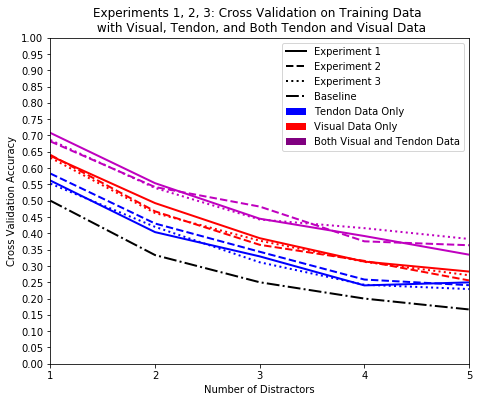

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

with open("cross_heldout_exp1_data3_wac.pkl", 'rb') as f:
        data_exp1 = pickle.load(f)
with open("cross_heldout_exp2_data3_wac.pkl", 'rb') as f:
        data_exp2 = pickle.load(f)
with open("cross_heldout_exp3_data3_wac.pkl", 'rb') as f:
        data_exp3 = pickle.load(f)

# LEGACY EXAMPLE DATA 
# data_exp1 = [[0.5617529880478087, 0.4037184594953519, 0.3293492695883134, 0.2403718459495352, 0.249667994687915, 0.199203187250996, 0.17928286852589642, 0.16201859229747675, 0.1248339973439575, 0.14475431606905712], [0.6374501992031872, 0.49269588313413015, 0.3851261620185923, 0.31341301460823373, 0.28286852589641437, 0.2456839309428951, 0.24701195219123506, 0.18725099601593626, 0.18592297476759628, 0.16334661354581673], [0.7078353253652059, 0.5537848605577689, 0.4448871181938911, 0.39176626826029215, 0.3346613545816733, 0.30278884462151395, 0.2735723771580345, 0.25232403718459495, 0.21115537848605578, 0.2244355909694555], [0.5, 0.3333333333333333, 0.25, 0.2, 0.16666666666666666, 0.14285714285714285, 0.125, 0.1111111111111111, 0.1, 0.09090909090909091], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
# data_exp2 = [[0.5832223701731025, 0.43009320905459386, 0.34354194407456723, 0.2583222370173103, 0.24101198402130491], [0.640479360852197, 0.4673768308921438, 0.3648468708388815, 0.3155792276964048, 0.255659121171771], [0.681757656458056, 0.5419440745672437, 0.48202396804260983, 0.3754993342210386, 0.36351531291611183], [0.5, 0.3333333333333333, 0.25, 0.2, 0.16666666666666666], [1, 2, 3, 4, 5]]
# data_exp3 = [0.552317880794702, 0.4198675496688742, 0.31125827814569534, 0.2423841059602649, 0.22913907284768212, 0.18940397350993377, 0.16556291390728478, 0.15894039735099338], [0.6317880794701987, 0.46225165562913906, 0.37748344370860926, 0.3125827814569536, 0.271523178807947, 0.223841059602649, 0.20662251655629138, 0.1576158940397351], [0.686092715231788, 0.5390728476821192, 0.4423841059602649, 0.41589403973509936, 0.3827814569536424, 0.28874172185430463, 0.2847682119205298, 0.2635761589403974], [0.5, 0.3333333333333333, 0.25, 0.2, 0.16666666666666666, 0.14285714285714285, 0.125, 0.1111111111111111], [1, 2, 3, 4, 5, 6, 7, 8]

lw = 2.0
fig, ax = plt.subplots()

ax.set_title('Experiments 1, 2, 3: Cross Validation on Training Data \n with Visual, Tendon, and Both Tendon and Visual Data')
ax.set_xlabel('Number of Distractors')
ax.set_ylabel('Cross Validation Accuracy')
# EXPERIMENT 1
line1 = ax.plot(data_exp1[4][:5], data_exp1[0][:5], '-b', label='Exp 1 Tendon Data Only', linewidth=lw)
ax.plot(data_exp1[4][:5], data_exp1[1][:5], '-r', label='Exp 1 Visual Data Only', linewidth=lw)
ax.plot(data_exp1[4][:5], data_exp1[2][:5], '-m', label='Exp 1 Both Visual and Tendon Data', linewidth=lw)
# EXPERIMENT 2
line2 = ax.plot(data_exp2[4][:5], data_exp2[0][:5], '--b', label='Exp 2 Tendon Data Only', linewidth=lw)
ax.plot(data_exp2[4][:5], data_exp2[1][:5], '--r', label='Exp 2 Visual Data Only', linewidth=lw)
ax.plot(data_exp2[4][:5], data_exp2[2][:5], '--m', label='Exp 2 Both Visual and Tendon Data', linewidth=lw)
# EXPERIMENT 3
line3 = ax.plot(data_exp3[4][:5], data_exp3[0][:5], ':b', label='Exp 3 Tendon Data Only', linewidth=lw)
ax.plot(data_exp3[4][:5], data_exp3[1][:5], ':r', label='Exp 3 Visual Data Only', linewidth=lw)
ax.plot(data_exp3[4][:5], data_exp3[2][:5], ':m', label='Exp 3 Both Visual and Tendon Data', linewidth=lw)
#BASELINE
ax.plot(data_exp1[4][:5], data_exp1[3][:5], '-.k', label='Baseline', linewidth=lw)
#LEGEND
exp1 = mlines.Line2D([], [], color='black', linestyle ="-",
                           linewidth=lw, label='Experiment 1')
exp2 = mlines.Line2D([], [], color='black', linestyle ="--",
                           linewidth=lw, label='Experiment 2')
exp3 = mlines.Line2D([], [], color='black', linestyle =":",
                           linewidth=lw, label='Experiment 3')
baseline = mlines.Line2D([], [], color='black', linestyle ="-.",
                           linewidth=lw, label='Baseline')
tendon = mpatches.Patch(color='blue', linewidth=0.0001, label='Tendon Data Only')
visual = mpatches.Patch(color='red', linewidth=0.0001, label='Visual Data Only')
tendon_and_visual = mpatches.Patch(color='purple', linewidth=0.0001, label='Both Visual and Tendon Data')
plt.legend(handles=[exp1, exp2, exp3, baseline, tendon, visual, tendon_and_visual])
#TICKS
x = [1,2,3,4,5]
plt.xticks(np.arange(min(x), max(x)+1, 1.0))
plt.yticks(np.arange(0, 1.05, 0.05))
#MARGINS
plt.autoscale(enable=True, axis='x', tight=True)
#SIZE
fig = plt.gcf()
fig.set_size_inches(7.5, 6, forward=True)


plt.show()



## Graph the results with the Held-Out Data

In [215]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

experiment = "cross_heldout_exp3_data.pkl"

with open(experiment, 'rb') as f:
        Ts, Vs, T_Vs, Bs, Ns = pickle.load(f)
        

        
data_plot = [Ts, Vs, T_Vs, Bs, Ns]
lw = 2.0
fig, ax = plt.subplots()

ax.set_title('Experiment 3: Cross Validation on Held-out Data \n with Visual, Tendon, and Both Tendon and Visual Data')
ax.set_xlabel('Number of Distractors')
ax.set_ylabel('Cross Validation Accuracy')
# EXPERIMENT 1
line1 = ax.plot(data_plot[4][:5], data_plot[0][:5], '-b', label='Exp 1 Tendon Data Only', linewidth=lw)
ax.plot(data_plot[4][:5], data_plot[1][:5], '-r', label='Exp 1 Visual Data Only', linewidth=lw)
ax.plot(data_plot[4][:5], data_plot[2][:5], '-m', label='Exp 1 Both Visual and Tendon Data', linewidth=lw)
#BASELINE
ax.plot(data_plot[4][:5], data_plot[3][:5], '-k', label='Baseline', linewidth=lw)
#LEGEND
tendon = mlines.Line2D([], [], color='blue', linestyle ="-",
                           linewidth=lw, label='Tendon Data Only')
visual = mlines.Line2D([], [], color='red', linestyle ="-",
                           linewidth=lw, label='Visual Data Only')
tendon_and_visual = mlines.Line2D([], [], color='purple', linestyle ="-",
                           linewidth=lw, label='Both Visual and Tendon Data')
baseline = mlines.Line2D([], [], color='black', linestyle ="-",
                           linewidth=lw, label='Baseline')
plt.legend(handles=[tendon, visual, tendon_and_visual, baseline])
#TICKS
x = [1,2,3,4,5]
plt.xticks(np.arange(min(x), max(x)+1, 1.0))
plt.yticks(np.arange(0, 1.05, 0.05))
#MARGINS
plt.autoscale(enable=True, axis='x', tight=True)


plt.show()

### Train and test the model all in one

In [39]:
def train_and_test_model(m, num_negs, num_distractors, random_seed=123, debug=False, spread_tendon_data=False, use_test2 = False):
    if random_seed > 0: np.random.seed(random_seed)
    else: np.random.seed(None)
    
    #get data
    _, words, vocab = read_raw_data()
    train_data, test_data = read_in_data()
    train_data = stack_training_data(train_data)
    train_data = remove_unwated_words(train_data, vocab, words)
    
    wacs_model = train(train_data, min_train=m, num_negs=num_negs, spread_tendon_data=spread_tendon_data)
    #print(len(wacs_model))
    if(not use_test2):
        gold, guess, guess_fit = test(wacs_model, test_data, num_distractors=num_distractors, debug=False)
    else:
        gold, guess, guess_fit = test2(wacs_model, test_data, num_distractors=num_distractors, debug=False)
        
    acc = accuracy_score(gold, guess)
    if debug:
        print("The accuracy is: " + str(acc))
        print("The minimum times a word has to be seen for training to occur is: " + str(m))
        print("The number of negative examples per positive example is: " + str(num_negs))
        print("The number of questions on the test: " + str(len(gold)))
        print("The number of wac models: " + str(len(wacs_model)))
    return acc

In [40]:
global START_COL
global END_COL
START_COL = 'T1'
END_COL = 'f1000'
train_and_test_model(m=1, num_negs=3, num_distractors=4, debug=True, use_test2 = False)

training with start col T1 end col f1000


C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:137: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

The accuracy is: 0.35106382978723405
The minimum times a word has to be seen for training to occur is: 1
The number of negative examples per positive example is: 3
The number of questions on the test: 188


TypeError: object of type 'Model' has no len()

In [18]:
# Getting back the objects:
with open('graphdata.pkl', 'rb') as f:  # Python 3: open(..., 'rb')
    Tm, B, T, Vm, V, T_Vm, T_V, Ts, Vs = pickle.load(f)

pylab.xlabel('M')
pylab.ylabel('Accuracy')
pylab.title('Comparison of Accuracy as M changes \n with Visual, Tendon, and Both Tendon and Visual Data')
pylab.plot(Tm, B, '-k', label='Baseline', linewidth=3.0)
pylab.plot(Tm, T, '-b', label='Tendon Data Only', linewidth=3.0)
pylab.plot(Vm, V, '-r', label='Visual Data Only', linewidth=3.0)
pylab.plot(T_Vm, T_V, '-m', label='Both Visual and Tendon Data', linewidth=3.0)
for ti in Ts: pylab.plot(Tm, ti, '-b', linewidth=0.2)
for vi in Vs: pylab.plot(Vm, vi, '-r', linewidth=0.2)
#for tvi in T_Vs: pylab.plot(T_Vm, tvi, '-m', linewidth=0.2)

pylab.ylim(0,1)
pylab.legend(loc='lower left')
pylab.show()

# ANALYSIS

## Analysis setup

In [94]:
from PIL import Image as img
from IPython.display import Image

m=1
num_negs = 3
num_distractors = 4
debug=True
spread_tendon_data=False
use_test2 = False
np.random.seed(None)

#get data
_, words, vocab = read_raw_data()
train_data_unstacked, test_data = read_in_data()
train_data = stack_training_data(train_data_unstacked)
train_data = remove_unwated_words(train_data, vocab, words)

global START_COL
global END_COL
START_COL = 'T1'
END_COL = 'f1000'
wacs_model = train(train_data, min_train=m, num_negs=num_negs, spread_tendon_data=spread_tendon_data)

#print(len(wacs_model))
gold, guess, guess_fit = [],[],[]
if(not use_test2):
    gold, guess, guess_fit = test(wacs_model, test_data, num_distractors=num_distractors, debug=False)
else:
    gold, guess, guess_fit = test2(wacs_model, test_data, num_distractors=num_distractors, debug=False)

acc = accuracy_score(gold, guess)

print("The accuracy is: " + str(acc))
print("The minimum times a word has to be seen for training to occur is: " + str(m))
print("The number of negative examples per positive example is: " + str(num_negs))
print("The number of questions on the test: " + str(len(gold)))

training with start col T1 end col f1000


C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:137: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\morod\Anacond

The accuracy is: 0.4574468085106383
The minimum times a word has to be seen for training to occur is: 1
The number of negative examples per positive example is: 3
The number of questions on the test: 188


## Analysis 1: Given image, pick words
This cell randomly selects an image, then prints the description and corresponding image. The following cell then applies all wac classifiers to the features and prints them in ranked probability order. 

ok sign
../data/screenshots-jpg/pic221left.jpg


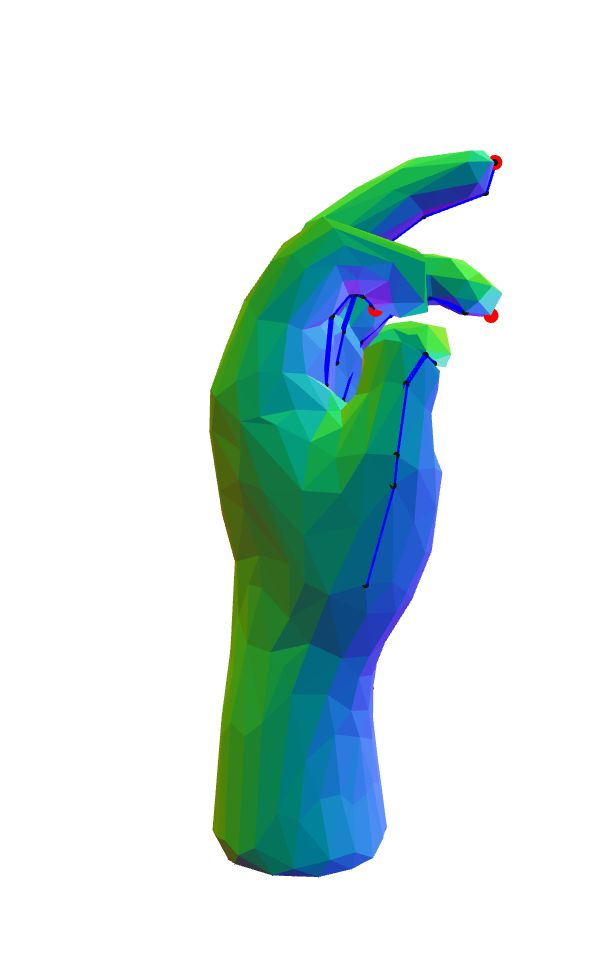

C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


[('ok', 0.6168825643396417),
 ('clinch', 0.6042404870562637),
 ('symbol', 0.5568148101804524),
 ('im', 0.5558775414452424),
 ('right', 0.5490784667959293),
 ('closest', 0.5476035426711672),
 ('pants', 0.5474777969147416),
 ('zero', 0.5455945610829568),
 ('people', 0.5414143384830495),
 ('gripping', 0.5388943251480678)]

In [73]:
row = test_data.sample(1).iloc[0] # randomly grab a row

#display the corresponding image
img_path = '../data/screenshots-jpg/pic{}{}.jpg'.format(row.poseID, row.camera_angle)
print(row.desc_str)
print(img_path)
display(Image(img_path, width=150, height=150))

# see what wac classifiers fit the features, rank them
wac_probs = []
raw_model = wacs_model.model
for w in raw_model.keys():
    p = eval_sample(raw_model[w], row, wacs_model.model_type)
    wac_probs.append((w,p))
wac_probs.sort(key=operator.itemgetter(1))
wac_probs.reverse()

wac_probs[:10]


## Analysis 2: Given word, pick images

WORD: pointing


C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


fit 0.6541755784228378 
description:  reading with aid of your pointer finger


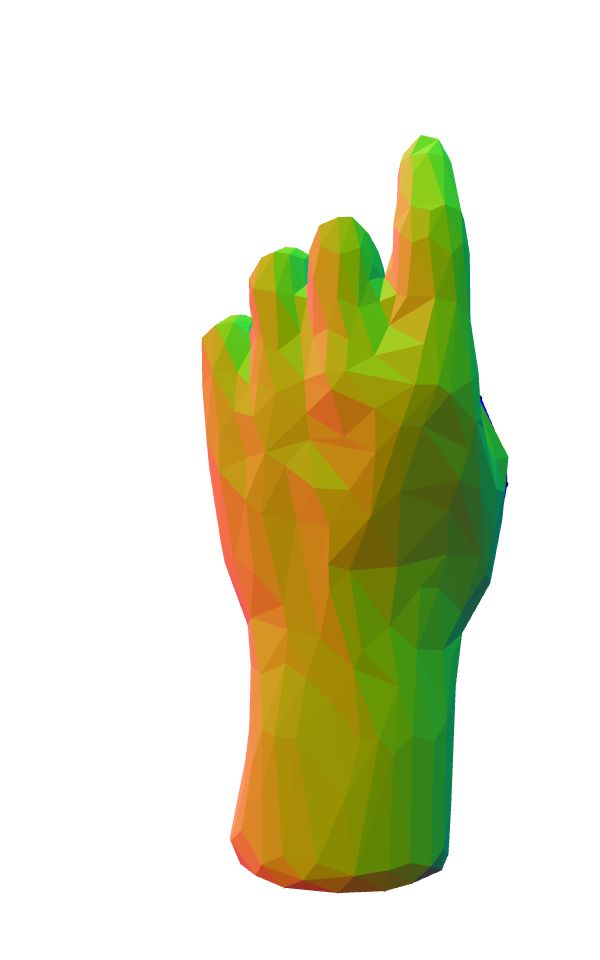

fit 0.5708995852474211 
description:  having a question


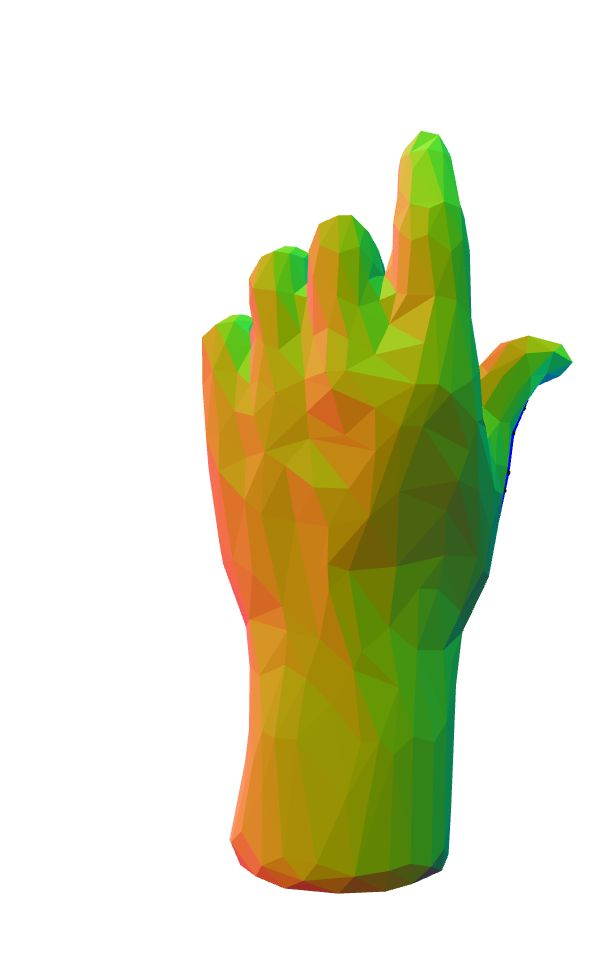

fit 0.56288389620041 
description:  index and thumb pinch


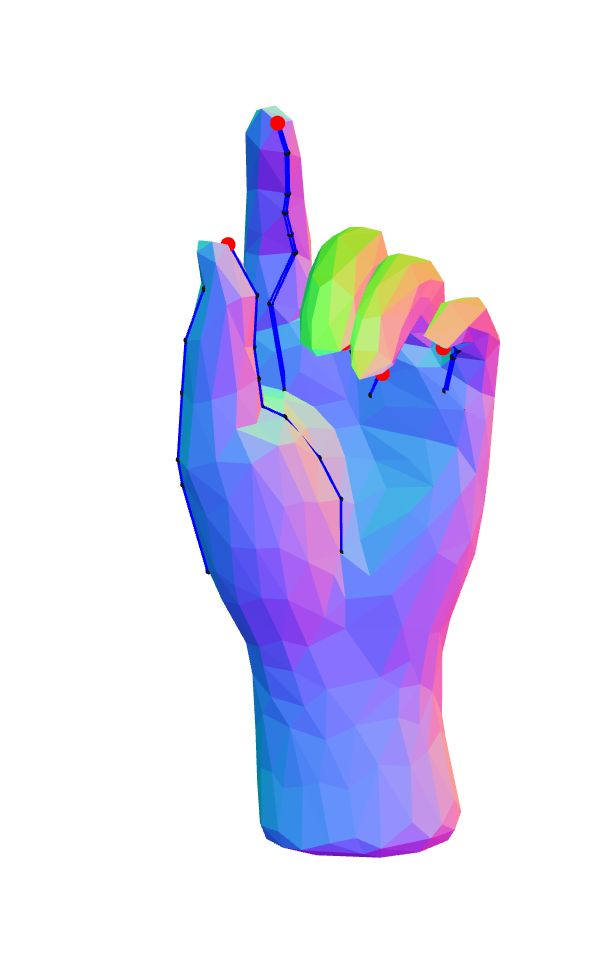

fit 0.5553465298283999 
description:  making a point


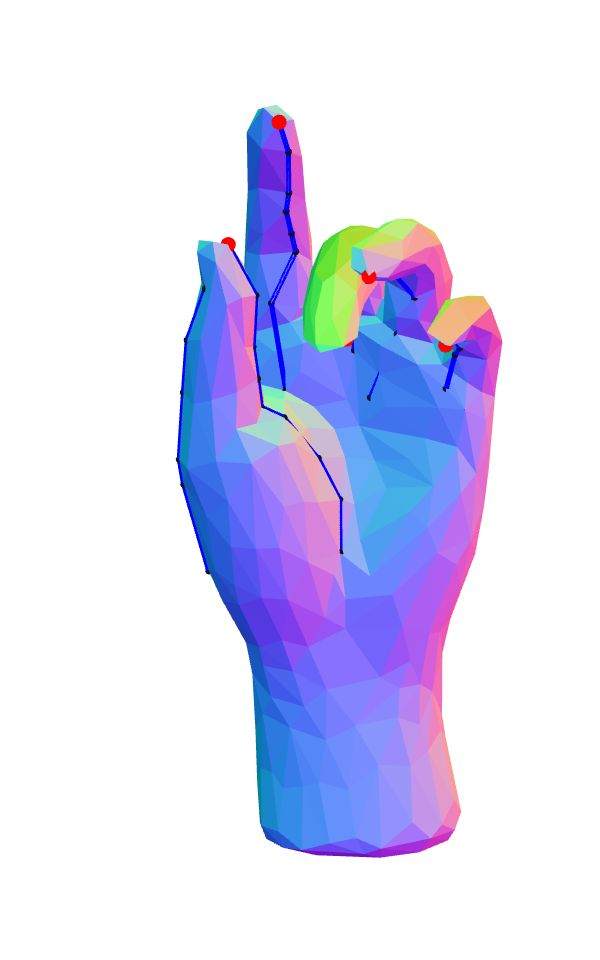

fit 0.5395301426336742 
description:  fingers bent down progressive nts with the index finger extended most and others less


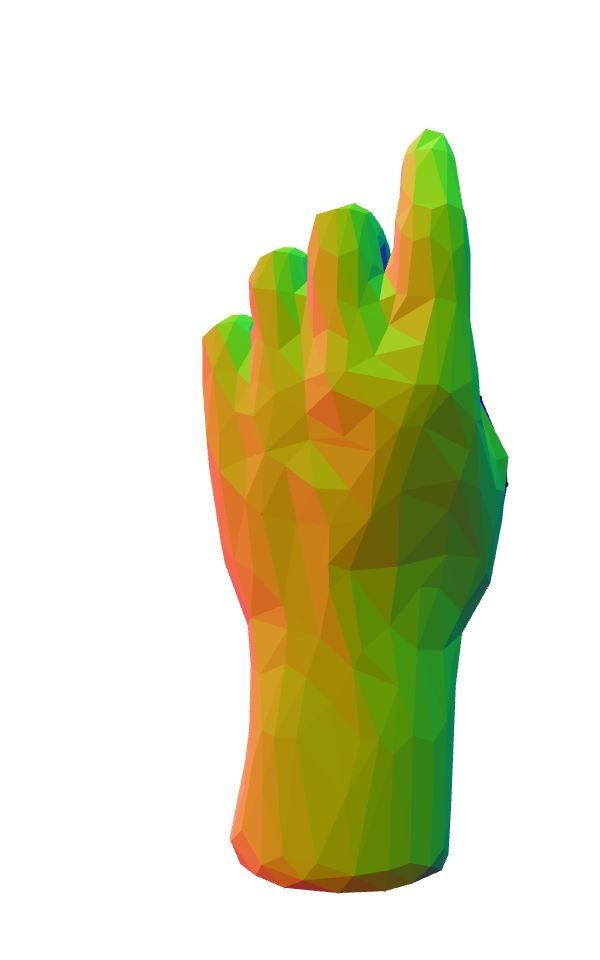

In [70]:
word = "pointing" 
num_examples = 5
print("WORD:", word)

image_probs = list()
for index, row in test_data.iterrows(): #train_data_unstacked or test_data
    img_path = '../data/screenshots-jpg/pic{}{}.jpg'.format(row.poseID, row.camera_angle)
    p = eval_sample(wacs_model.model[word], row, wacs_model.model_type)
    image_probs.append((img_path, p, row.desc_str))
image_probs.sort(key=operator.itemgetter(1))
image_probs.reverse()

#display top images
for i in range(0, num_examples):
    print("fit", image_probs[i][1], "\ndescription: ", image_probs[i][2])
    display(Image(image_probs[i][0], width=150, height=150 ))

## Analysis 3: overlay images

WORD: basketball 
TOP 100


C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


'ABOVE VIEW'

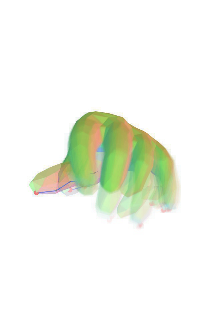

'BEHIND VIEW'

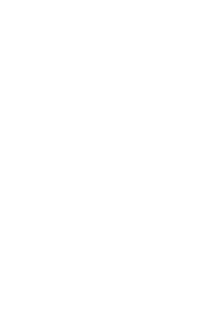

'LEFT VIEW'

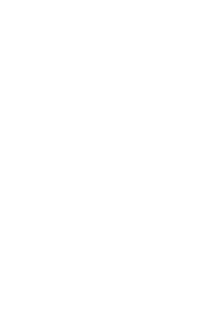

'STRAIGHT ON VIEW'

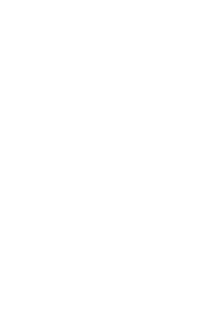

In [78]:
word = "basketball" 
num_examples = 100
size = (200, 320) #(600, 960) (300, 480) (200, 320)

print("WORD:", word, "\nTOP", num_examples)

image_probs = list()
for index, row in train_data_unstacked.iterrows(): #train_data_unstacked or test_data
    img_path = '../data/screenshots-jpg/pic{}{}.jpg'.format(row.poseID, row.camera_angle)
    p = eval_sample(wacs_model.model[word], row, wacs_model.model_type)
    image_probs.append((img_path, p, row.desc_str, row.camera_angle))
image_probs.sort(key=operator.itemgetter(1))
image_probs.reverse()


final_image_above = img.new('RGB', size, "white")
final_image_behind = img.new('RGB', size, "white")
final_image_left = img.new('RGB', size, "white")
final_image_straighton = img.new('RGB', size, "white")

for i in range(0, num_examples):
    newimg = img.open(image_probs[i][0])
    newimg= newimg.resize(size)
    if image_probs[i][3] == "above":
        final_image_above = img.blend(final_image_above, newimg, 1.0/num_examples)
    if image_probs[i][3] == "behind":
        final_image_behind = img.blend(final_image_behind, newimg, 1.0/num_examples)
    if image_probs[i][3] == "left":
        final_image_left = img.blend(final_image_left, newimg, 1.0/num_examples)
    if image_probs[i][3] == "straight_on":
        final_image_straighton = img.blend(final_image_straighton, newimg, 1.0/num_examples)

display("ABOVE VIEW", final_image_above, "BEHIND VIEW", final_image_behind, 
        "LEFT VIEW", final_image_left, "STRAIGHT ON VIEW", final_image_straighton)

## Analysis 4: Given *combination* of words, find image

WORDS: ['point', 'up']


C:\Users\morod\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


'ABOVE VIEW'

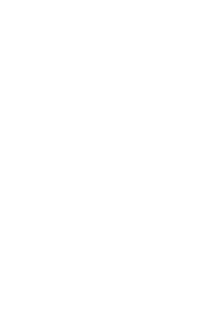

'BEHIND VIEW'

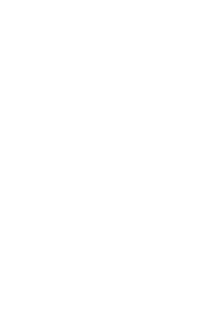

'LEFT VIEW'

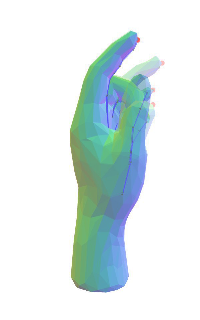

'STRAIGHT ON VIEW'

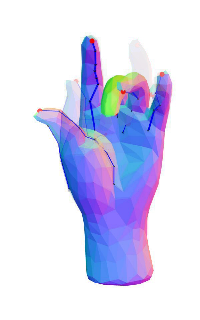

In [85]:
input = "point up"
num_examples = 20
num_blends = 5
size = (200, 320) #(600, 960) (300, 480) (200, 320)

words = input.split()
print("WORDS:", words)

train_test_data = train_data_unstacked.append(test_data)

image_probs = list()
for index, row in train_test_data.iterrows(): #train_data_unstacked or test_data
    img_path = '../data/screenshots-jpg/pic{}{}.jpg'.format(row.poseID, row.camera_angle)
    p = compose(words, row, wacs_model)
    image_probs.append((img_path, p, row.desc_str, row.camera_angle))
image_probs.sort(key=operator.itemgetter(1))
image_probs.reverse()
    
final_image_above = img.new('RGB', size, "white")
final_image_behind = img.new('RGB', size, "white")
final_image_left = img.new('RGB', size, "white")
final_image_straighton = img.new('RGB', size, "white")

for i in range(0, num_examples):
    for j in range(0, num_blends):
        newimg = img.open(image_probs[i][0])
        newimg= newimg.resize(size)
        if image_probs[i][3] == "above":
            final_image_above = img.blend(final_image_above, newimg, 1.0/num_examples)
        if image_probs[i][3] == "behind":
            final_image_behind = img.blend(final_image_behind, newimg, 1.0/num_examples)
        if image_probs[i][3] == "left":
            final_image_left = img.blend(final_image_left, newimg, 1.0/num_examples)
        if image_probs[i][3] == "straight_on":
            final_image_straighton = img.blend(final_image_straighton, newimg, 1.0/num_examples)

display("ABOVE VIEW", final_image_above, "BEHIND VIEW", final_image_behind, 
        "LEFT VIEW", final_image_left, "STRAIGHT ON VIEW", final_image_straighton)

## Analysis 5: More of a tool; find description of image easily

'188straight_on'

'palm facing forward index finger pointing up'

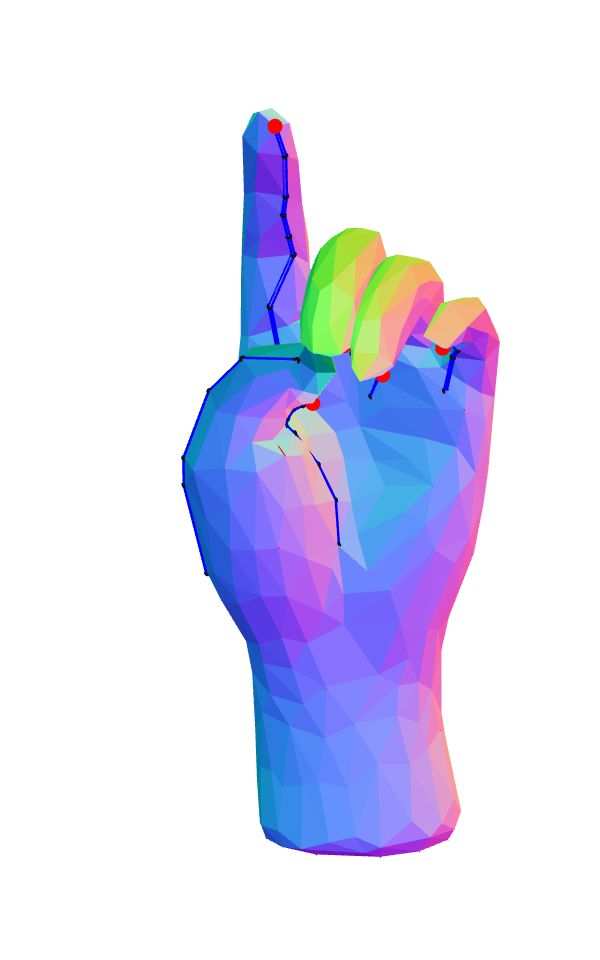

'188straight_on'

'pointing finger up number one signing'

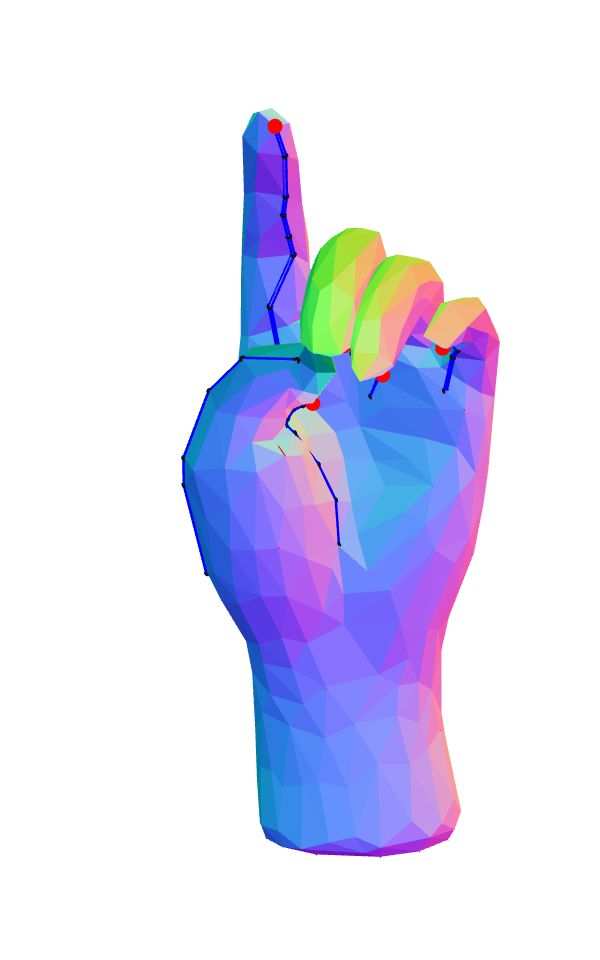

In [87]:
imagename = '188straight_on'

for index, row in train_test_data.iterrows(): #train_data_unstacked or test_data
    if(imagename == "{}{}".format(row.poseID, row.camera_angle)):
        img_path = '../data/screenshots-jpg/pic{}{}.jpg'.format(row.poseID, row.camera_angle)
        display(imagename, row.desc_str, Image(img_path, width=150, height=150 ))


## Analysis 6: Word frequency

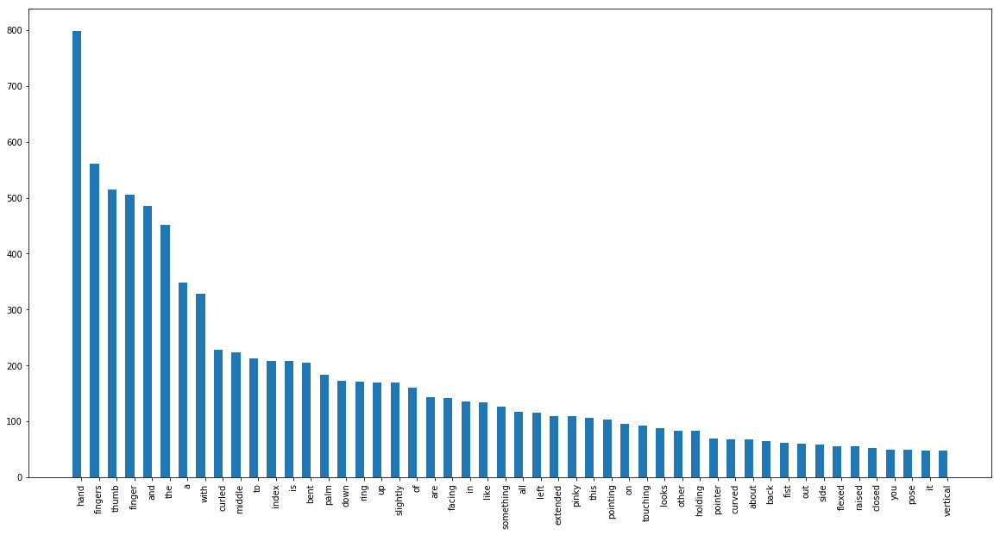

In [90]:
import matplotlib.pyplot as plt
data, words, vocab = read_raw_data ()
ctr = Counter(words)
sorted_ctr = sorted(ctr.items(), key=operator.itemgetter(1))
sorted_ctr.reverse()
sorted_ctr_short = sorted_ctr[:50] # just show the top 50 counts
labels, values = zip(*sorted_ctr_short)

indexes = np.arange(len(labels))
width = 0.5

plt.figure(figsize=(20,10))
plt.bar(indexes, values, width)
plt.xticks(indexes + width * 0.5, labels, rotation='vertical')
plt.show()


In [91]:
#get words of this frequency
freq = 1
selected = list()
for curr in sorted_ctr:
    if curr[1] == freq: selected.append(curr) 
        
selected

[('evenly', 1),
 ('money', 1),
 ('bicycle', 1),
 ('respect', 1),
 ('thub', 1),
 ('pam', 1),
 ('thumpsideup', 1),
 ('thumk', 1),
 ('cat', 1),
 ('clawed', 1),
 ('tuning', 1),
 ('height', 1),
 ('angled', 1),
 ('figers', 1),
 ('holder', 1),
 ('hiding', 1),
 ('lemon', 1),
 ('discretely', 1),
 ('infamous', 1),
 ('climbing', 1),
 ('adjacent', 1),
 ('handall', 1),
 ('walker', 1),
 ('nail', 1),
 ('pleasing', 1),
 ('lifted', 1),
 ('accident', 1),
 ('broken', 1),
 ('aln', 1),
 ('punching', 1),
 ('longer', 1),
 ('seconds', 1),
 ('thumband', 1),
 ('g', 1),
 ('ciercle', 1),
 ('whats', 1),
 ('chari', 1),
 ('figure', 1),
 ('handing', 1),
 ('quotes', 1),
 ('base', 1),
 ('coast', 1),
 ('west', 1),
 ('ront', 1),
 ('posing', 1),
 ('swipe', 1),
 ('signing', 1),
 ('party', 1),
 ('indicates', 1),
 ('enclosed', 1),
 ('stretching', 1),
 ('questions', 1),
 ('waves', 1),
 ('asking', 1),
 ('orangegreen', 1),
 ('slanted', 1),
 ('happy', 1),
 ('thumbringpinky', 1),
 ('escalating', 1),
 ('quite', 1),
 ('peacesign', 

In [102]:
ctr["typing"]

9

### what pics does it get right? what does it confuse?

Pics that the model confused:
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
this hand is making a crown shape.
correct pic:


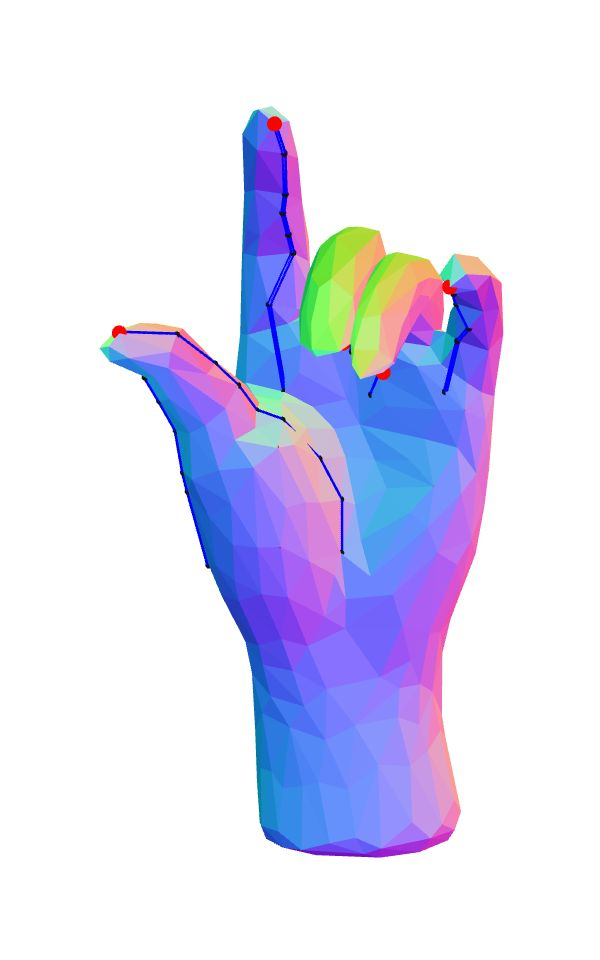

guessed pic:
fit: 1.0900619086590668


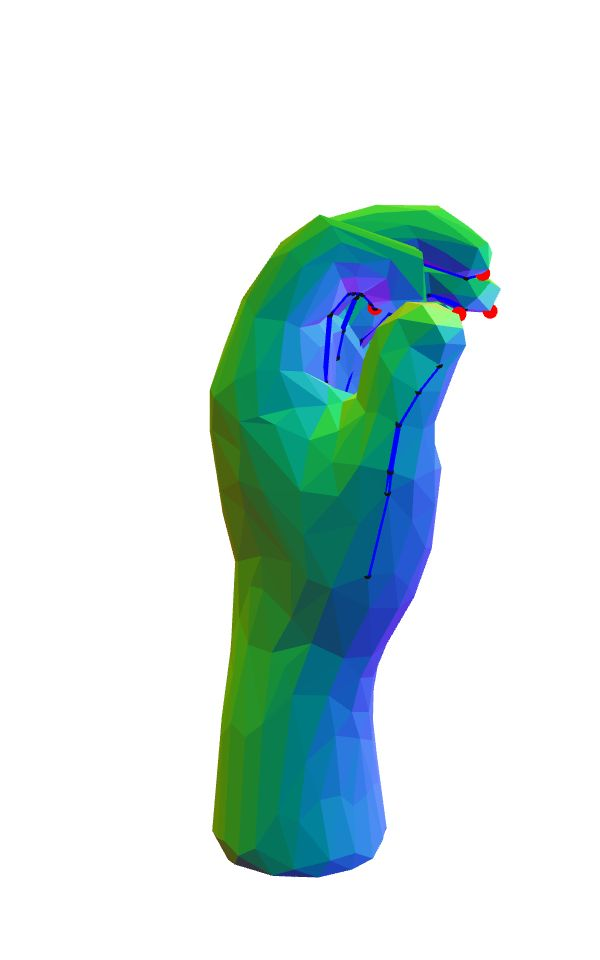

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
waving hi
correct pic:


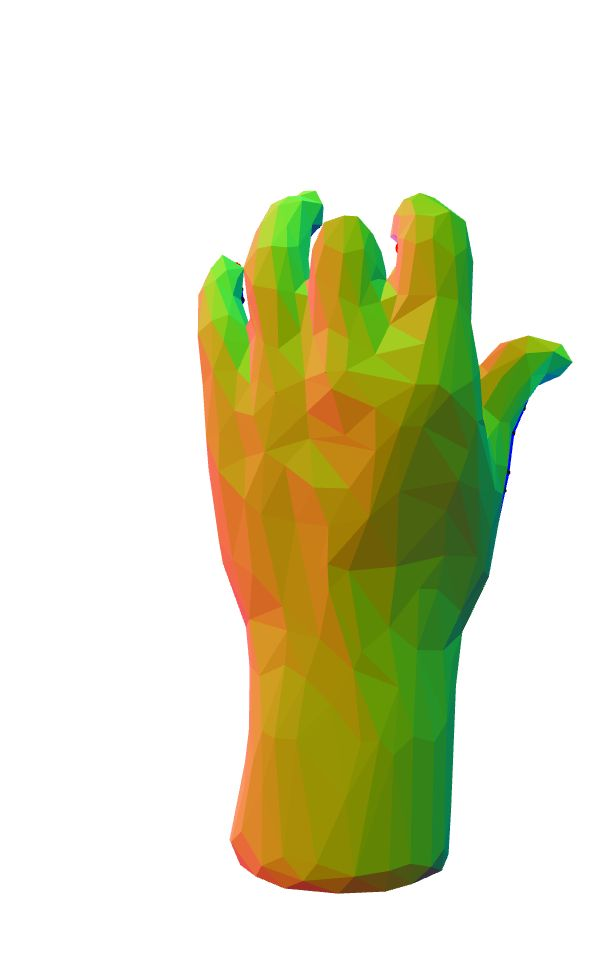

guessed pic:
fit: 0.8284362014792035


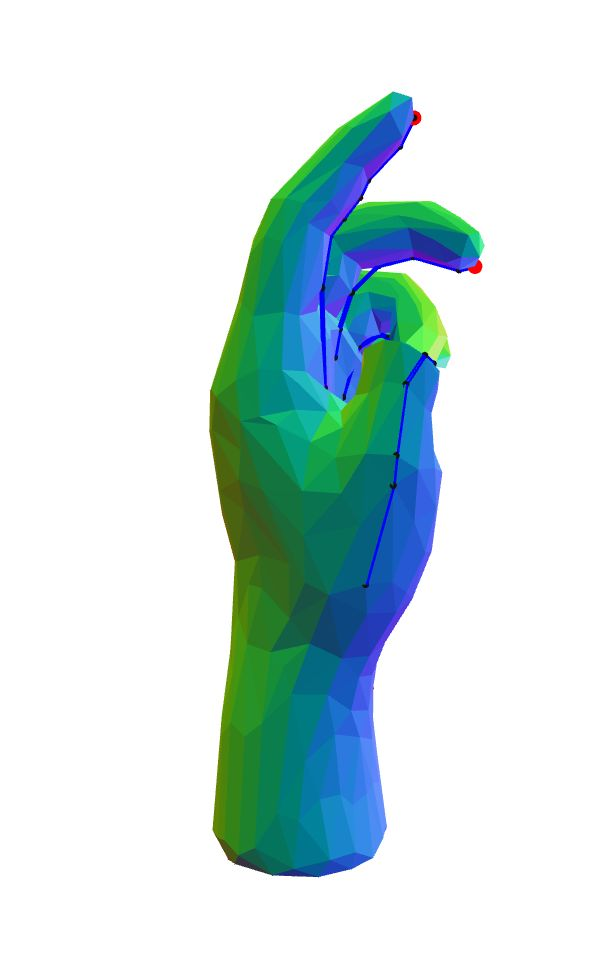

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
fingers curved down;index slightly more
correct pic:


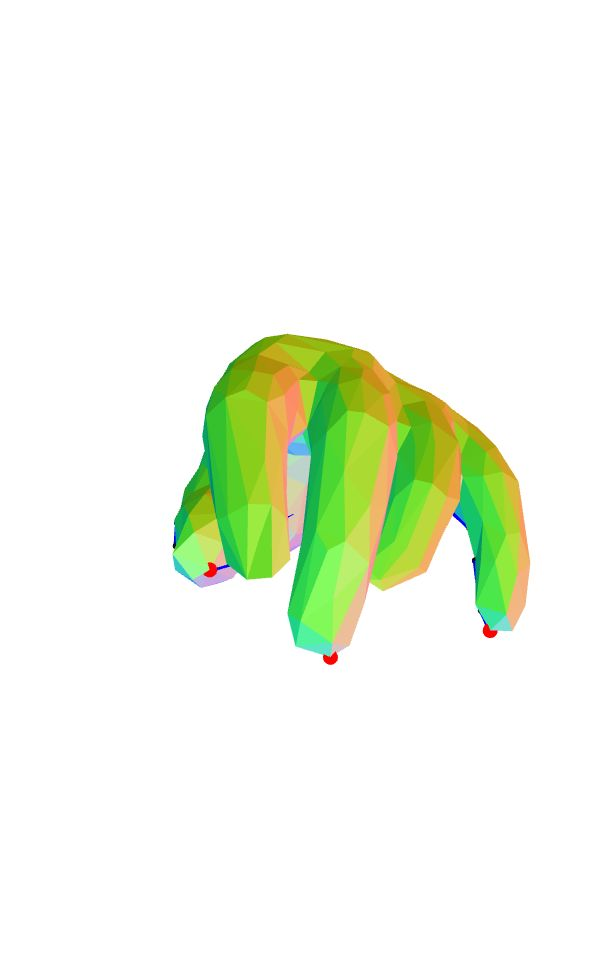

guessed pic:
fit: 1.2489764642607444


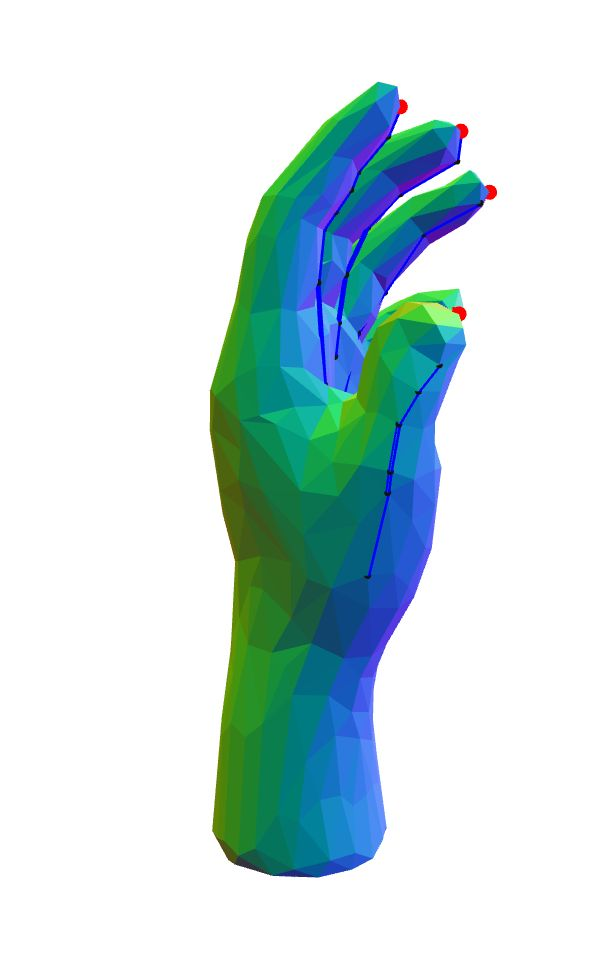

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
It looks like relaxed
correct pic:


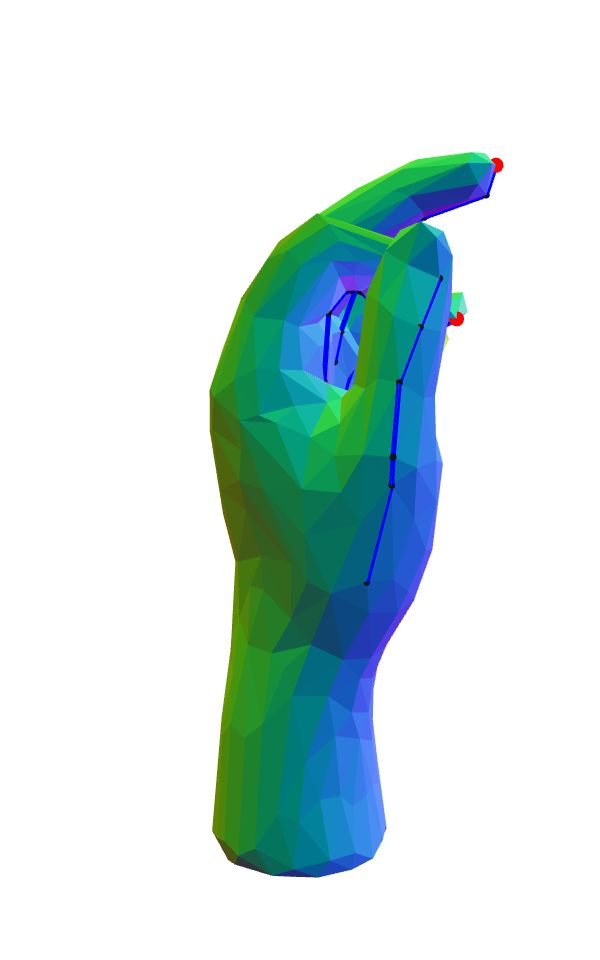

guessed pic:
fit: 1.5321126200581492


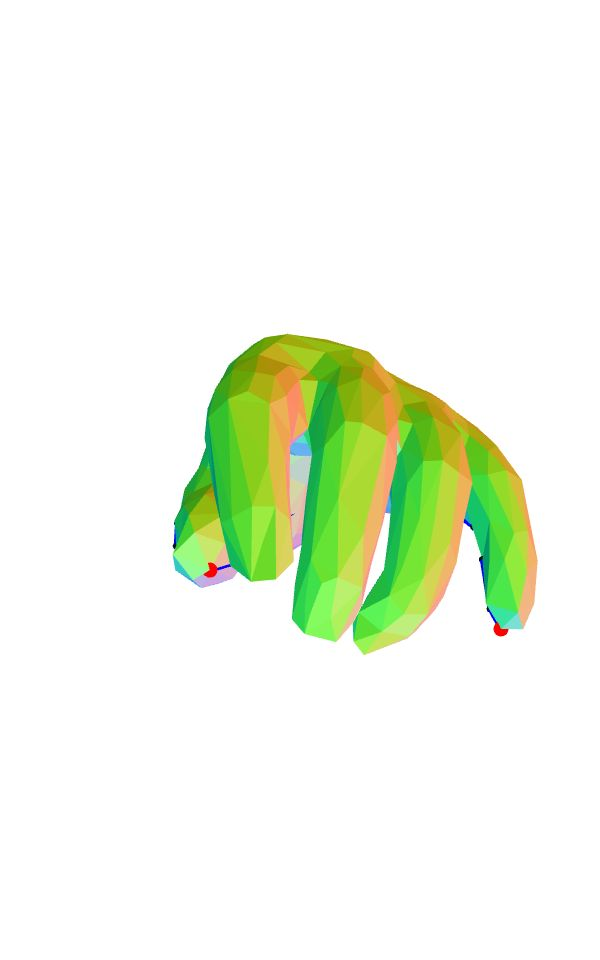

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
relaxed hand
correct pic:


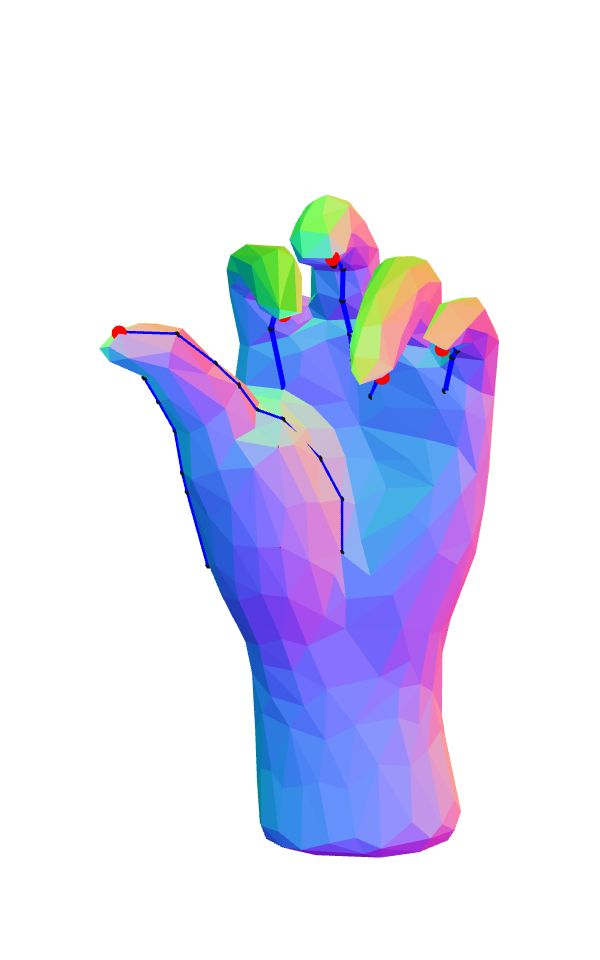

guessed pic:
fit: 0.23331895800727906


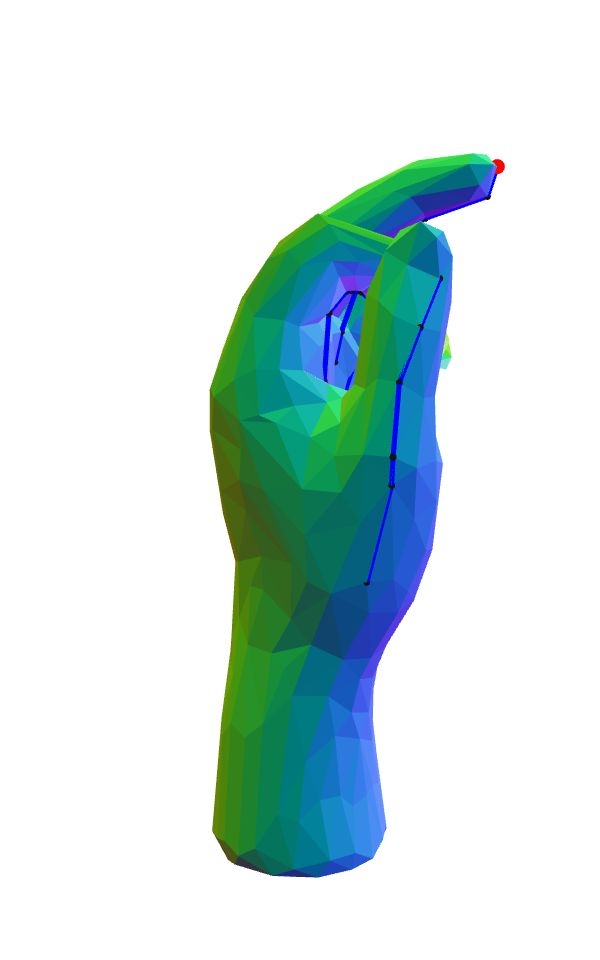

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
half & half
correct pic:


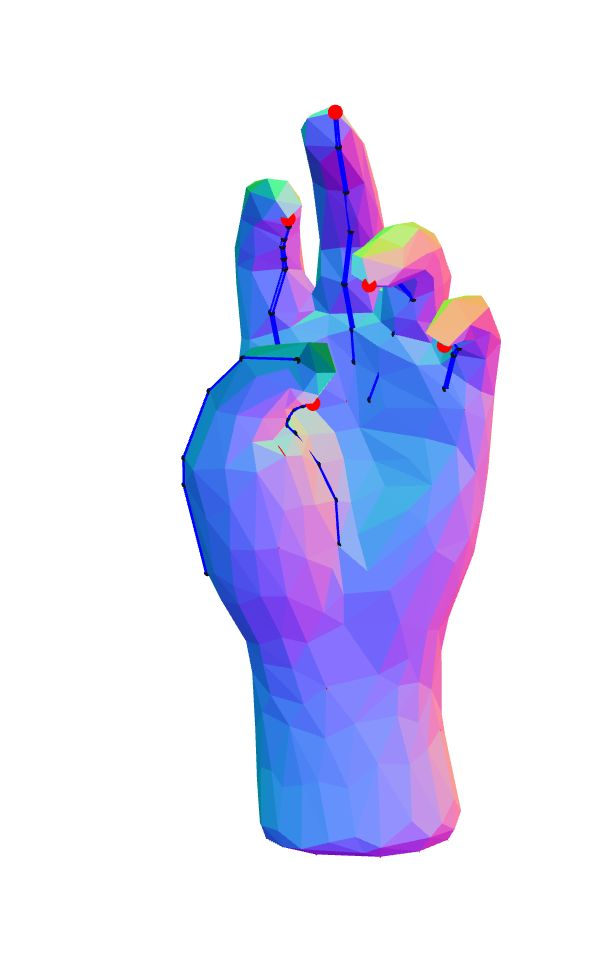

guessed pic:
fit: 0.620123984071895


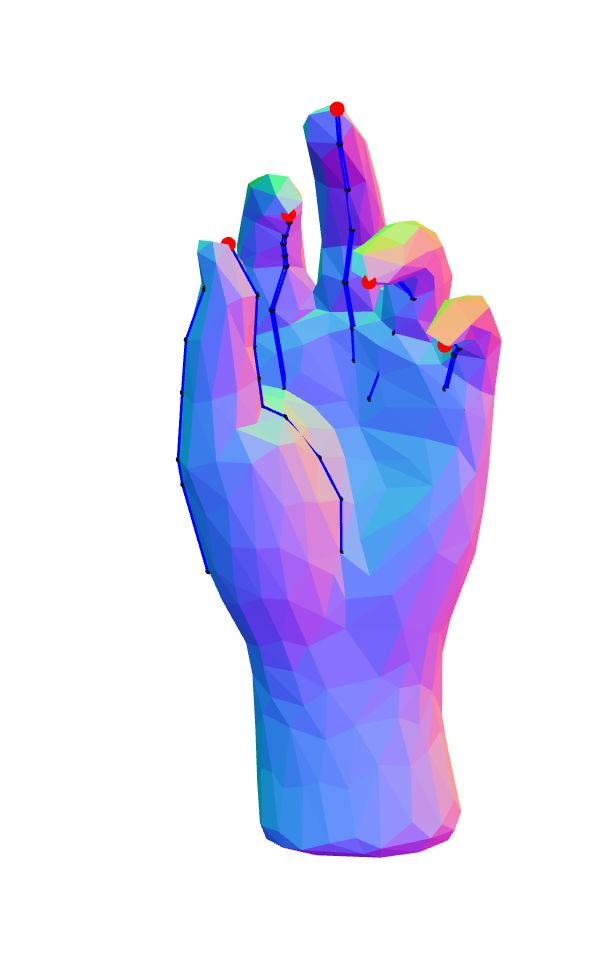

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
bent middle finger and pinky hand
correct pic:


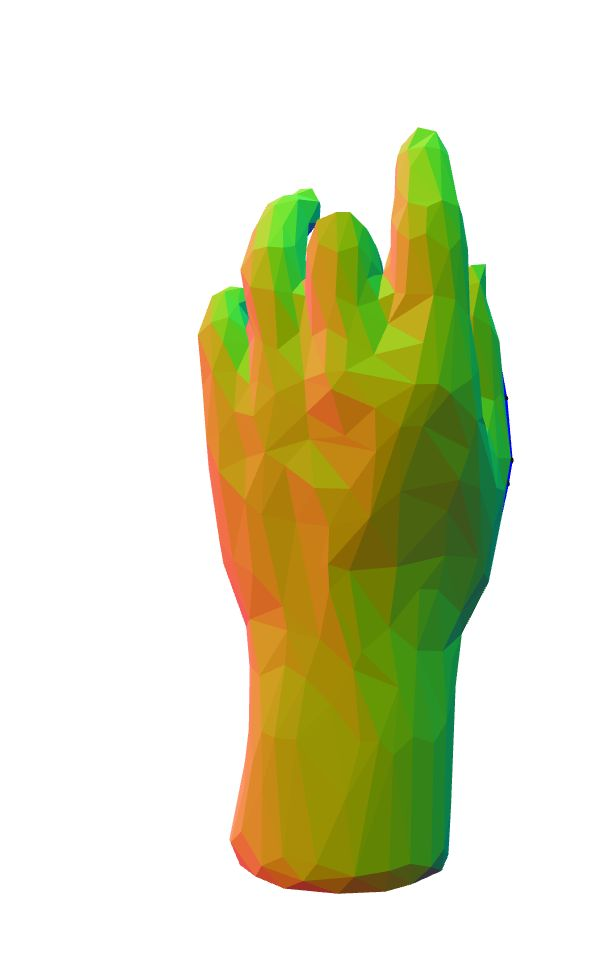

guessed pic:
fit: 1.339658530959246


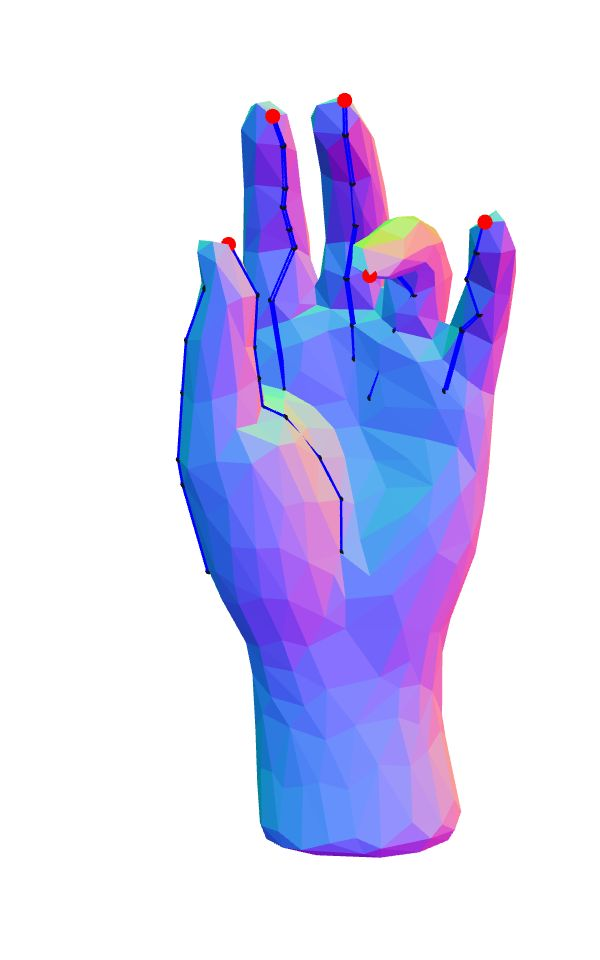

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand is closed with pinky sticking outward.
correct pic:


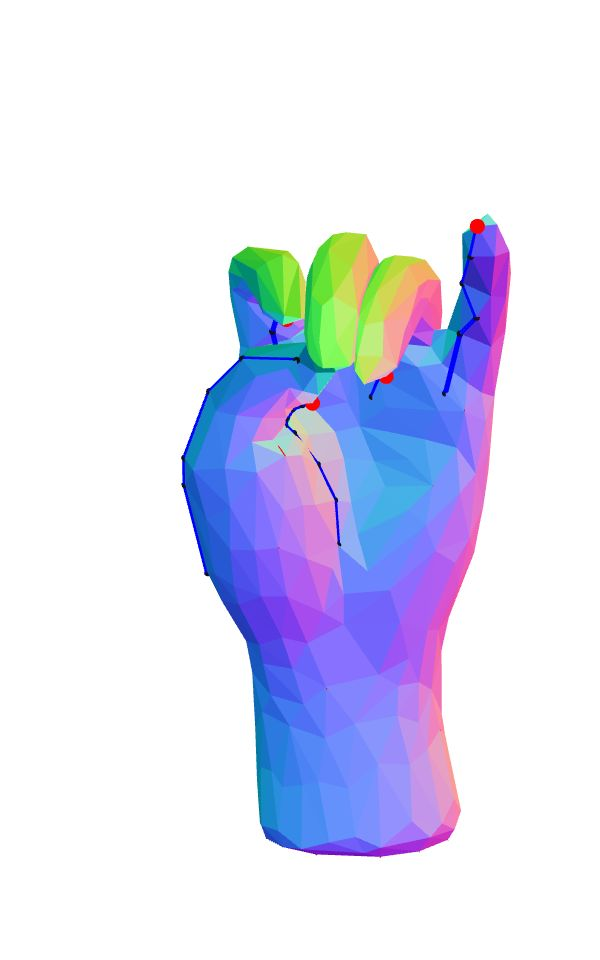

guessed pic:
fit: 1.1208520941671205


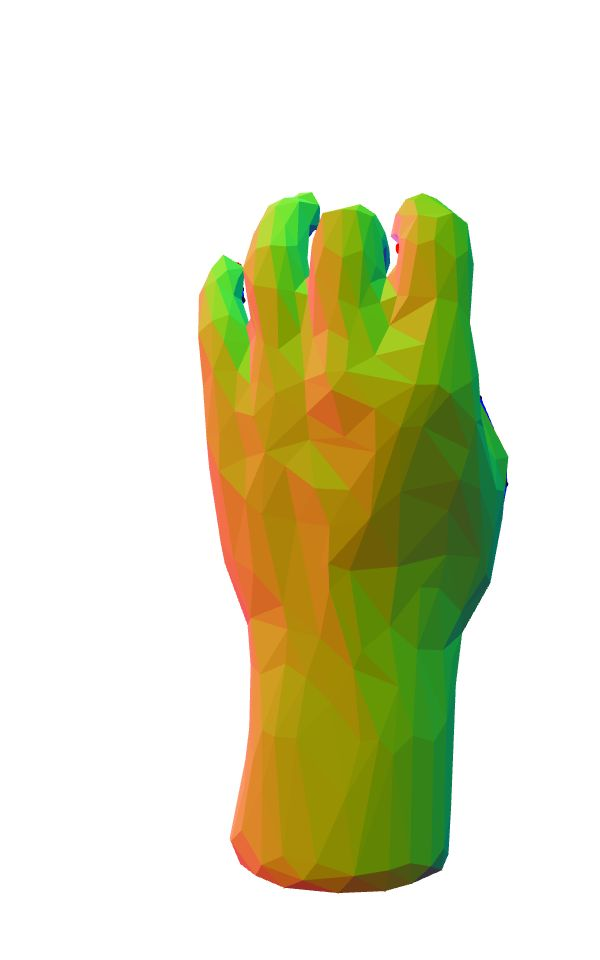

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Holding something
correct pic:


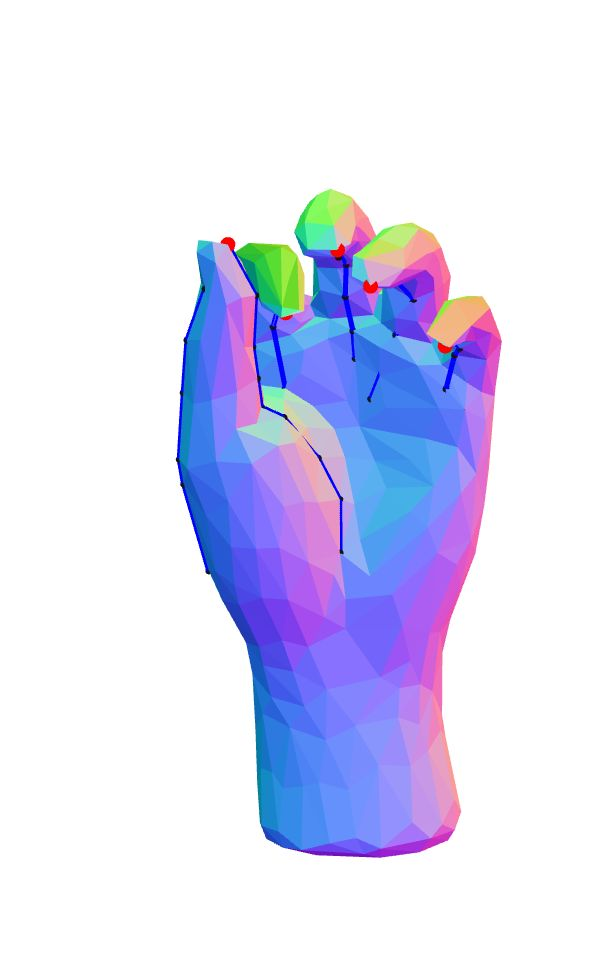

guessed pic:
fit: 0.6120752049495711


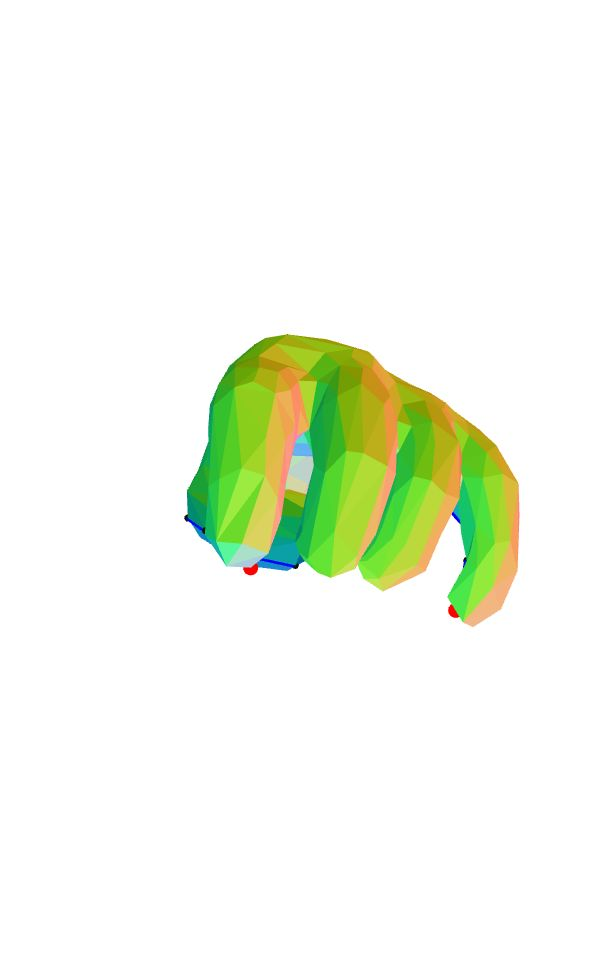

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
on point
correct pic:


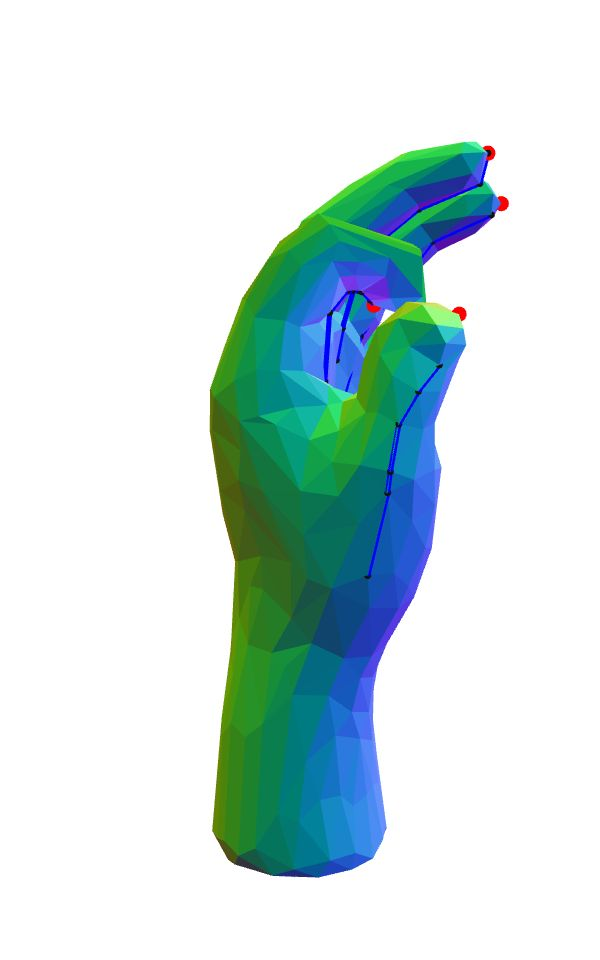

guessed pic:
fit: 0.5476291286560349


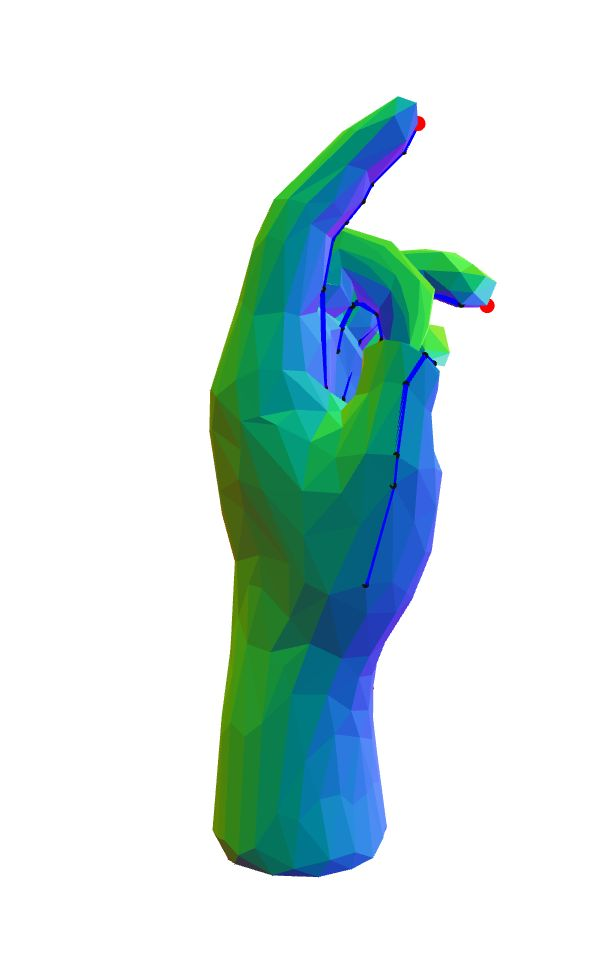

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
1/5th closing of middle finger
correct pic:


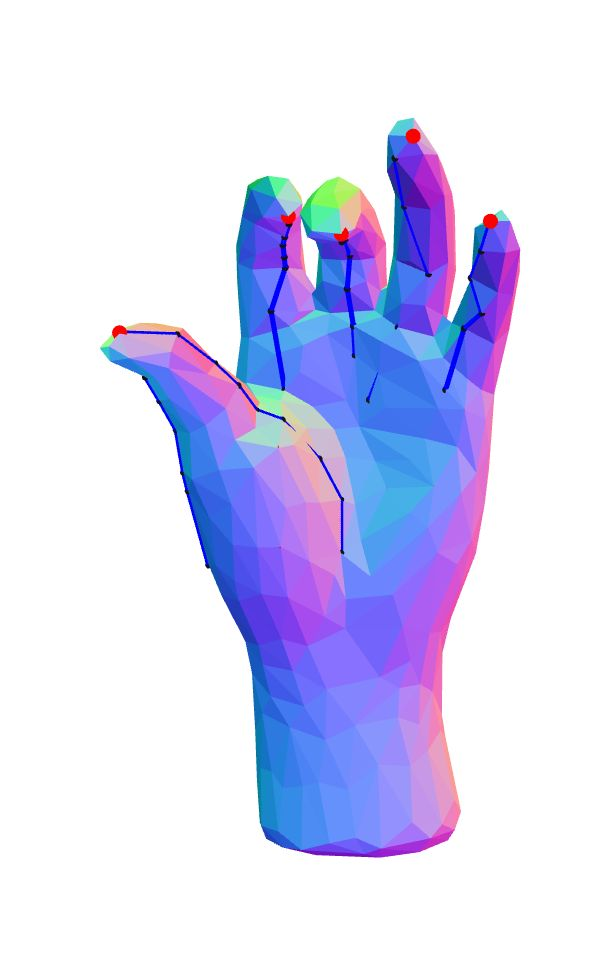

guessed pic:
fit: 1.074282895041819


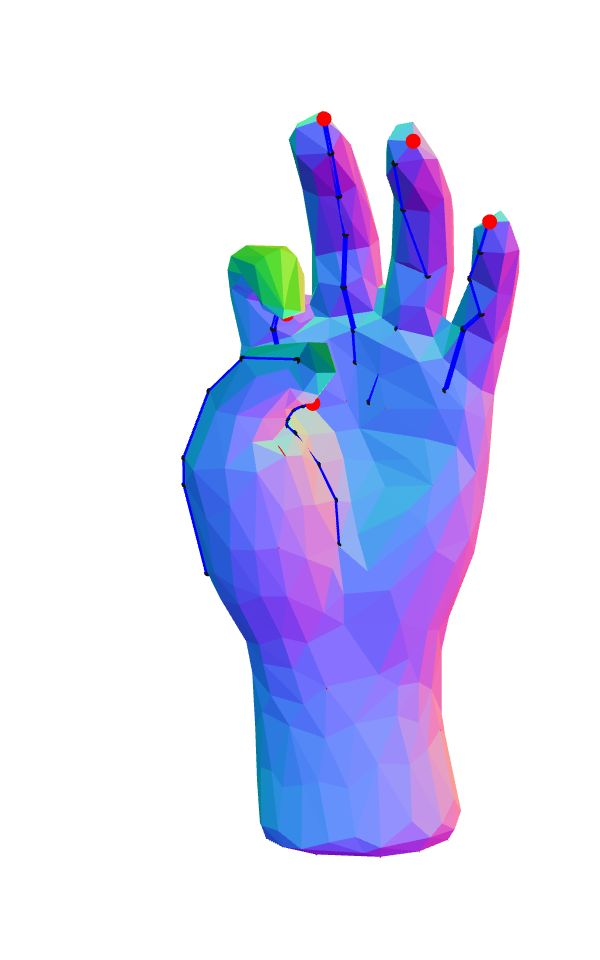

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
gripping
correct pic:


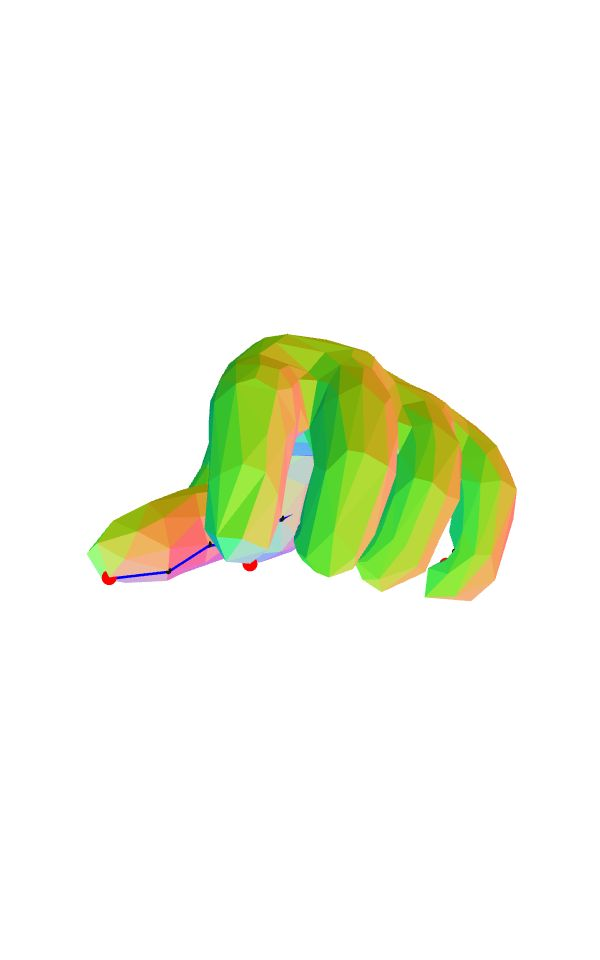

guessed pic:
fit: 0.3679445778129526


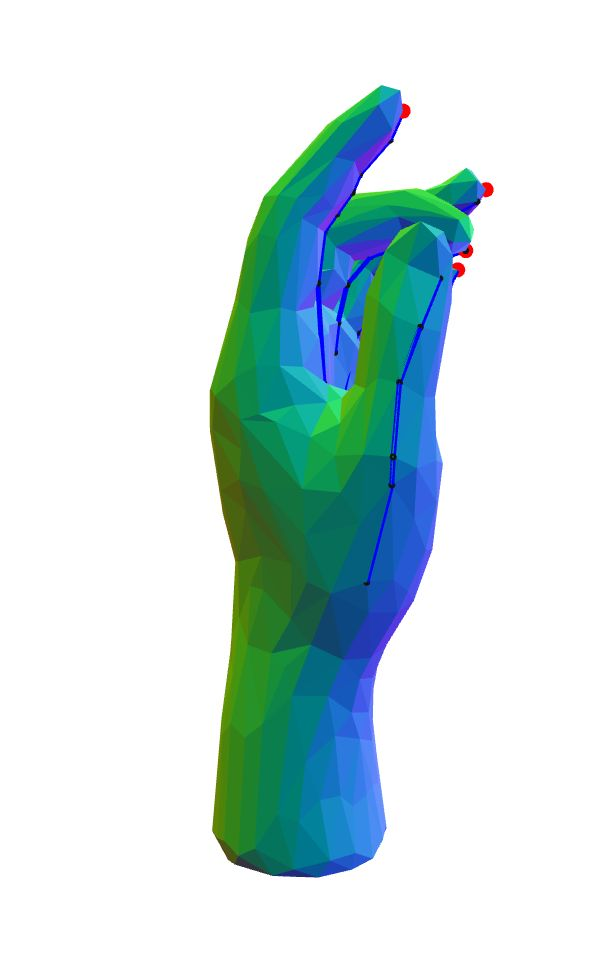

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Closed fist
correct pic:


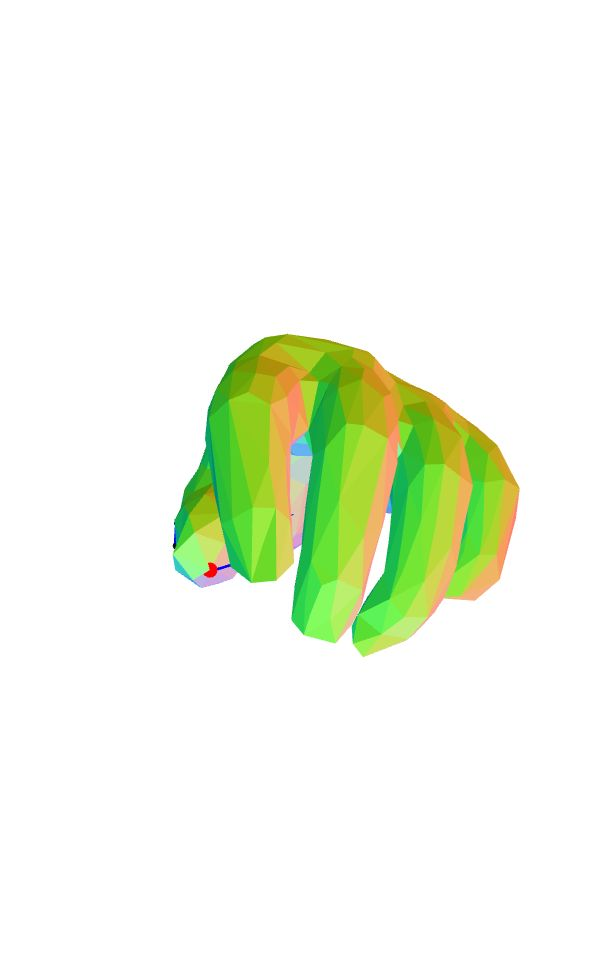

guessed pic:
fit: 0.4931936584867397


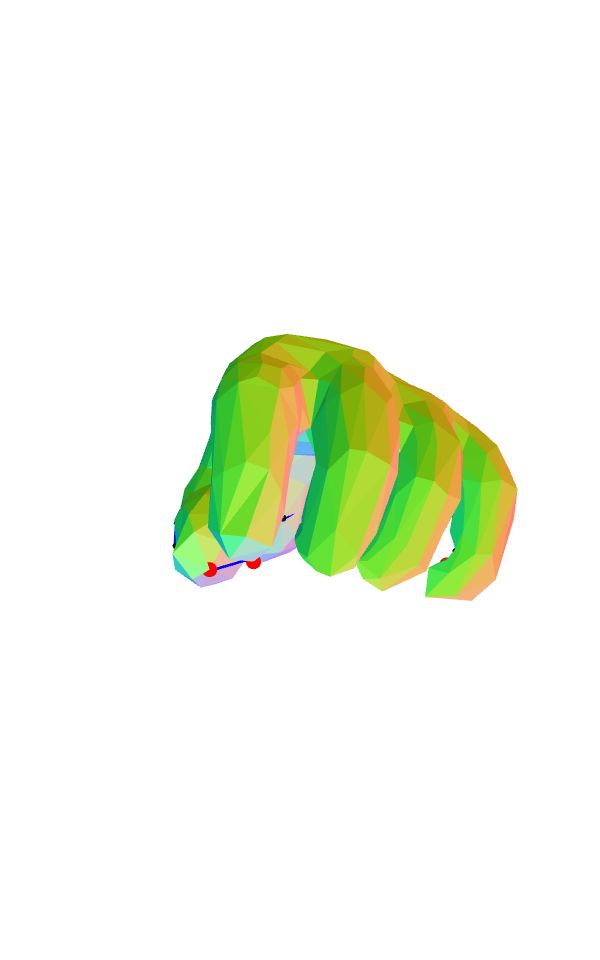

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
This pose is something negative
correct pic:


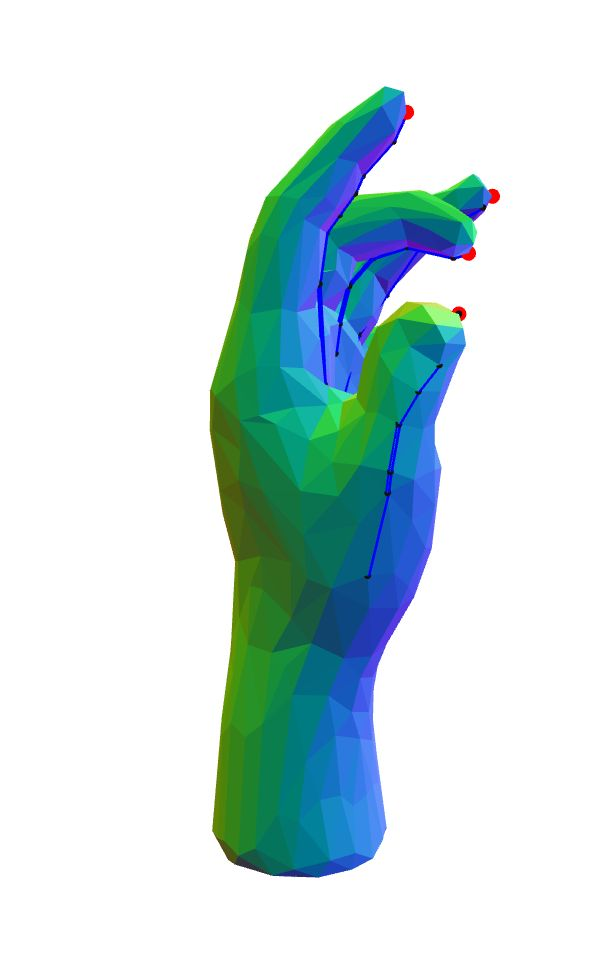

guessed pic:
fit: 0.783470388559977


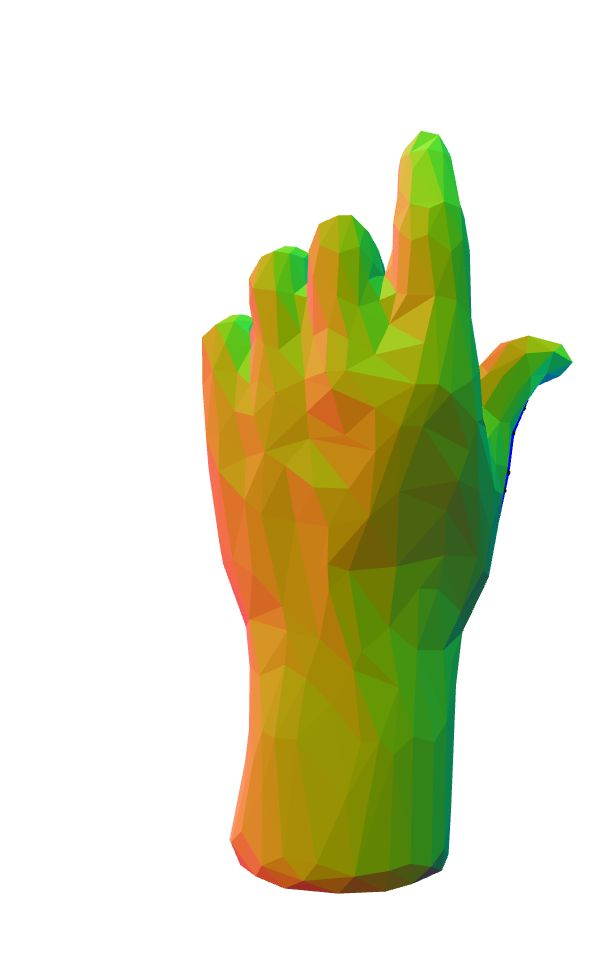

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
looks like playing instrument veena
correct pic:


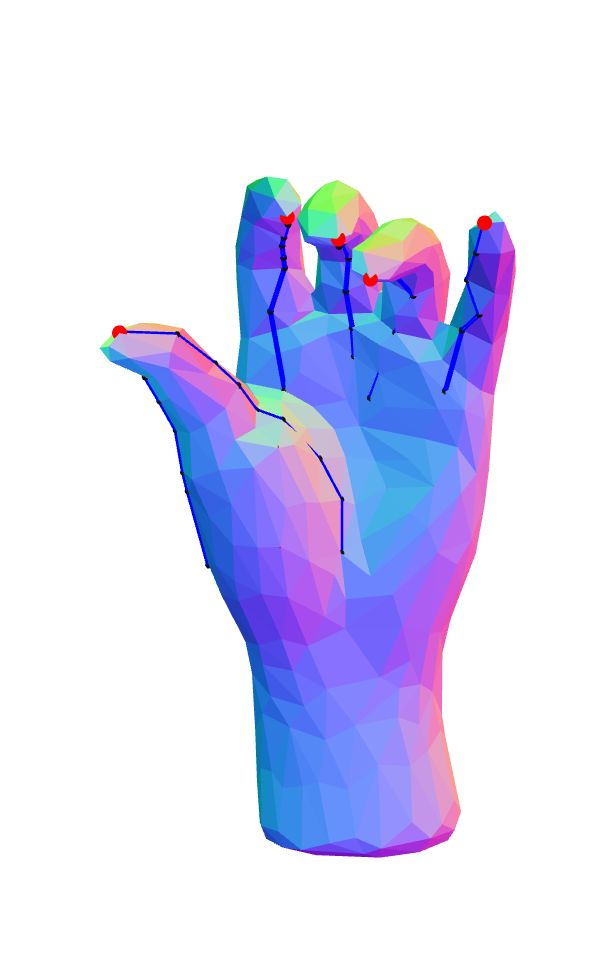

guessed pic:
fit: 1.5290998673315752


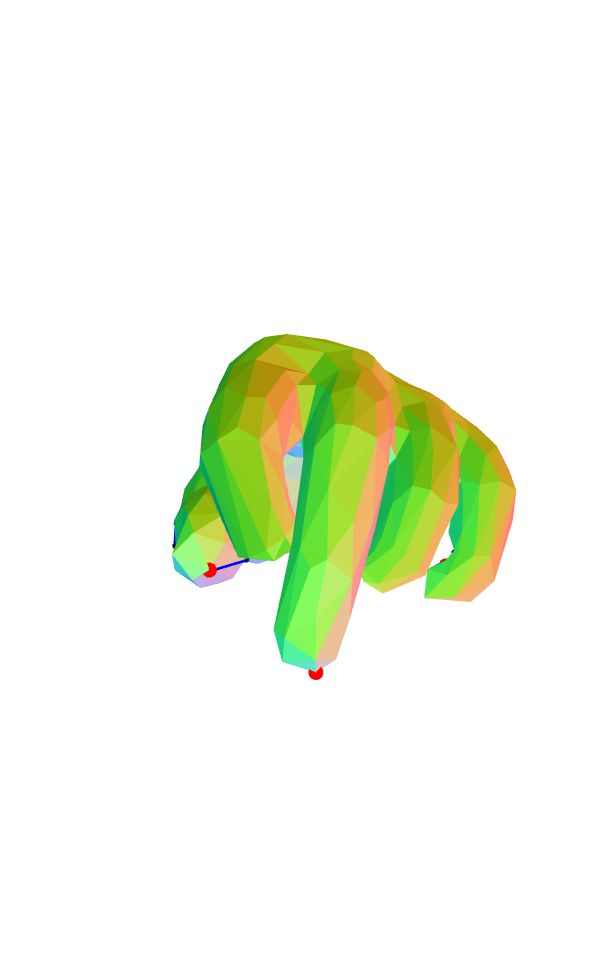

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
All fingers except the index and the thumb are bent
correct pic:


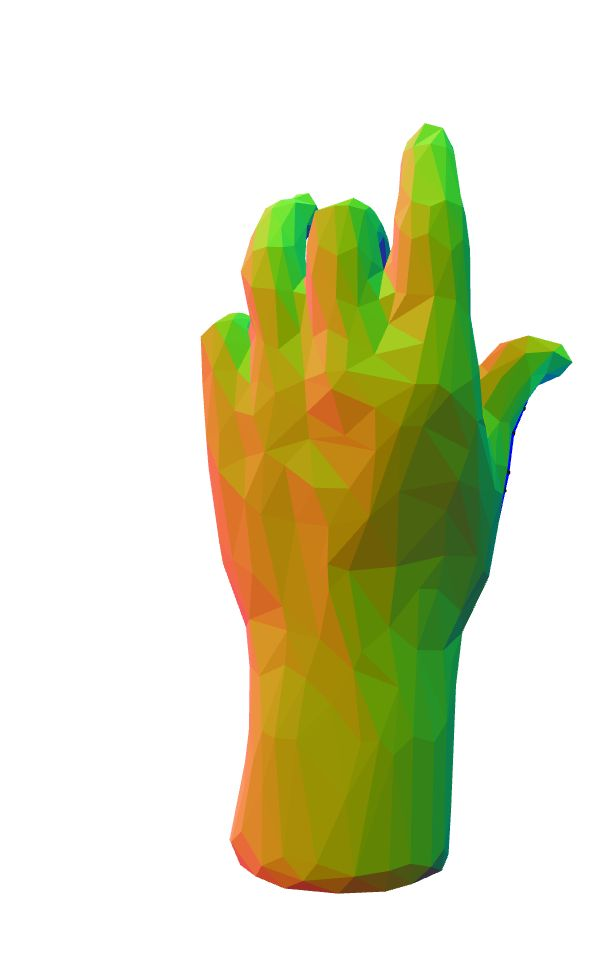

guessed pic:
fit: 1.1476974533418423


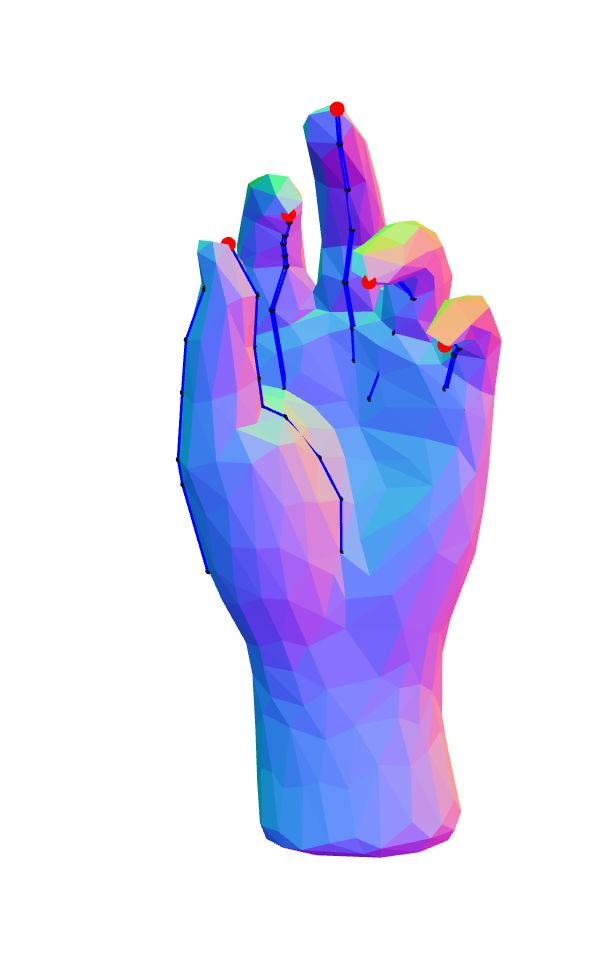

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
ok sign
correct pic:


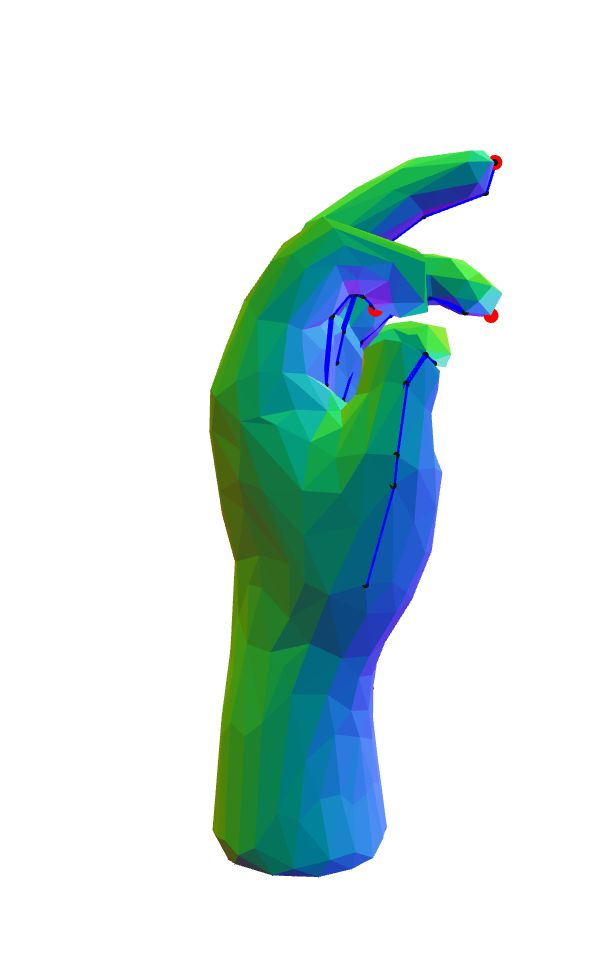

guessed pic:
fit: 0.9042870508789889


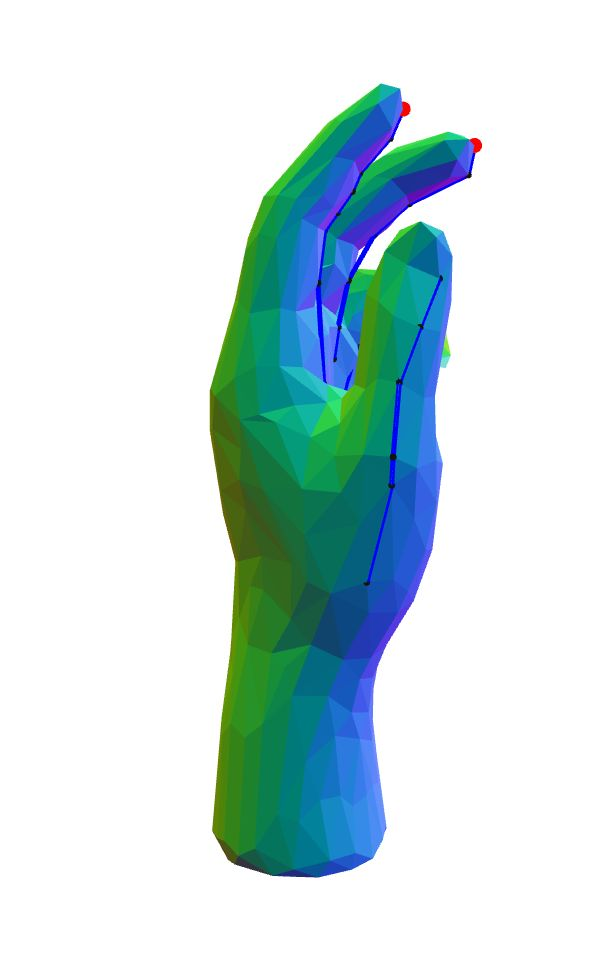

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
All fingers are bend down
correct pic:


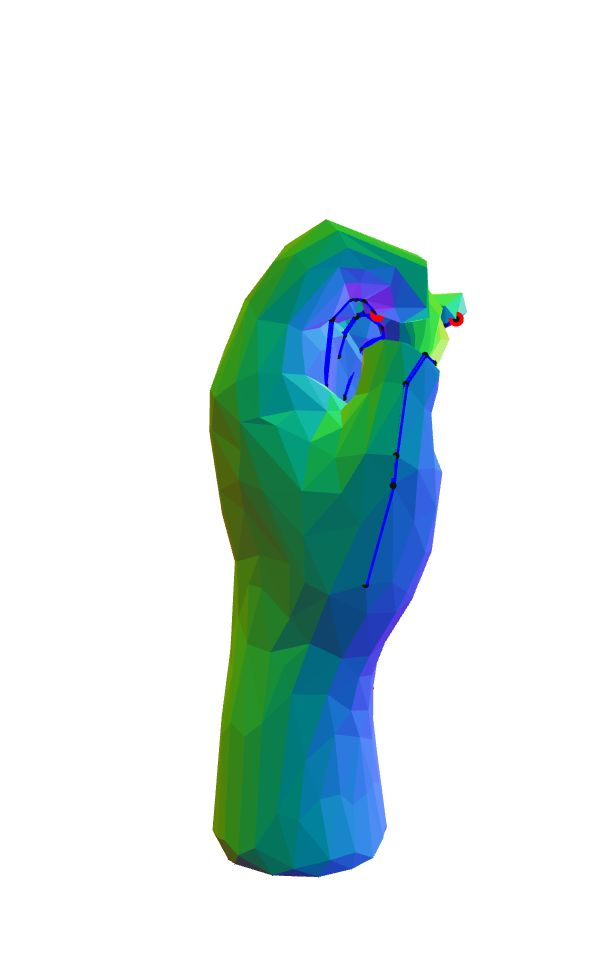

guessed pic:
fit: 0.972807814675835


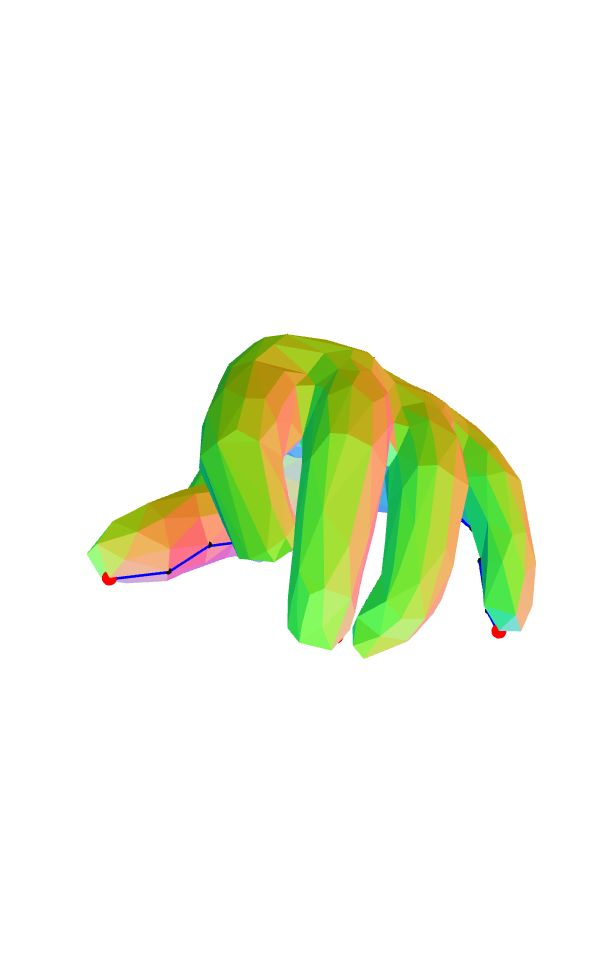

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Impatient - a gesture that resembles someone tapping their fingers impatiently.
correct pic:


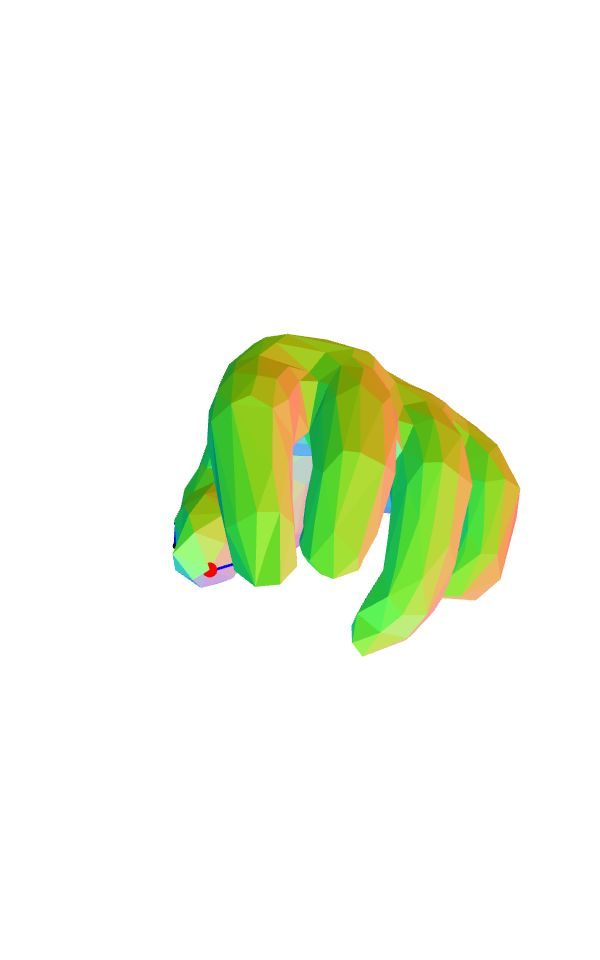

guessed pic:
fit: 2.1339007753580765


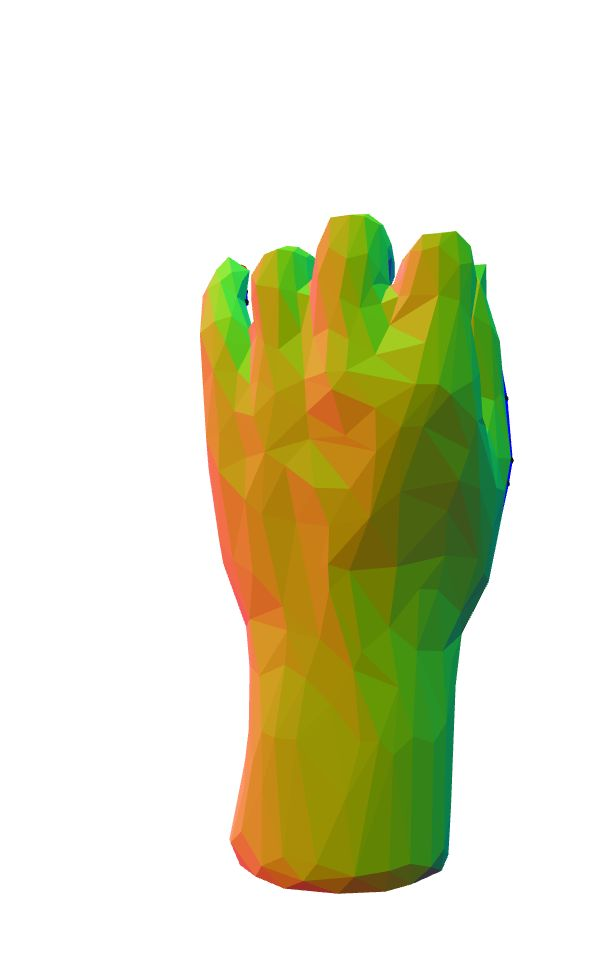

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand shaping a L with thumb and pointer facing straight
correct pic:


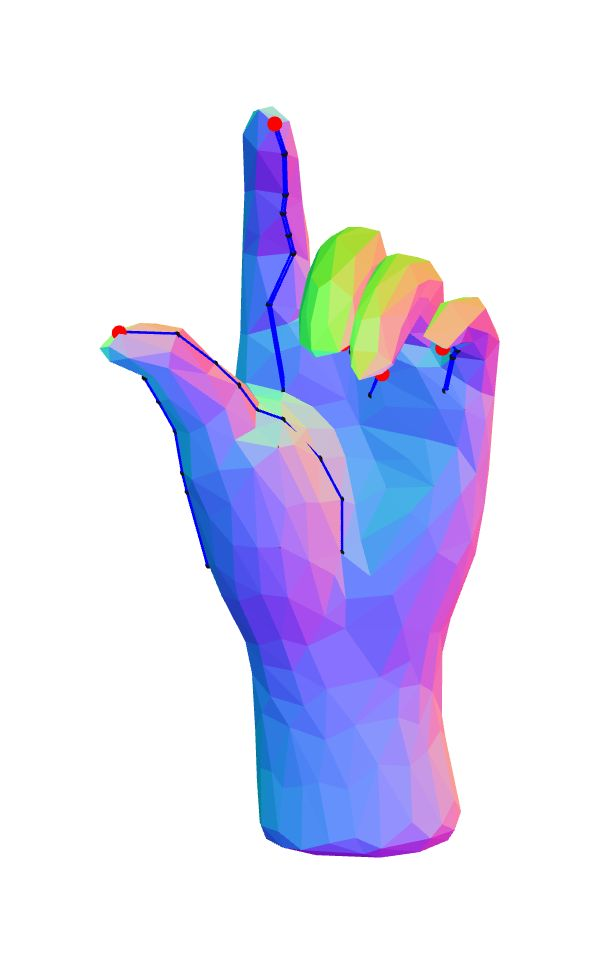

guessed pic:
fit: 1.5911525428058344


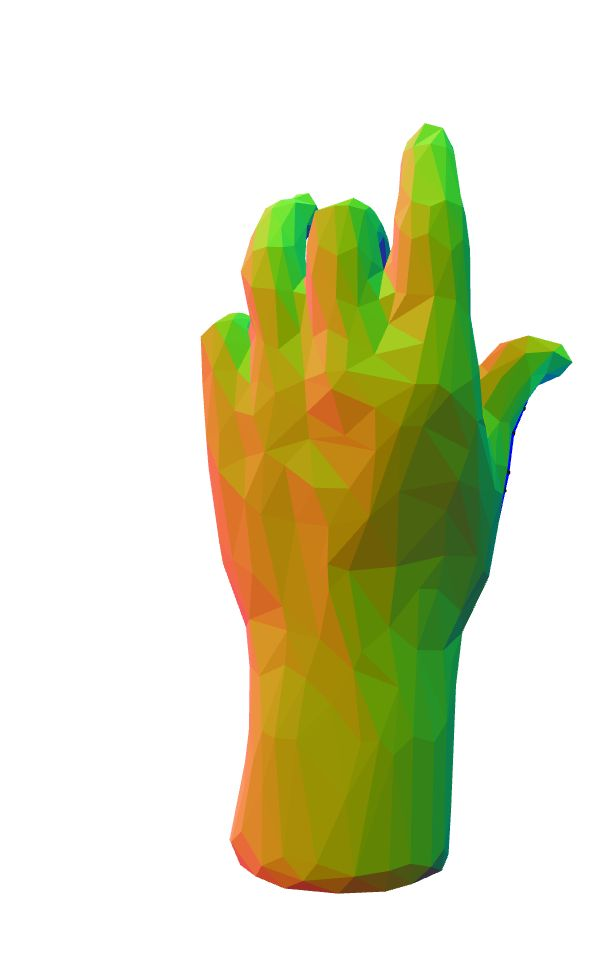

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
playing piano
correct pic:


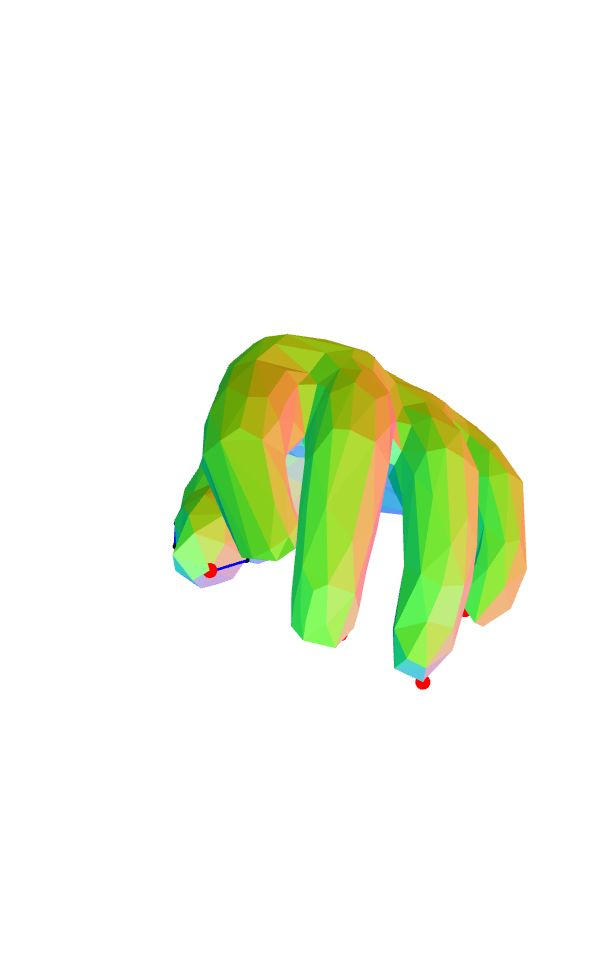

guessed pic:
fit: 0.9807865702809594


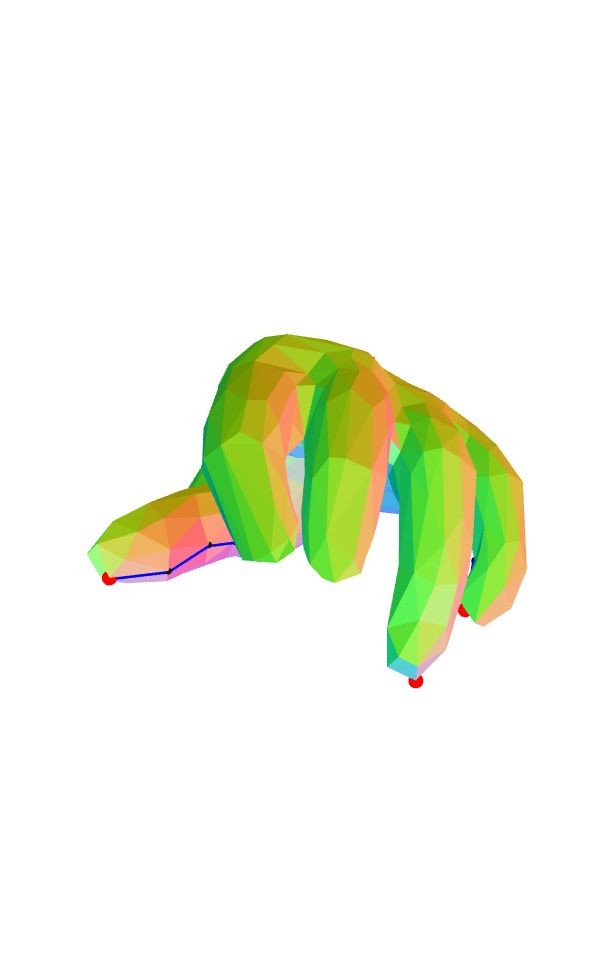

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Vertical hand; thumb facing front; thumb; 3rd and 4th finger flexed
correct pic:


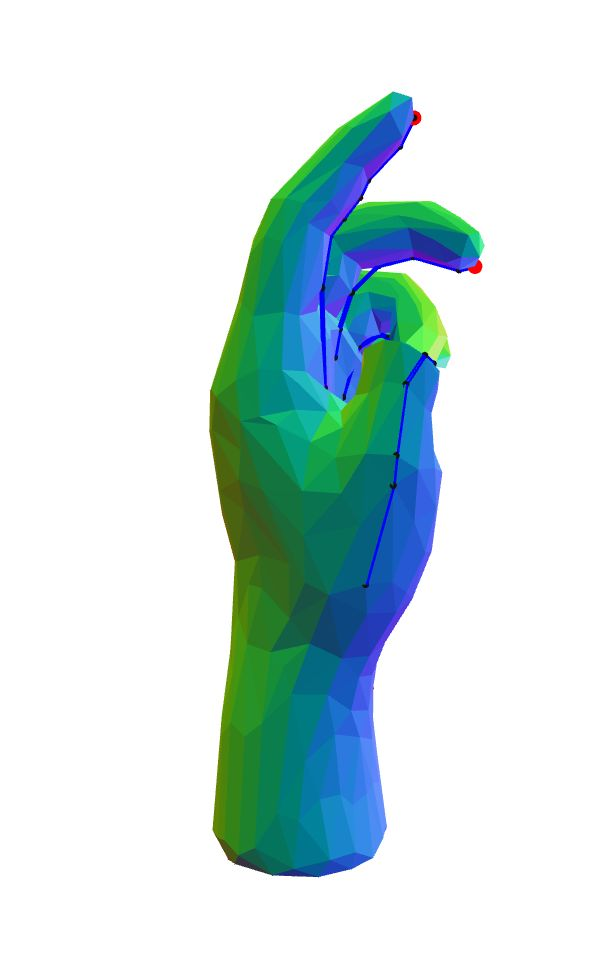

guessed pic:
fit: 2.096945876897829


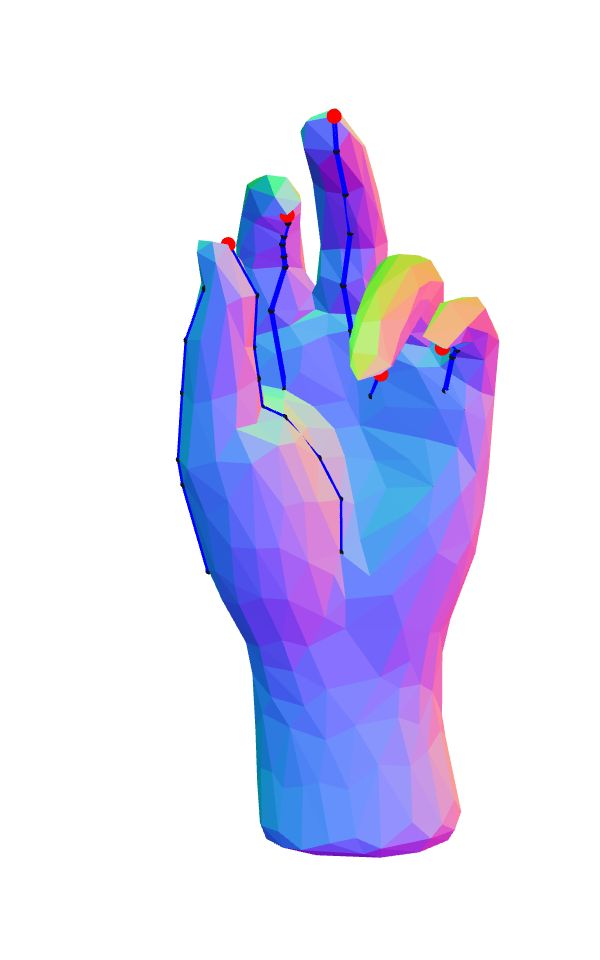

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
all fingers curled; thumb under middle finger;;
correct pic:


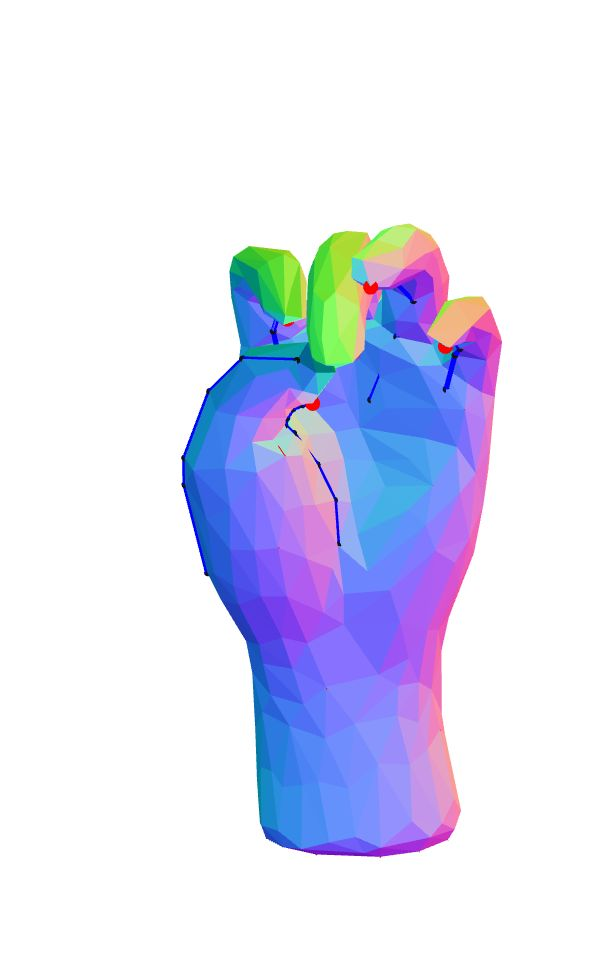

guessed pic:
fit: 1.2925566188163993


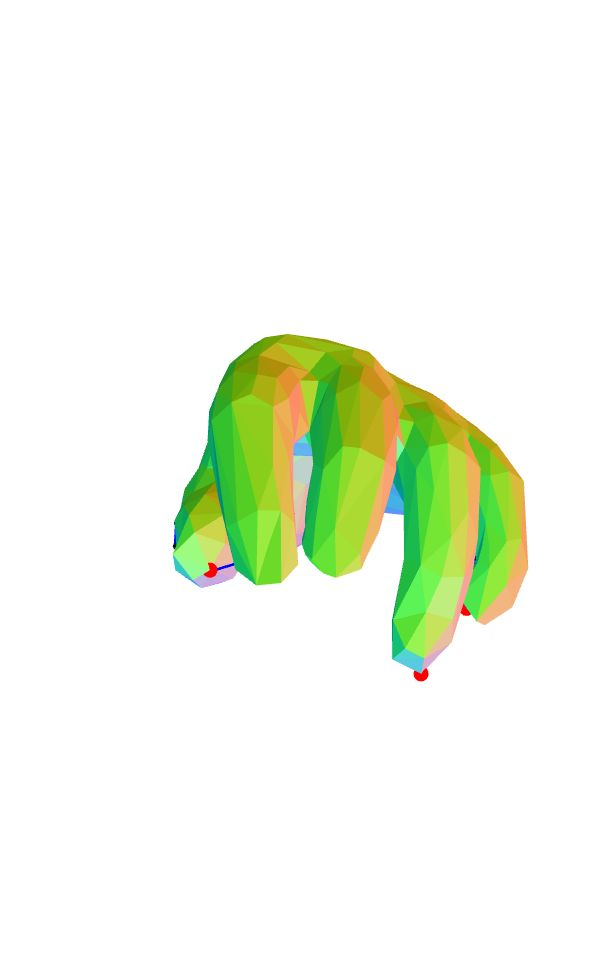

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Reaching for something
correct pic:


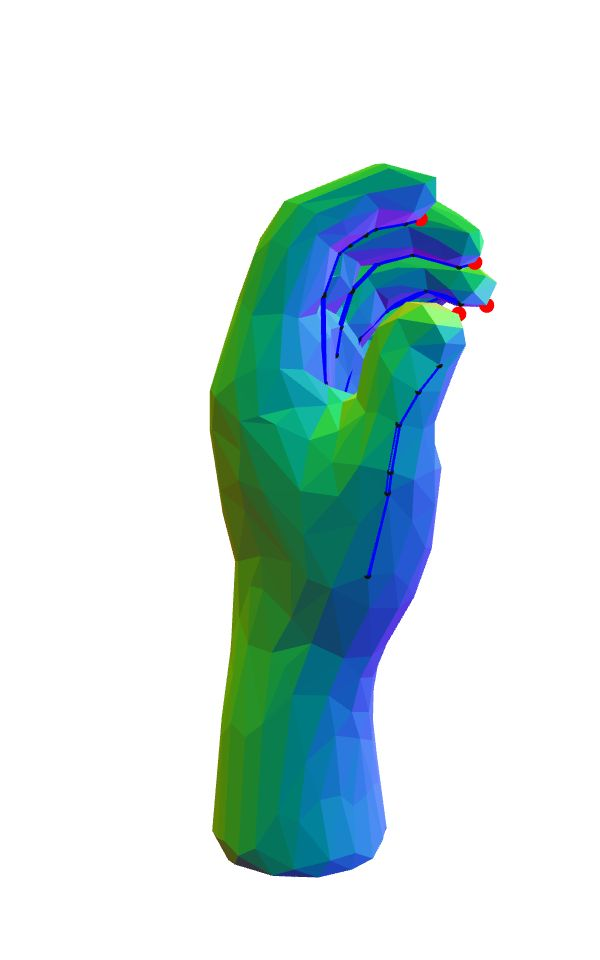

guessed pic:
fit: 1.2530665070586398


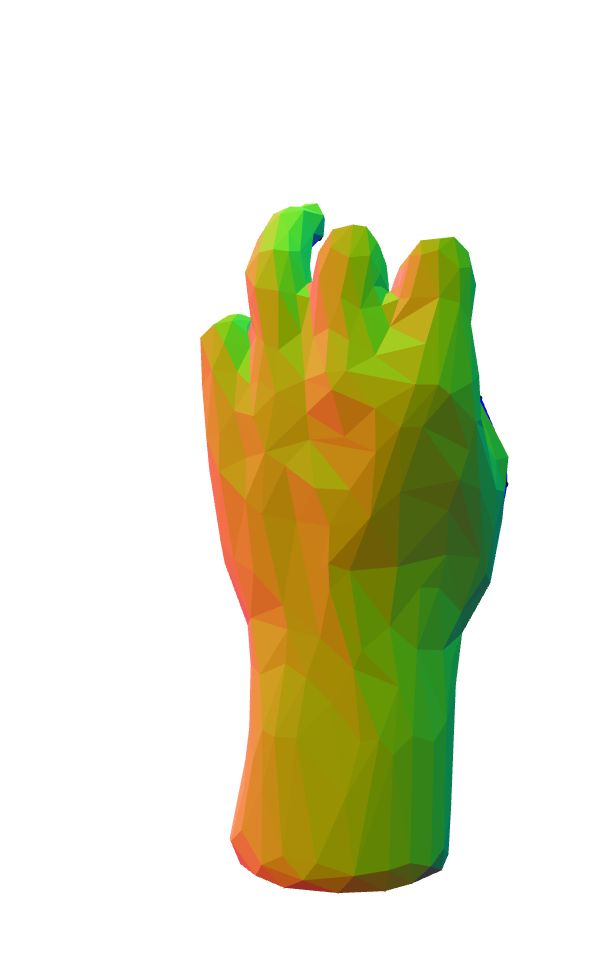

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand is posed as if only pressing a note on the flute with the middle finger.
correct pic:


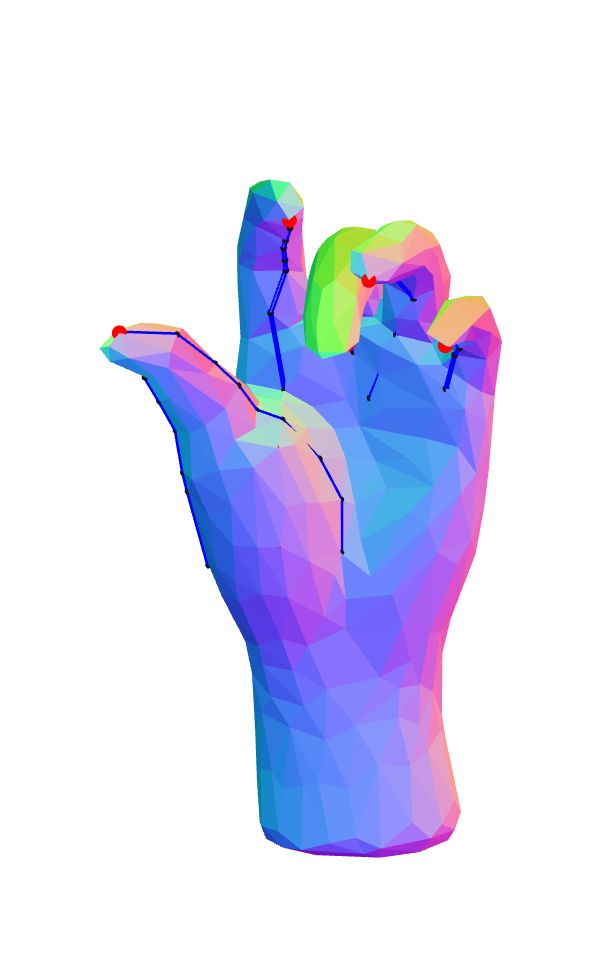

guessed pic:
fit: 2.7638152679180785


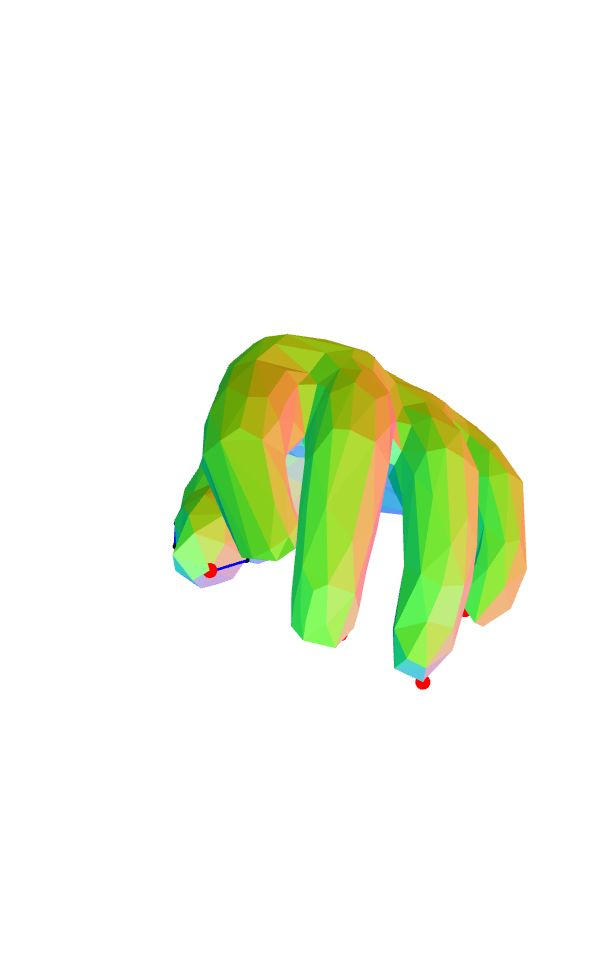

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Fingers curled down with index finger down most; then ring finger and middle finger less. Pinkie mor
correct pic:


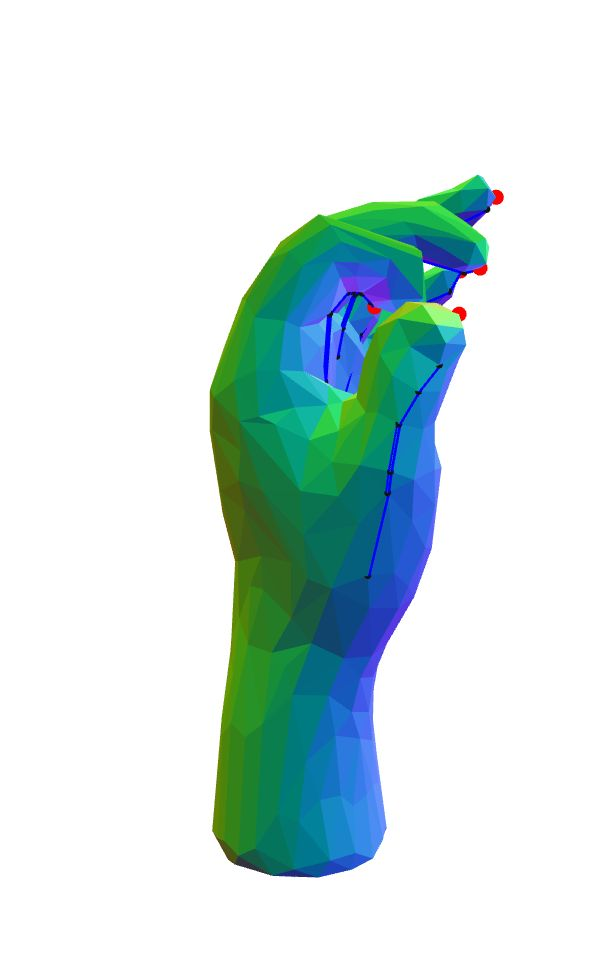

guessed pic:
fit: 3.0838242124355735


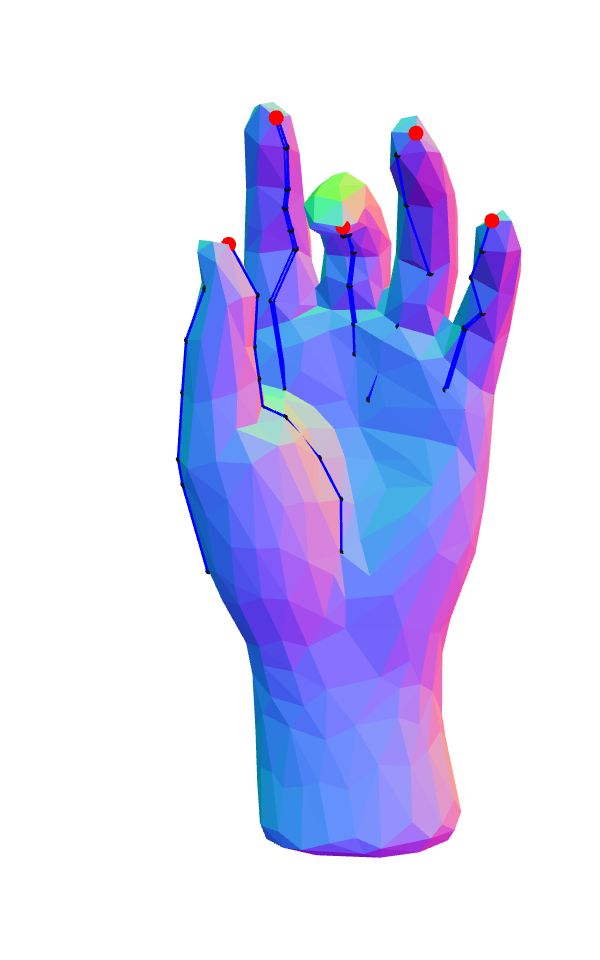

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
HOLD SOME PRODUCT
correct pic:


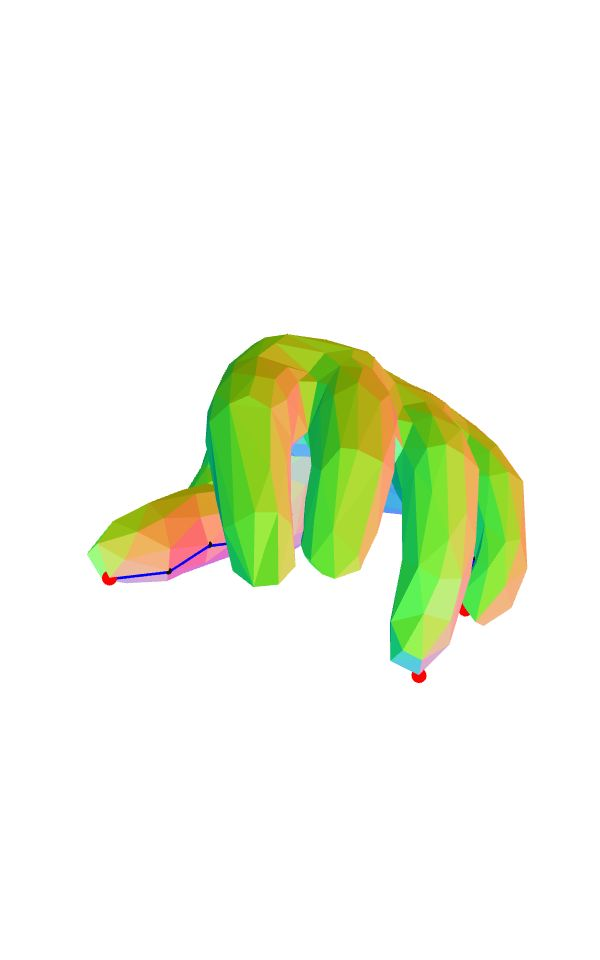

guessed pic:
fit: 0.7115653935193622


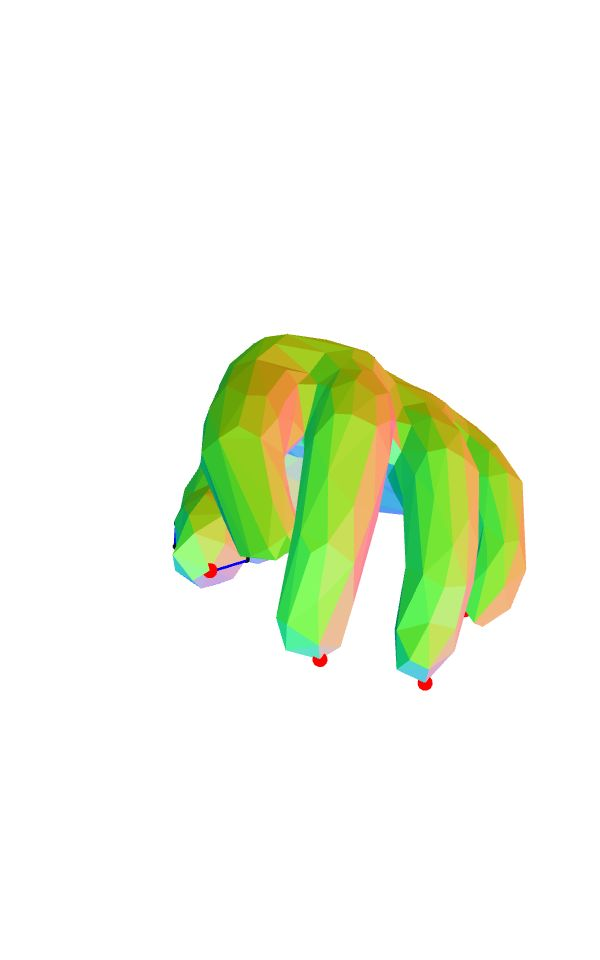

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
claw like form
correct pic:


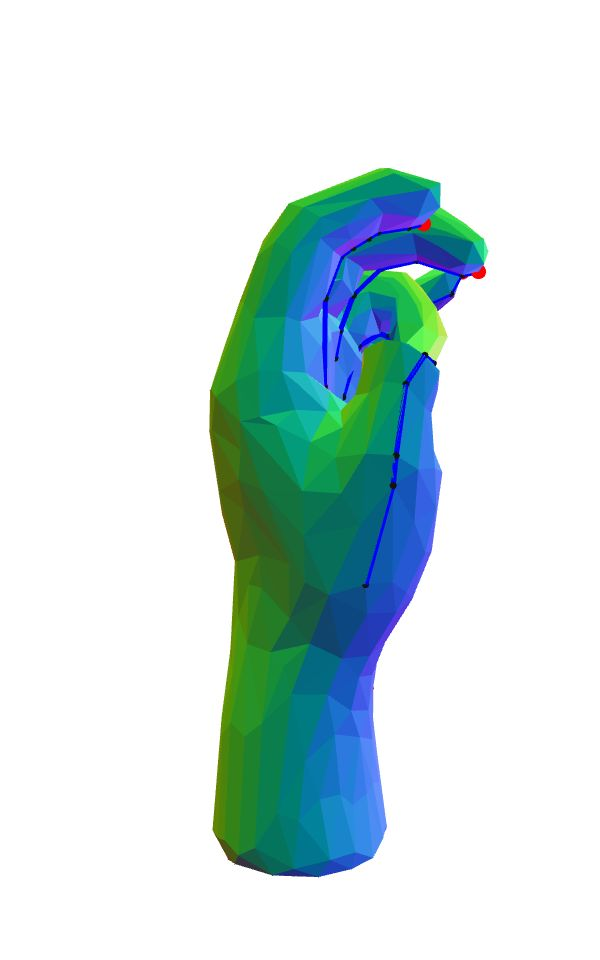

guessed pic:
fit: 0.9098274321663332


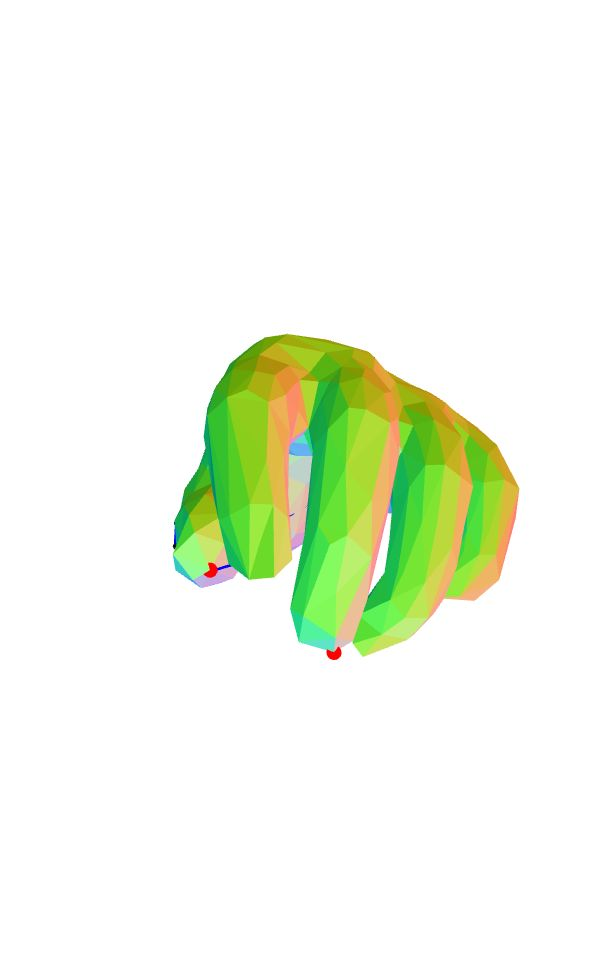

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
holding chin in hand like i am now
correct pic:


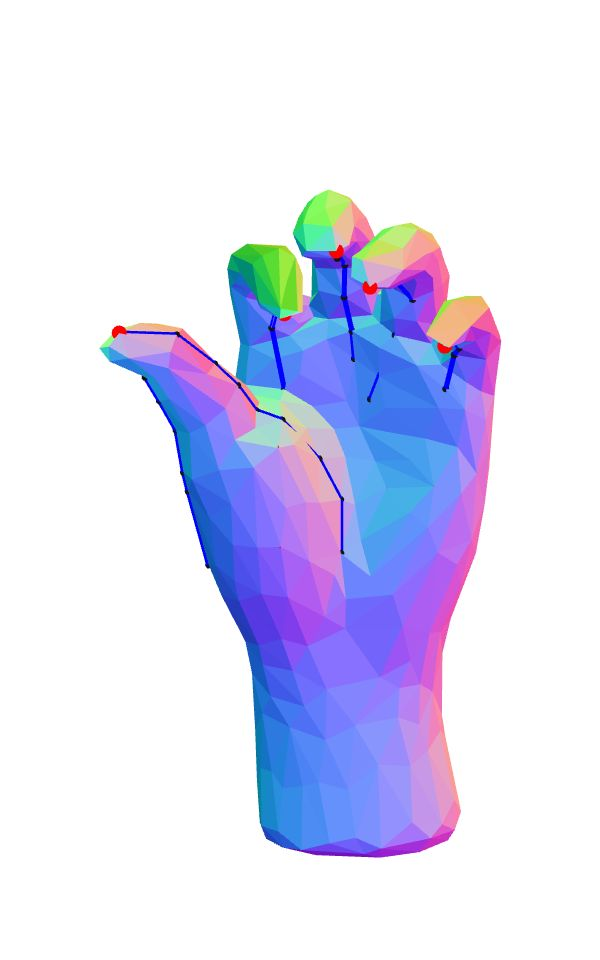

guessed pic:
fit: 1.8688214920544057


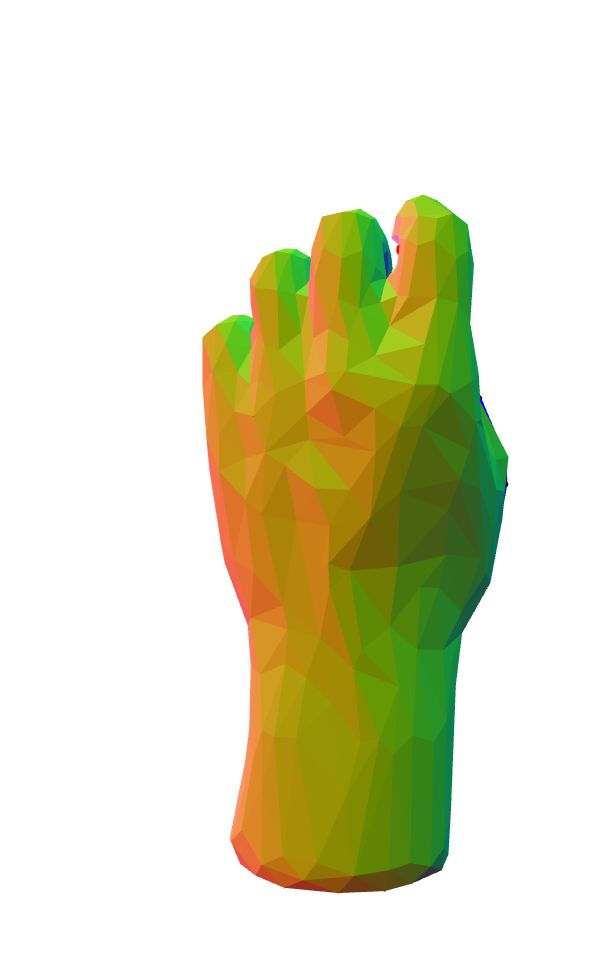

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
fist hand
correct pic:


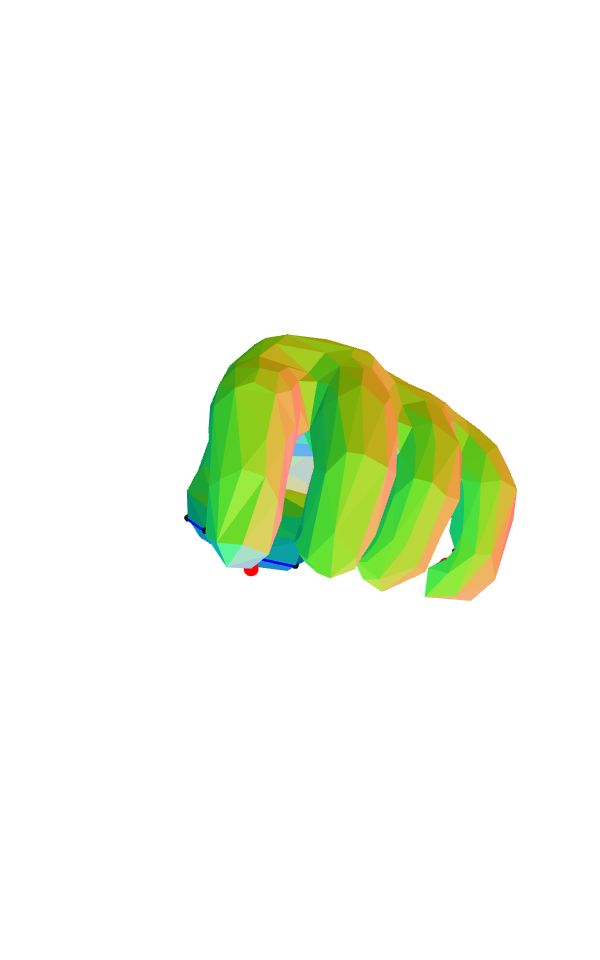

guessed pic:
fit: 0.7034910150579701


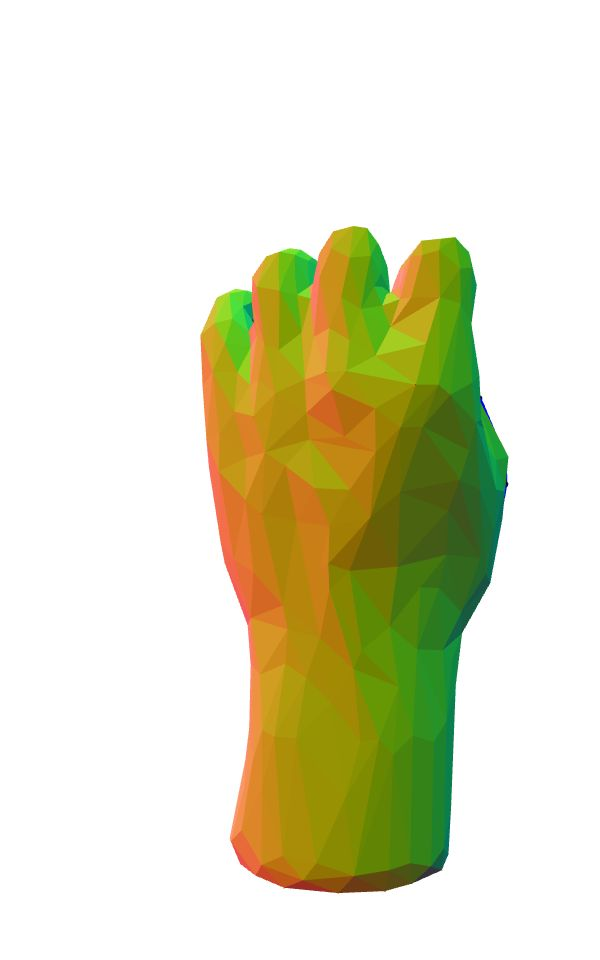

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
ACTION LIKE
correct pic:


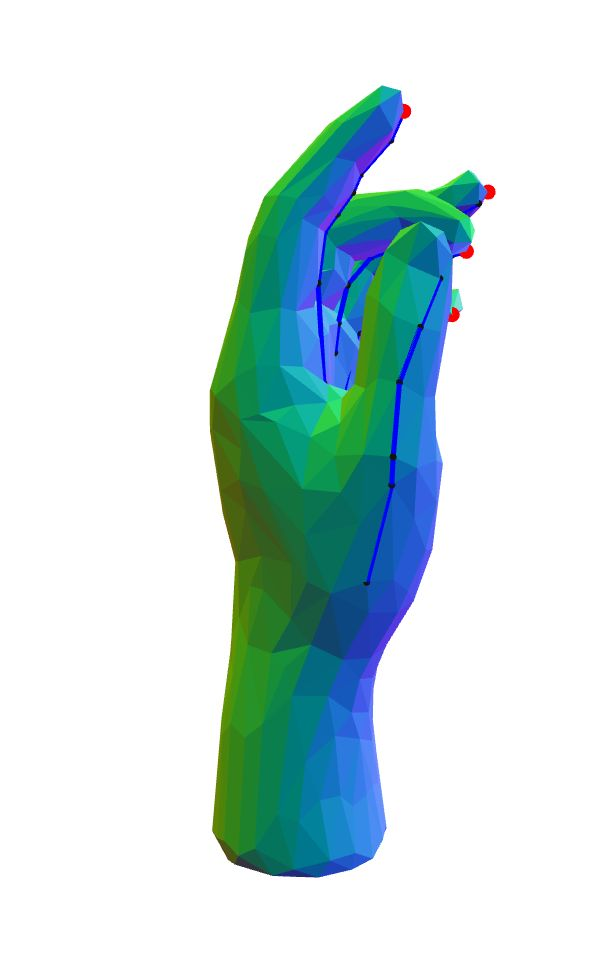

guessed pic:
fit: 0.7489725724586227


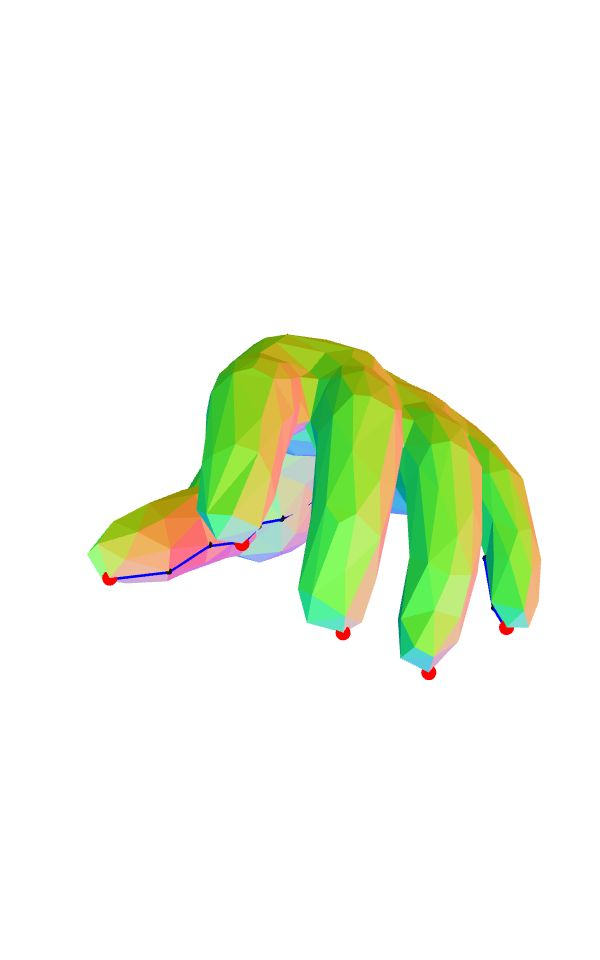

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Stretching the middle finger
correct pic:


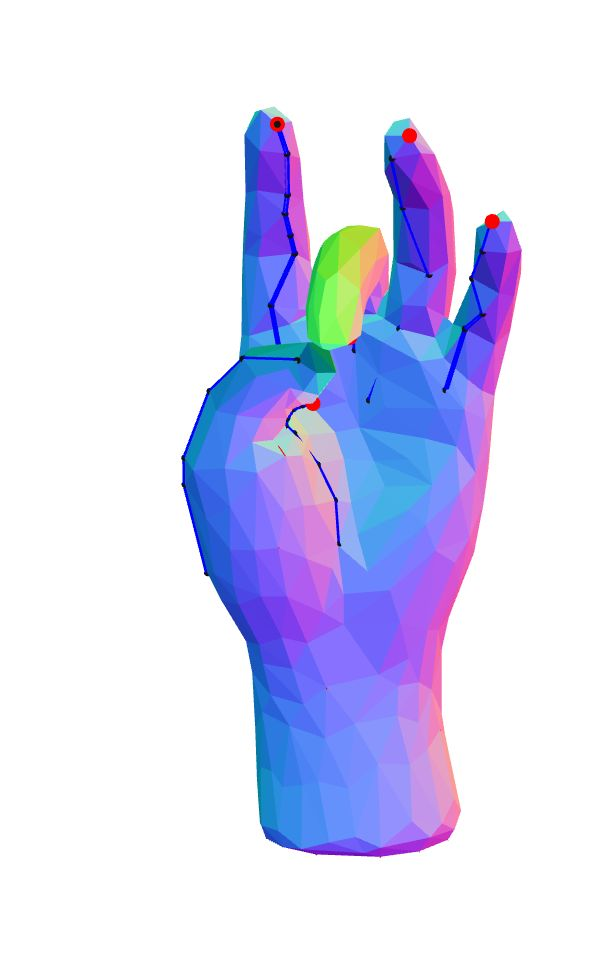

guessed pic:
fit: 0.48011882195877537


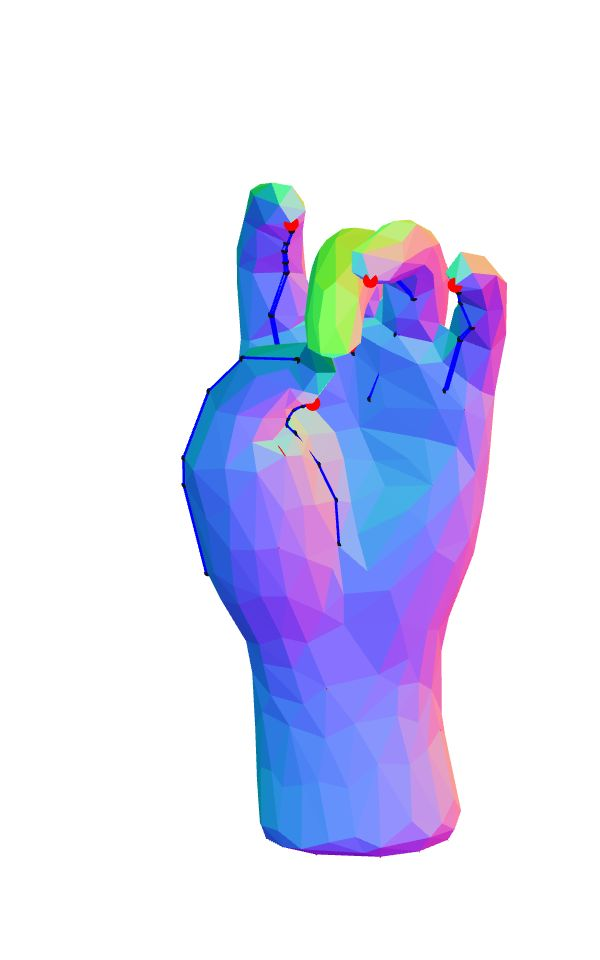

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Vertical hand; thumb covering flexed 2nd; 3rd and 4th finger; index finger straight
correct pic:


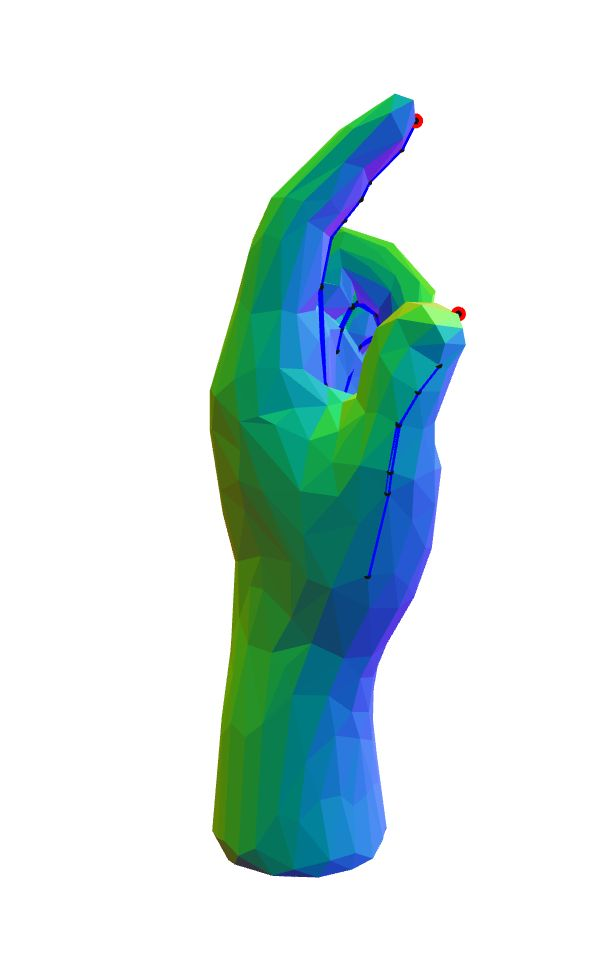

guessed pic:
fit: 2.5614893862797525


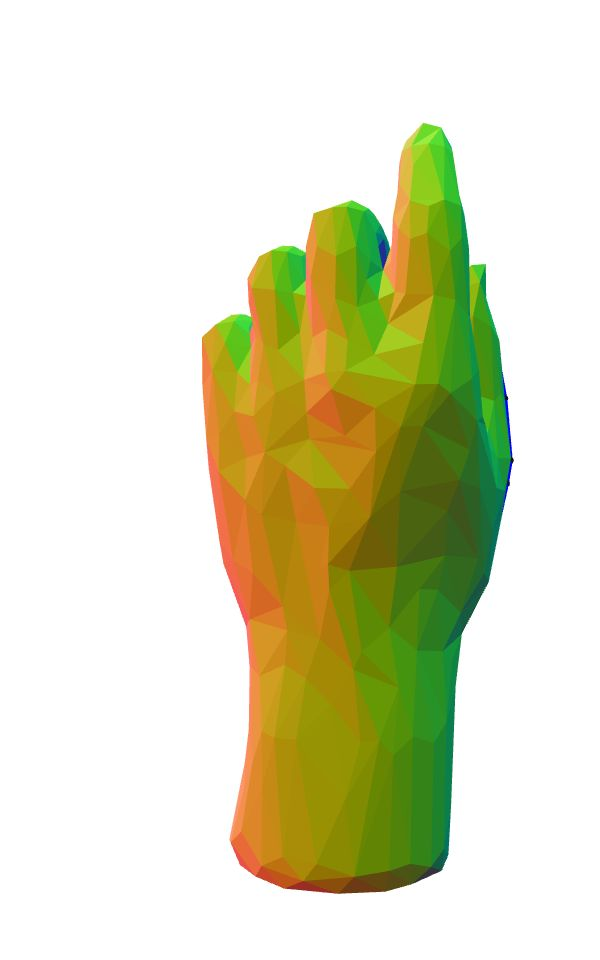

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
slight bend in had with ring finger unbended
correct pic:


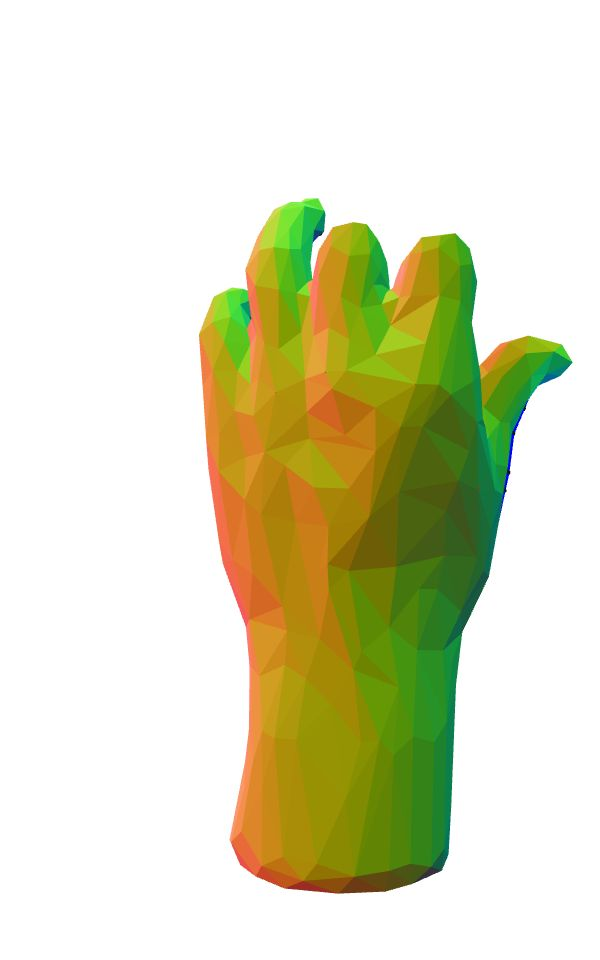

guessed pic:
fit: 1.4822507715224265


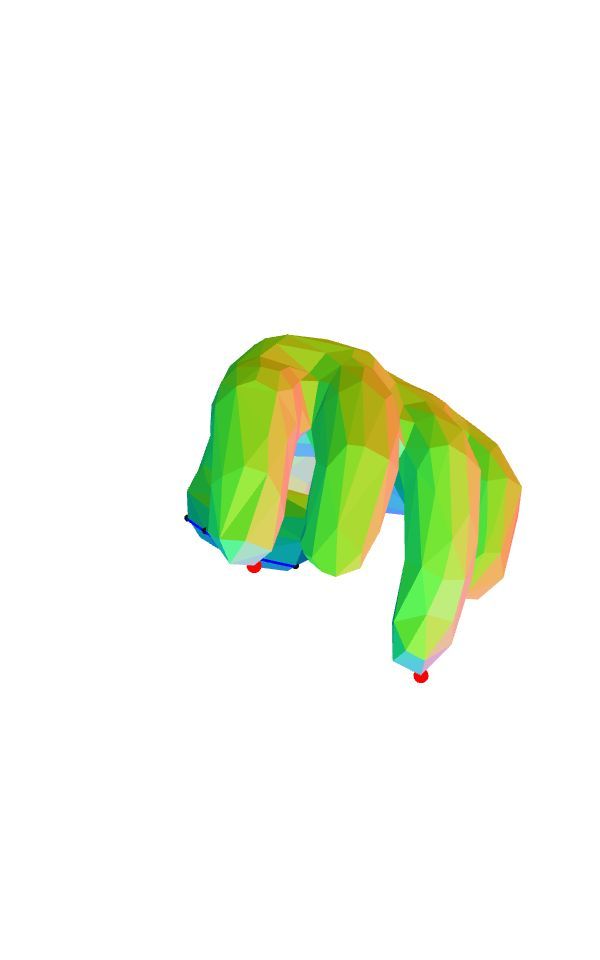

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
A difficult-to-make pose; holding middle and ringers down 3/4; index 1/4; and pink mostly up.
correct pic:


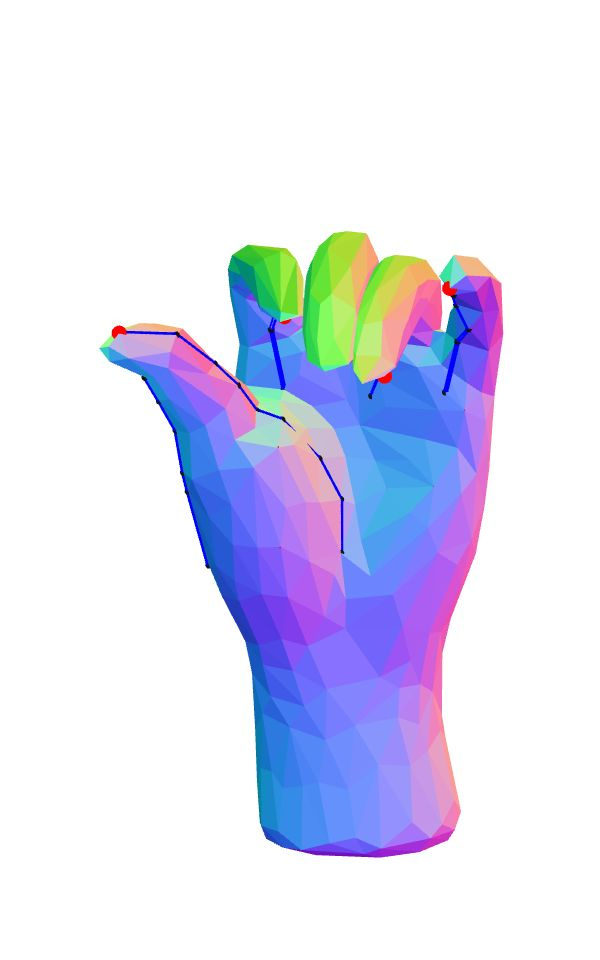

guessed pic:
fit: 3.25502431735013


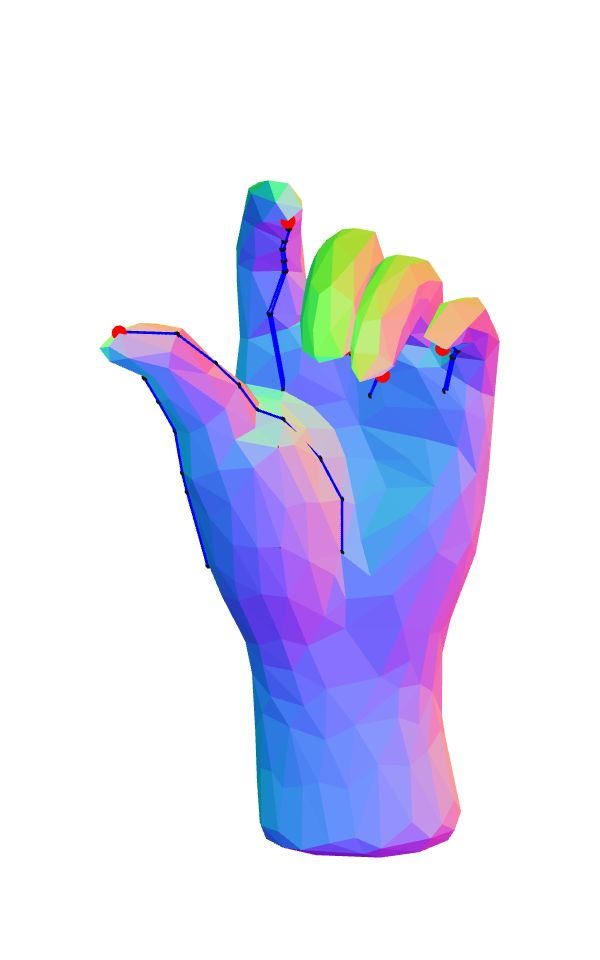

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The gun - a gesture that resembles someone shaping their hand as a gun
correct pic:


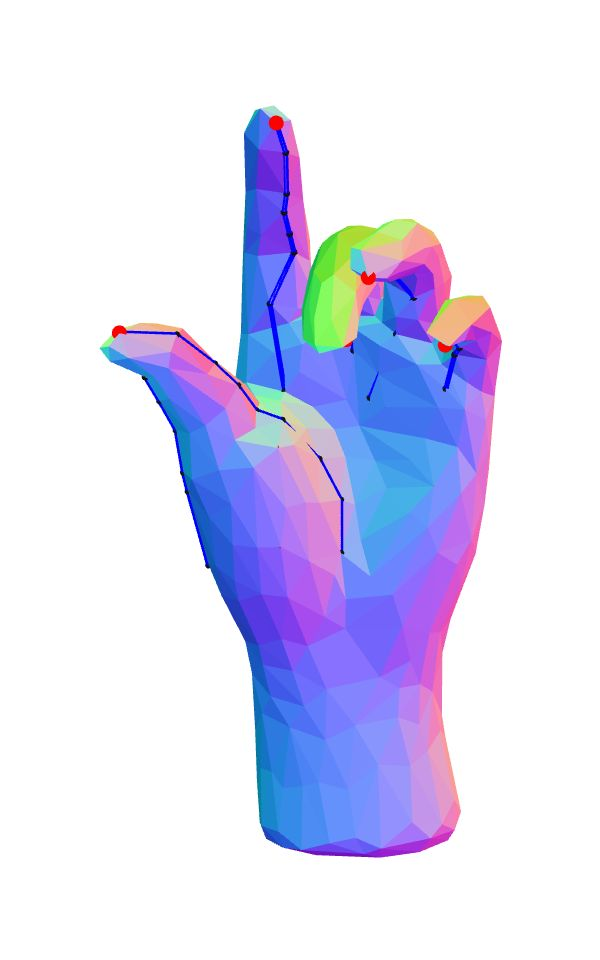

guessed pic:
fit: 2.360440985921602


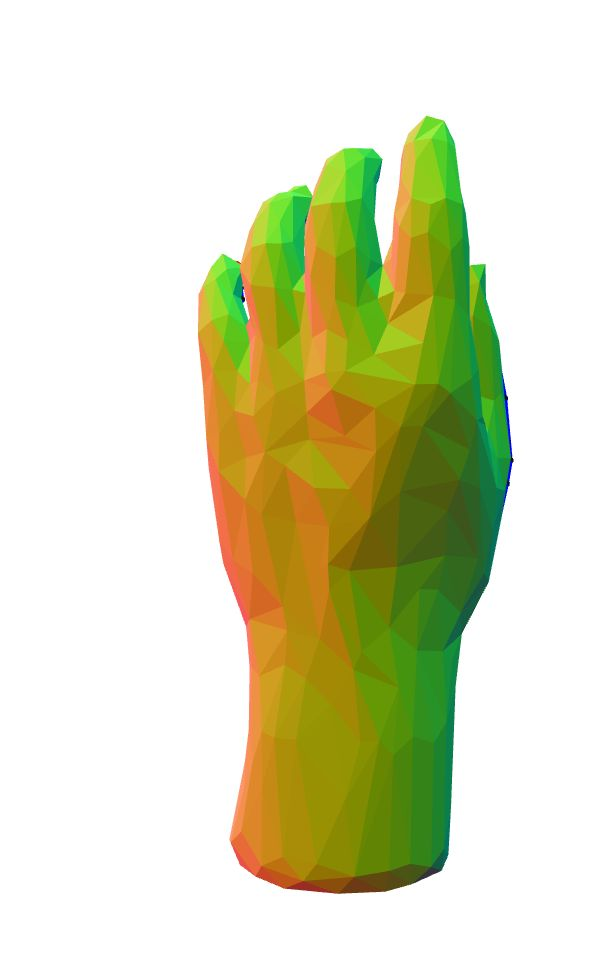

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Stretching the middle finger
correct pic:


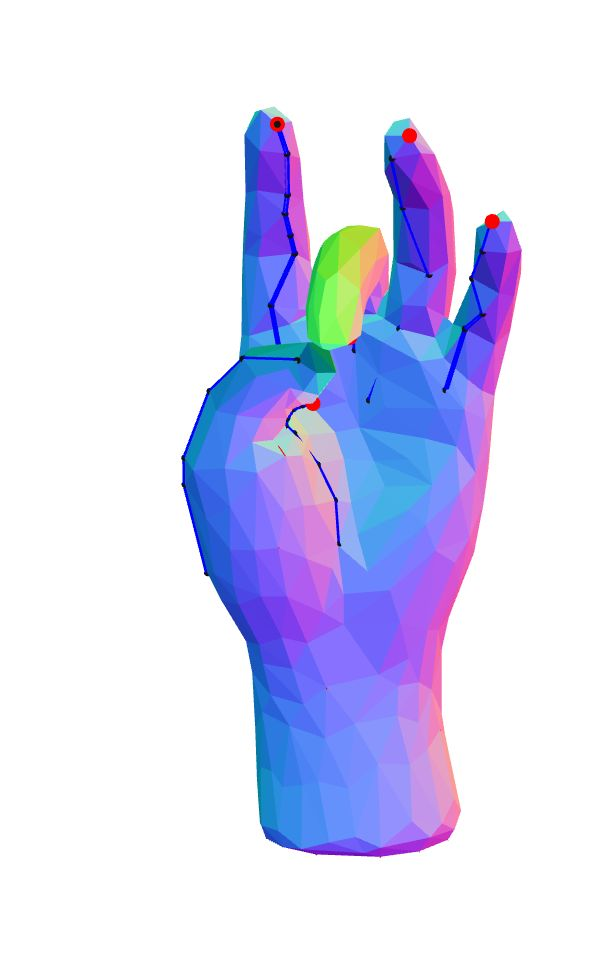

guessed pic:
fit: 3.195214993940392


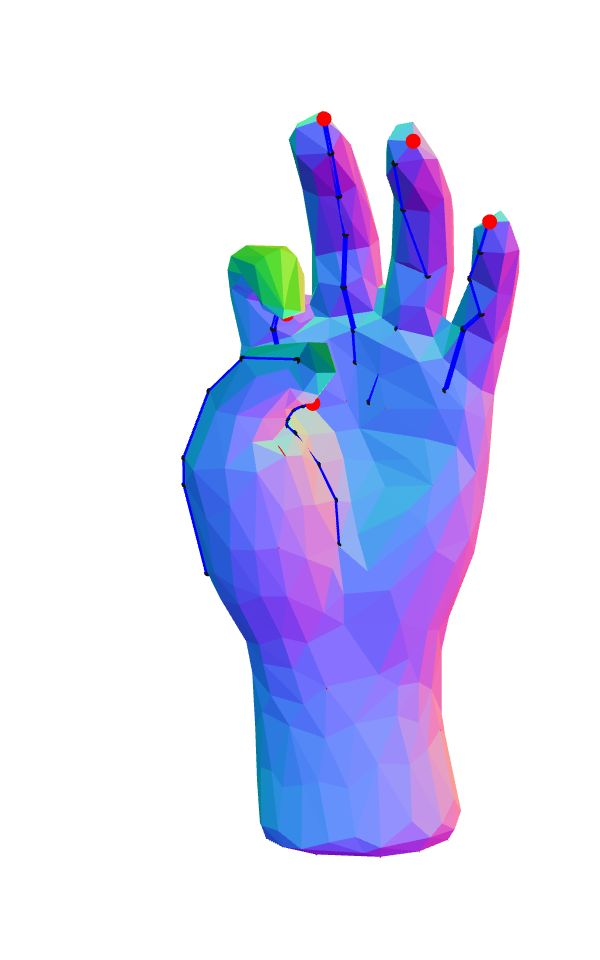

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Reading with aid of your pointer finger
correct pic:


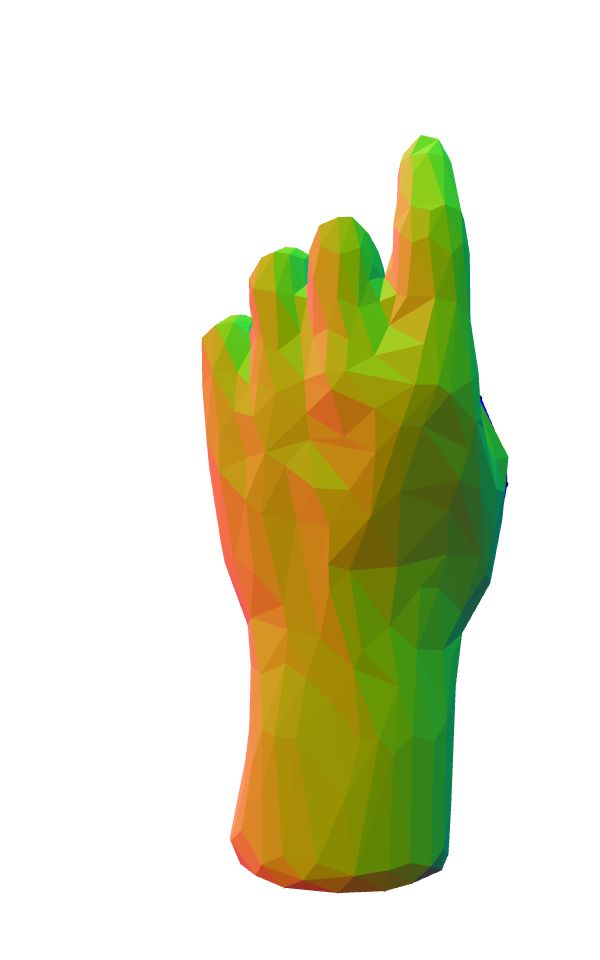

guessed pic:
fit: 0.7151856417465194


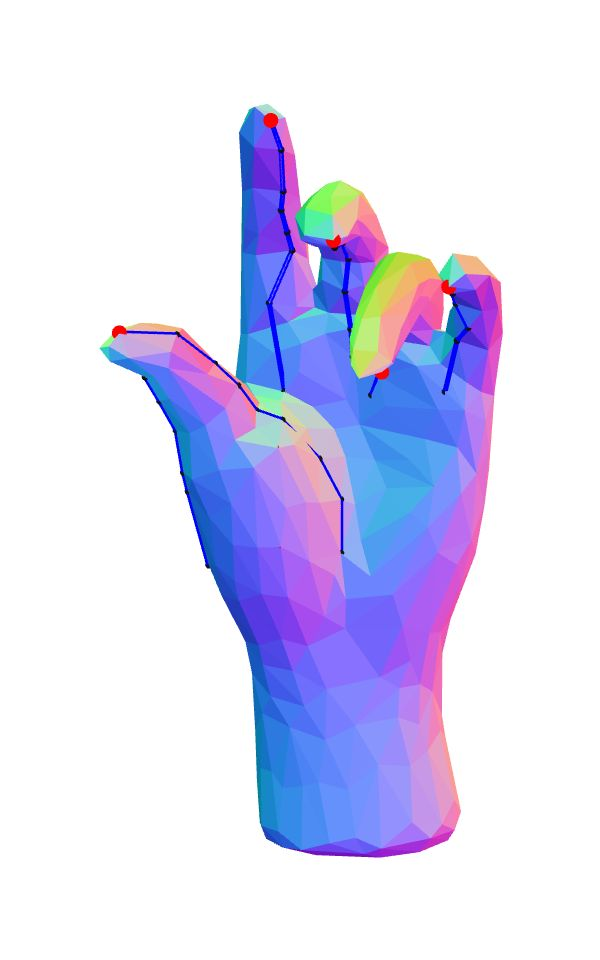

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Bite; could you
correct pic:


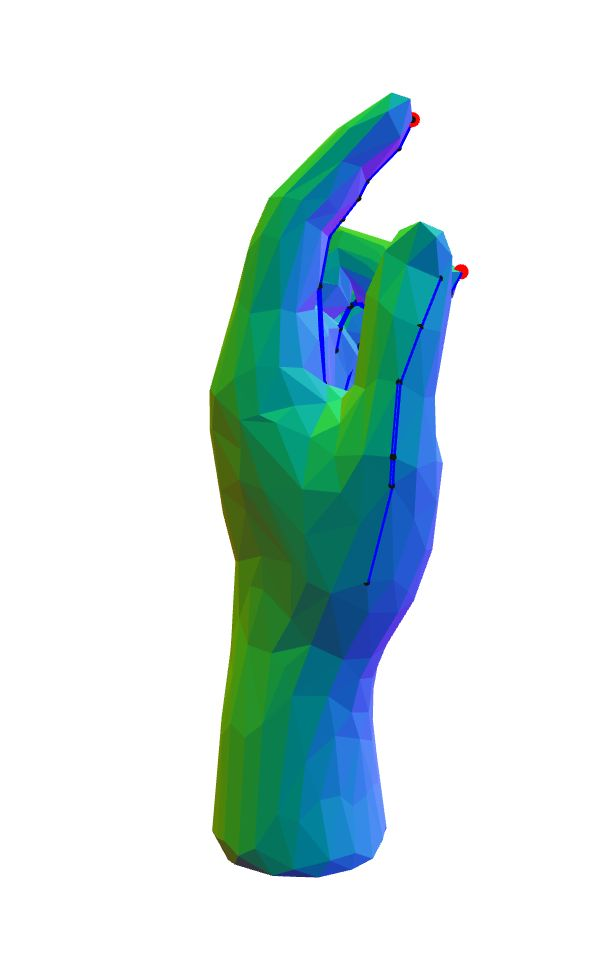

guessed pic:
fit: 1.0404041674034252


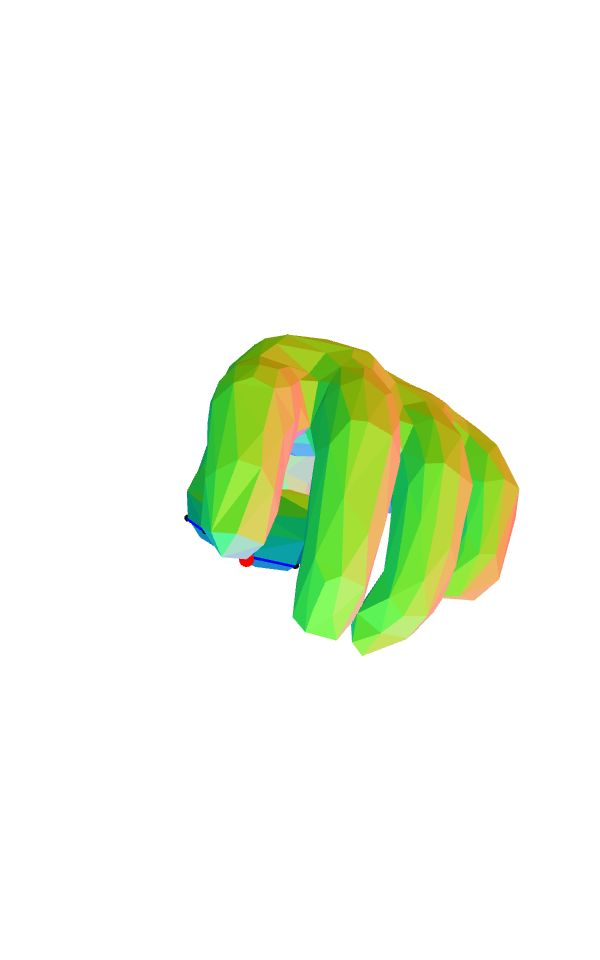

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
looks like mudra for relaxing the body
correct pic:


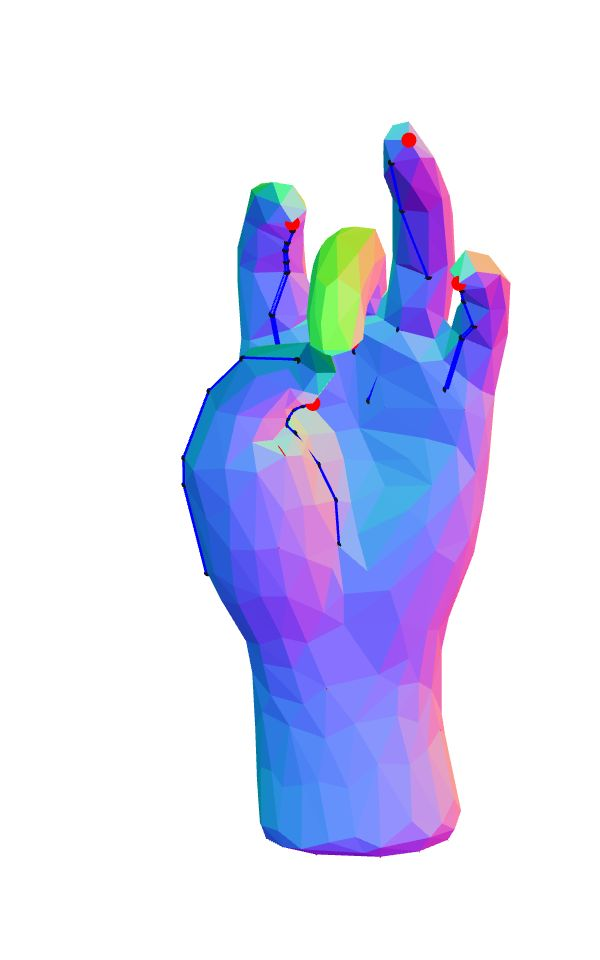

guessed pic:
fit: 2.5475997689253096


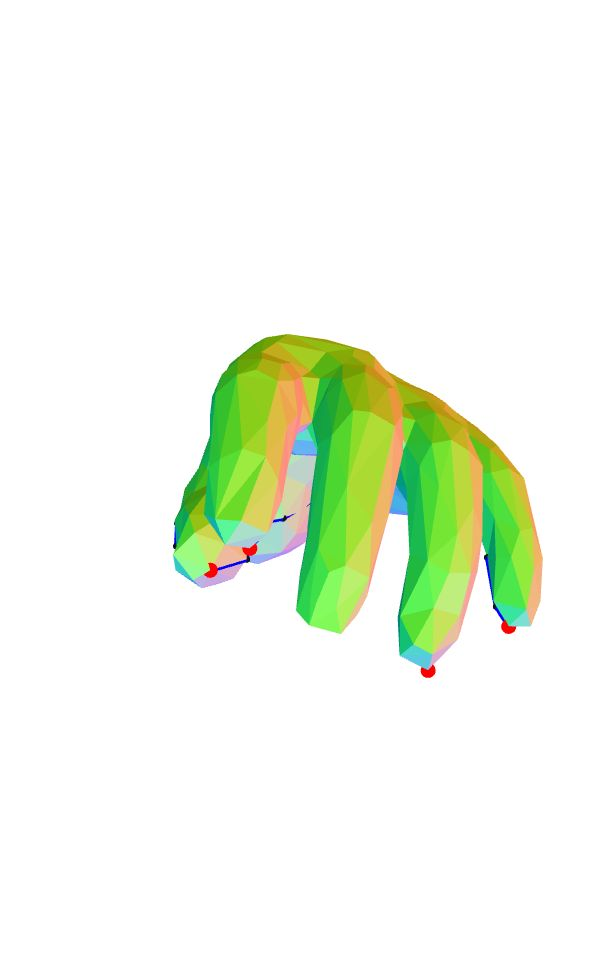

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
half open paw with 4 fingers higher than thumb
correct pic:


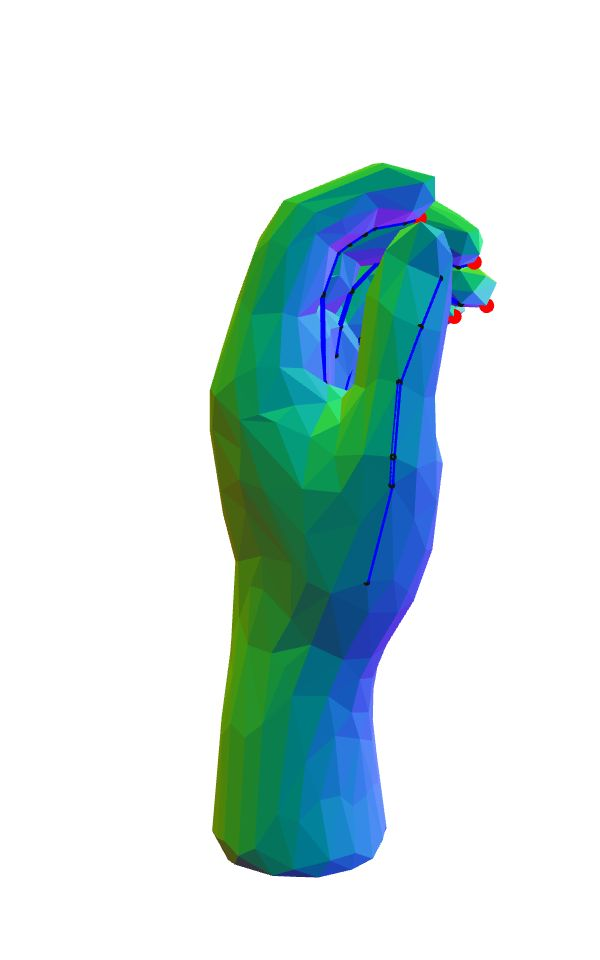

guessed pic:
fit: 2.5058428871341576


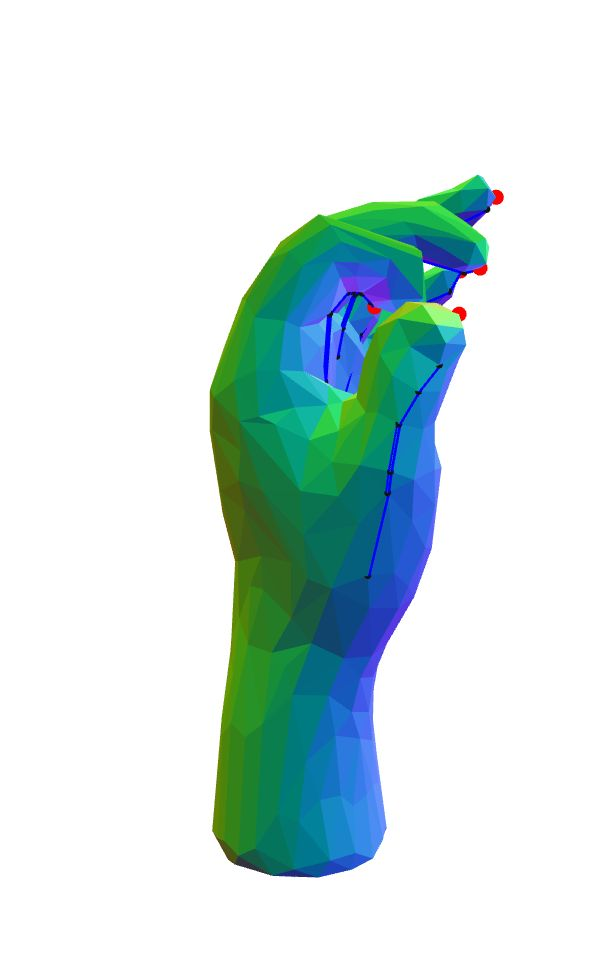

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hot Dog - This hand looks like some is holding and about to consume a hotdog.
correct pic:


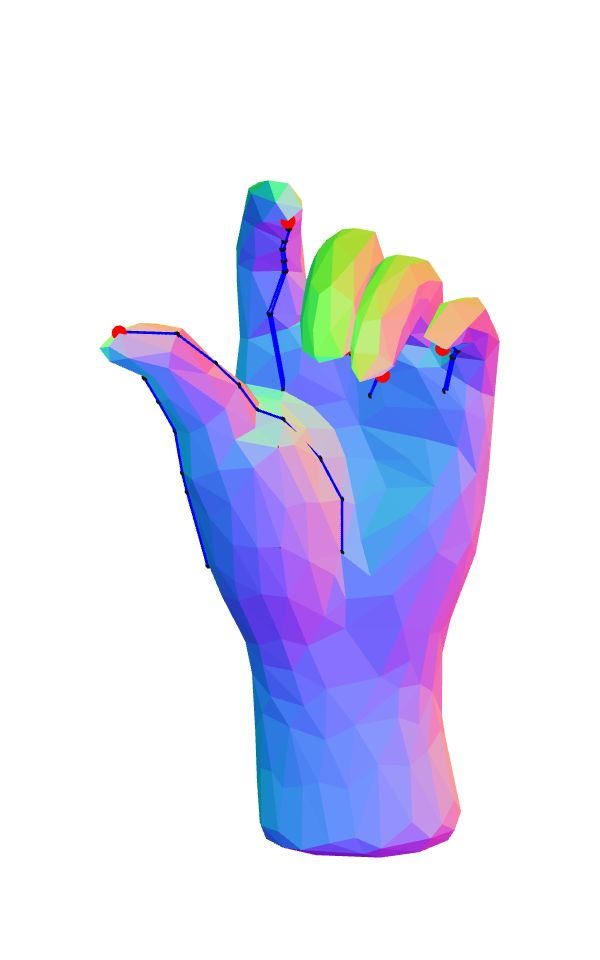

guessed pic:
fit: 1.66813392059686


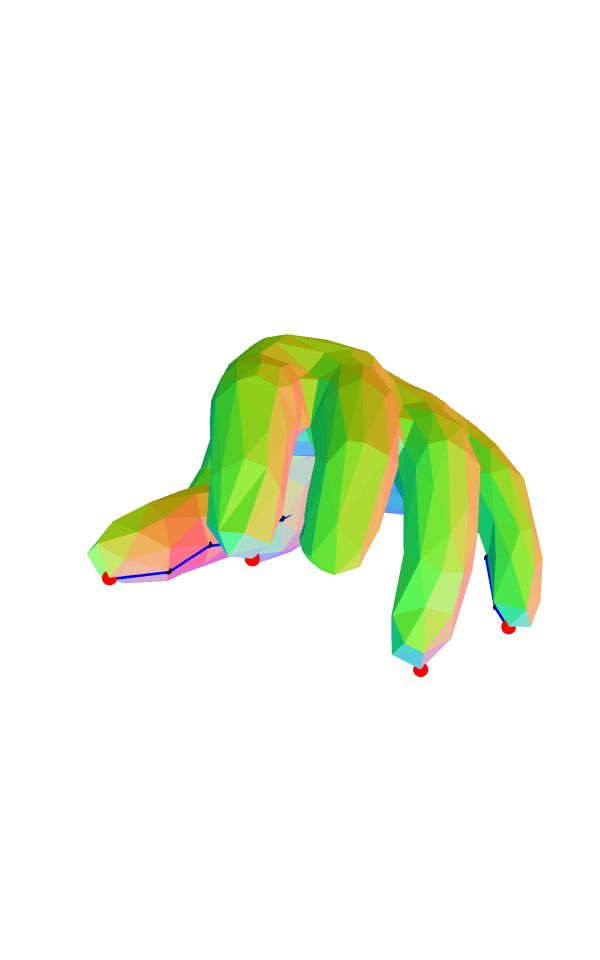

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
slightly contracted hand with slightly relaxed ring and pinkie fingers; contracted thumb
correct pic:


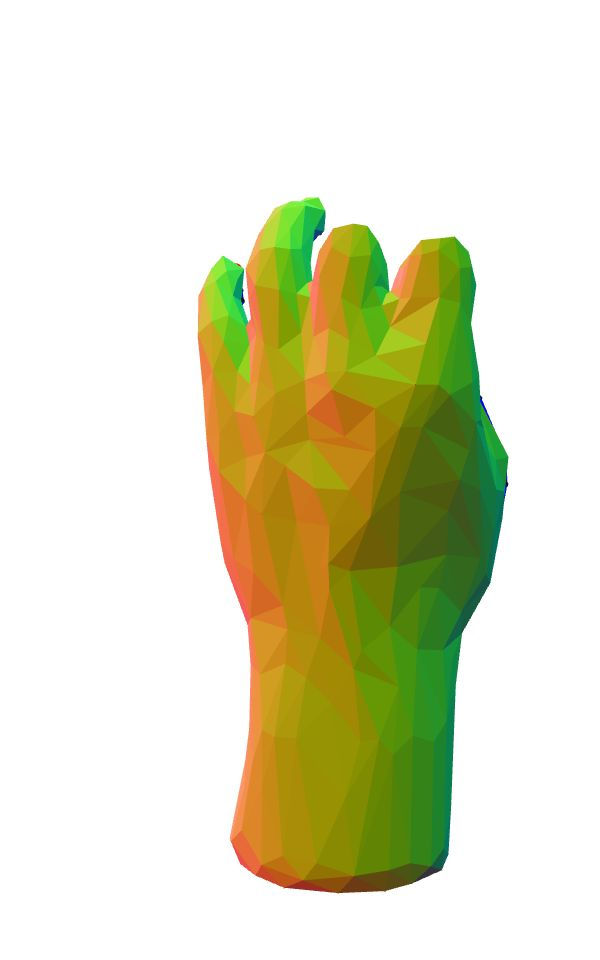

guessed pic:
fit: 2.009446734287627


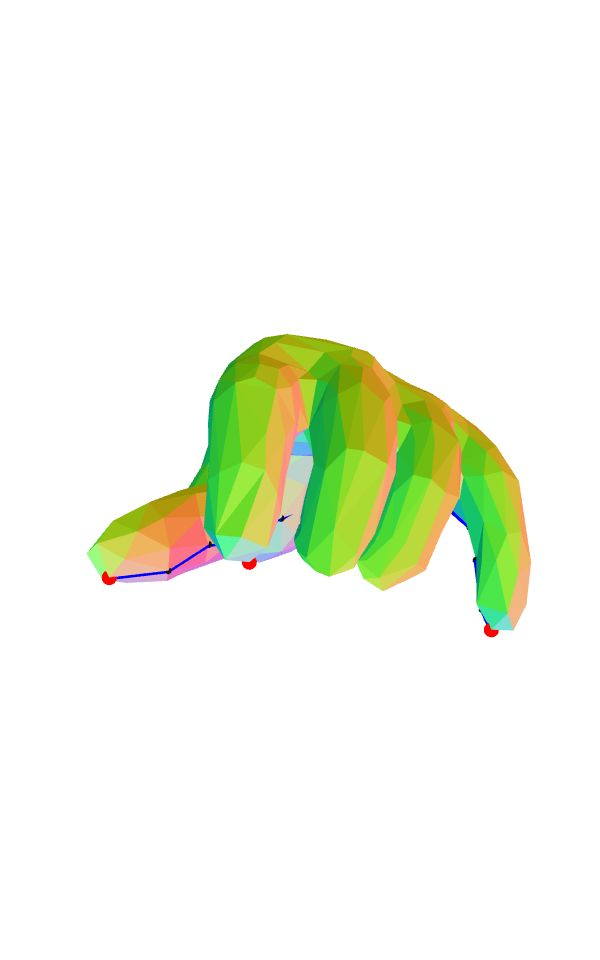

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
curl out thumb
correct pic:


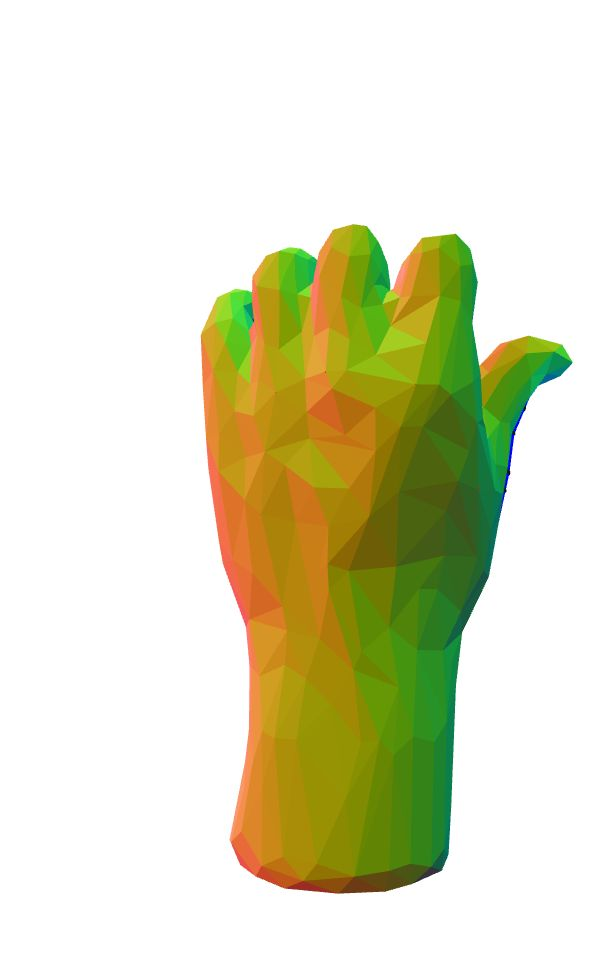

guessed pic:
fit: 0.7050065223927384


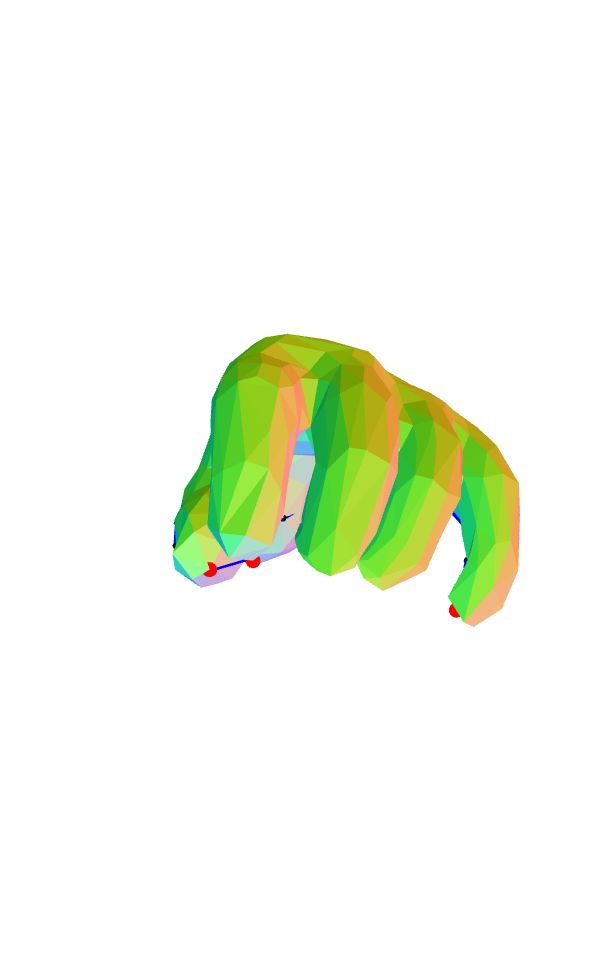

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of hand
correct pic:


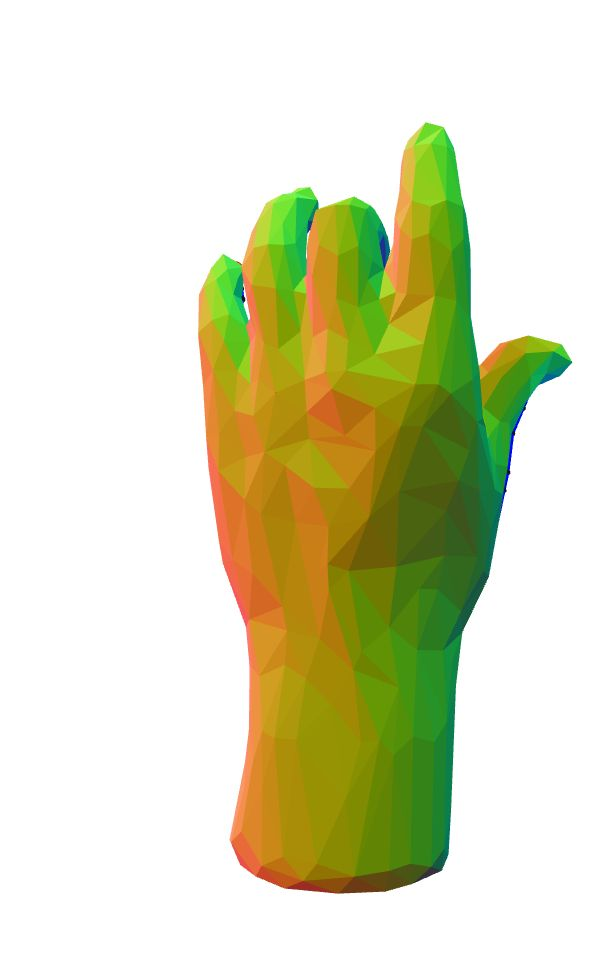

guessed pic:
fit: 0.6040967219059126


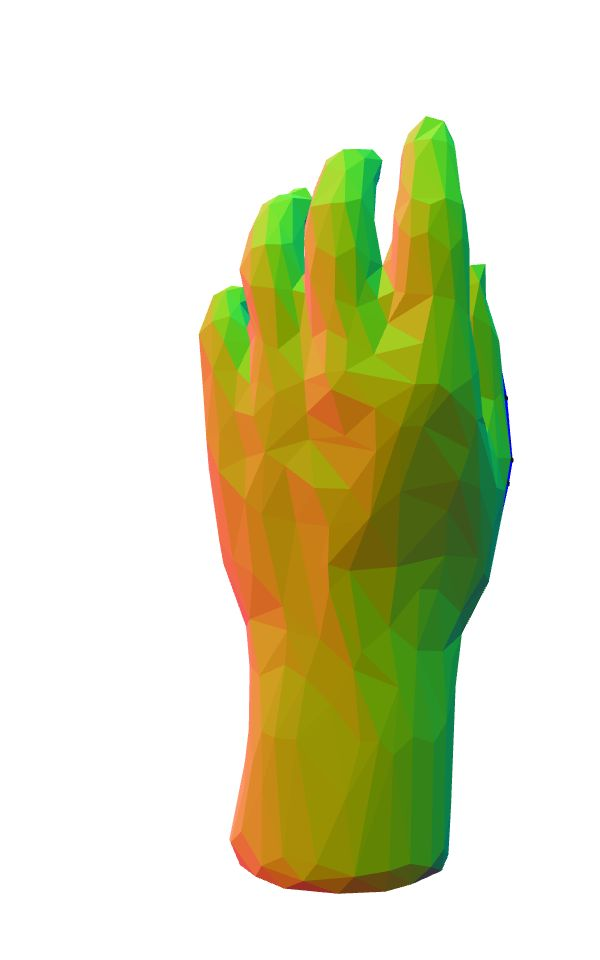

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
this hand looks like a d
correct pic:


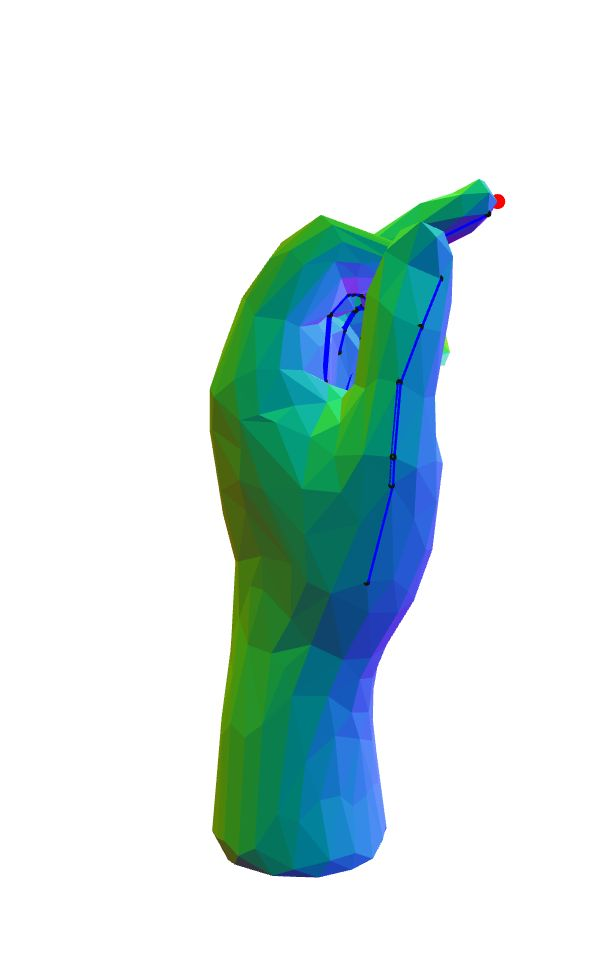

guessed pic:
fit: 1.0639759555722441


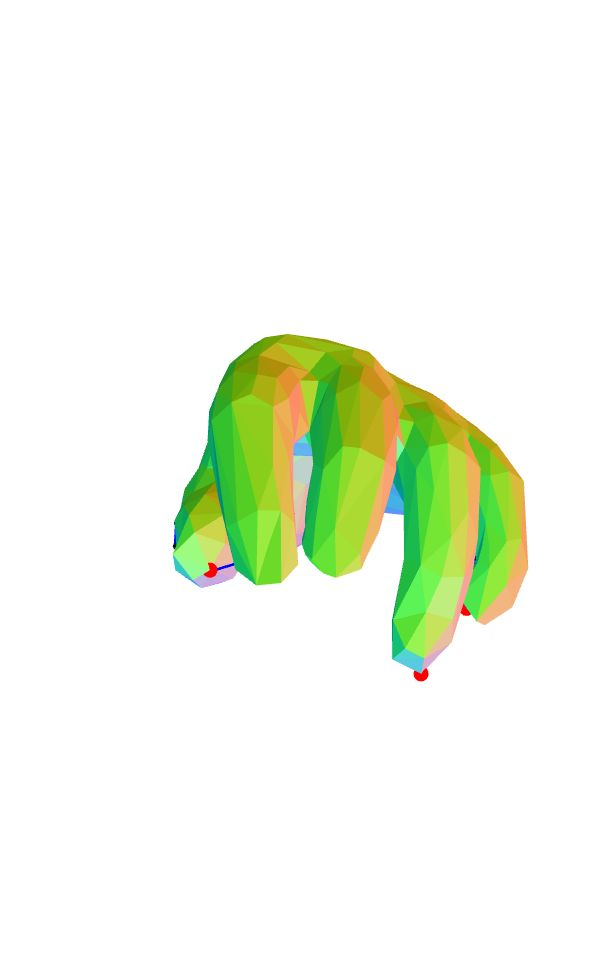

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
all fingers curled; thumb under middle finger;;
correct pic:


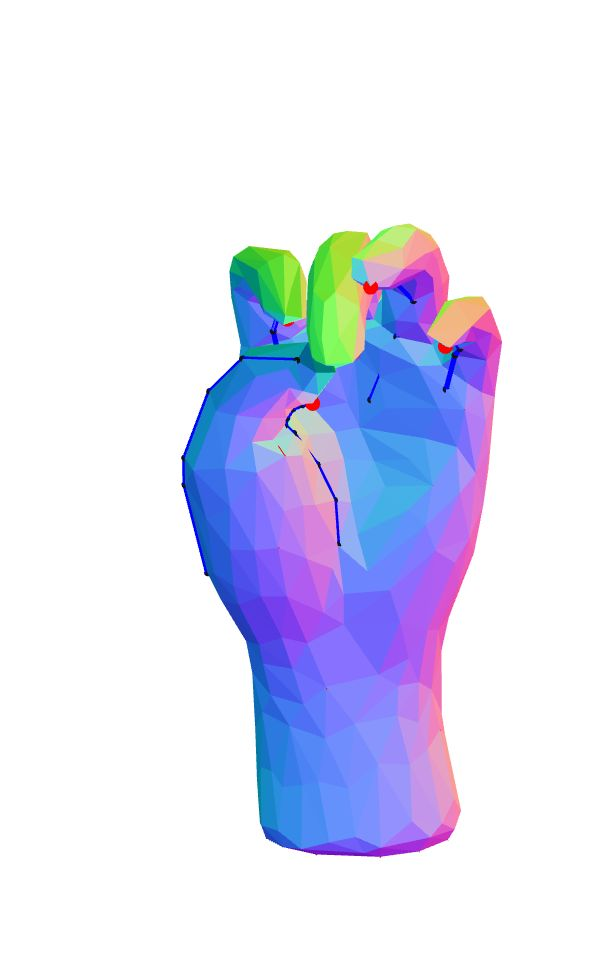

guessed pic:
fit: 1.4849869240979126


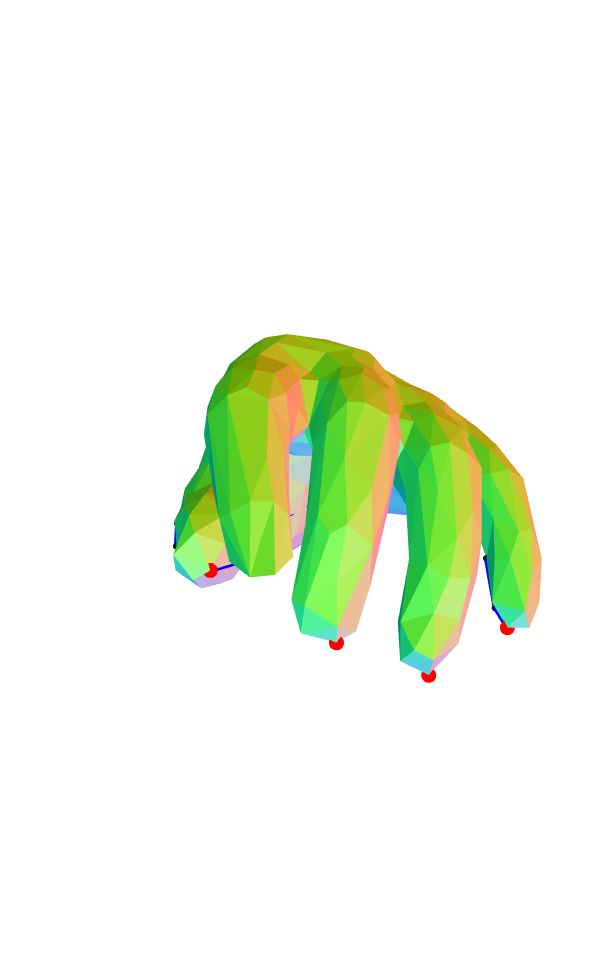

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Starting to reach out
correct pic:


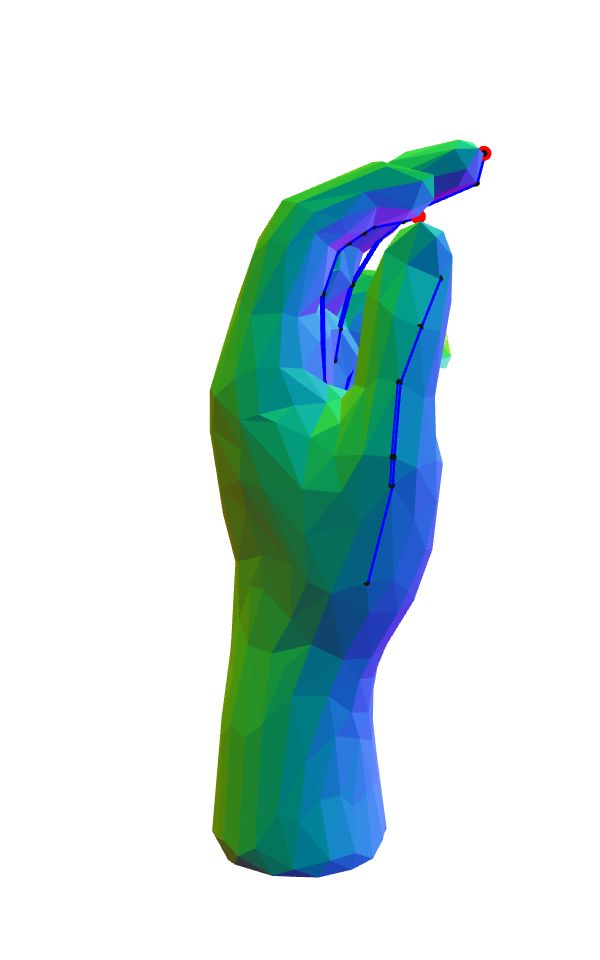

guessed pic:
fit: 1.2855666070260567


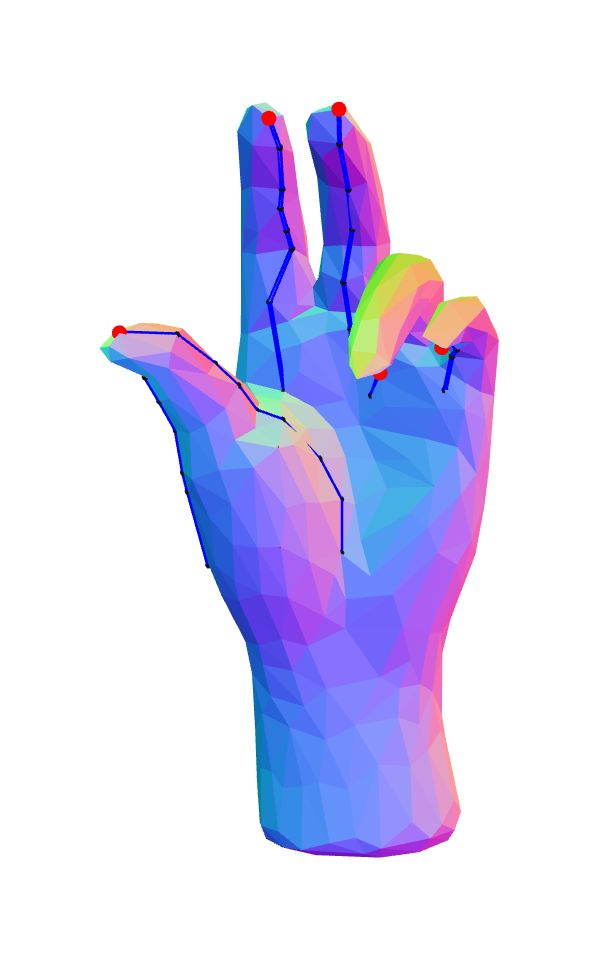

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
make a tunnel with your hand
correct pic:


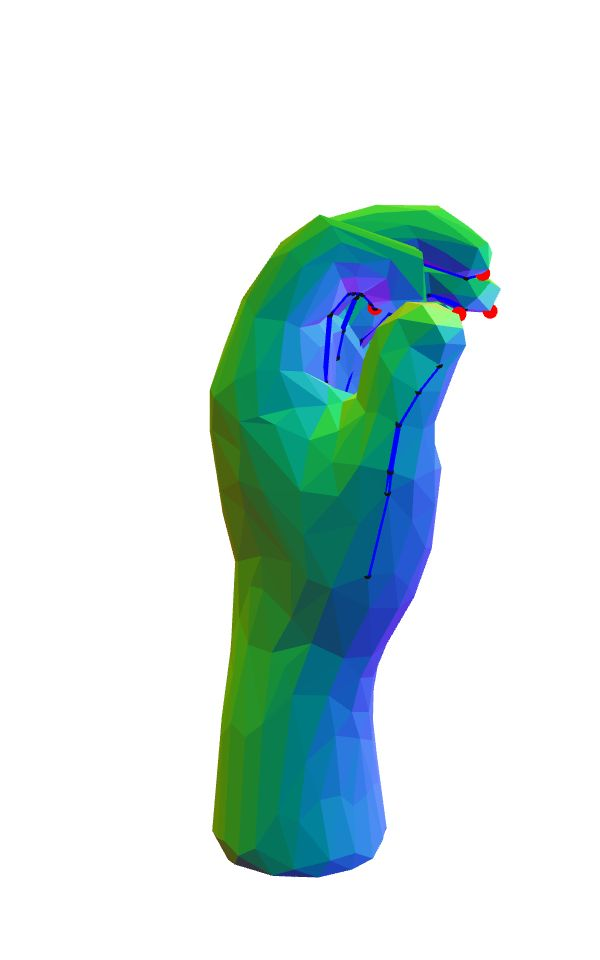

guessed pic:
fit: 0.5257674749344406


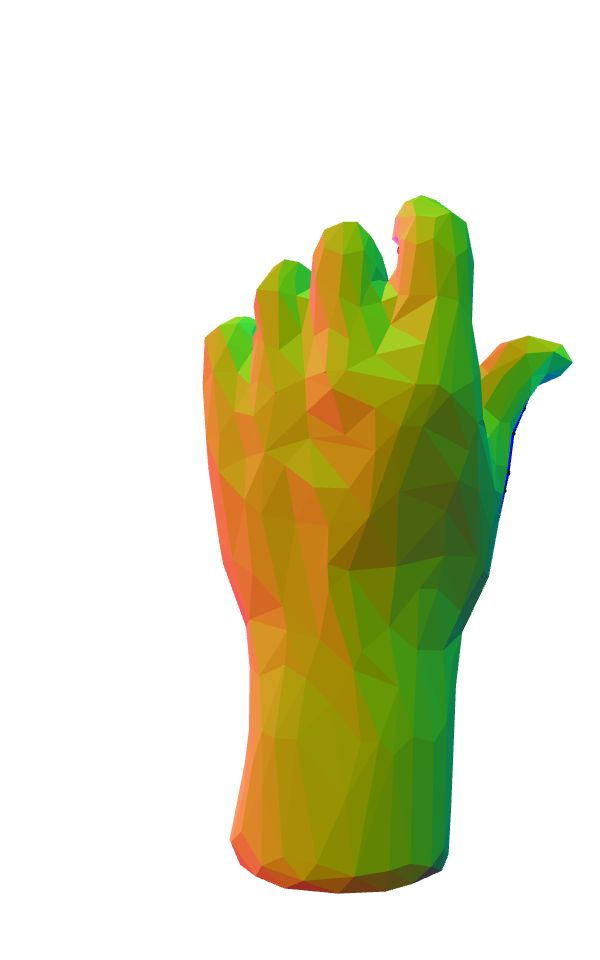

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand upright; ring-pinky fingers crooked down; index-middle fingers separated
correct pic:


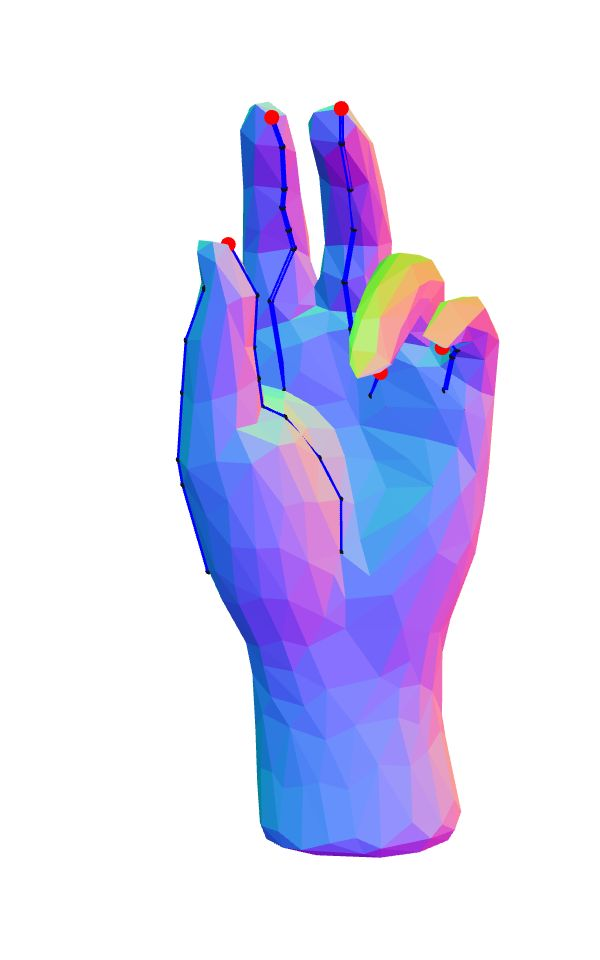

guessed pic:
fit: 1.8328513356347411


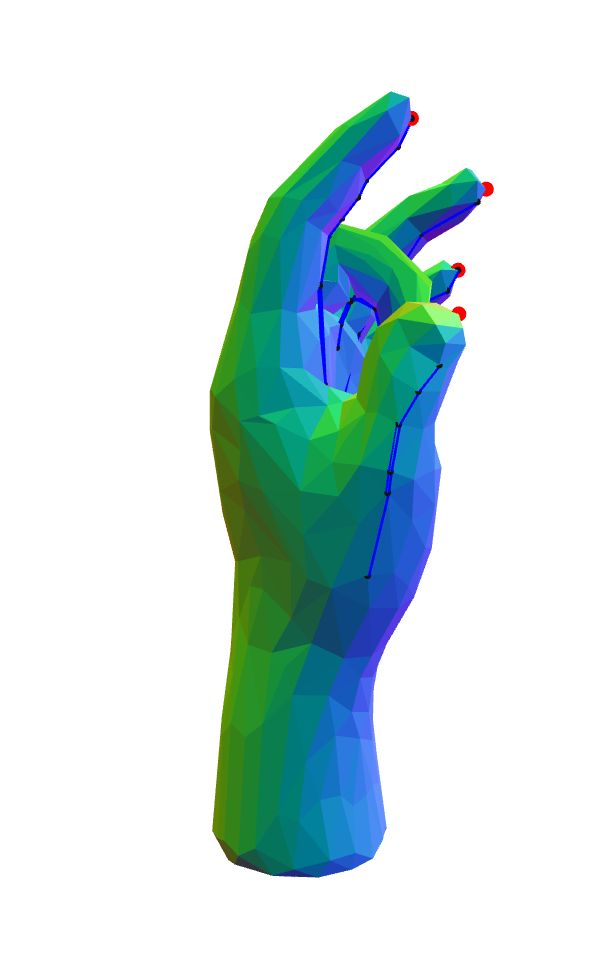

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
fingers bent toward palm
correct pic:


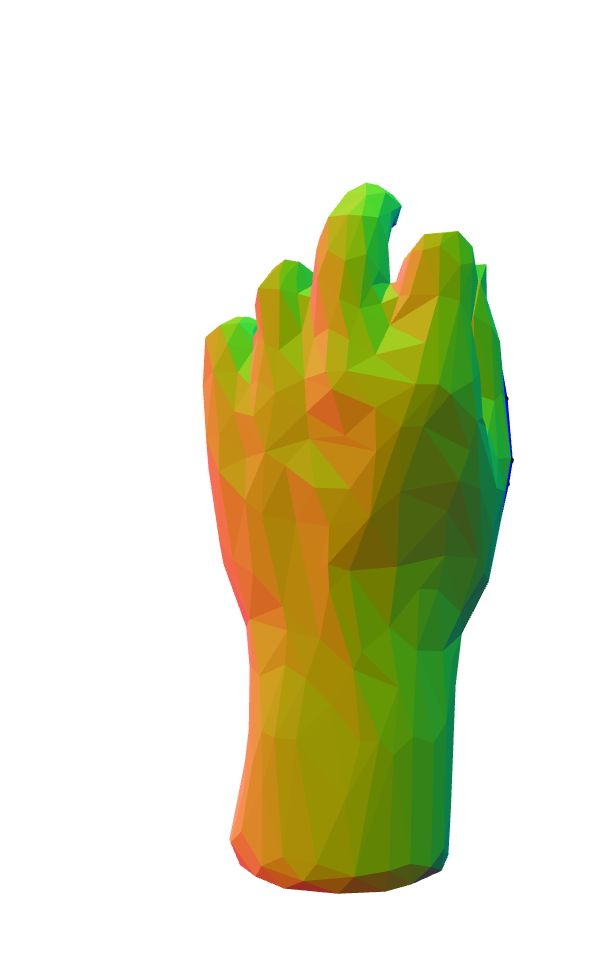

guessed pic:
fit: 1.1691654116897734


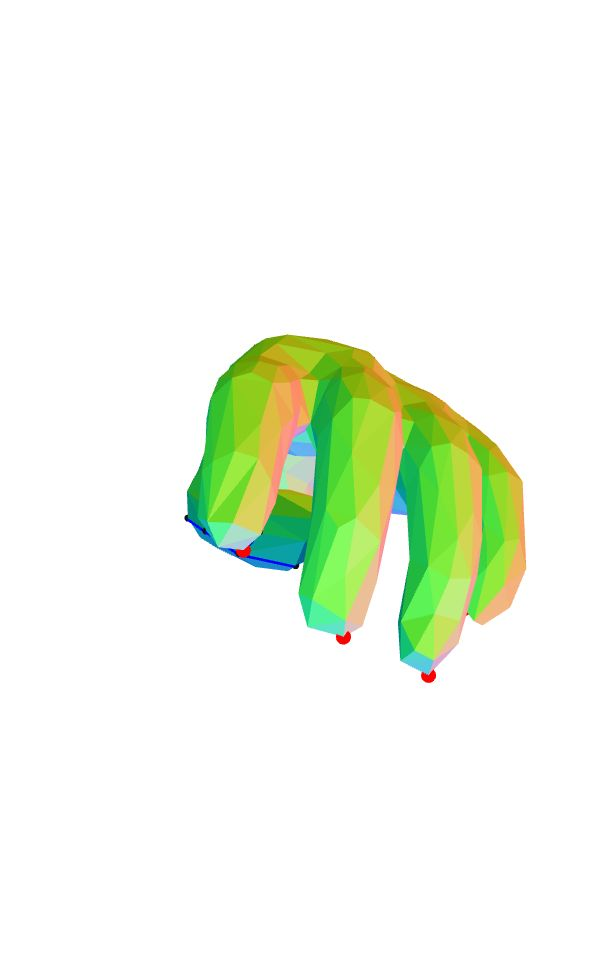

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Mid grasp with the pointer finger; middle finger and thumb
correct pic:


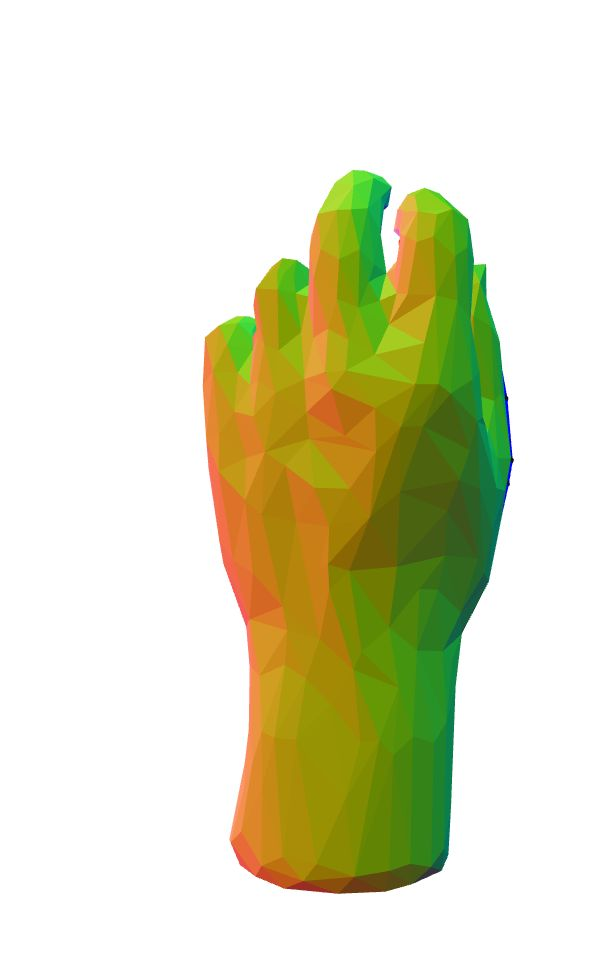

guessed pic:
fit: 0.8957871416582486


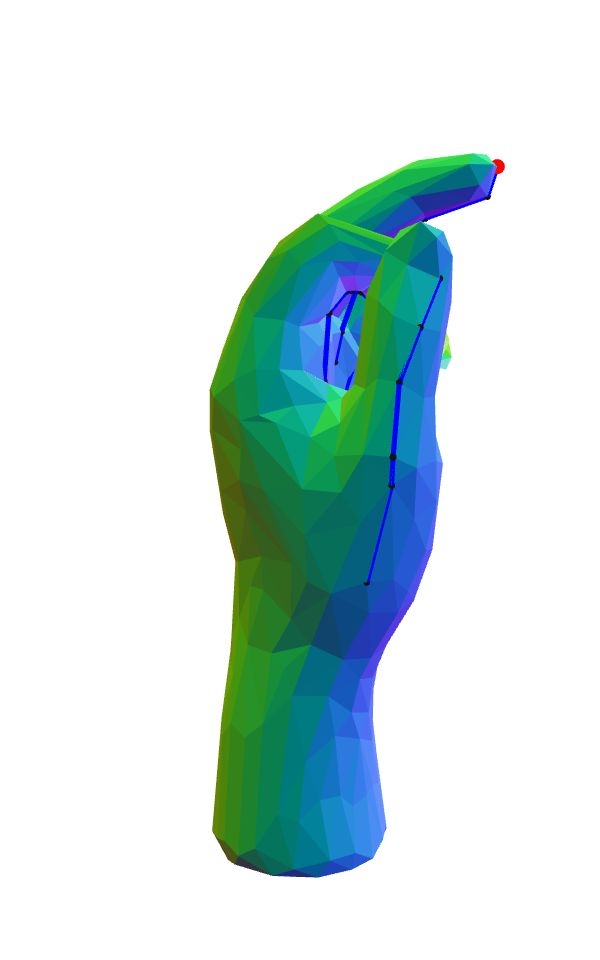

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Ring-Finger Test
correct pic:


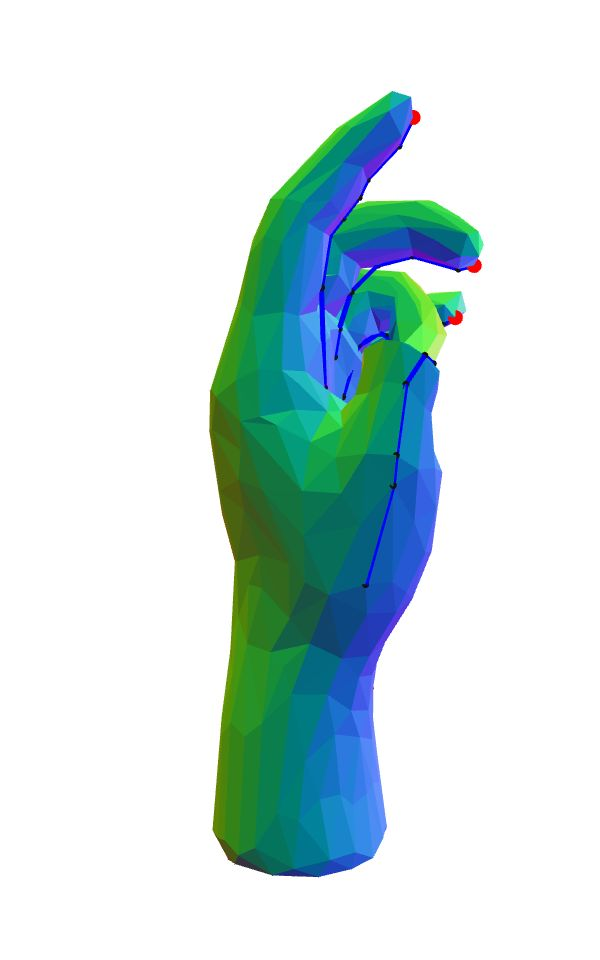

guessed pic:
fit: 0.7317617883507952


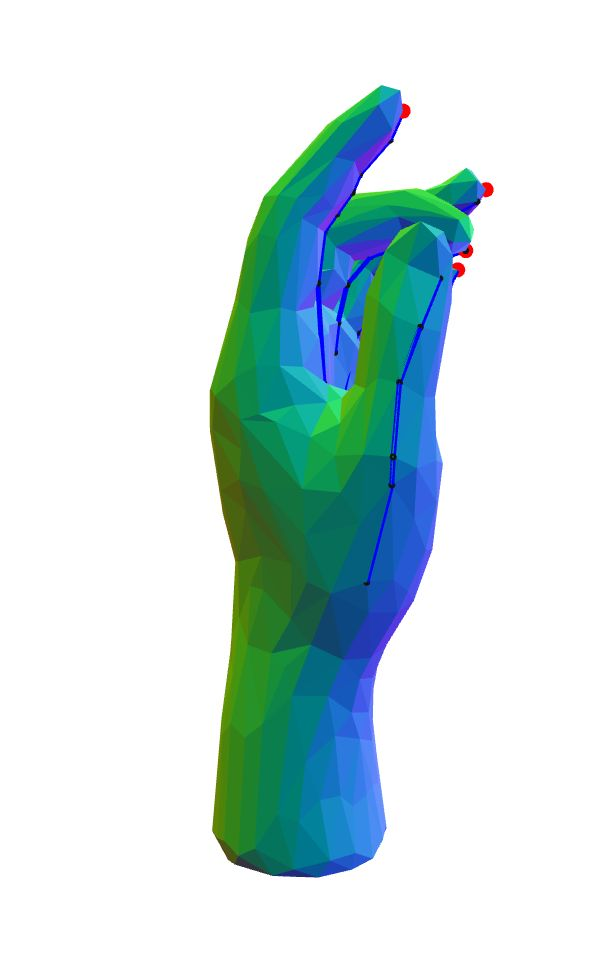

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
A pose as if you are holding something tiny between your thumb and index finger; like a pea.
correct pic:


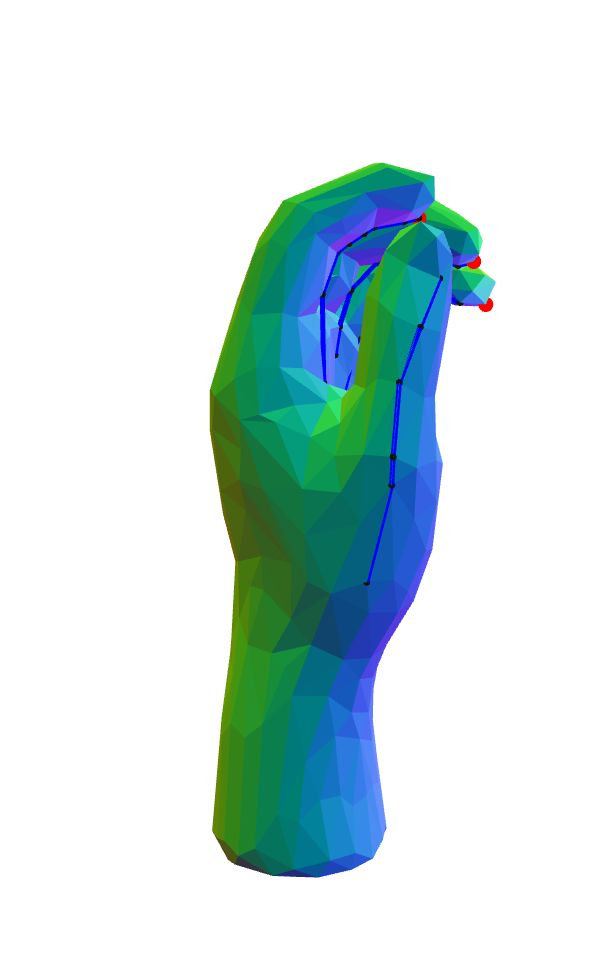

guessed pic:
fit: 3.3997737255465537


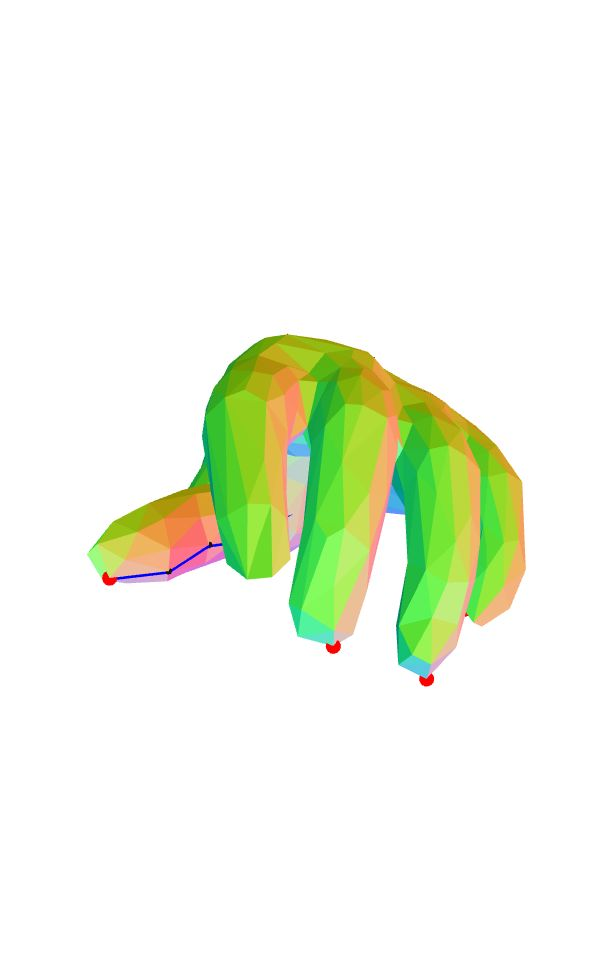

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand is in a relaxed position; with fingers curved and the index finger slightly higher.
correct pic:


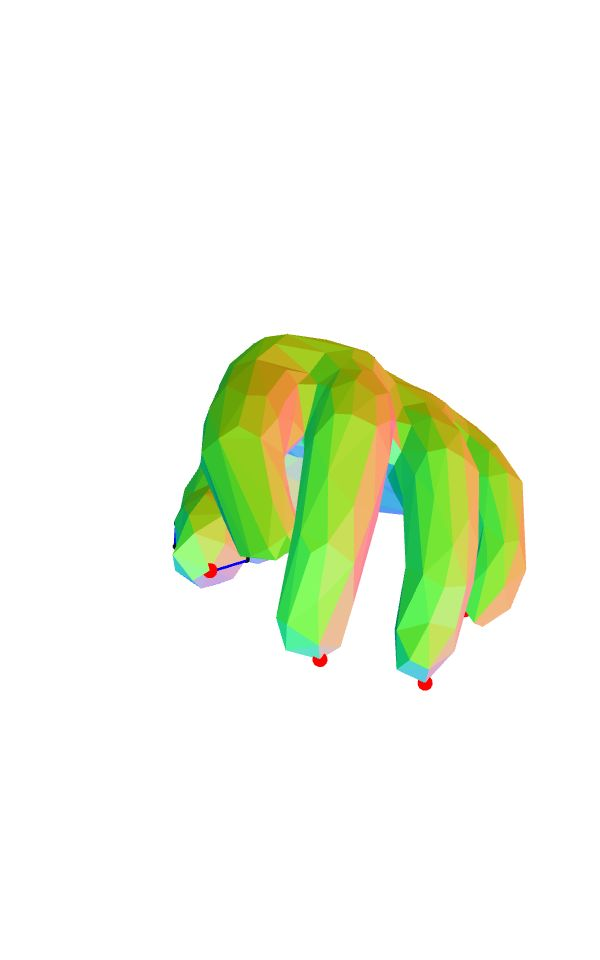

guessed pic:
fit: 2.2629875699309965


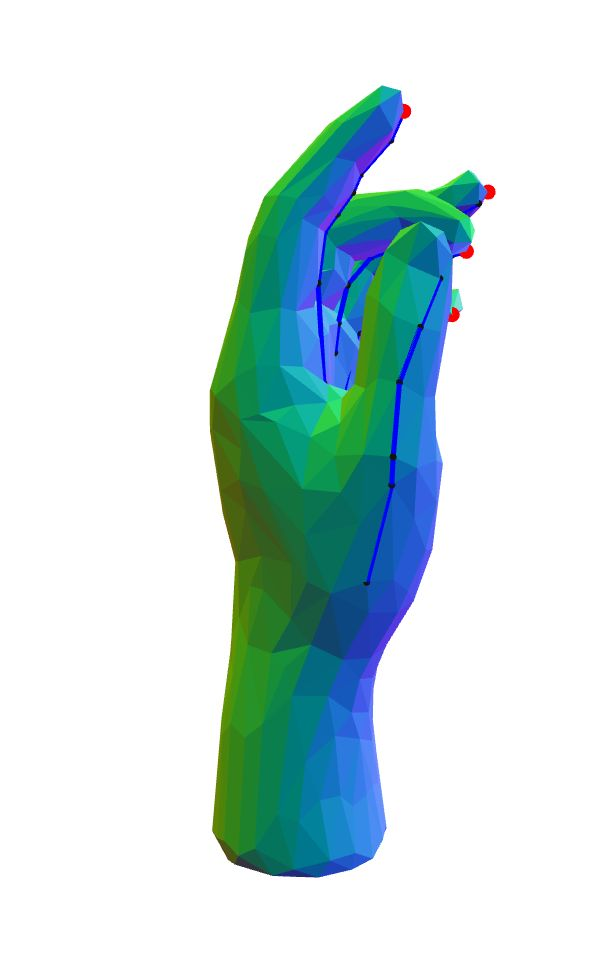

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand like an artistic features
correct pic:


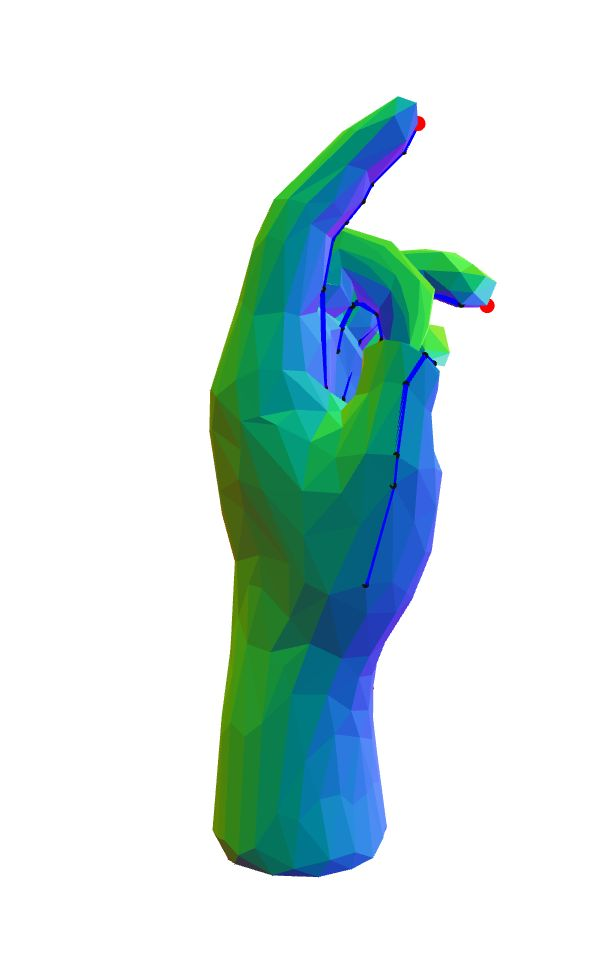

guessed pic:
fit: 0.8673167372730693


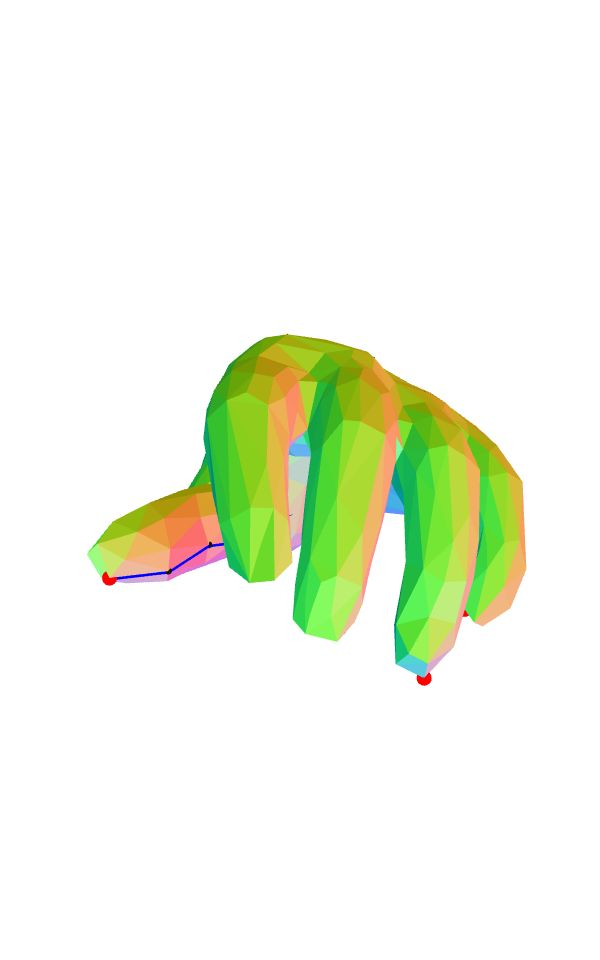

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand reaching forward
correct pic:


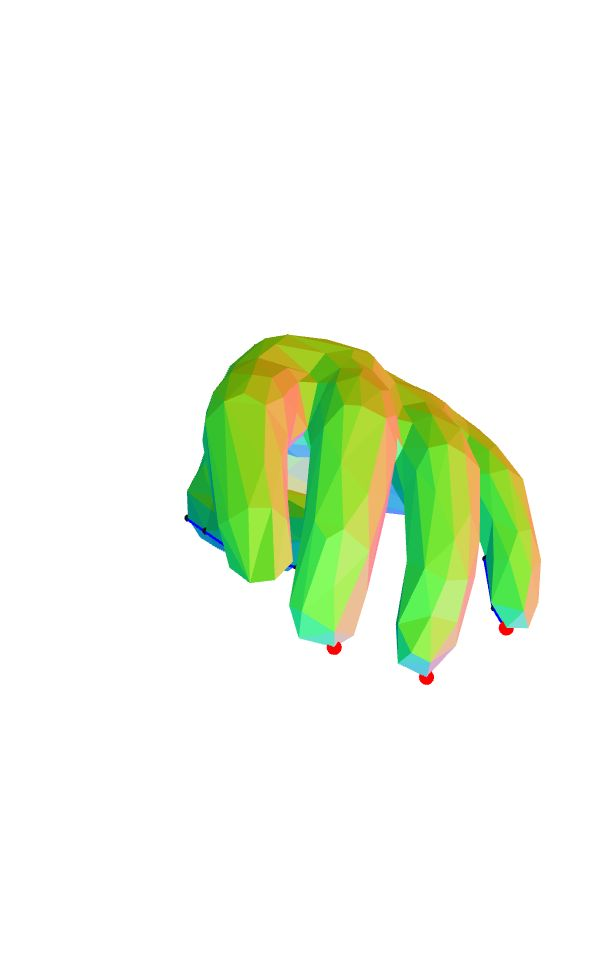

guessed pic:
fit: 0.8315359313779007


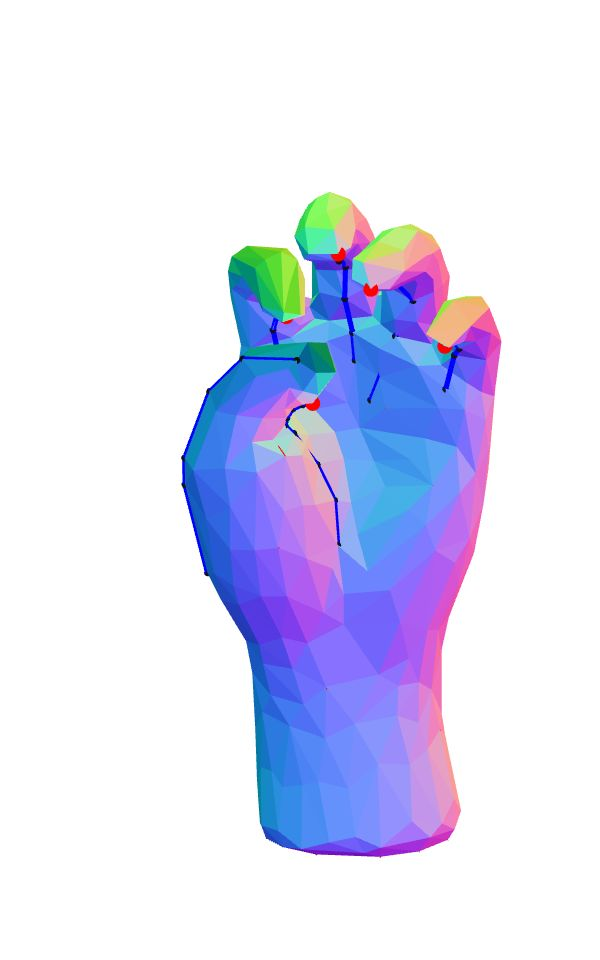

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Clutching hand in frustration and rage.
correct pic:


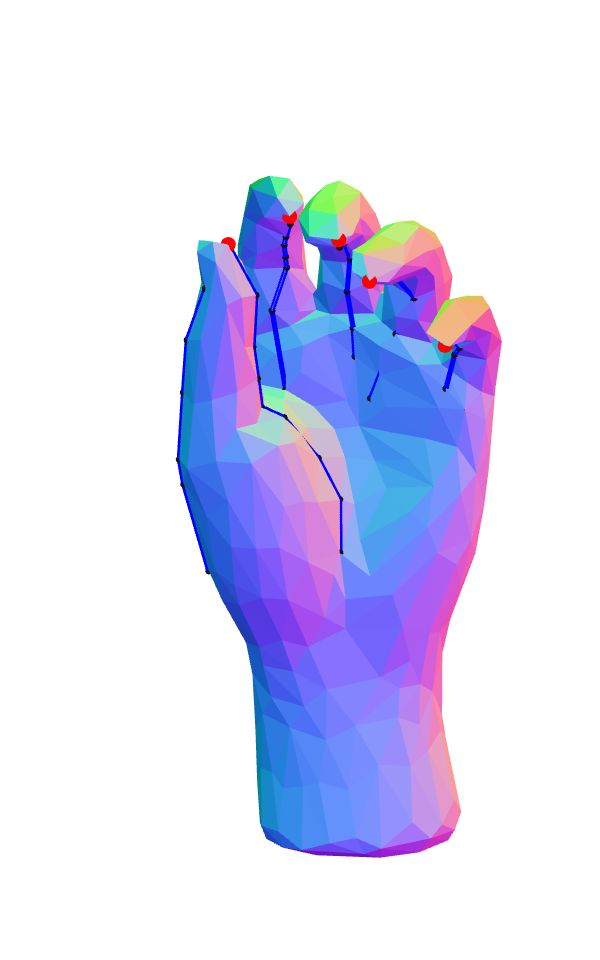

guessed pic:
fit: 0.6580127403195559


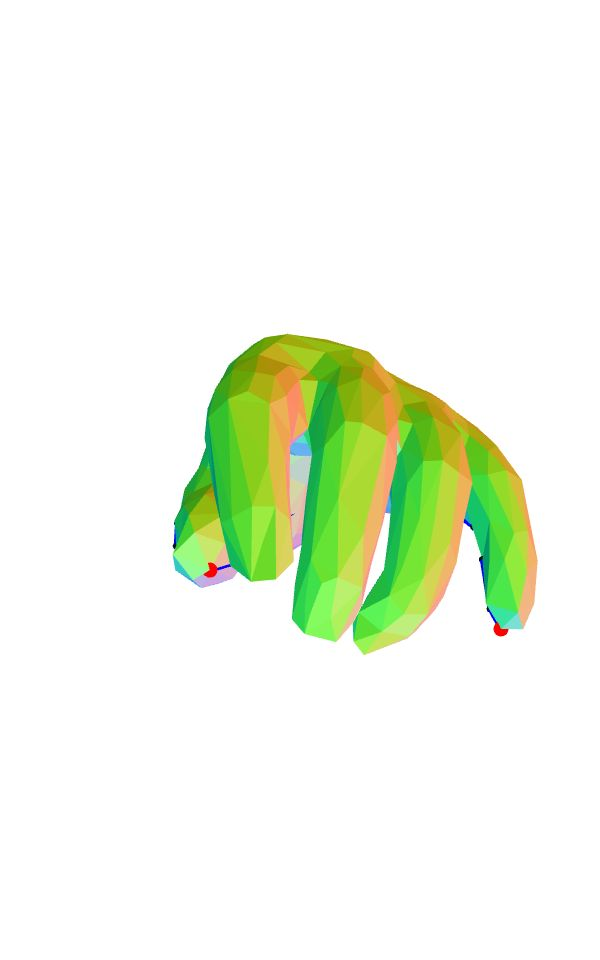

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
making an animal claw shape
correct pic:


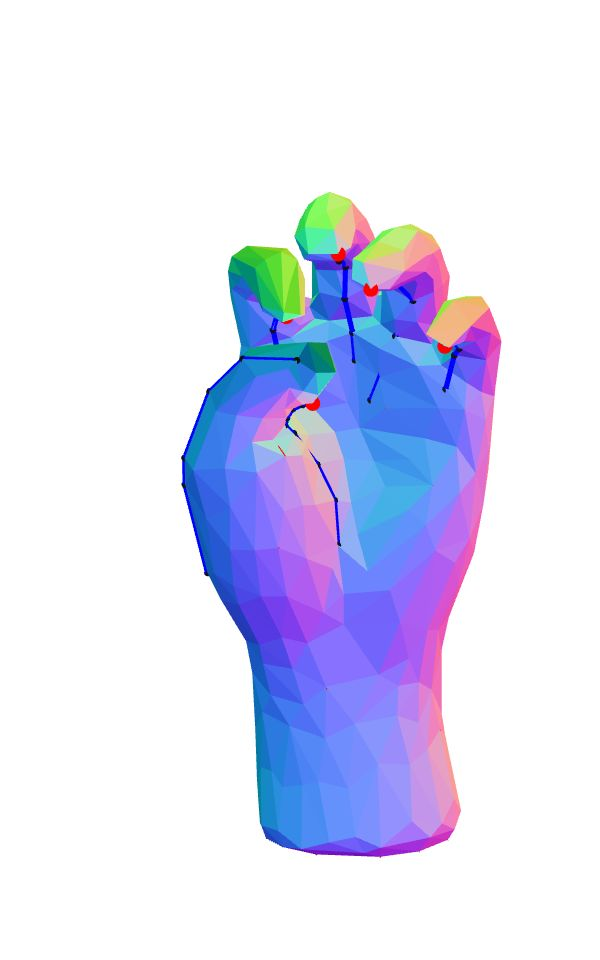

guessed pic:
fit: 1.4779016702585812


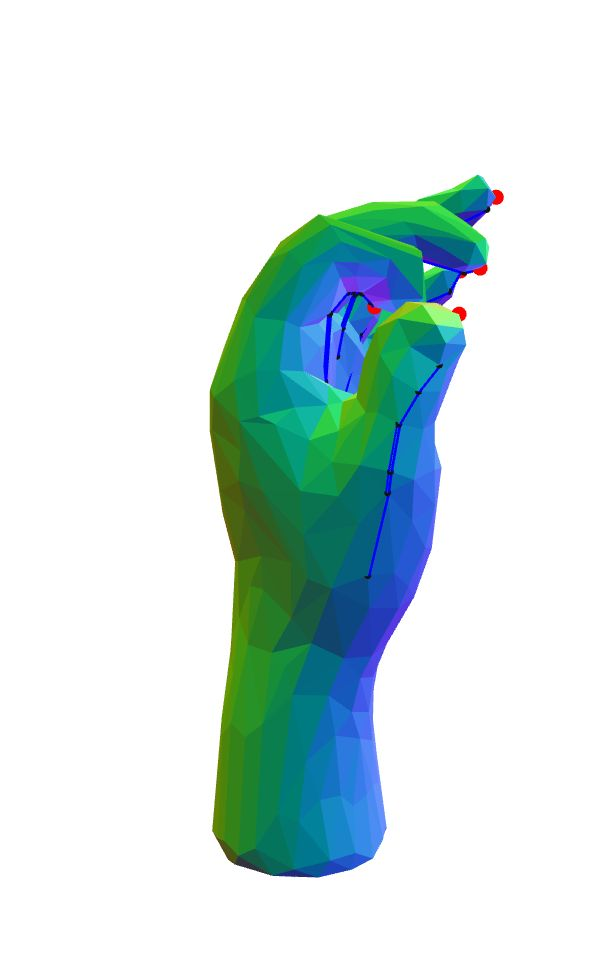

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
pulling something down towards you
correct pic:


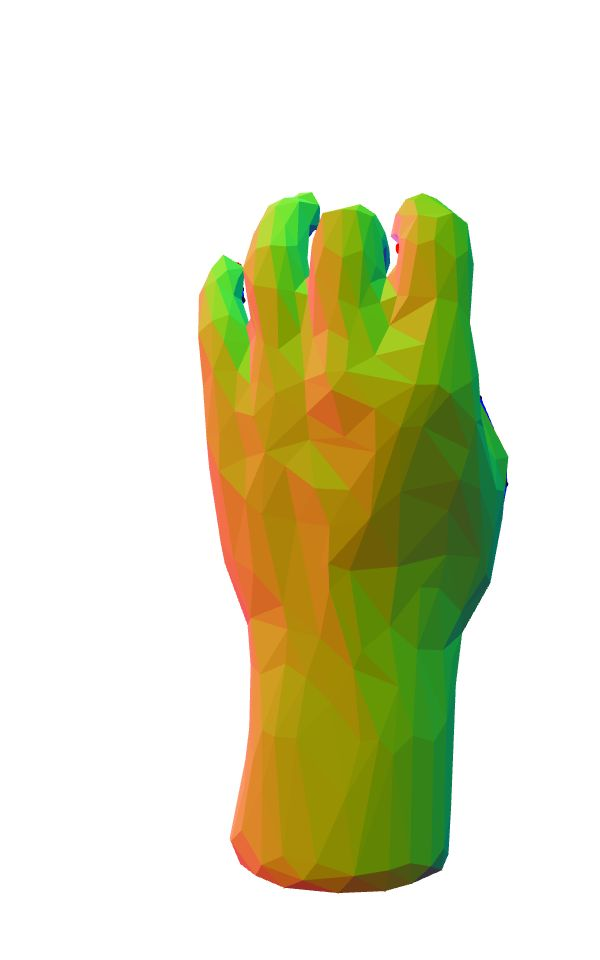

guessed pic:
fit: 1.8234693822527033


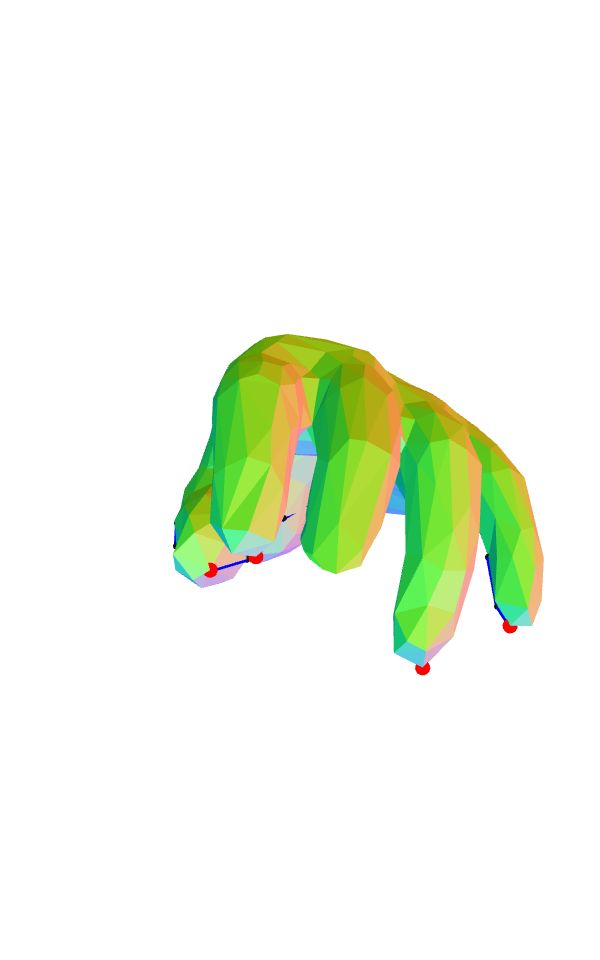

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Move out
correct pic:


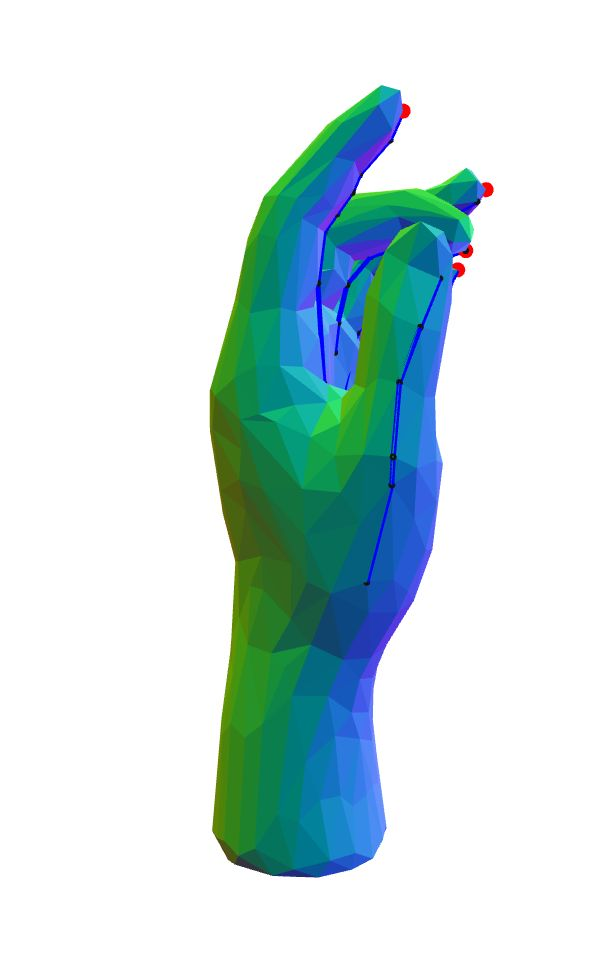

guessed pic:
fit: 0.4000507385858814


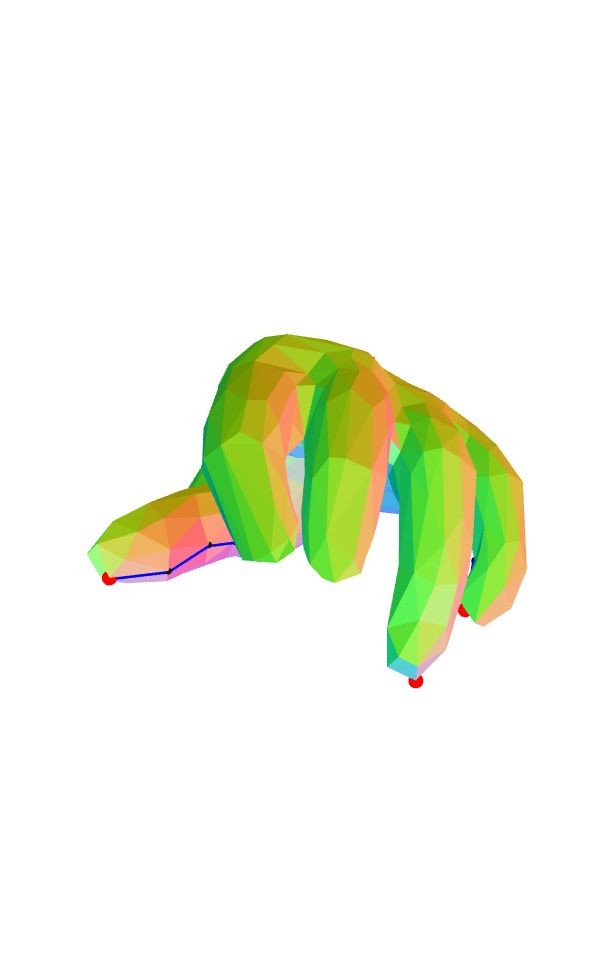

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
a hand gripping a bar
correct pic:


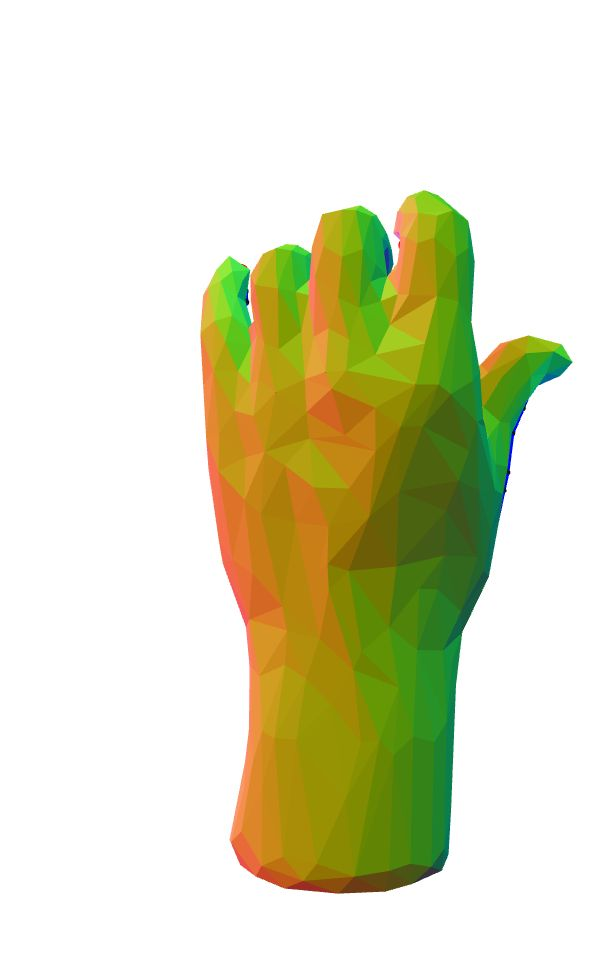

guessed pic:
fit: 0.8362064211033675


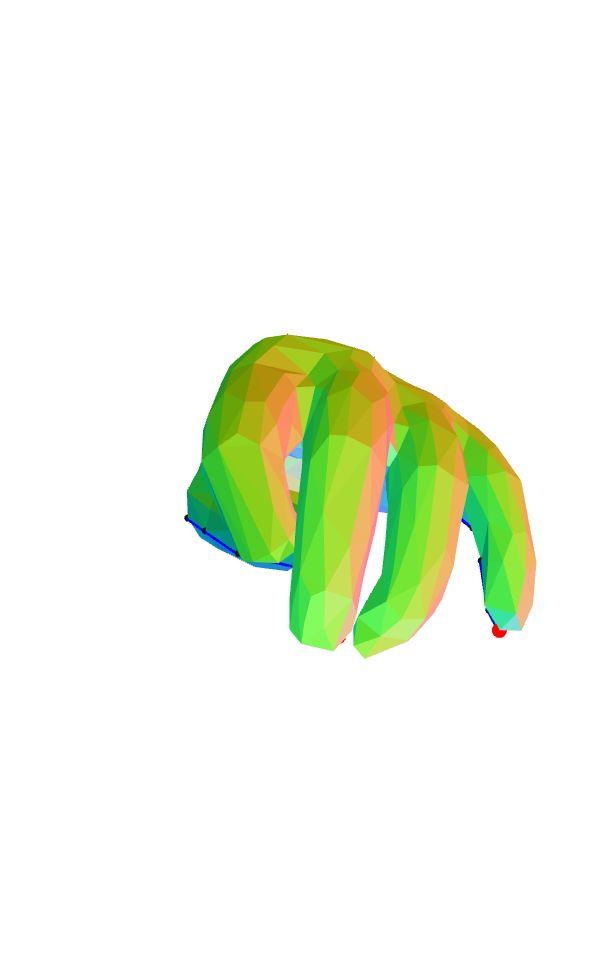

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
This hand looks like it's about to point or to make the number 1.
correct pic:


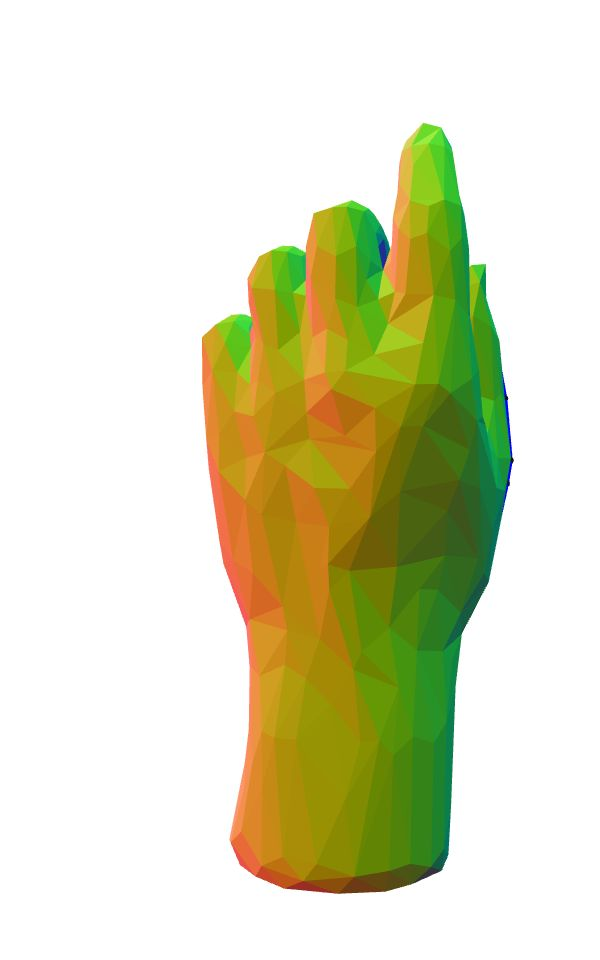

guessed pic:
fit: 2.859466368549913


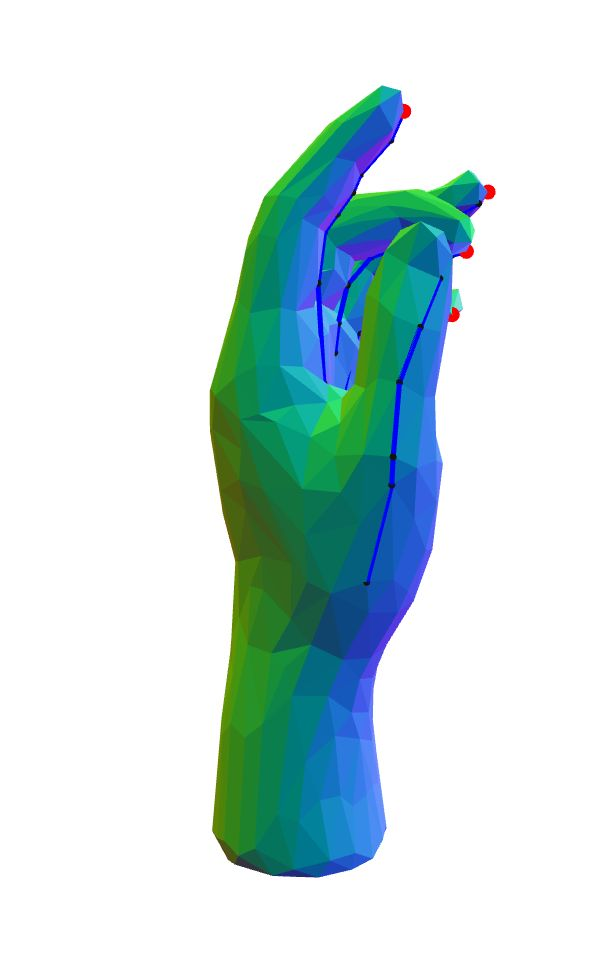

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Acleft hand with three fingers and a thumb extended while the pinky is curved in.
correct pic:


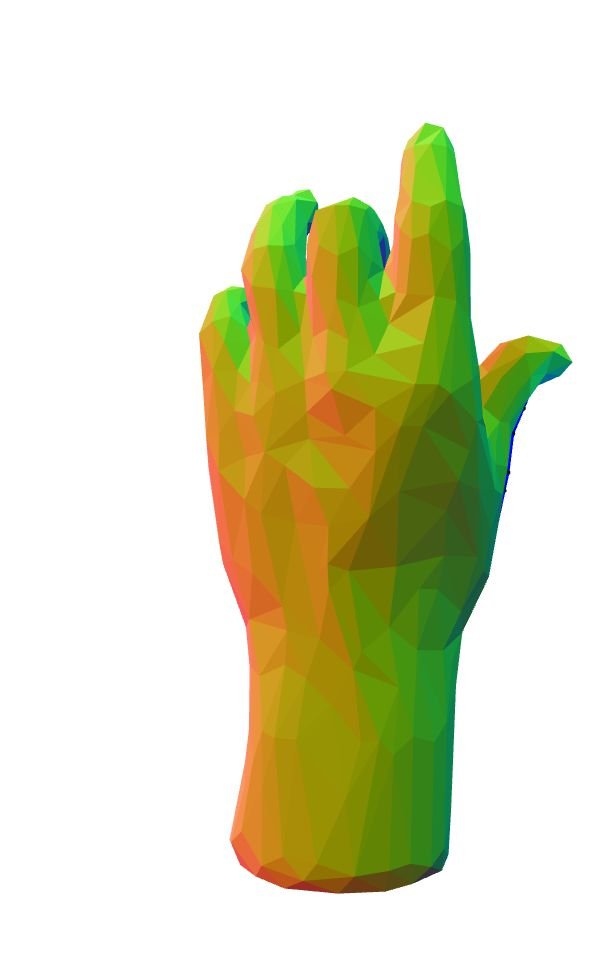

guessed pic:
fit: 2.5890587367533366


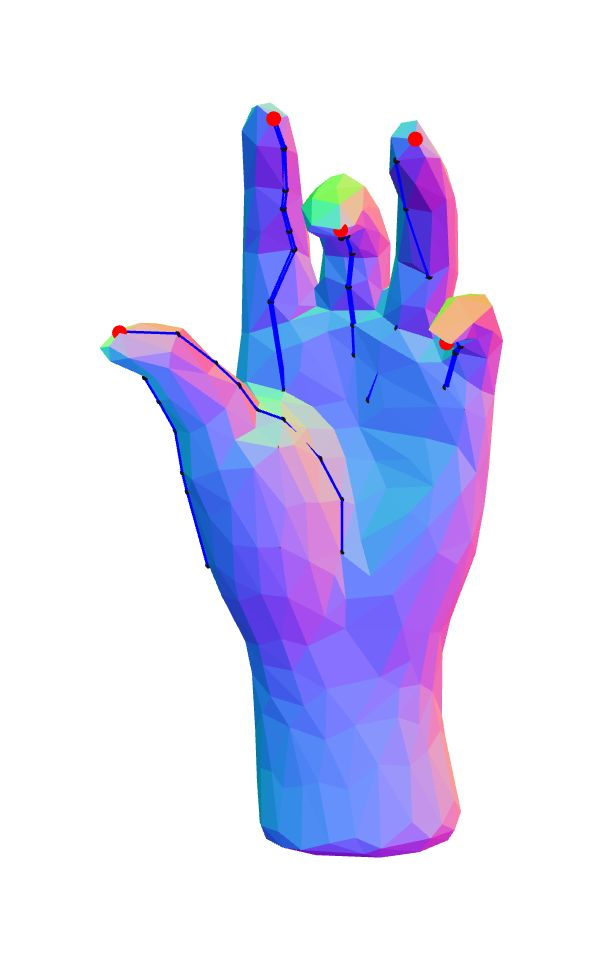

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand open with index and ring curled
correct pic:


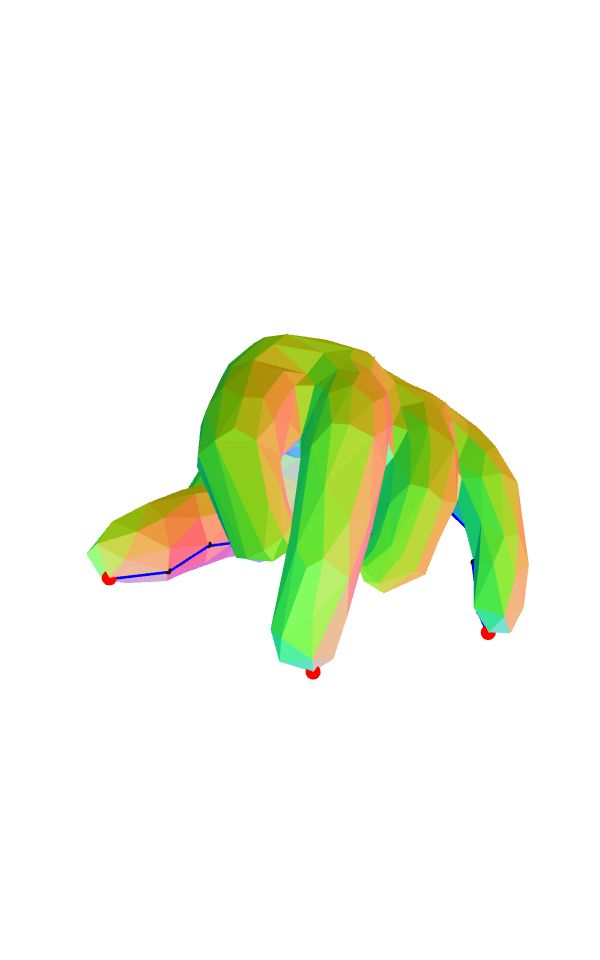

guessed pic:
fit: 1.1861881150494145


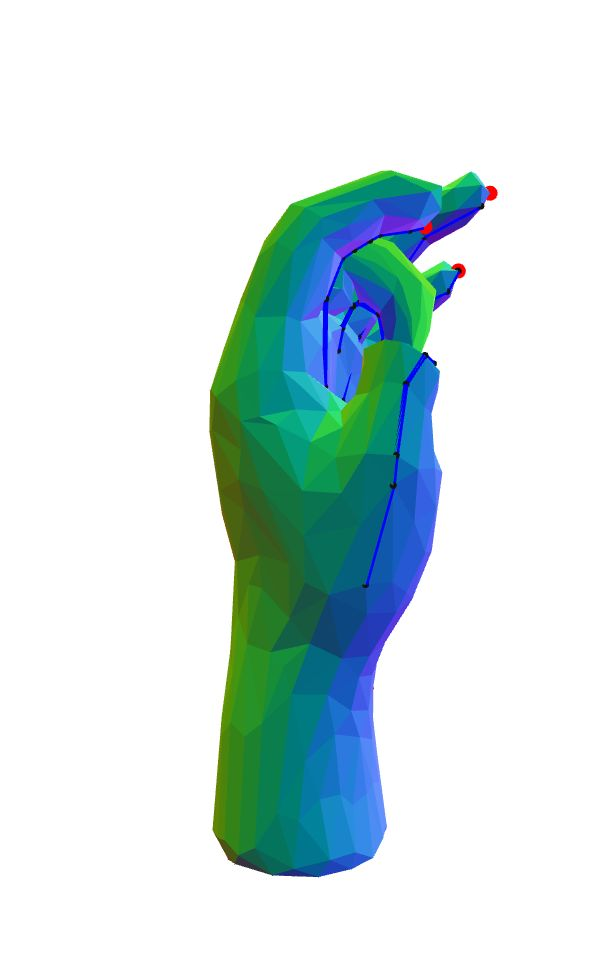

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
front of left hadn with pointer finger curled down and 3 fingers slightly standing up
correct pic:


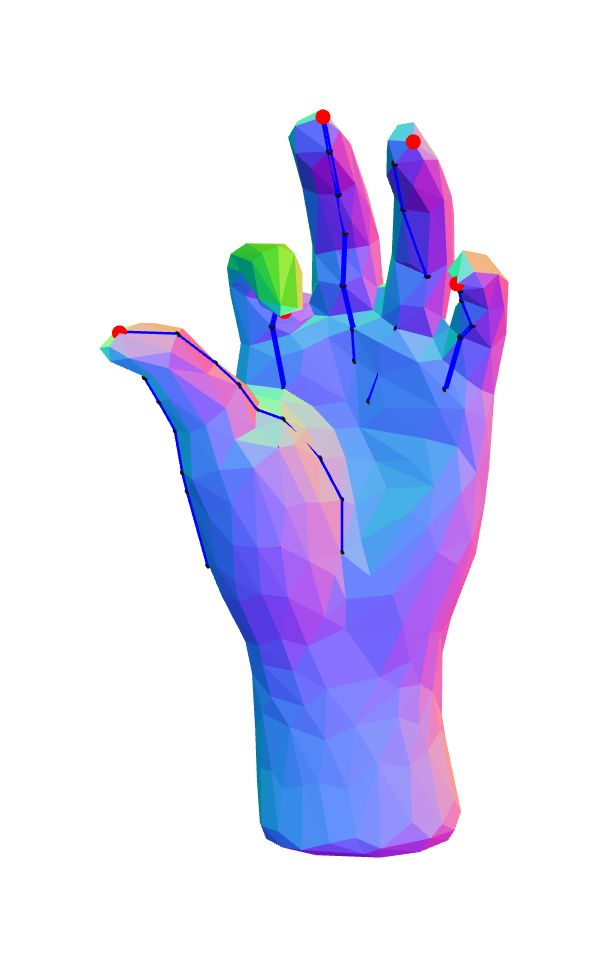

guessed pic:
fit: 2.8026830009224835


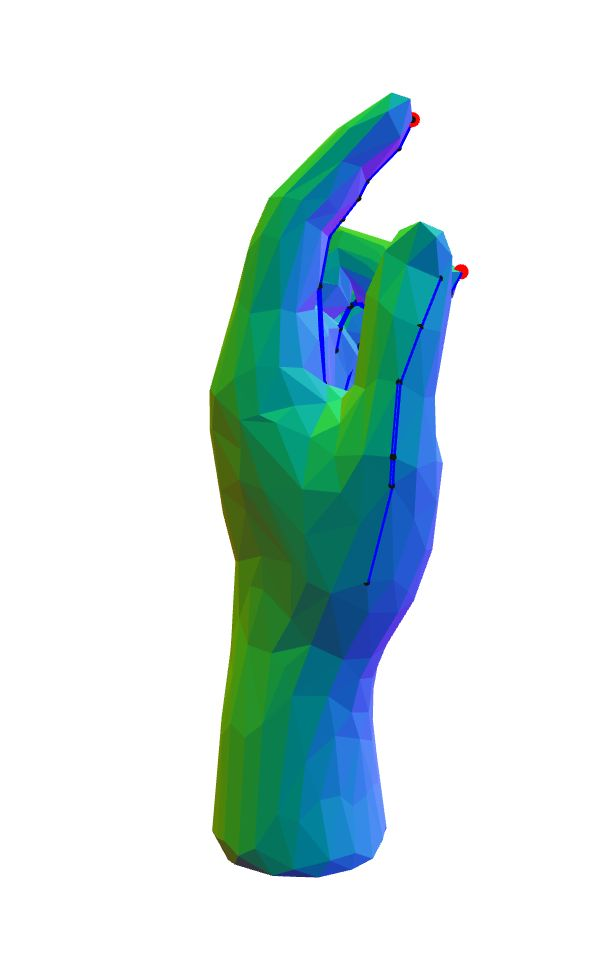

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
All fingers bent at the big knuckle.
correct pic:


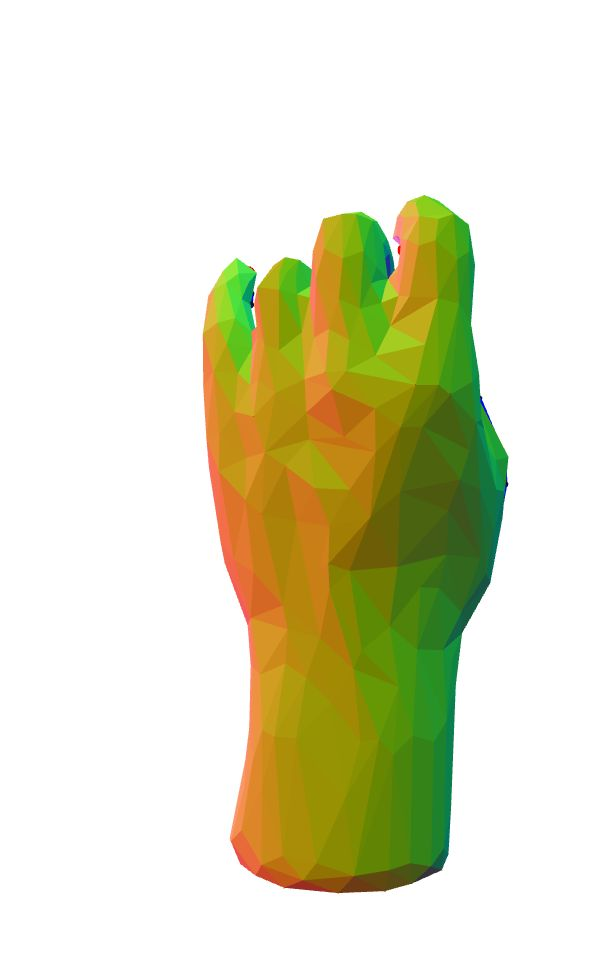

guessed pic:
fit: 1.7206828386708217


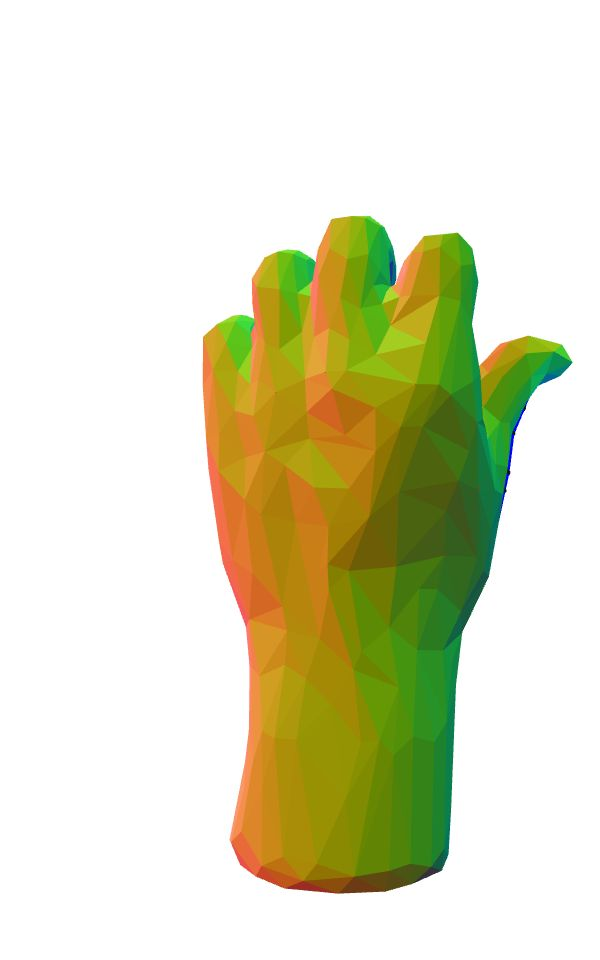

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
relaxed hand without fingers touching
correct pic:


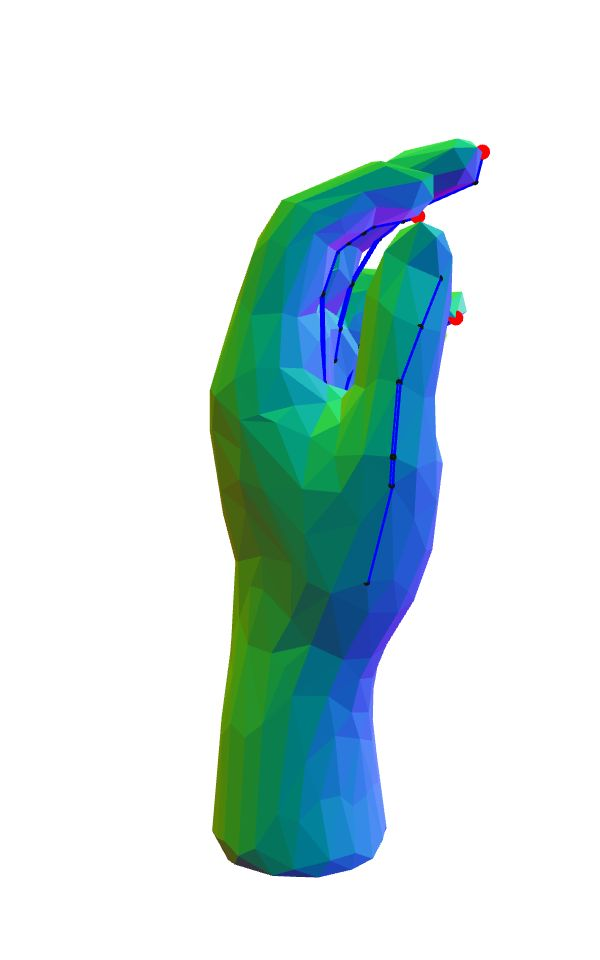

guessed pic:
fit: 1.413049135496124


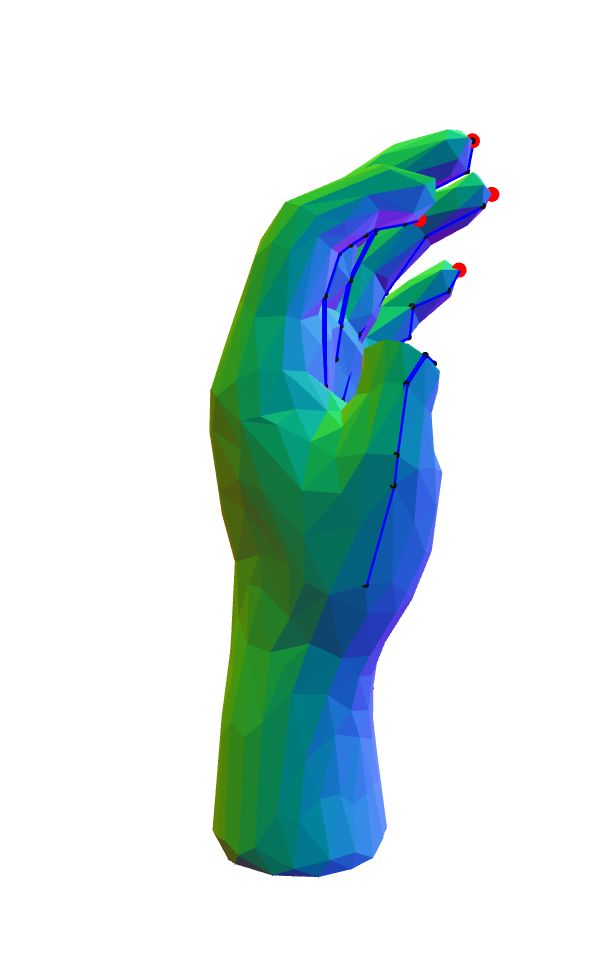

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
scratching
correct pic:


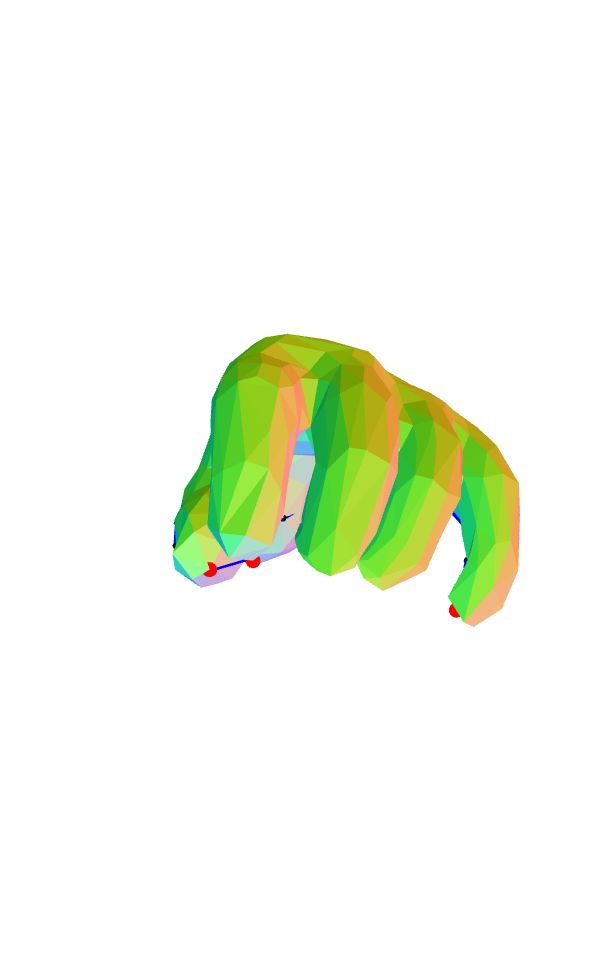

guessed pic:
fit: 0.506716105087669


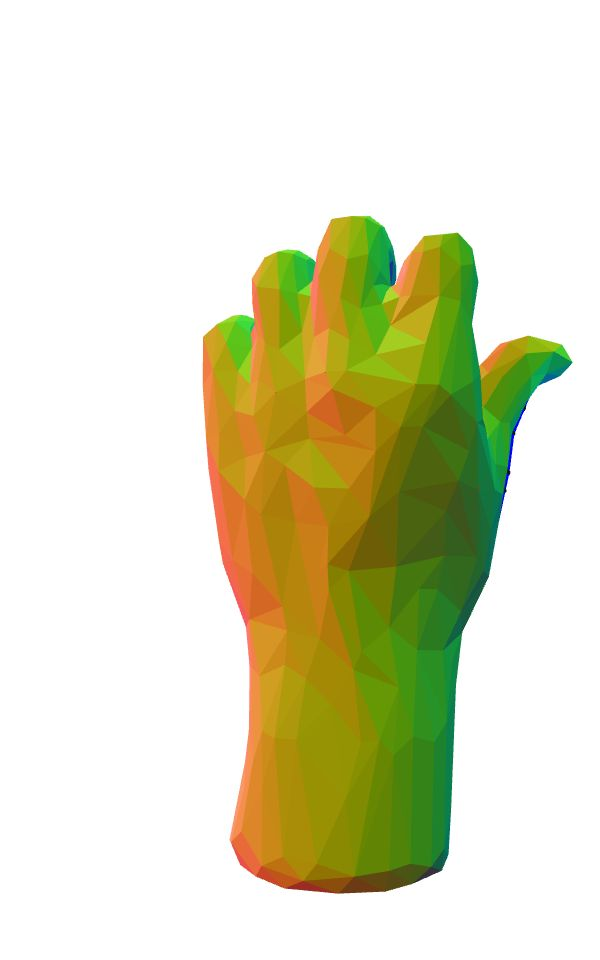

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
All fingers slightly bent with thumb touching ring finger at tips.
correct pic:


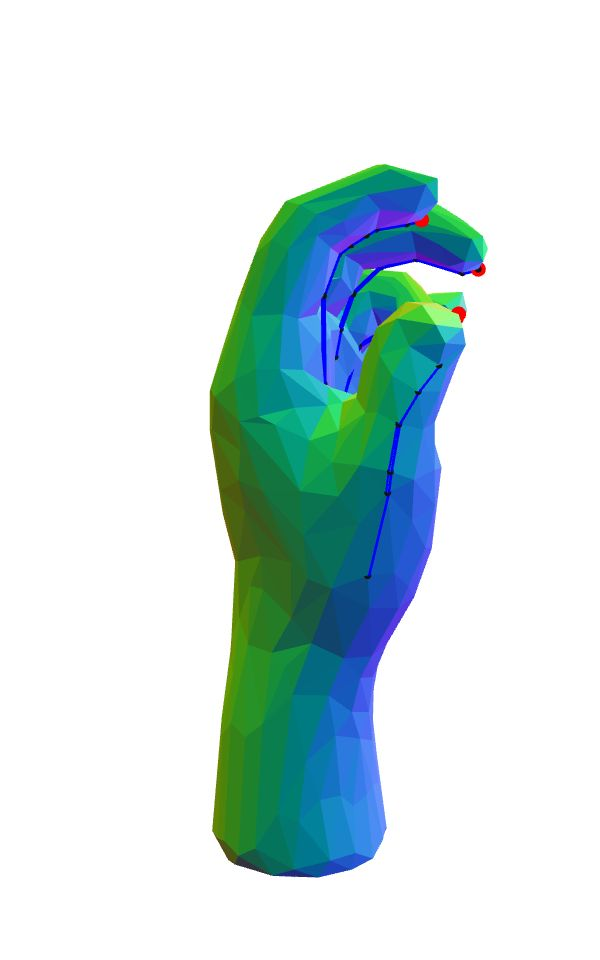

guessed pic:
fit: 2.1037026767760687


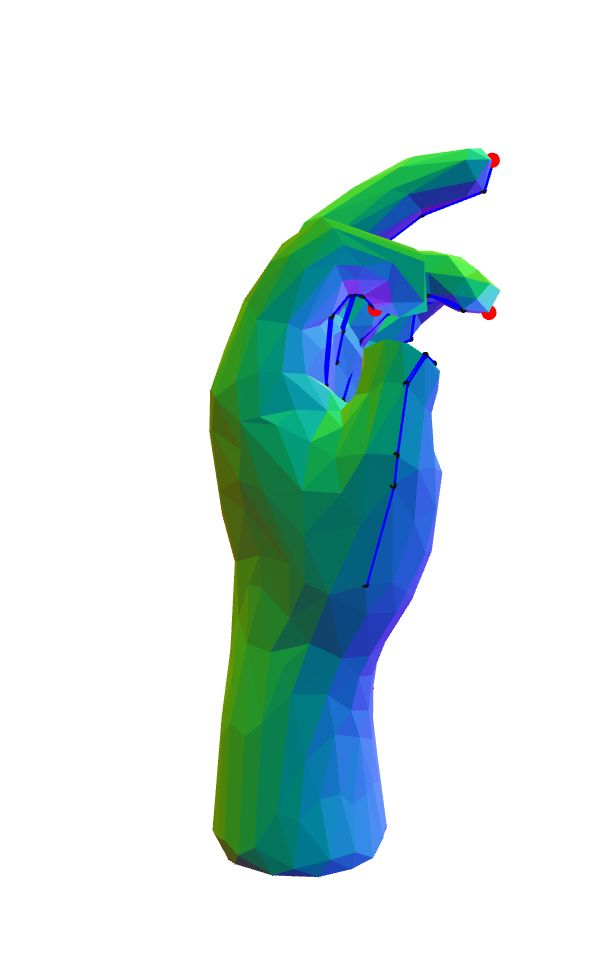

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Wait
correct pic:


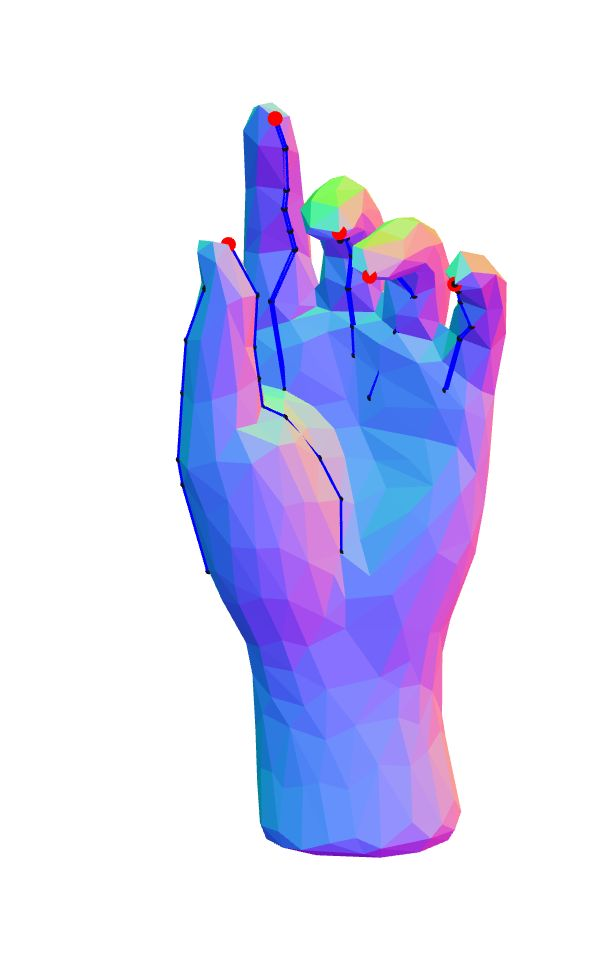

guessed pic:
fit: 0.3978395661345684


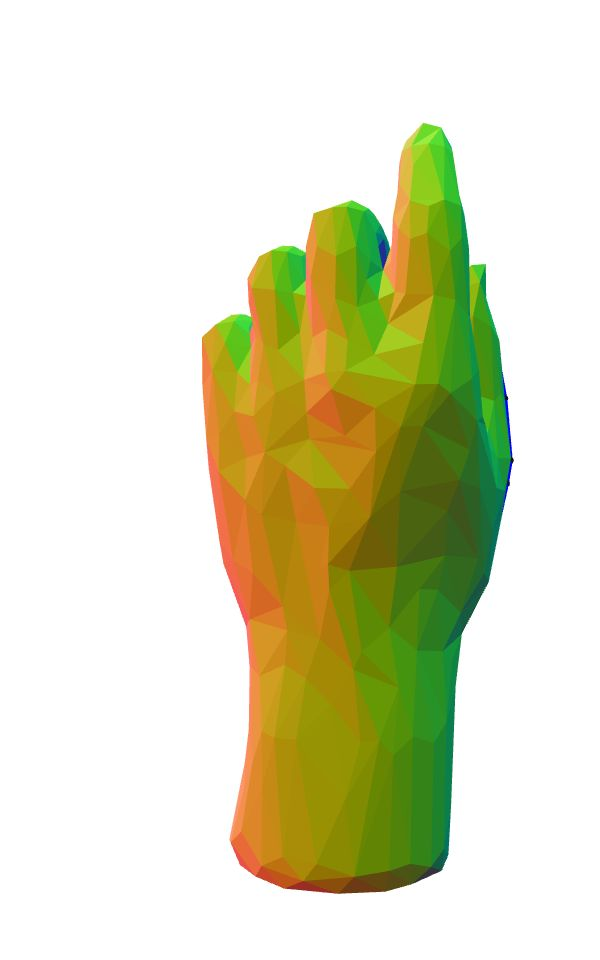

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
playing guitar hand
correct pic:


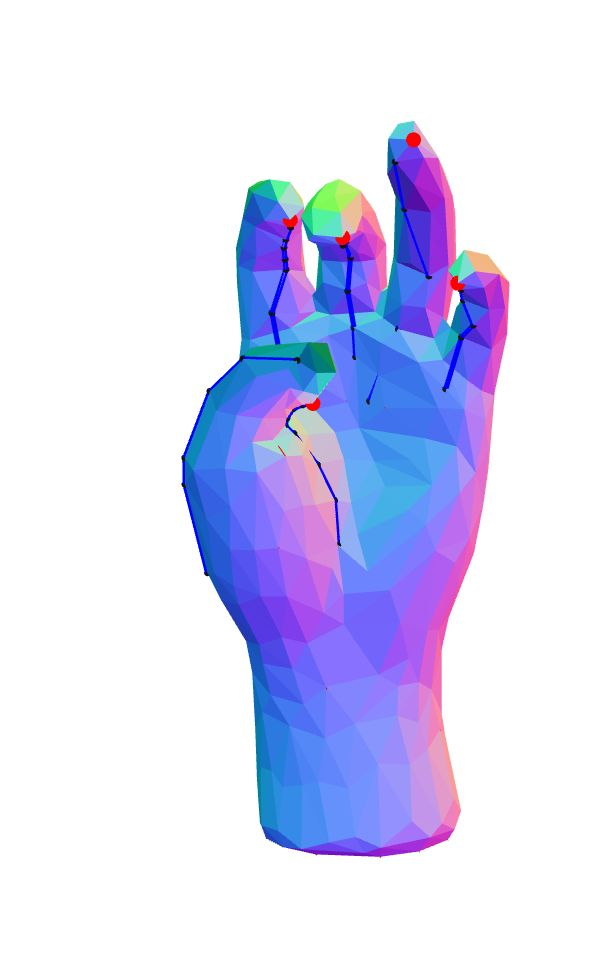

guessed pic:
fit: 0.7398252248759547


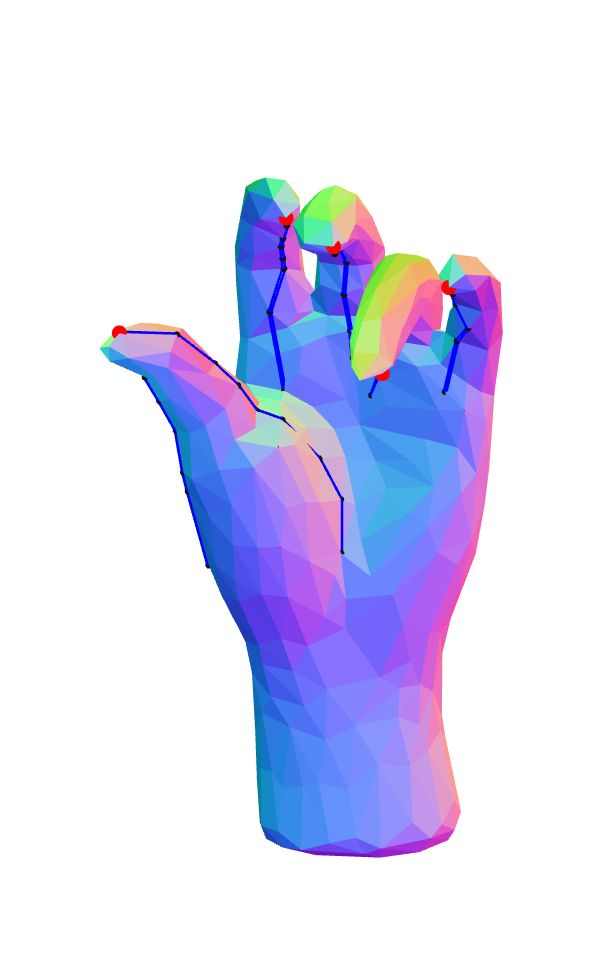

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
It shows like holding a cycle handle
correct pic:


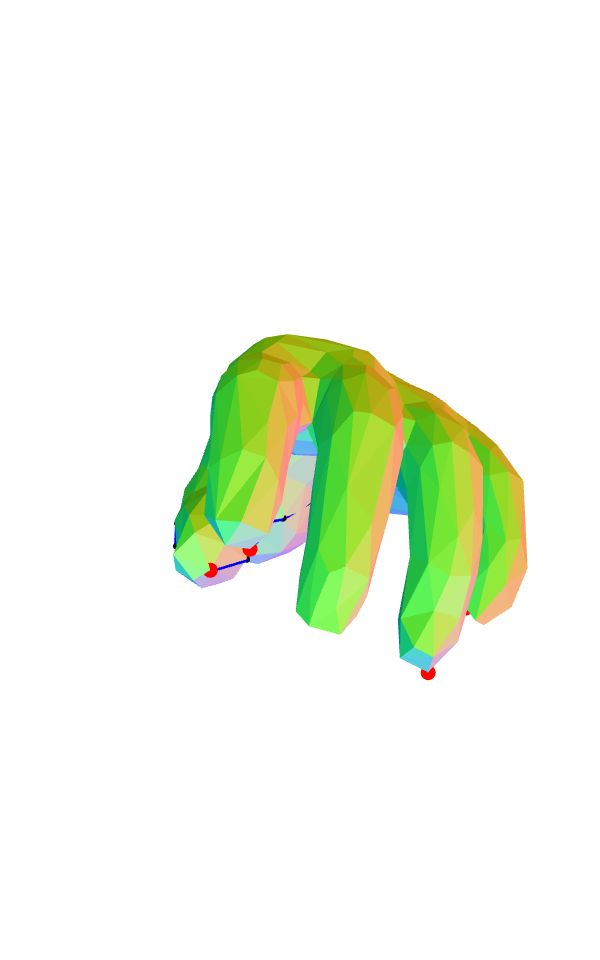

guessed pic:
fit: 1.7941338221094973


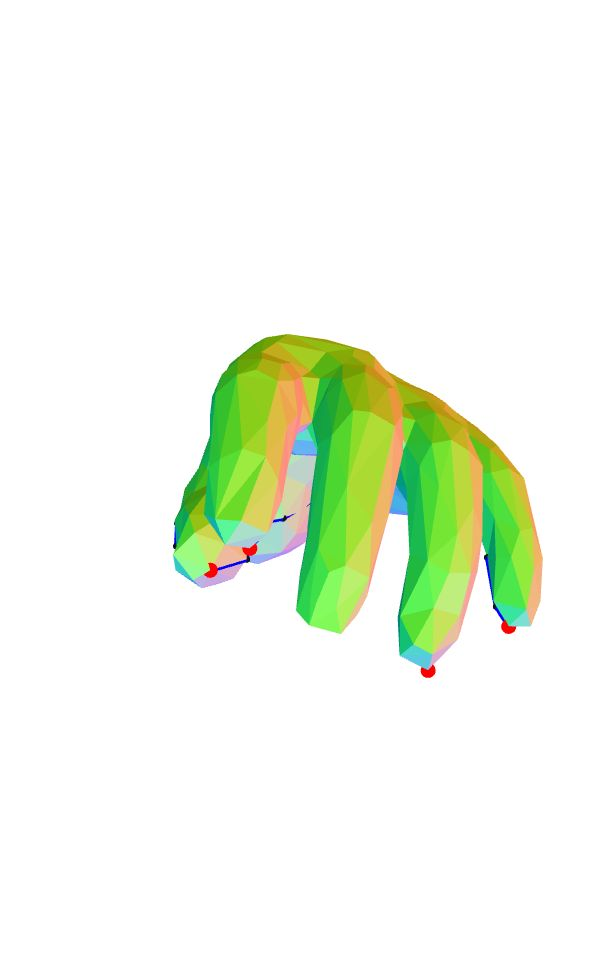

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Grab
correct pic:


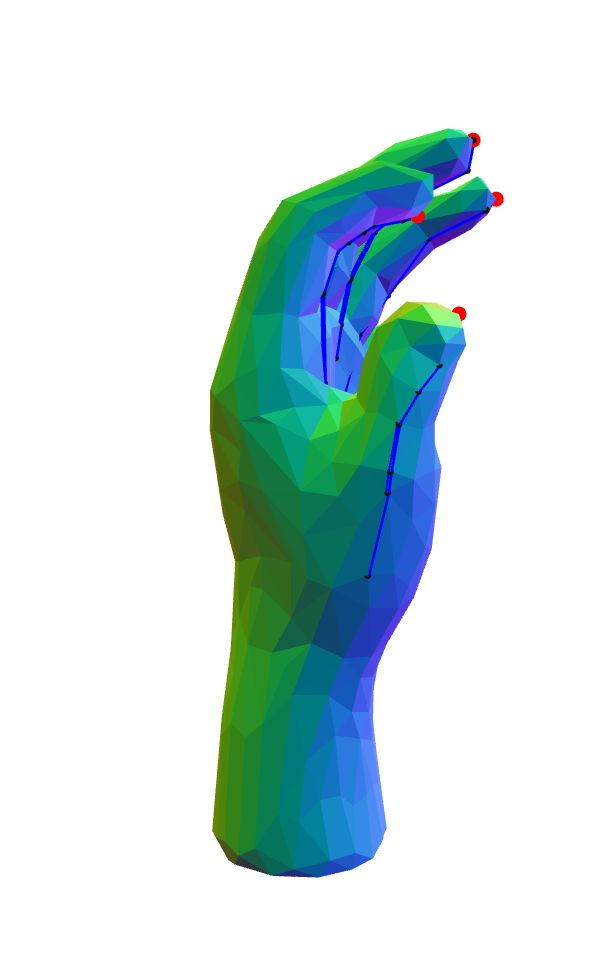

guessed pic:
fit: 0.28418293363368635


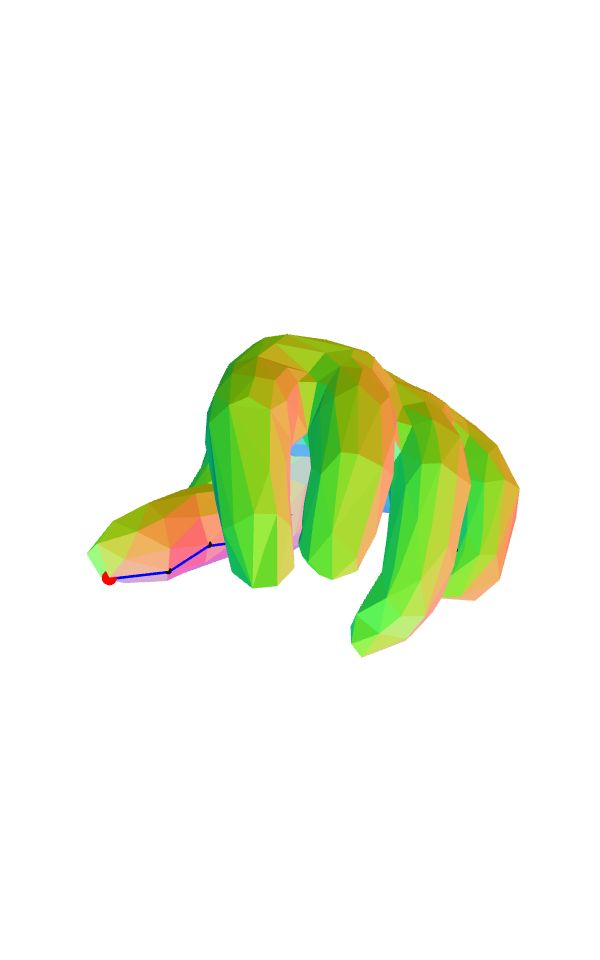

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
waving
correct pic:


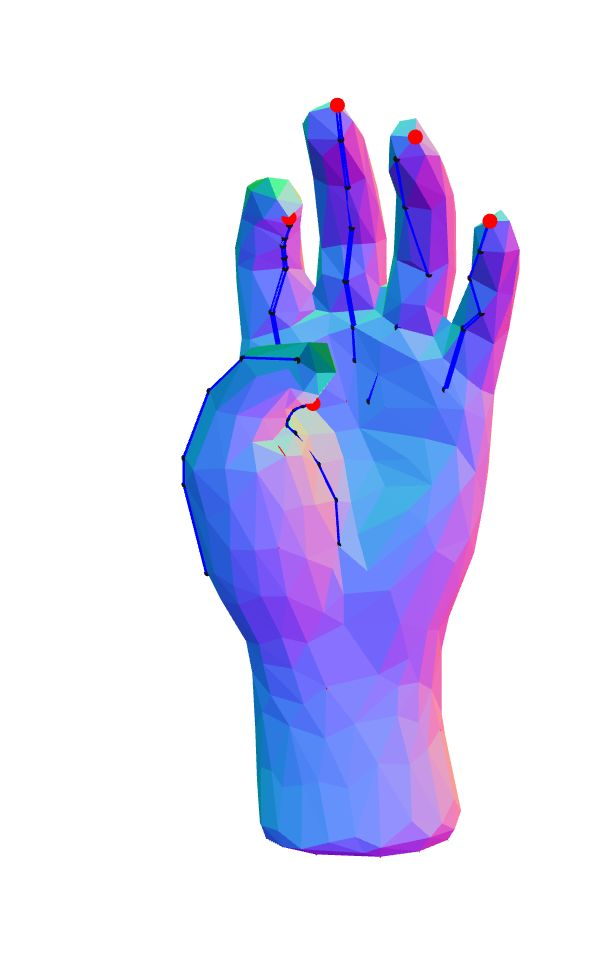

guessed pic:
fit: 0.19819233735842076


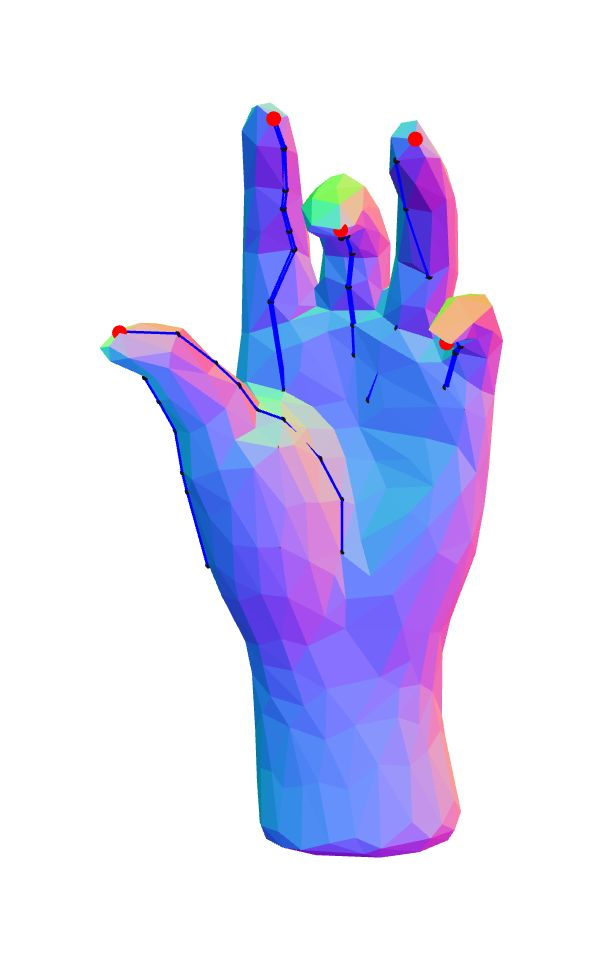

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
the thumb and index finger are touching
correct pic:


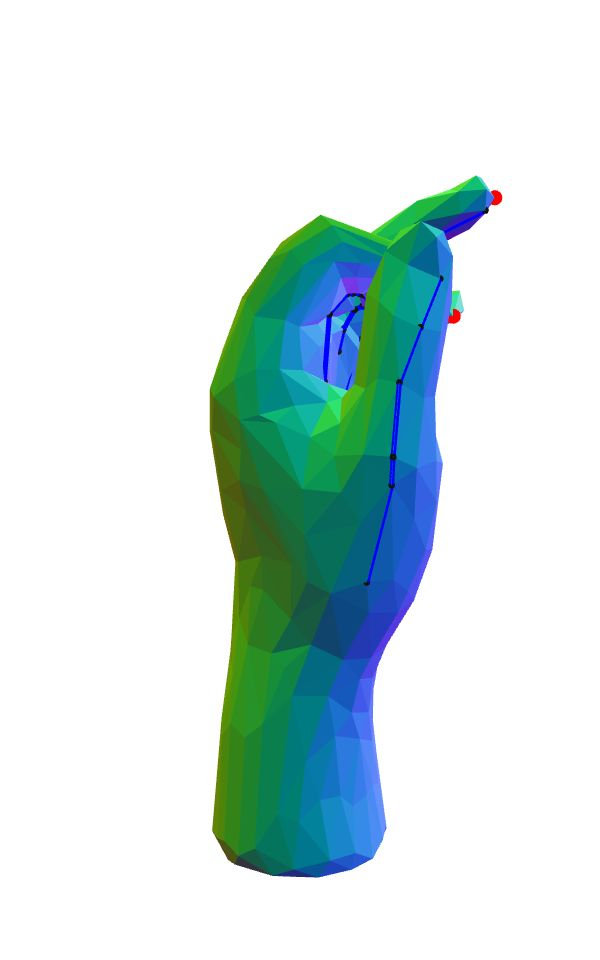

guessed pic:
fit: 0.8723668395679611


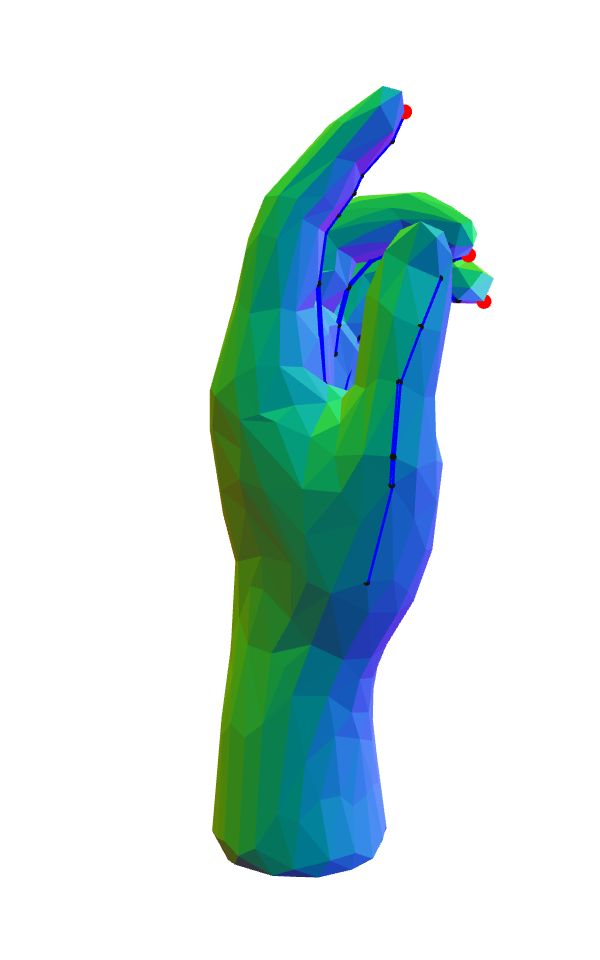

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
holding onto something
correct pic:


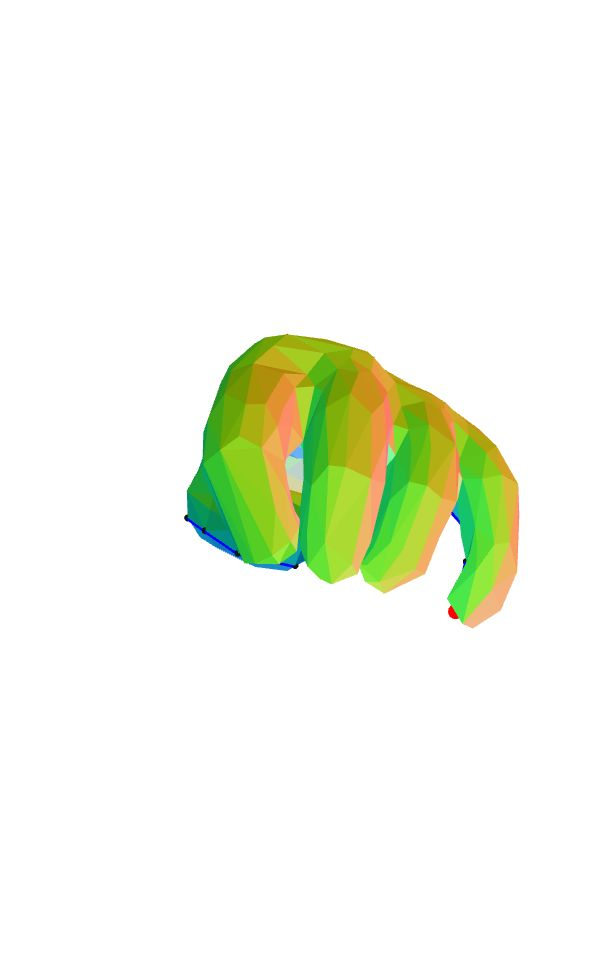

guessed pic:
fit: 1.2205500811927172


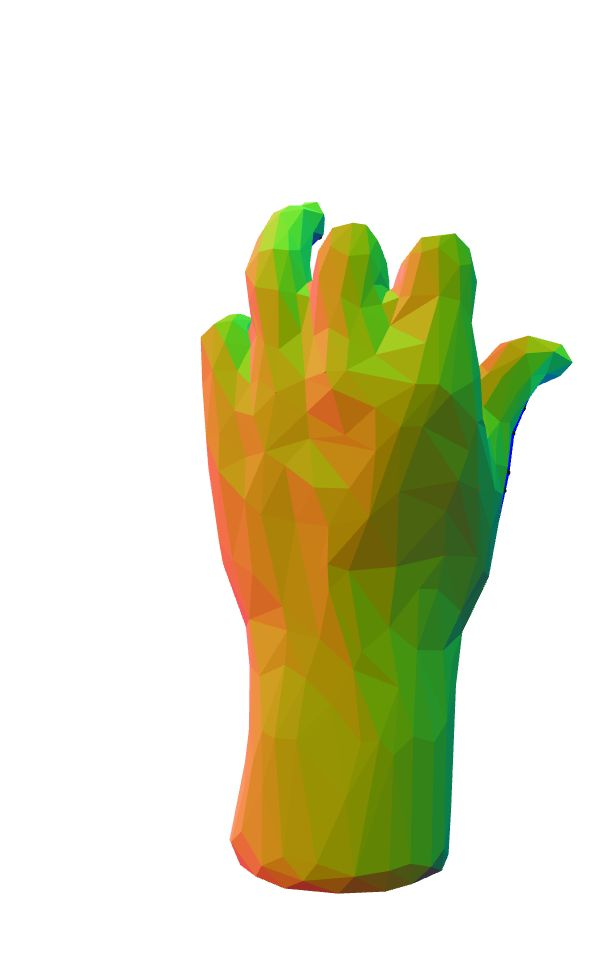

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb against palm; figers except little bent towards palm
correct pic:


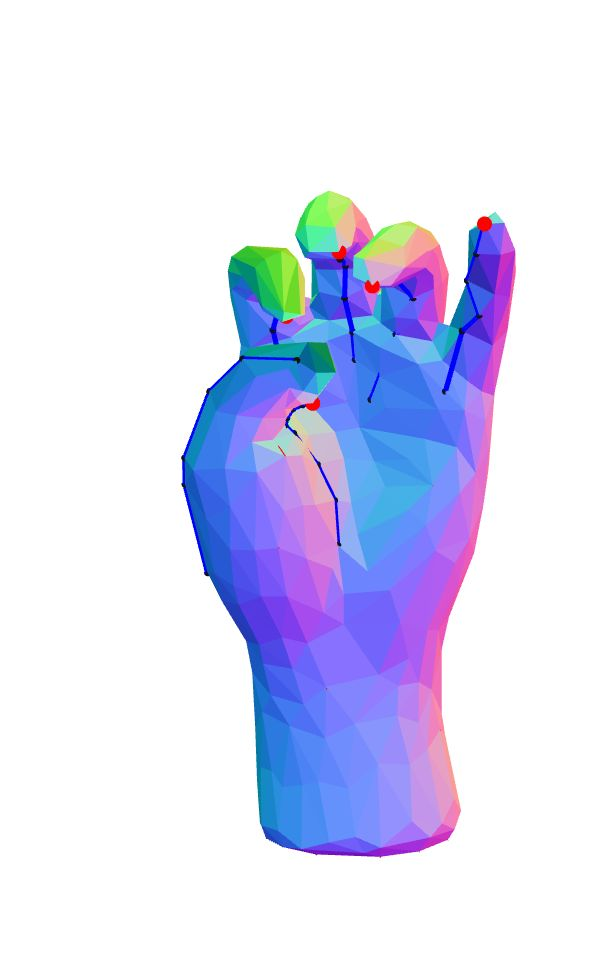

guessed pic:
fit: 1.9414584255091865


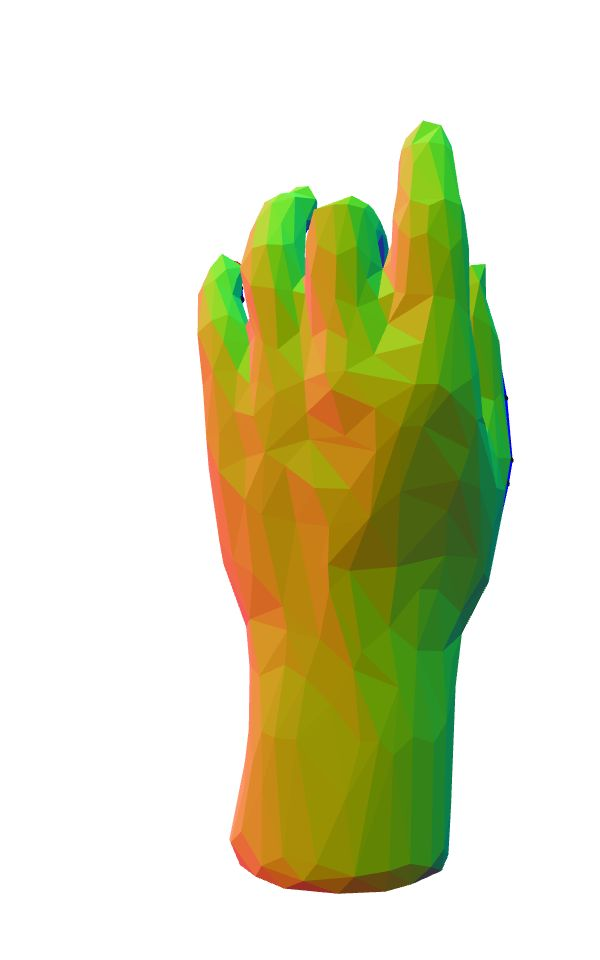

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Relaxed hand with index and middle fingers slightly straightened; thumb out toward side
correct pic:


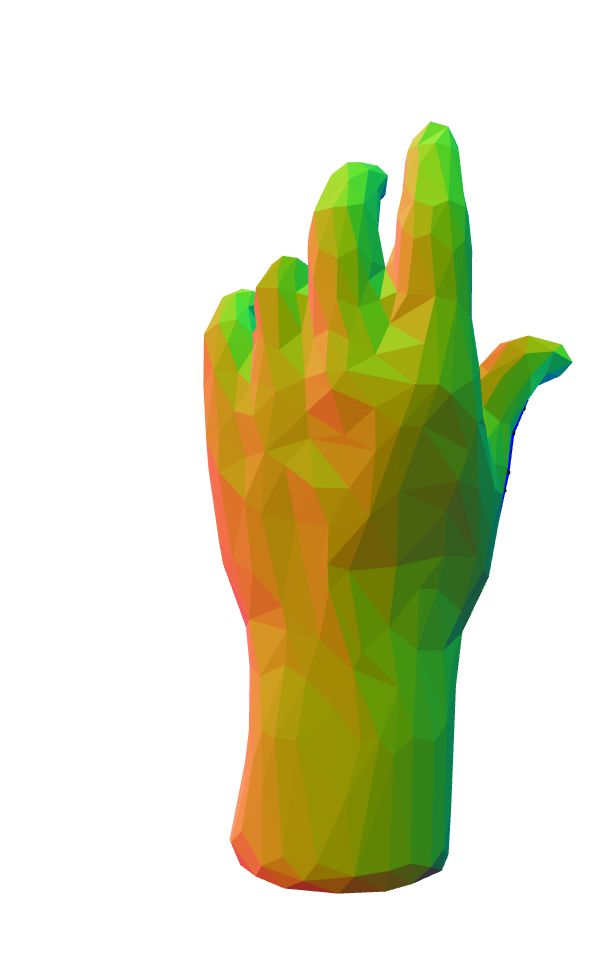

guessed pic:
fit: 1.8732563389695036


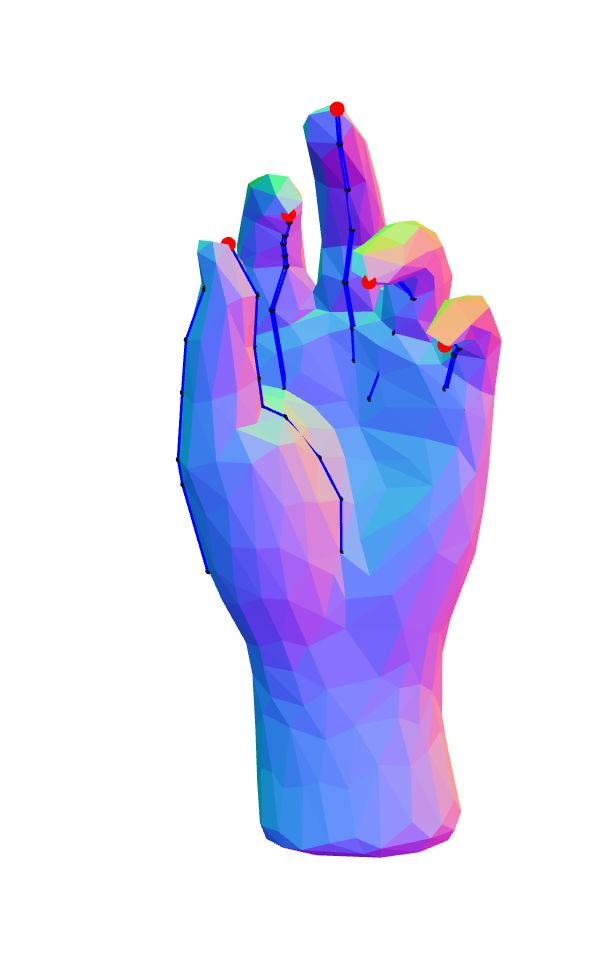

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
curl and thumb stretch
correct pic:


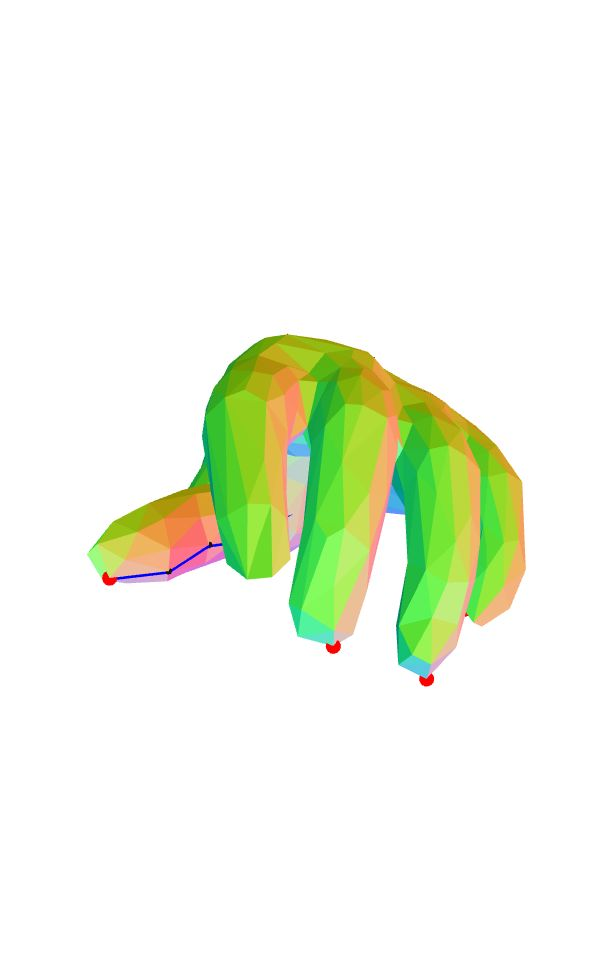

guessed pic:
fit: 0.7849603127613172


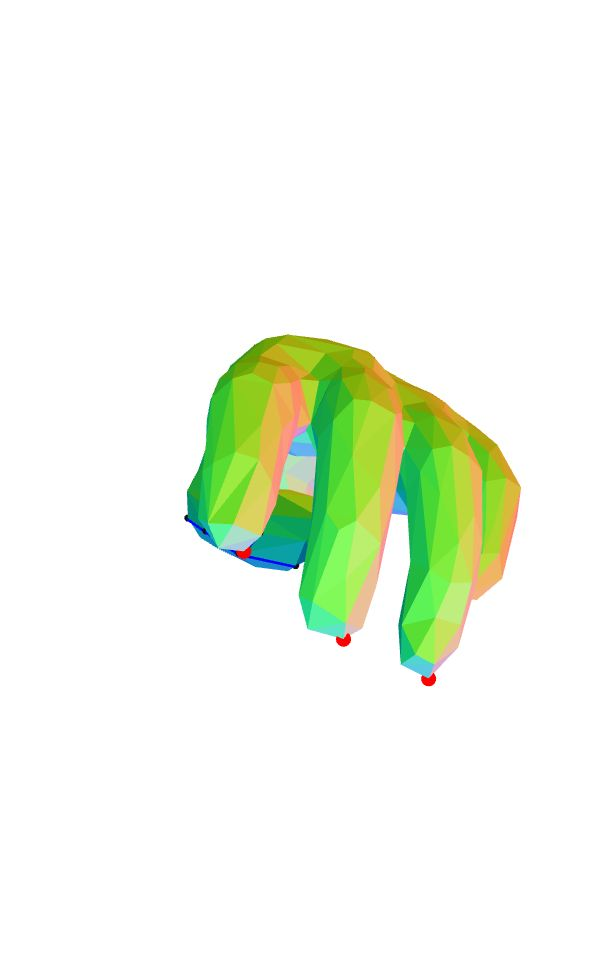

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Fingers bent down progressive nts with the index finger extended most and others less.
correct pic:


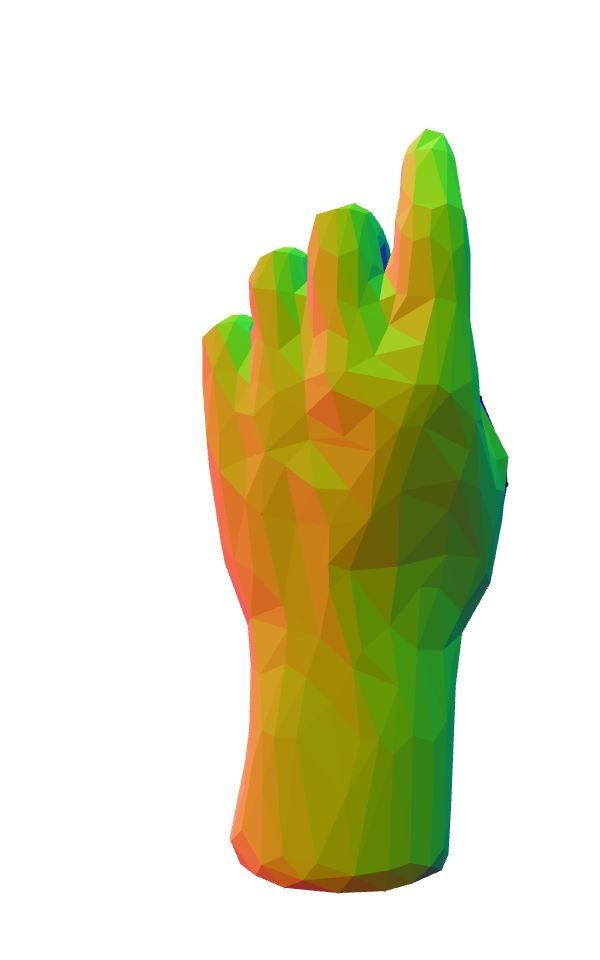

guessed pic:
fit: 1.9788219376059821


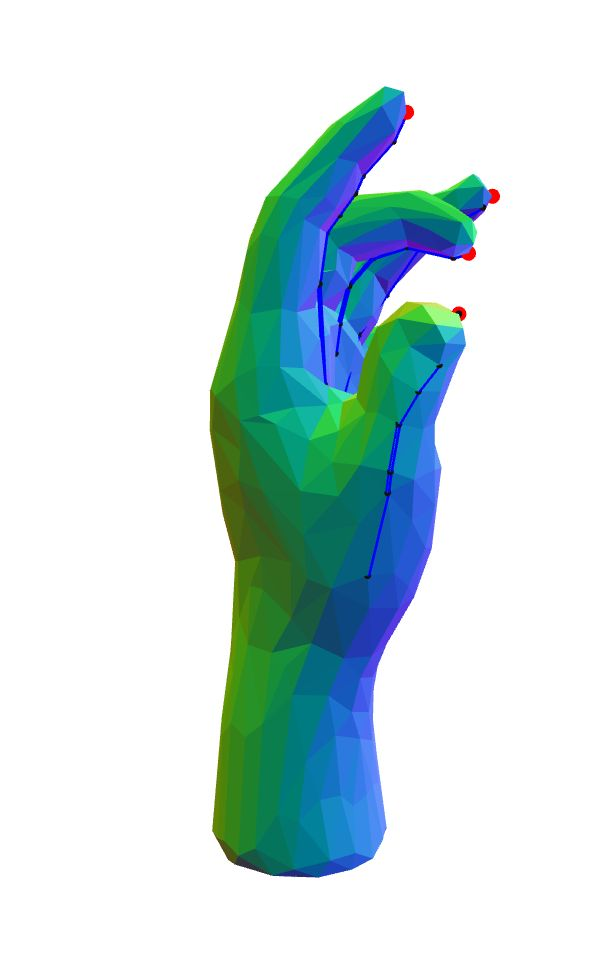

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The middle and ring fingers are bent.;;
correct pic:


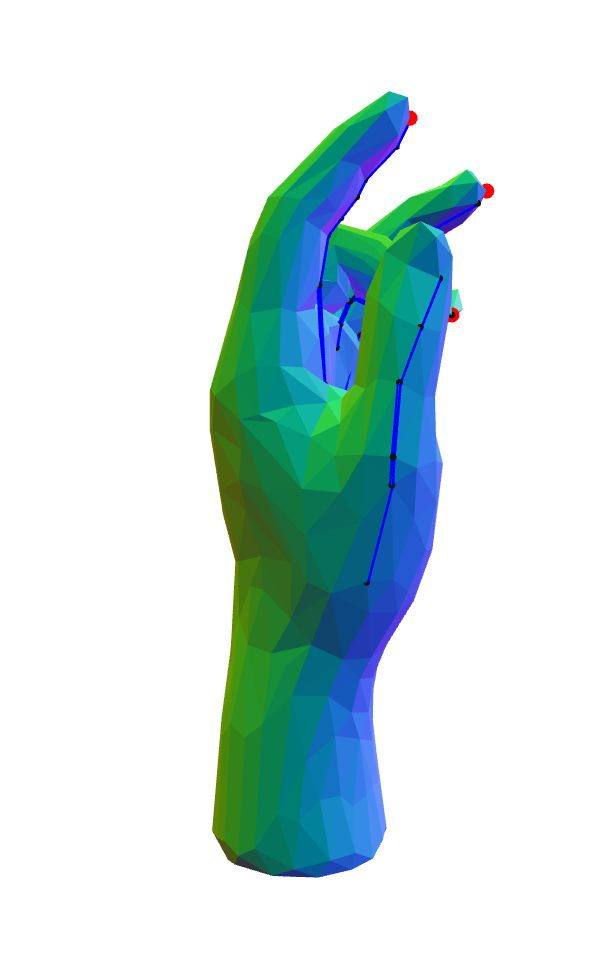

guessed pic:
fit: 1.3097550206520867


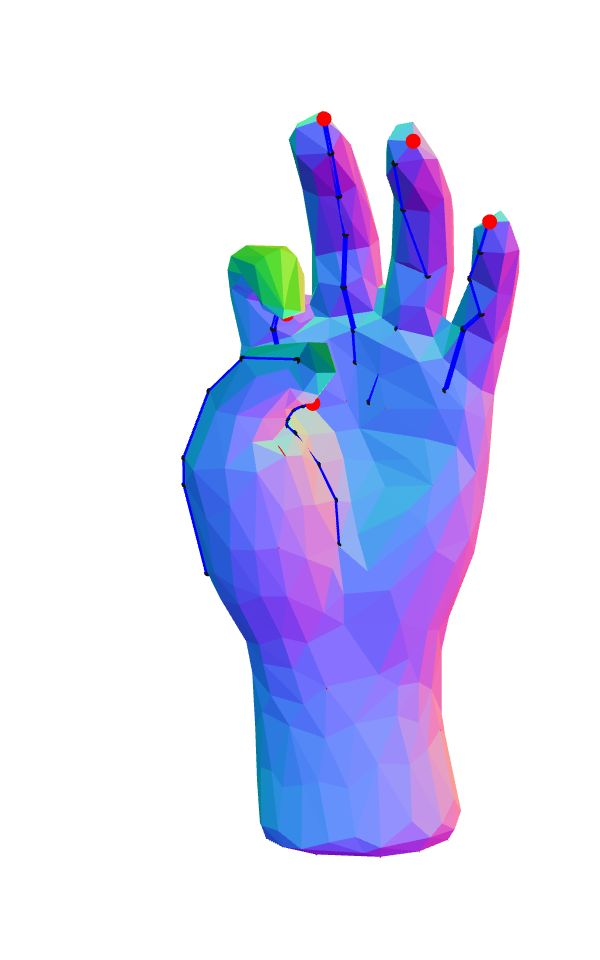

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
index and thumb pinch
correct pic:


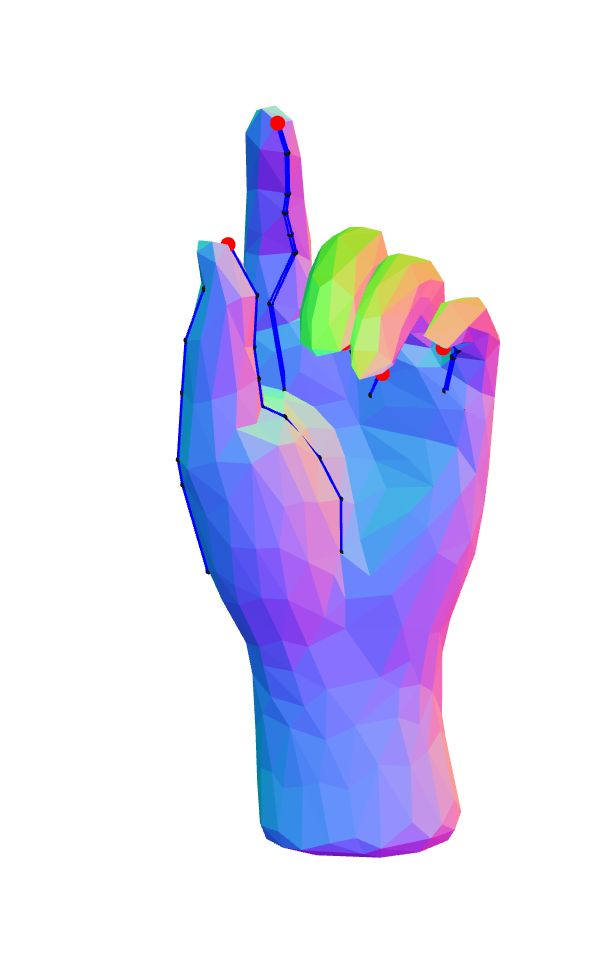

guessed pic:
fit: 0.7456214142665157


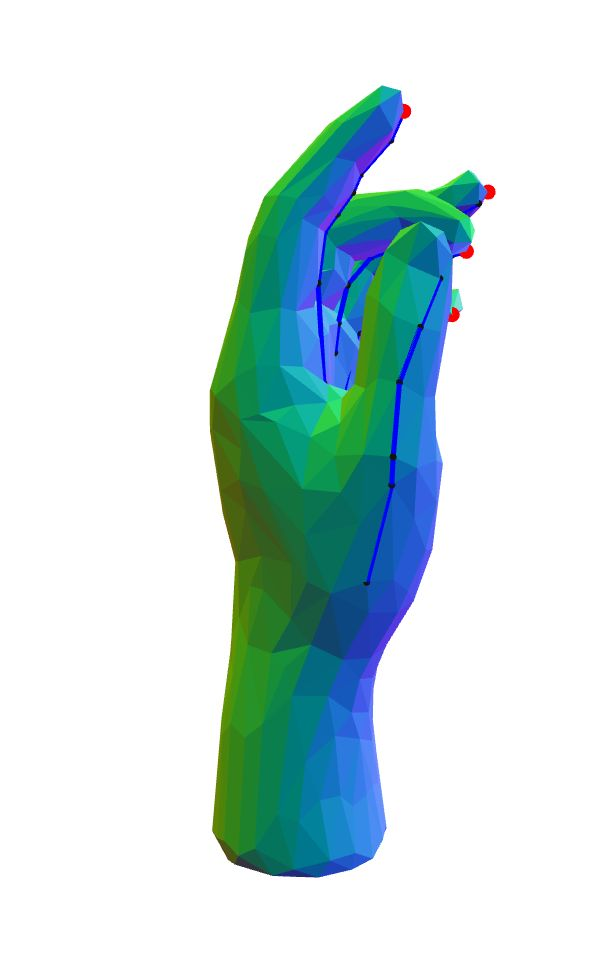

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
almost straight
correct pic:


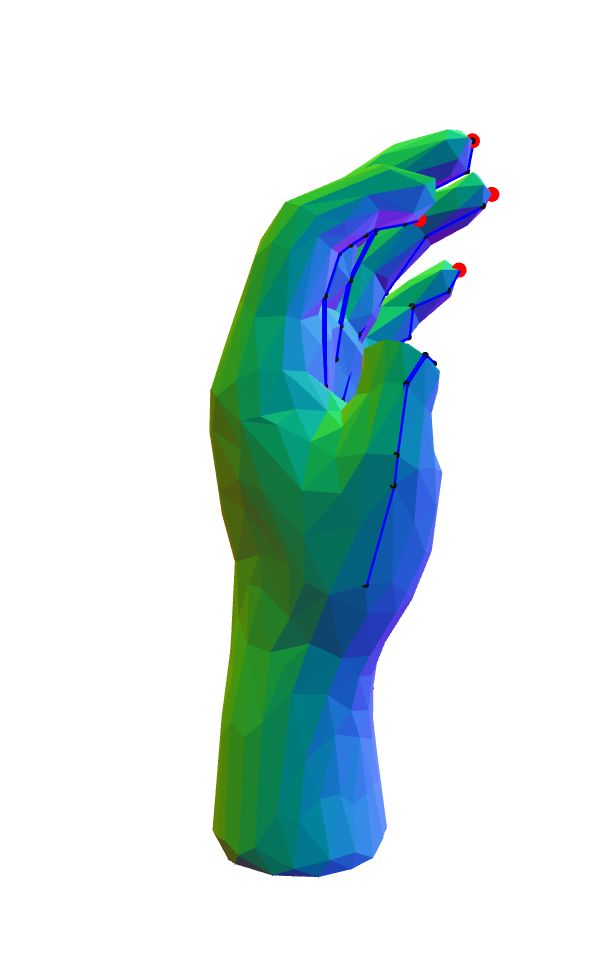

guessed pic:
fit: 0.9331397147542726


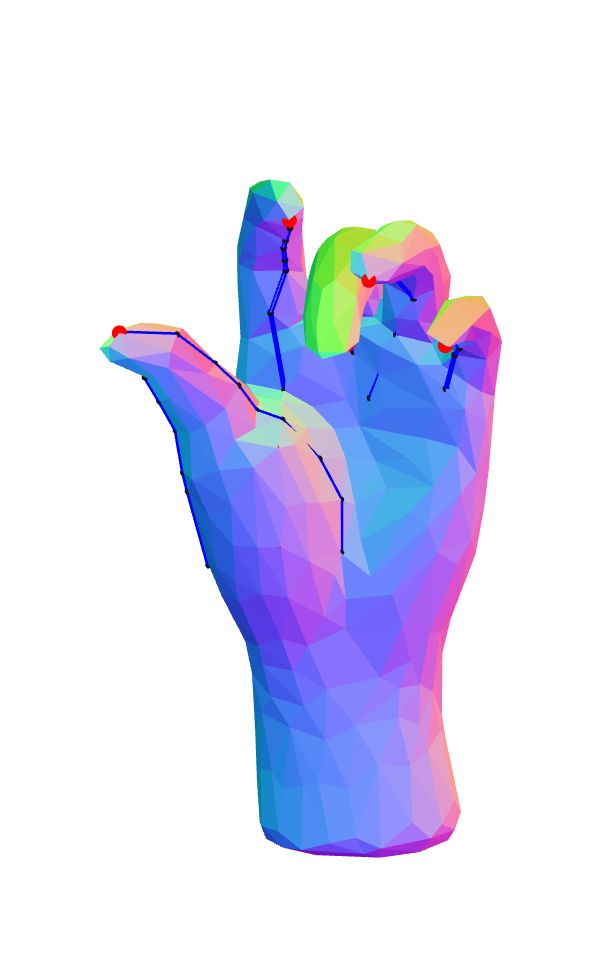

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand coming toward you with all fingers pointing downwards but index finger closed.
correct pic:


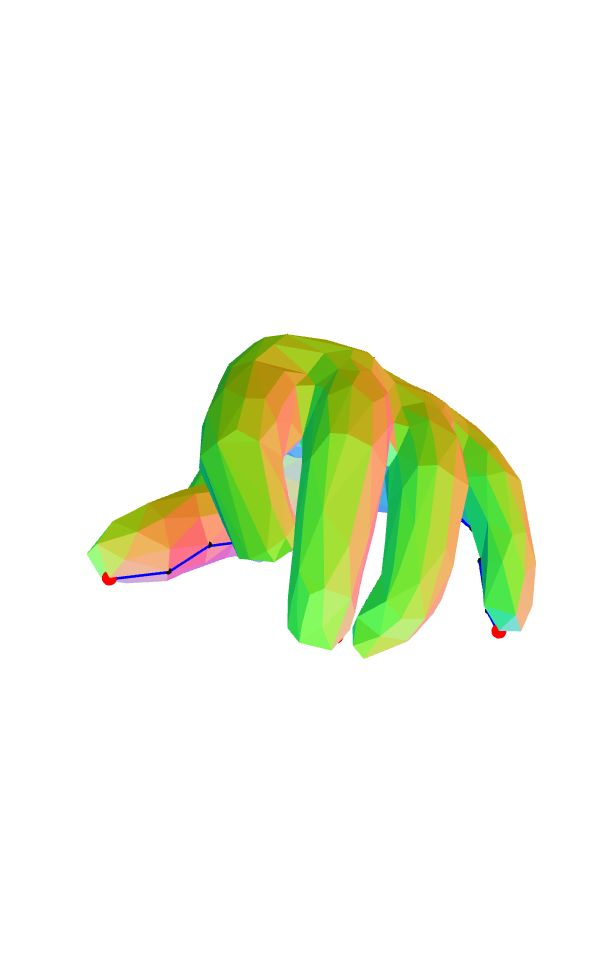

guessed pic:
fit: 2.9949633671059575


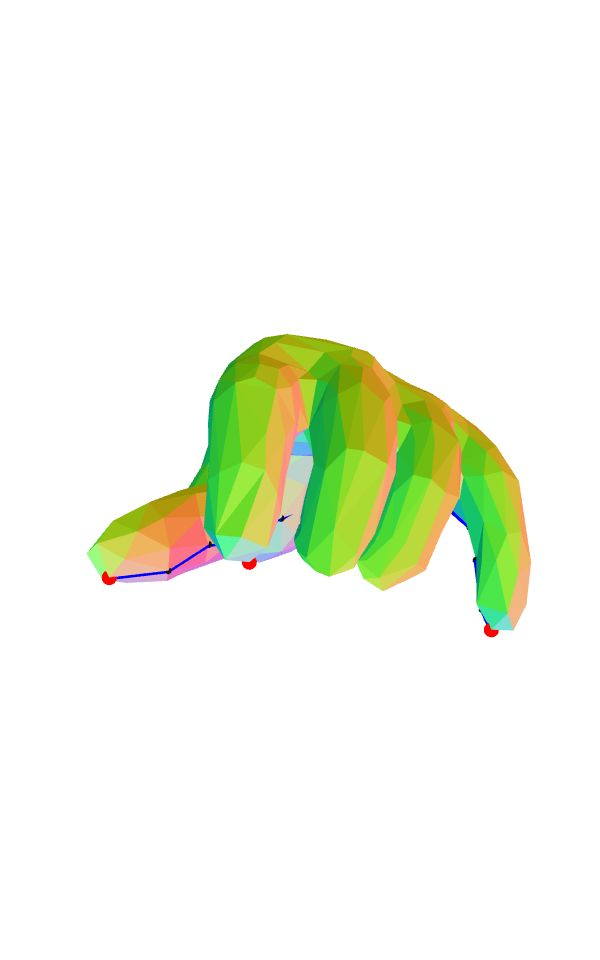

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
CATCH
correct pic:


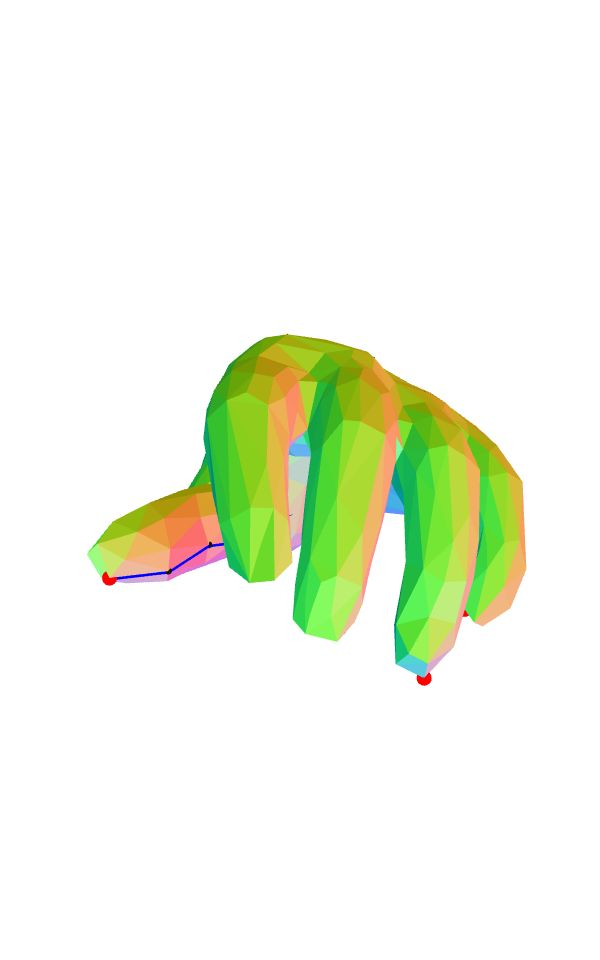

guessed pic:
fit: 0.44671460910421457


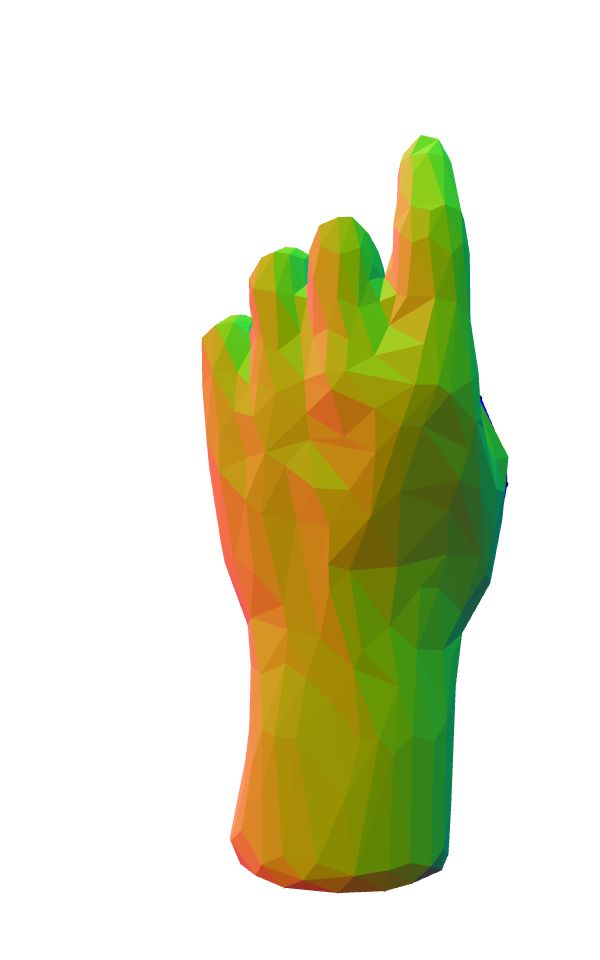

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Palm down; index finger bent; fingers pointed towards observer; fingers curled.
correct pic:


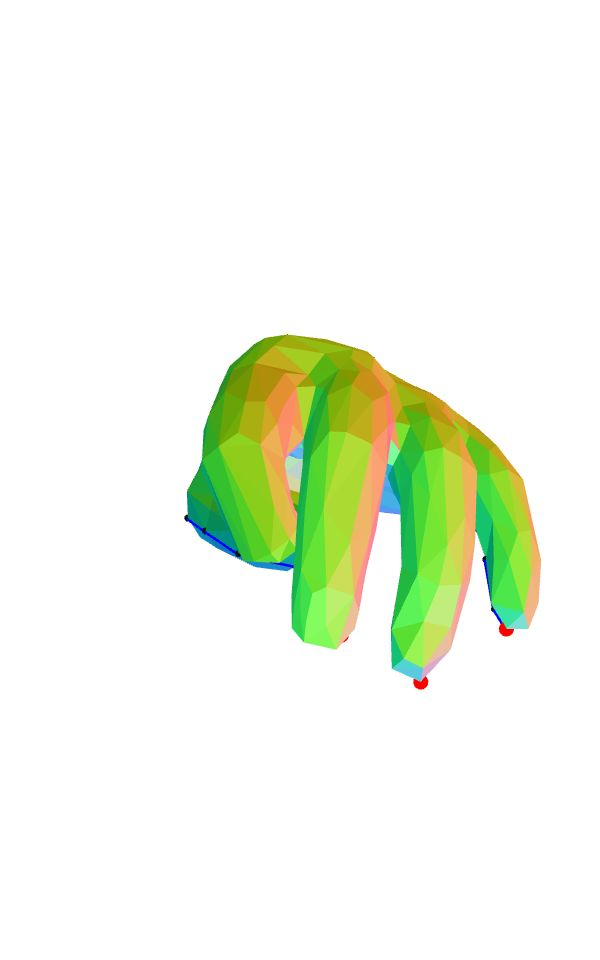

guessed pic:
fit: 2.58632135836346


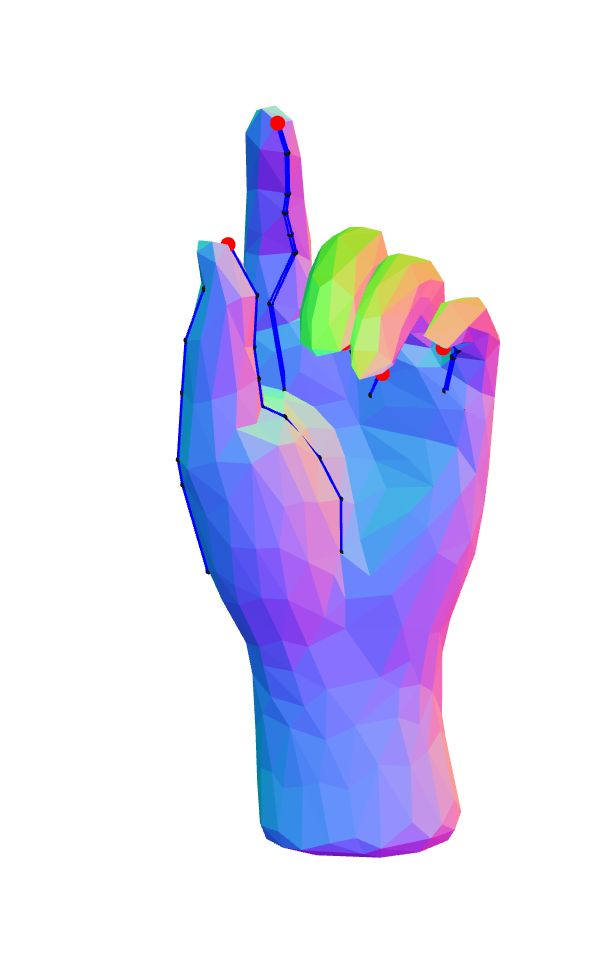

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
making a point
correct pic:


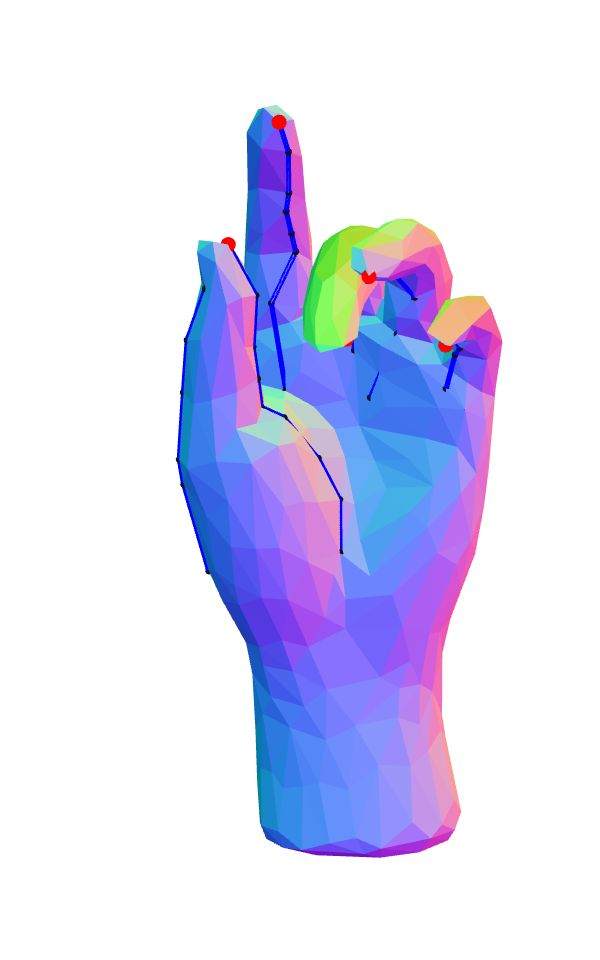

guessed pic:
fit: 0.9129560014874236


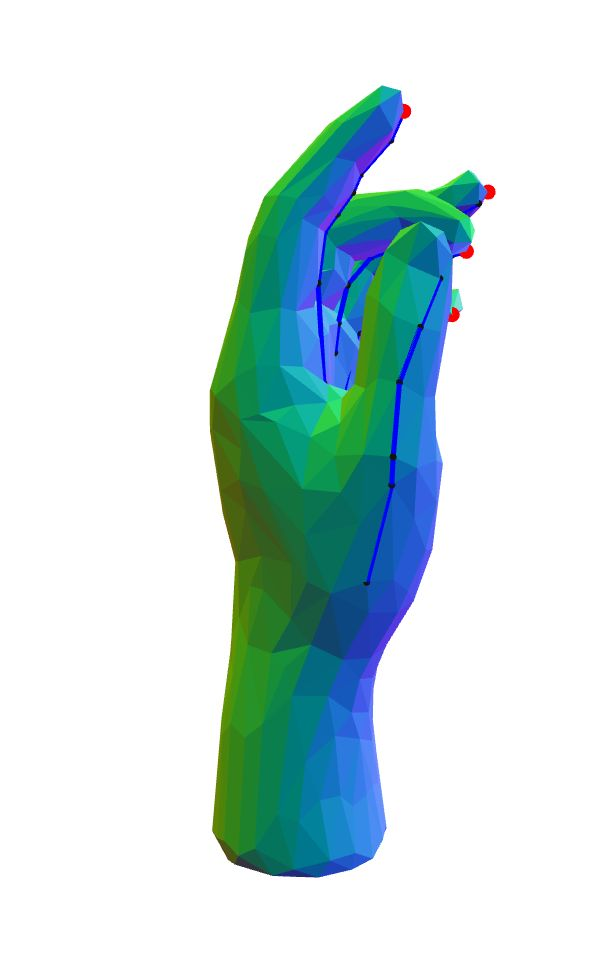

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
palm facing away; thumb facing up; holding imaginary long thin bar
correct pic:


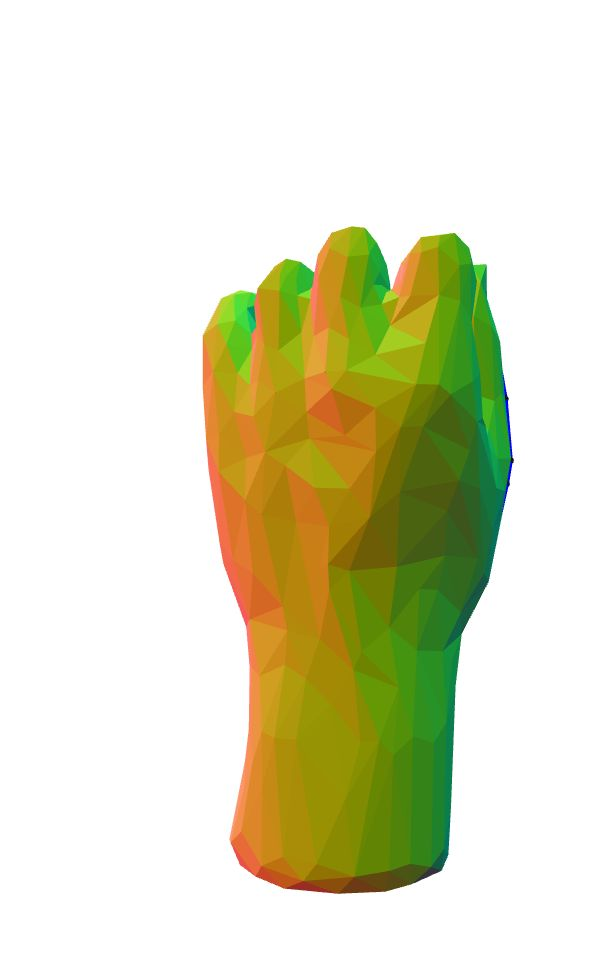

guessed pic:
fit: 3.1725025007656114


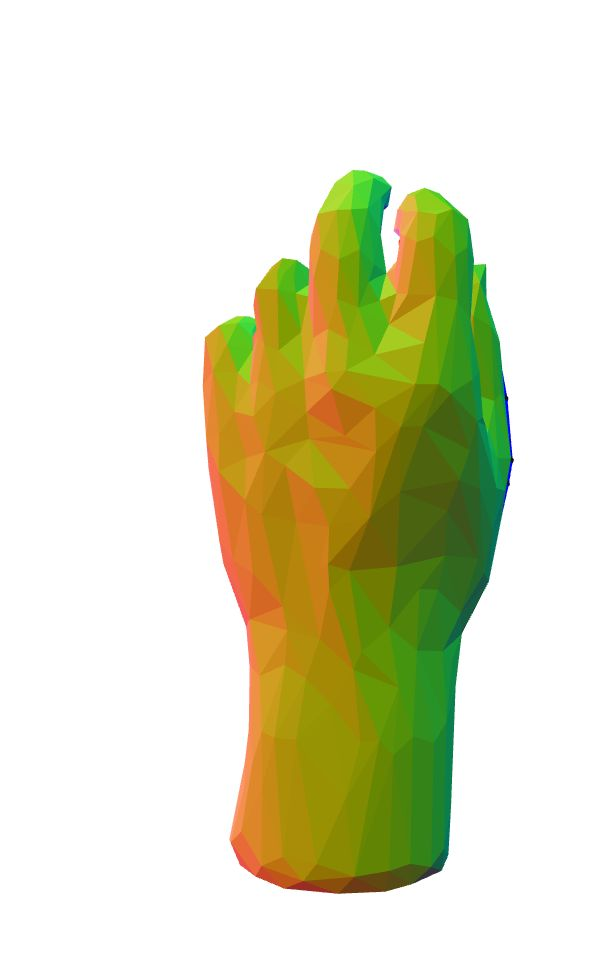

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
A left hand; viewed opposite of palm; with a fully tucked thumb and slightly rolled digits.
correct pic:


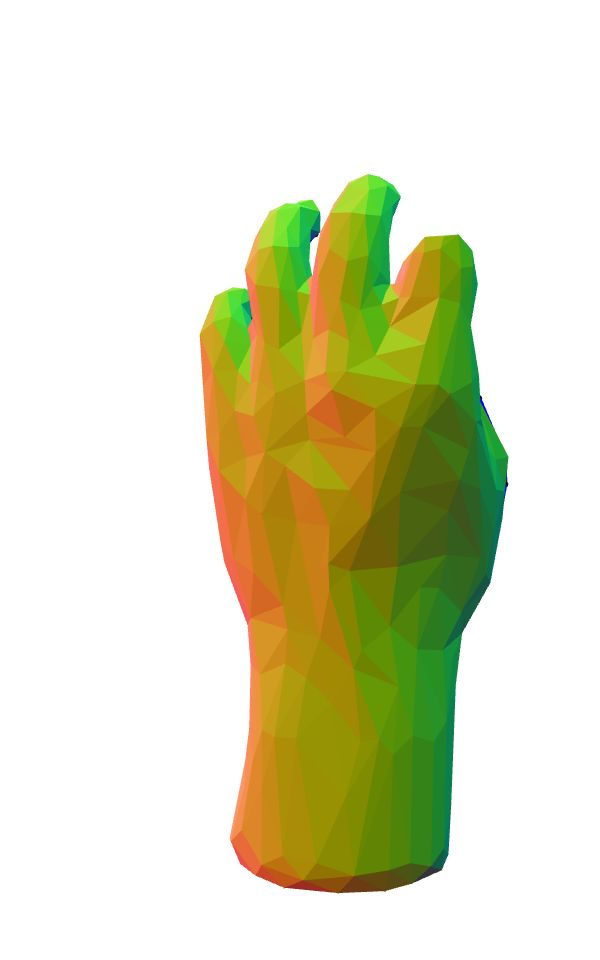

guessed pic:
fit: 2.760762408987511


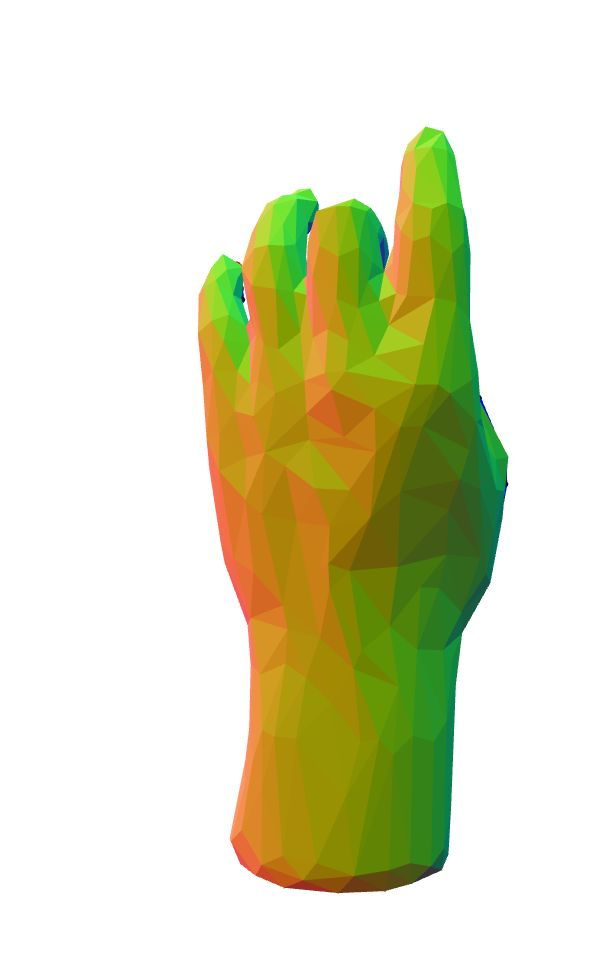

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Scratching
correct pic:


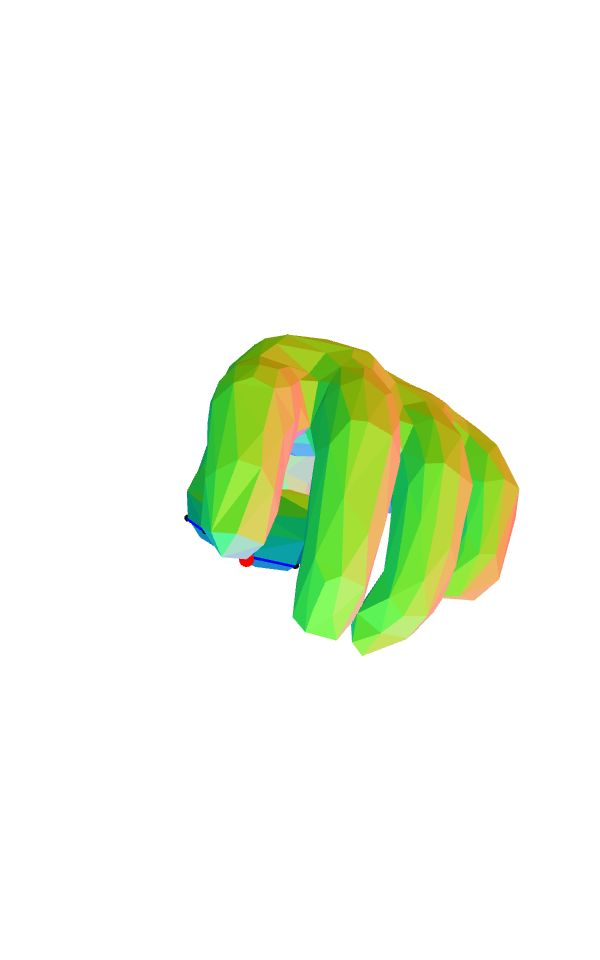

guessed pic:
fit: 0.3489277793826568


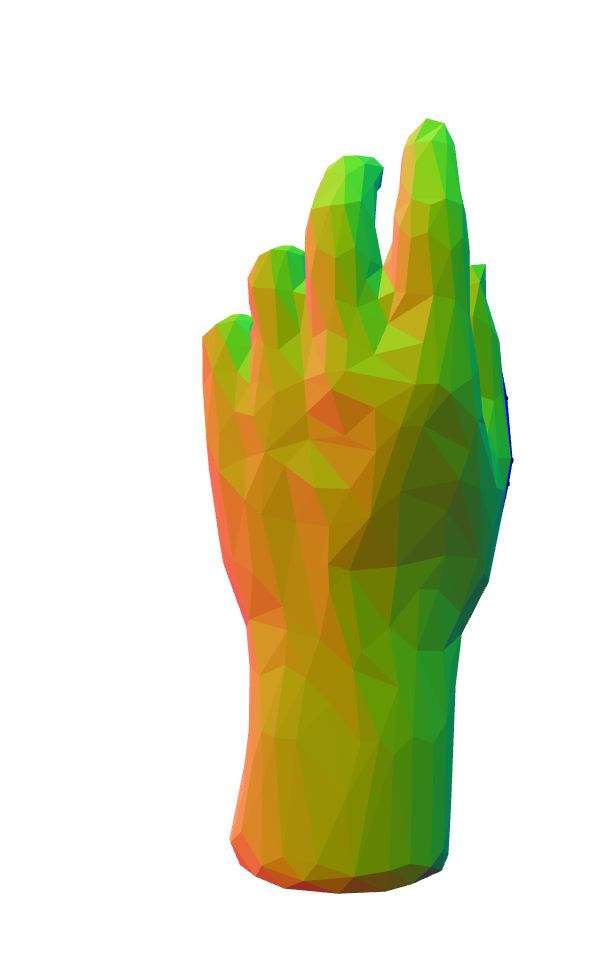

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
a crawling face down left hand
correct pic:


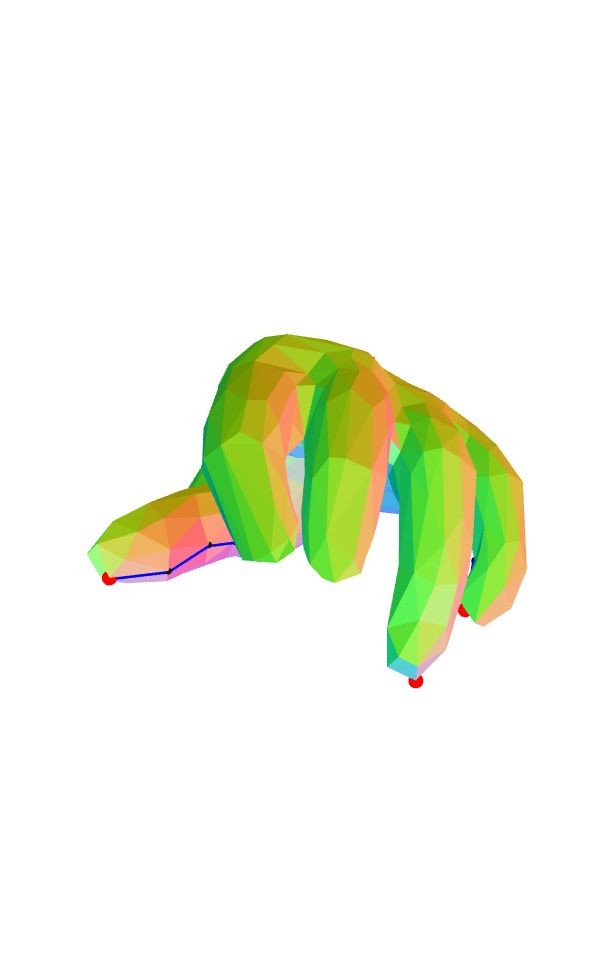

guessed pic:
fit: 2.4642099747580435


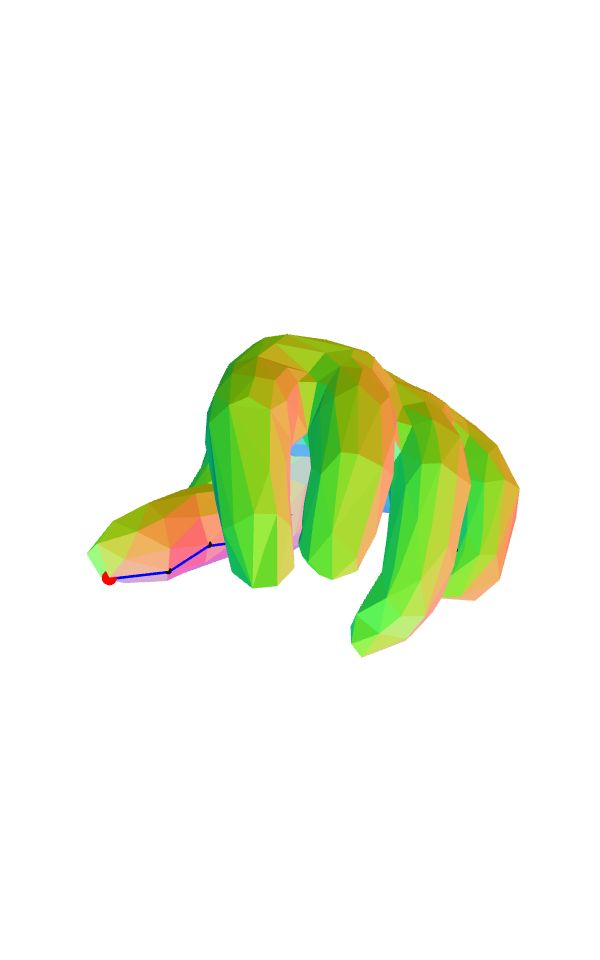

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand; fingers; and thumb is holding a grocery bag handle
correct pic:


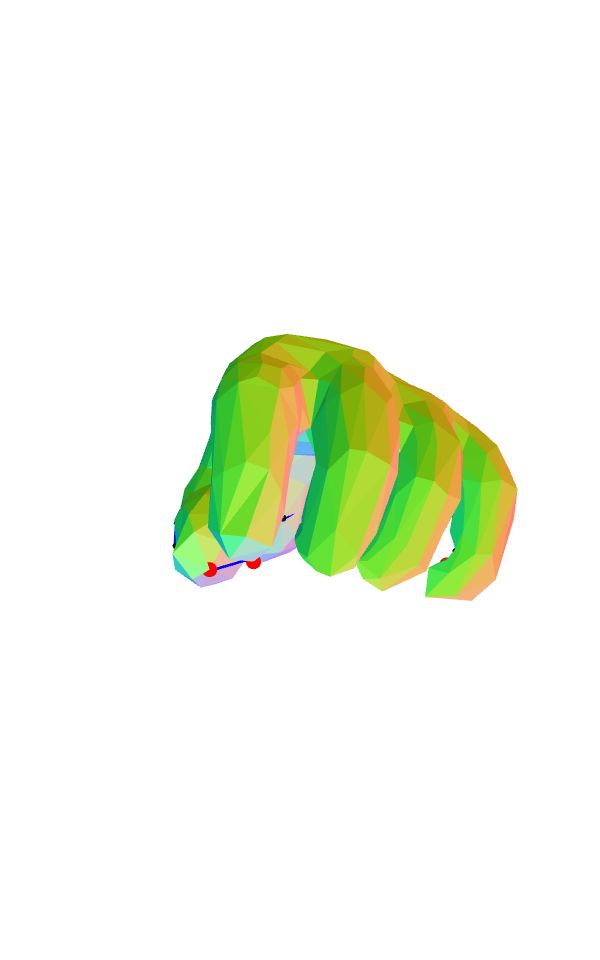

guessed pic:
fit: 1.1632030300419949


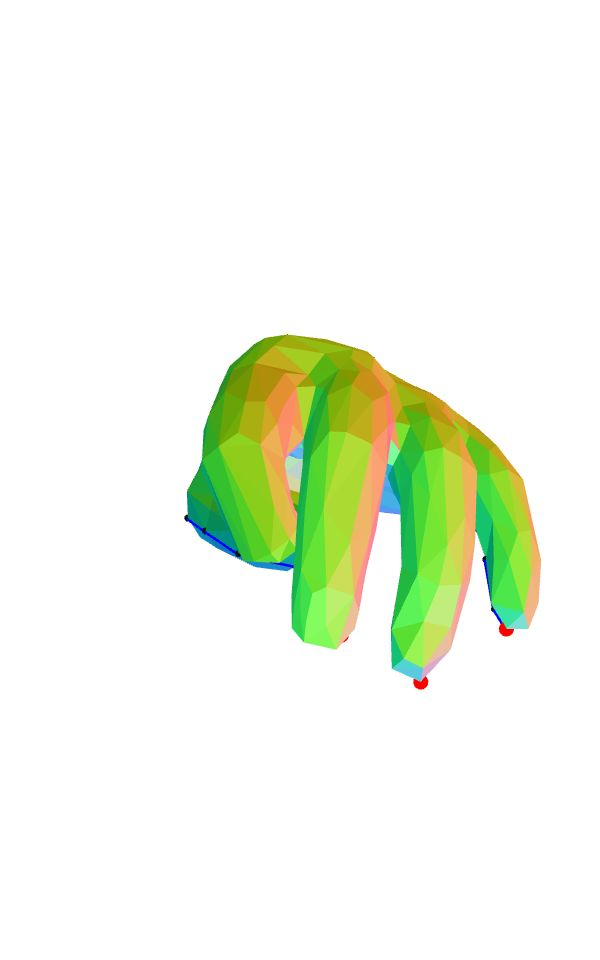

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
touching something the person finds gross
correct pic:


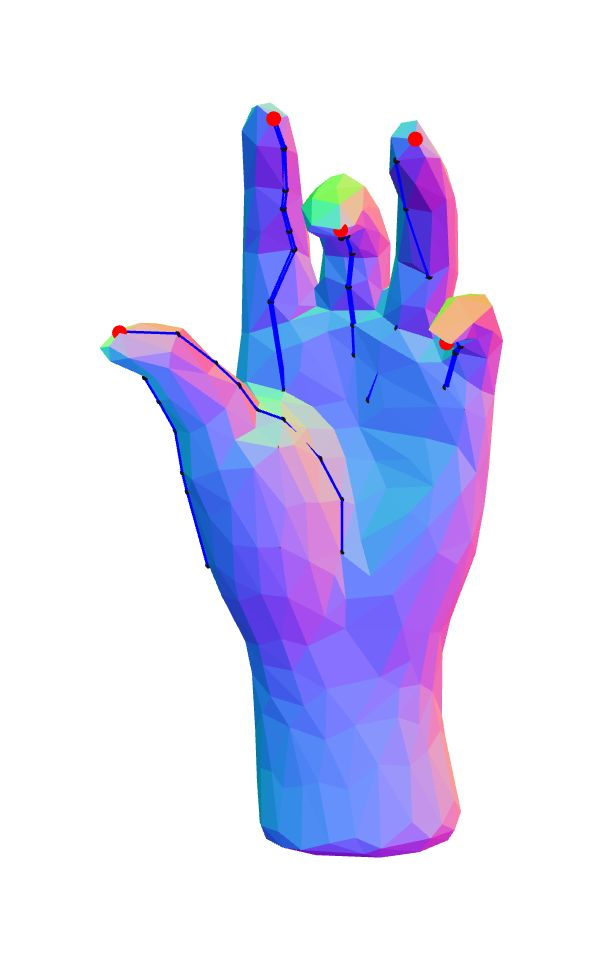

guessed pic:
fit: 1.3953436193209157


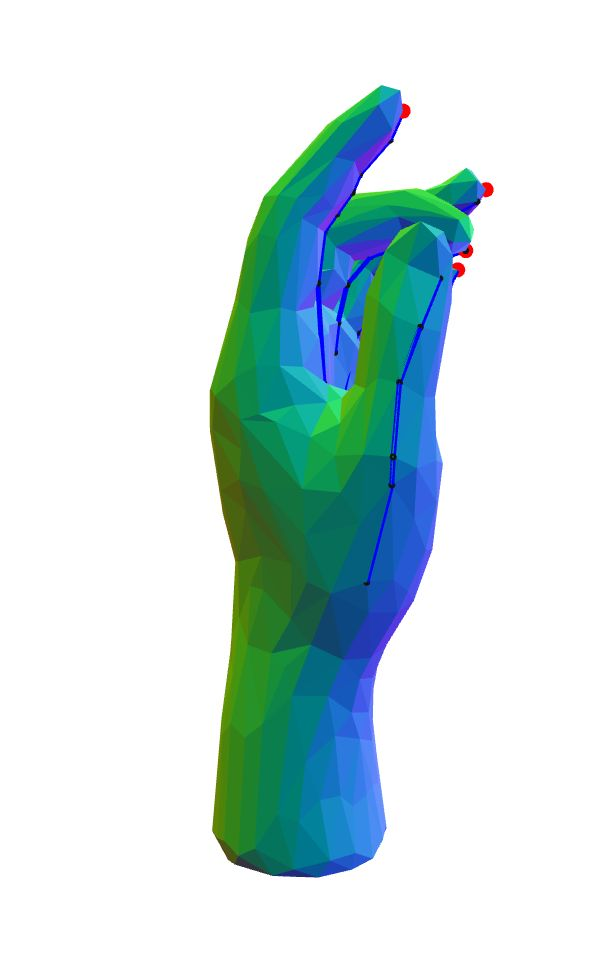

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb and pointer finger touching; other fingers curved down
correct pic:


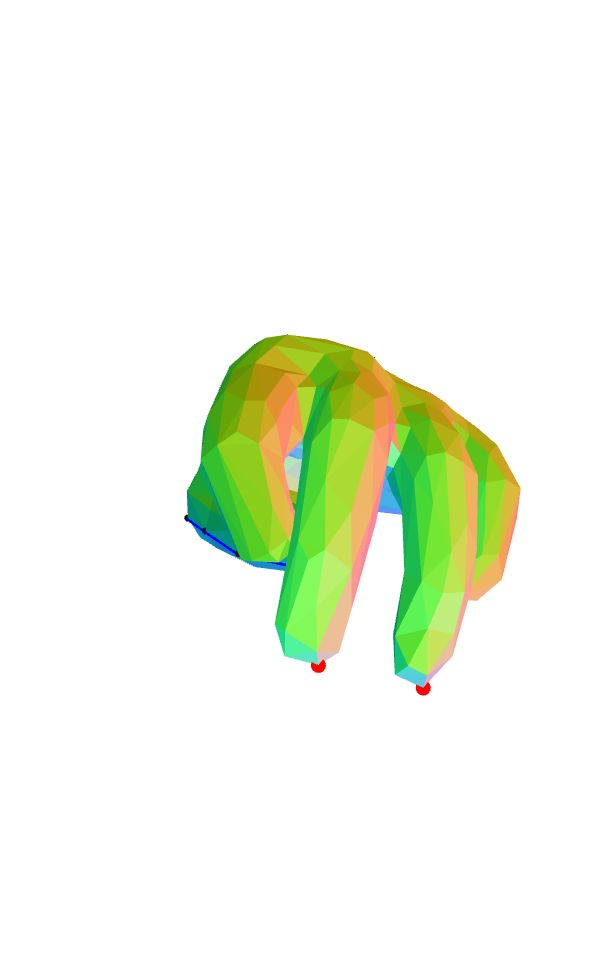

guessed pic:
fit: 1.549341904593372


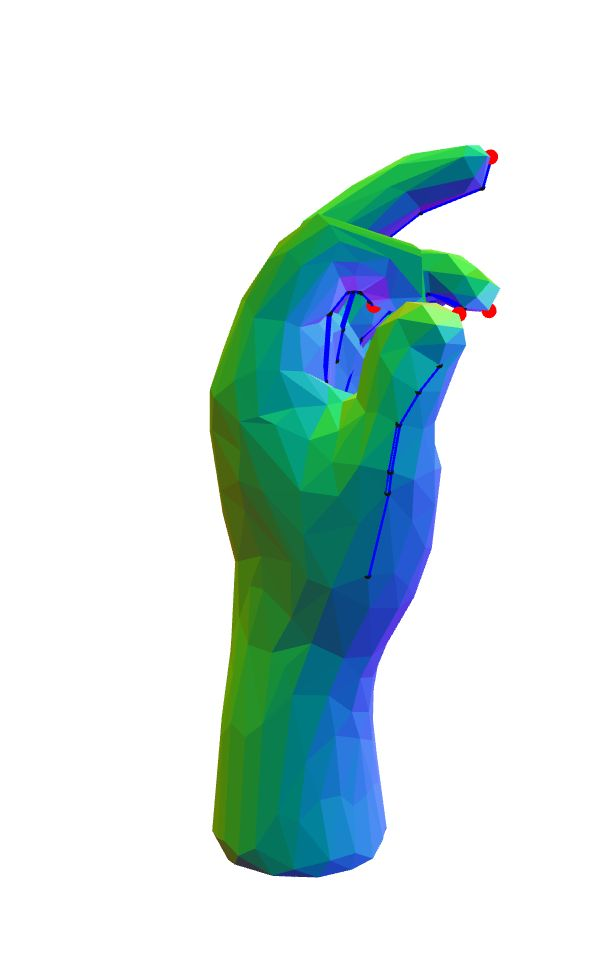

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand is raised as if in greeting but the pinky; ring finger; and thumb are curled.
correct pic:


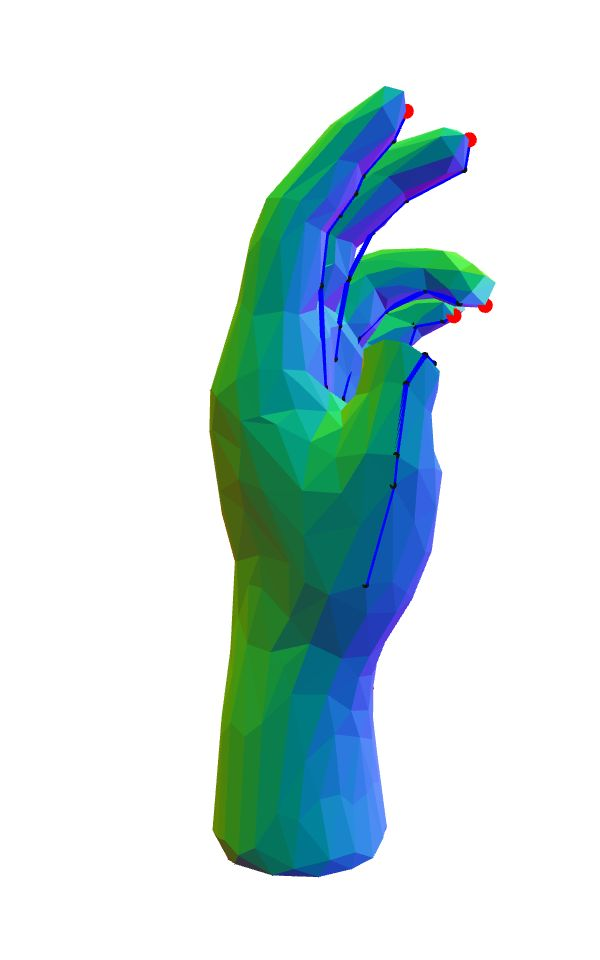

guessed pic:
fit: 2.365565579203737


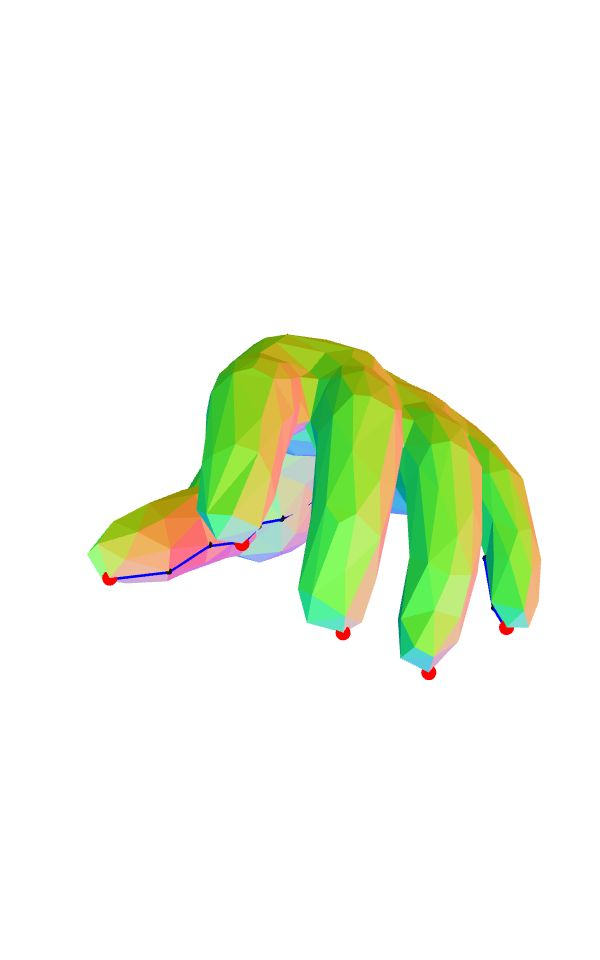

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
side profile of hand ring finger depressed looks like its saying rock on
correct pic:


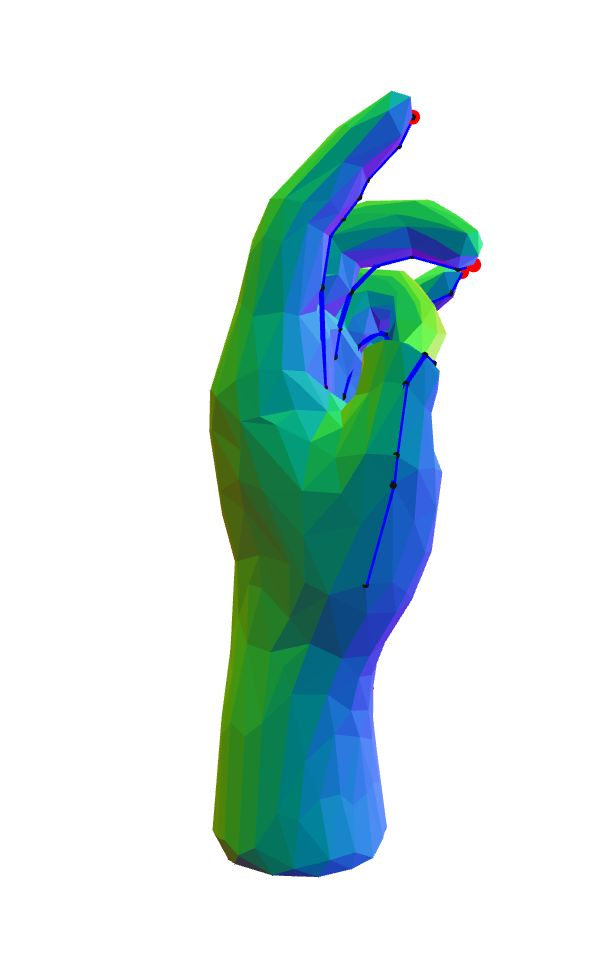

guessed pic:
fit: 3.451130836469491


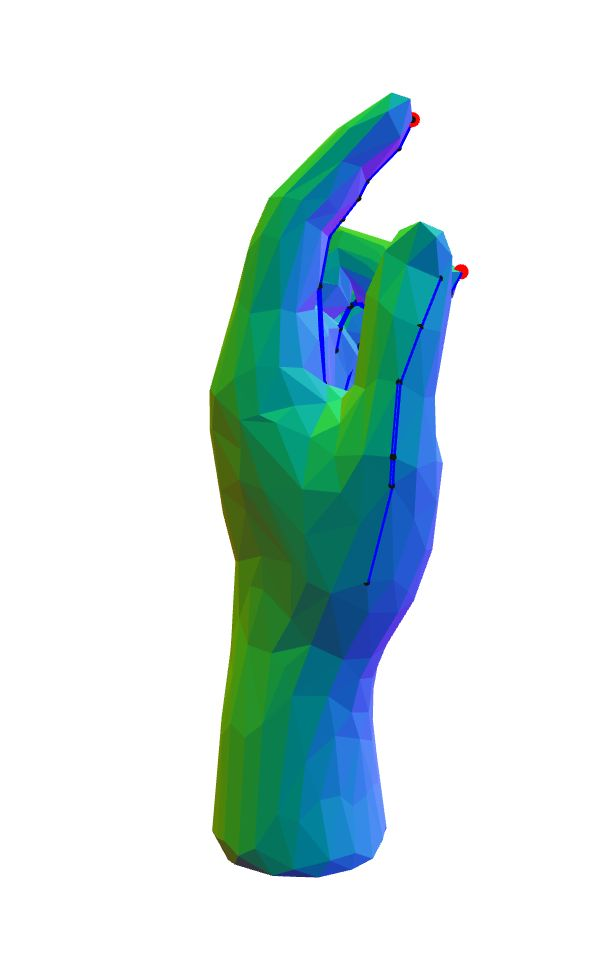

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
light grasp
correct pic:


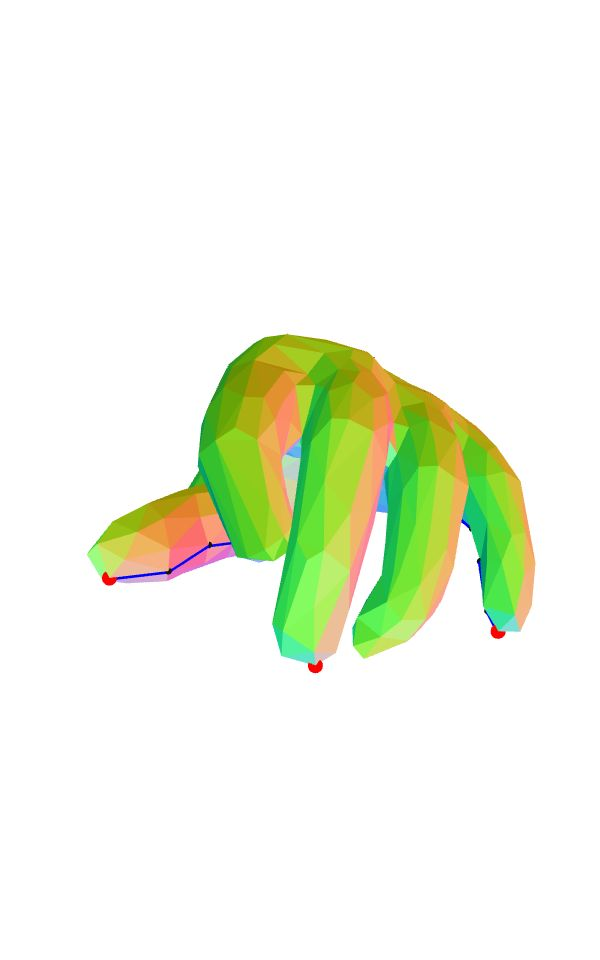

guessed pic:
fit: 0.6029283231776013


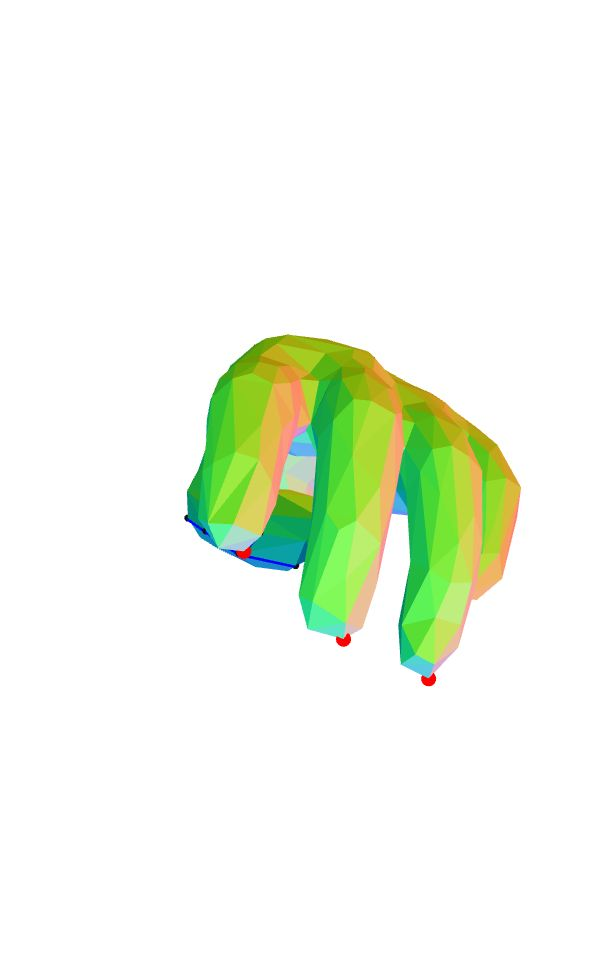

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Neutral
correct pic:


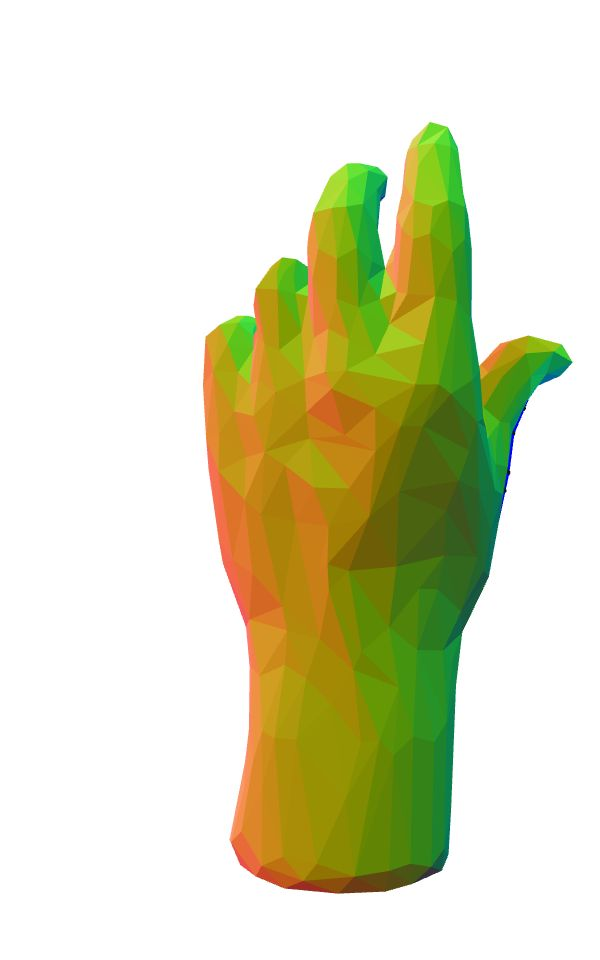

guessed pic:
fit: 0.43838320427269667


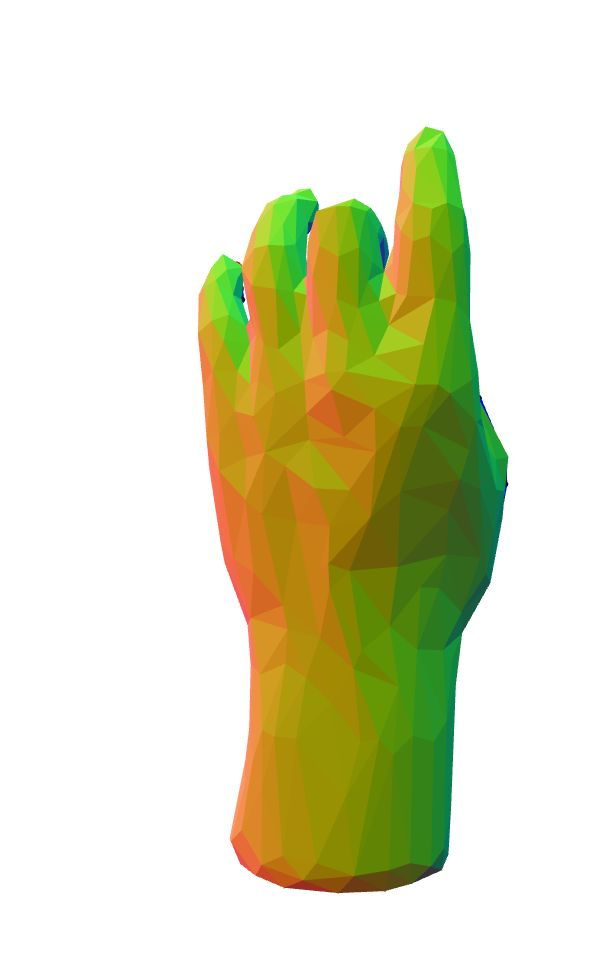

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
flicking
correct pic:


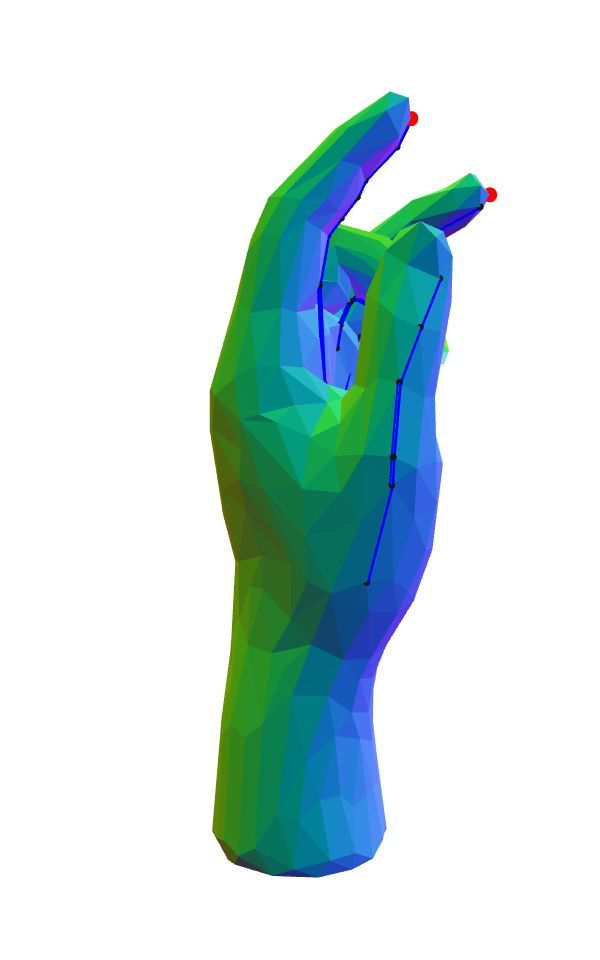

guessed pic:
fit: 0.4858171993013057


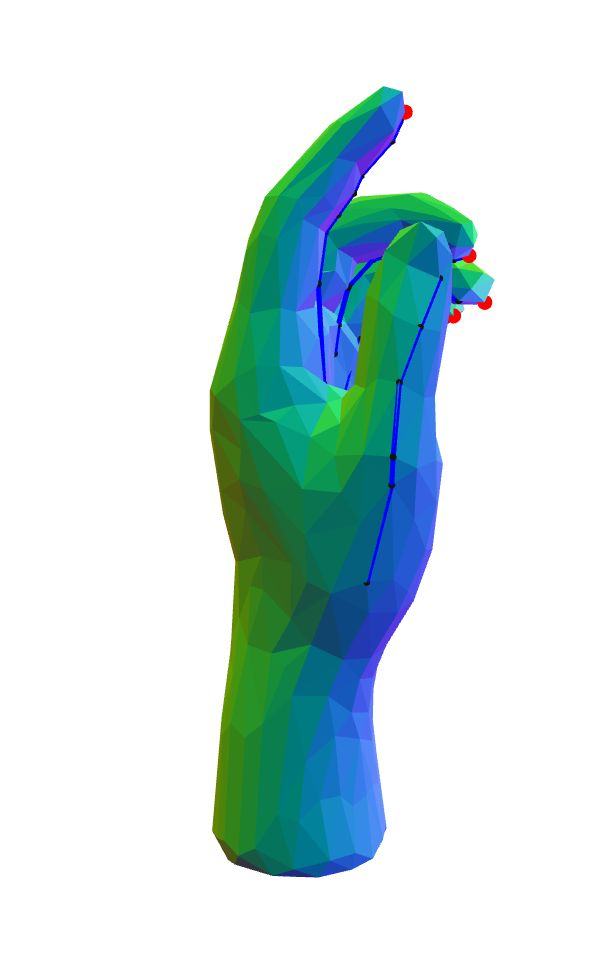

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of left hand with fingers curled down and pinky finger slightly up
correct pic:


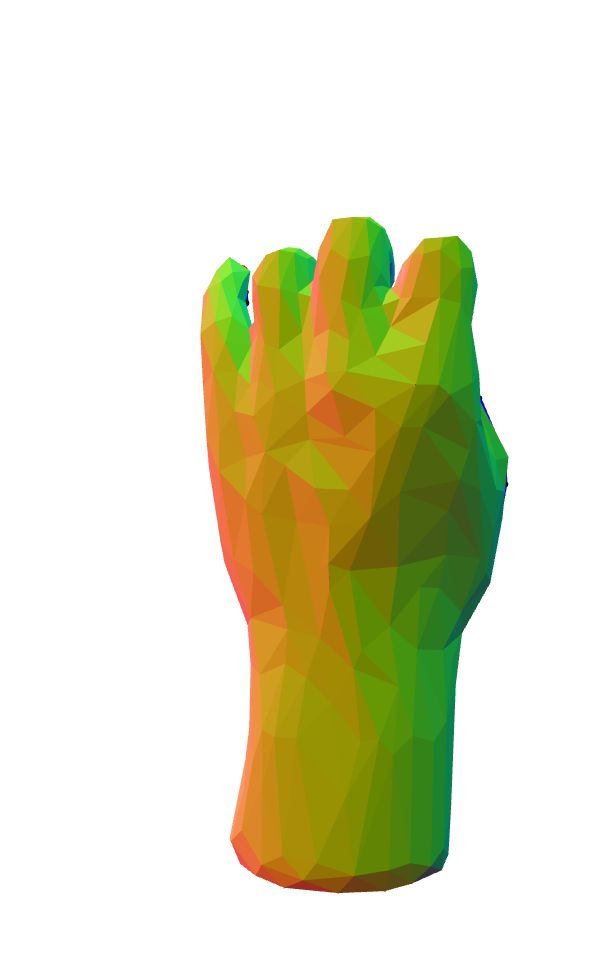

guessed pic:
fit: 1.9845445119170195


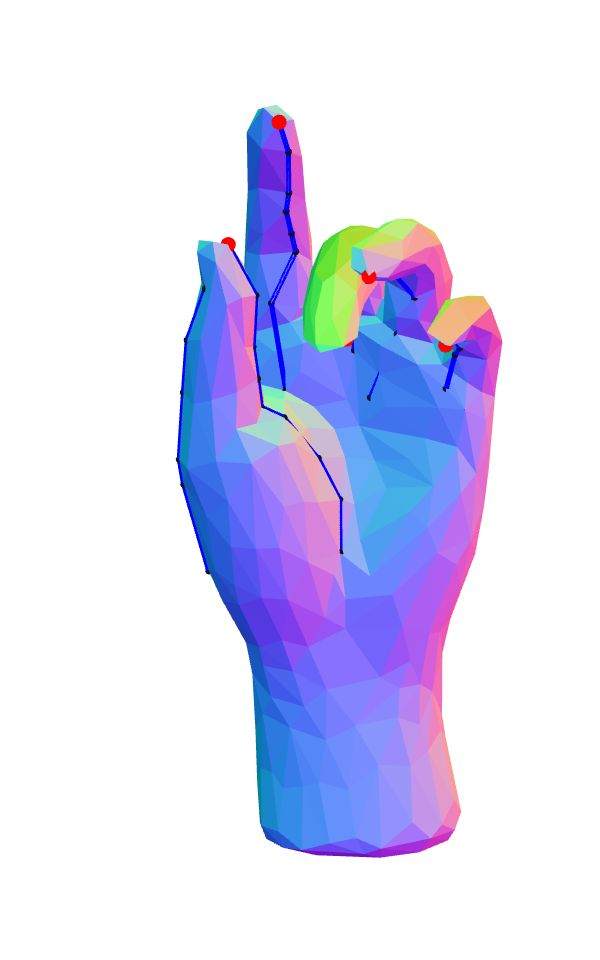

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
semi fist
correct pic:


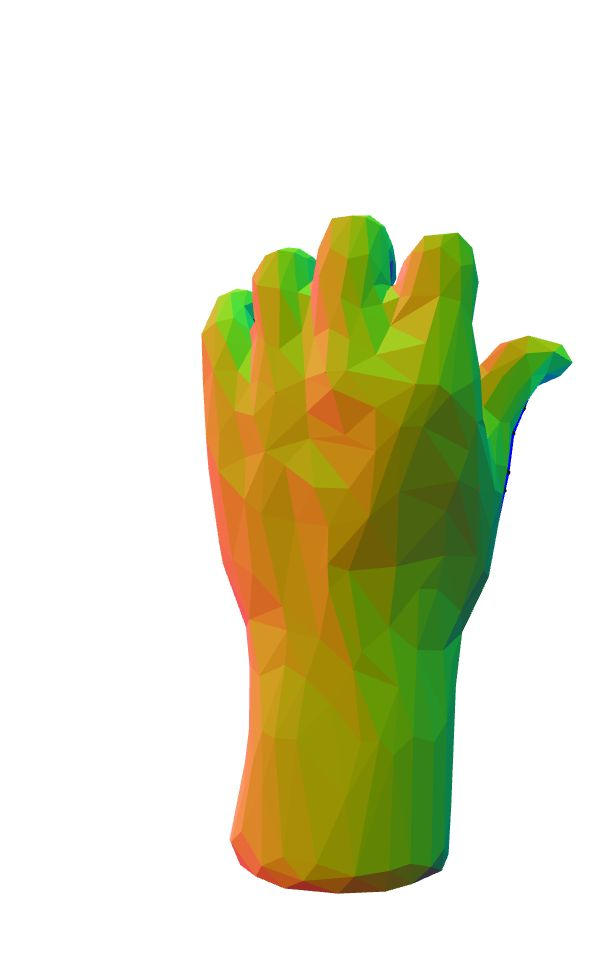

guessed pic:
fit: 0.8711852629463976


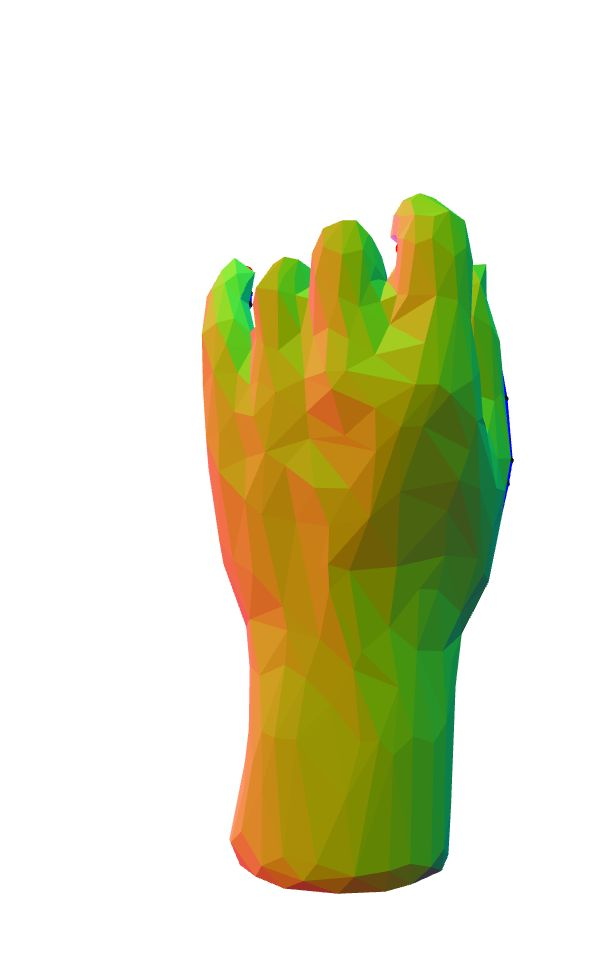

In [95]:
print("Pics that the model confused:")
i = 0
for pose in gold:
    if pose != guess[i]: 
        print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
        poseIDs = np.where(test_data["poseID"] == int(re.findall('\d+', pose)[0]))
        camera_angles = np.where(test_data["camera_angle"] == str(re.findall('\D+', pose)[0]))
        indexes = np.intersect1d(poseIDs, camera_angles)
        print(test_data.iloc[indexes[0]]["description"])
        print("correct pic:")
        display(Image('../data/screenshots-jpg/pic{}.jpg'.format(pose), width=200, height=100))
        print("guessed pic:")
        print("fit: " + str(guess_fit[i]))
        display(Image('../data/screenshots-jpg/pic{}.jpg'.format(guess[i]), width=200, height=100))
    i+=1

Pics that the model got right:
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
index and pinky fingers down
fit of correct guess: 0.7985922296737529


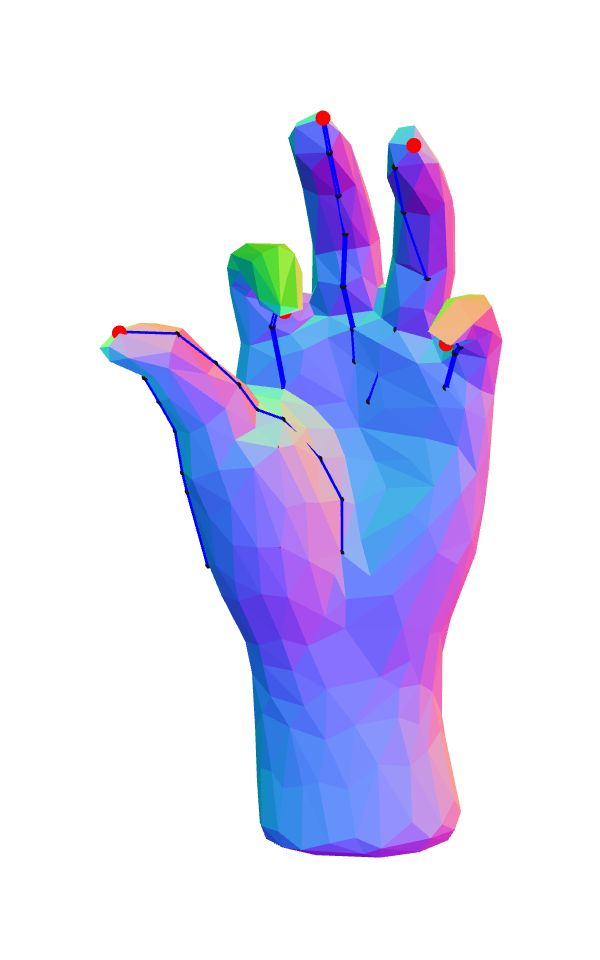

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
left hand facing down with pointer and thumb fingers curled under
fit of correct guess: 1.7883908354057705


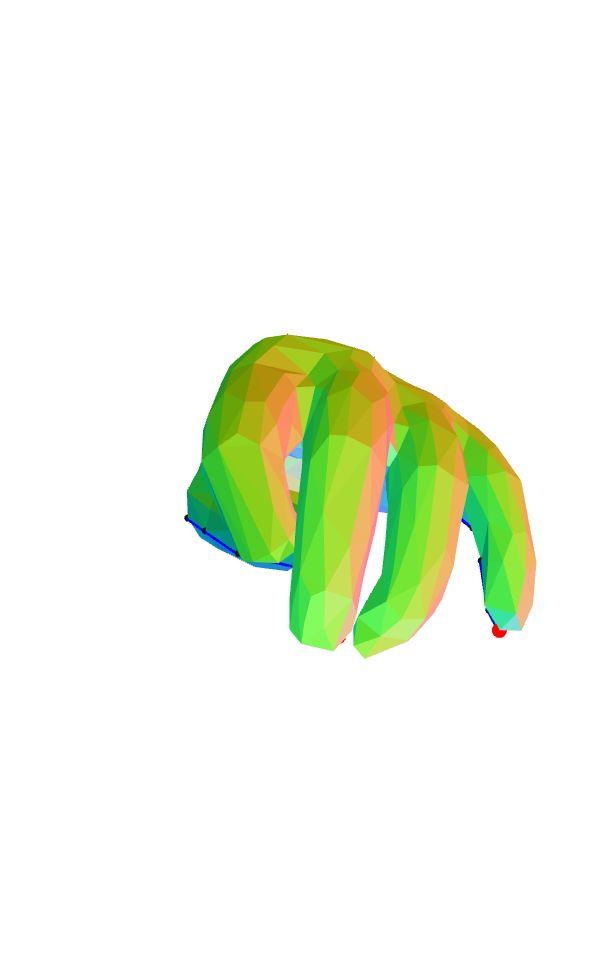

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Only back side of thehand is seen
fit of correct guess: 1.2952389623889473


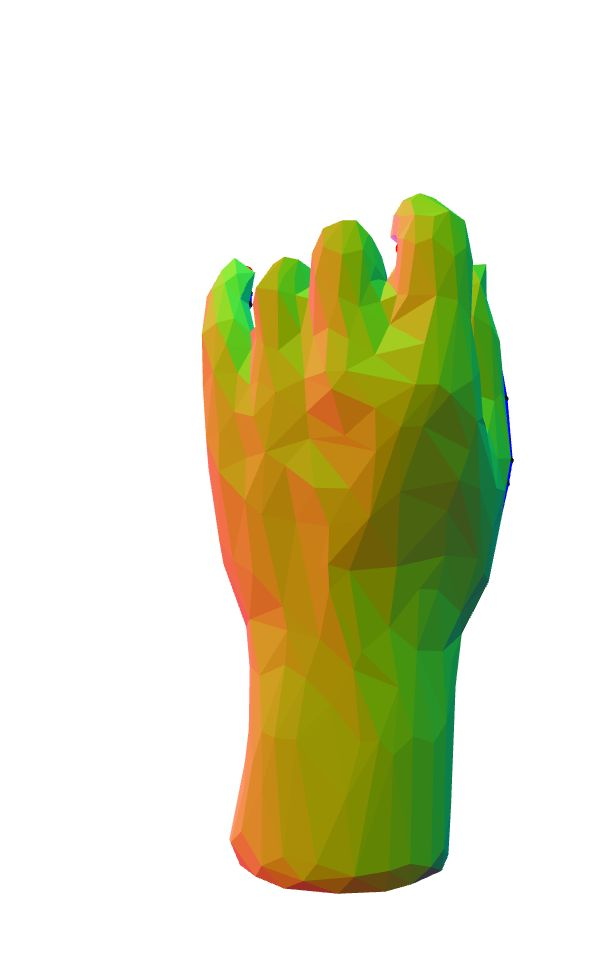

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Top of hand with fingers loosely curled down; ring finger sticking forward slightly more; thumb out
fit of correct guess: 3.1339543098156857


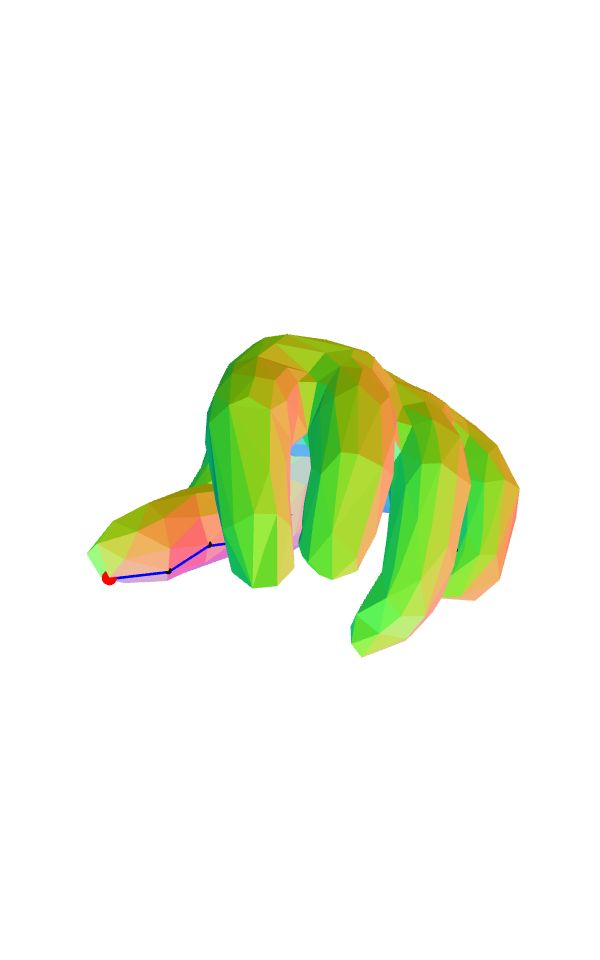

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
a hand pinching something
fit of correct guess: 0.6053658210503129


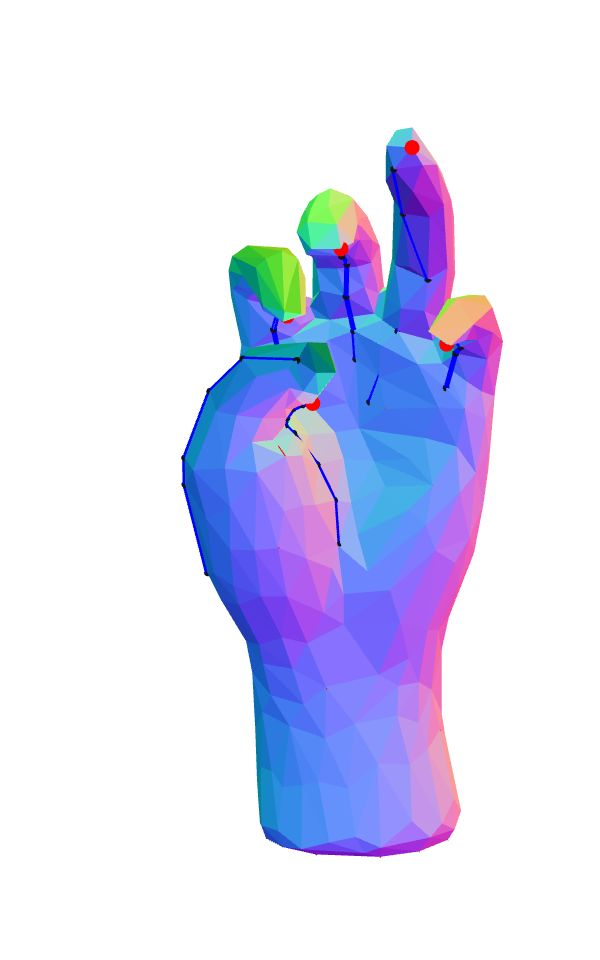

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
fist
fit of correct guess: 0.7034910150579701


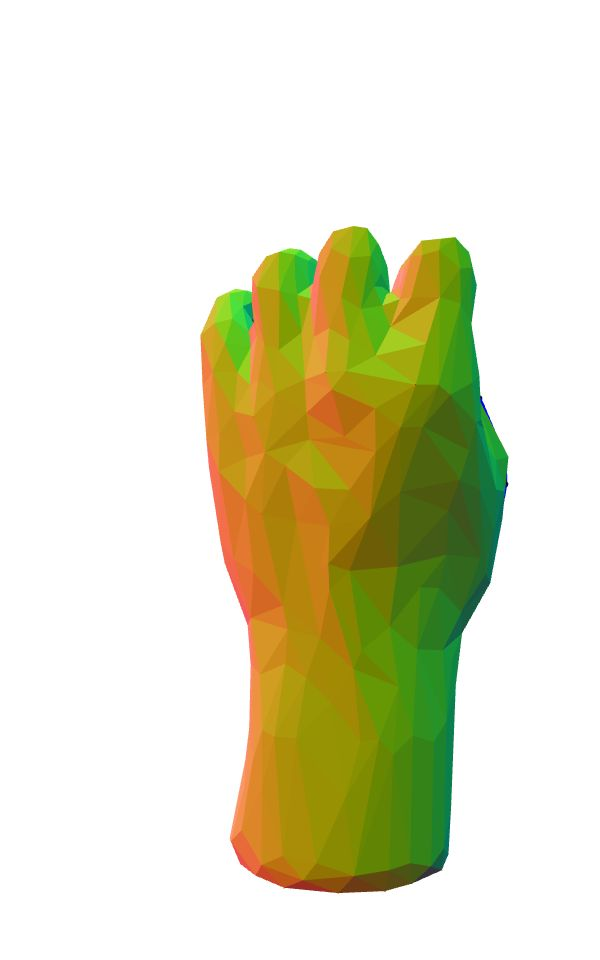

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
closed thumb slowly waving hand
fit of correct guess: 1.038791533708676


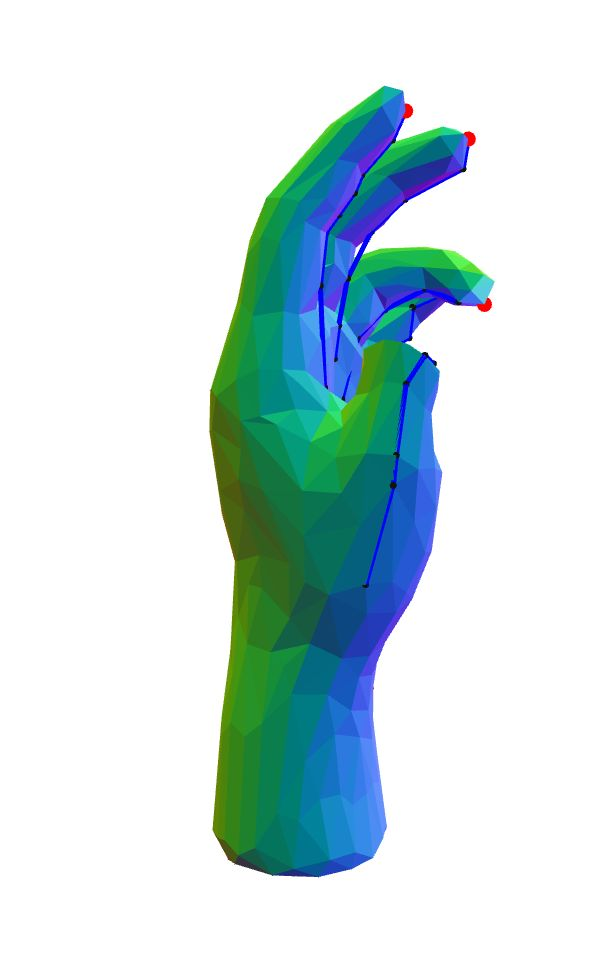

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb cramp and got stuck
fit of correct guess: 0.3608103499203944


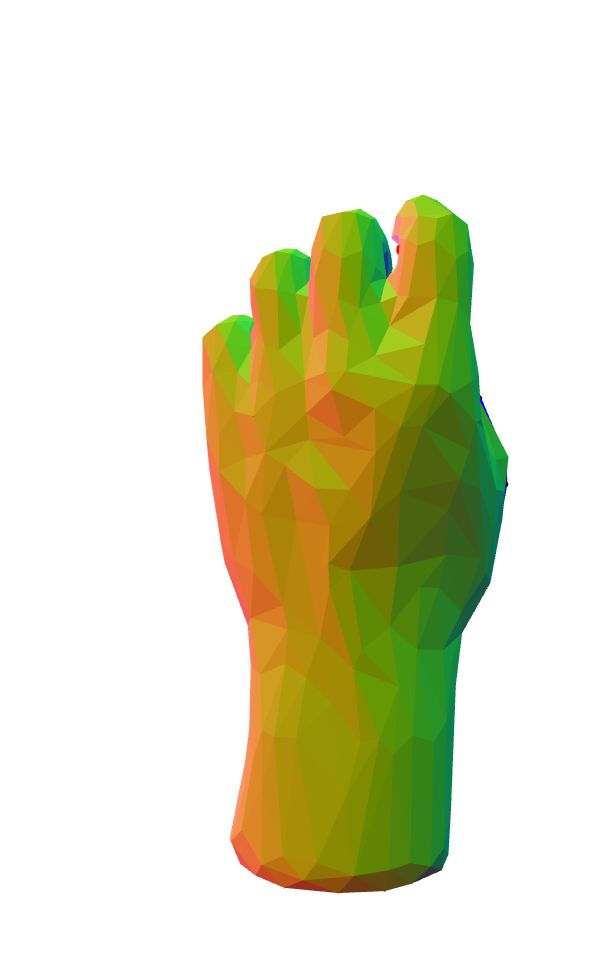

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
all fingers are slightly curled
fit of correct guess: 0.9284299960760451


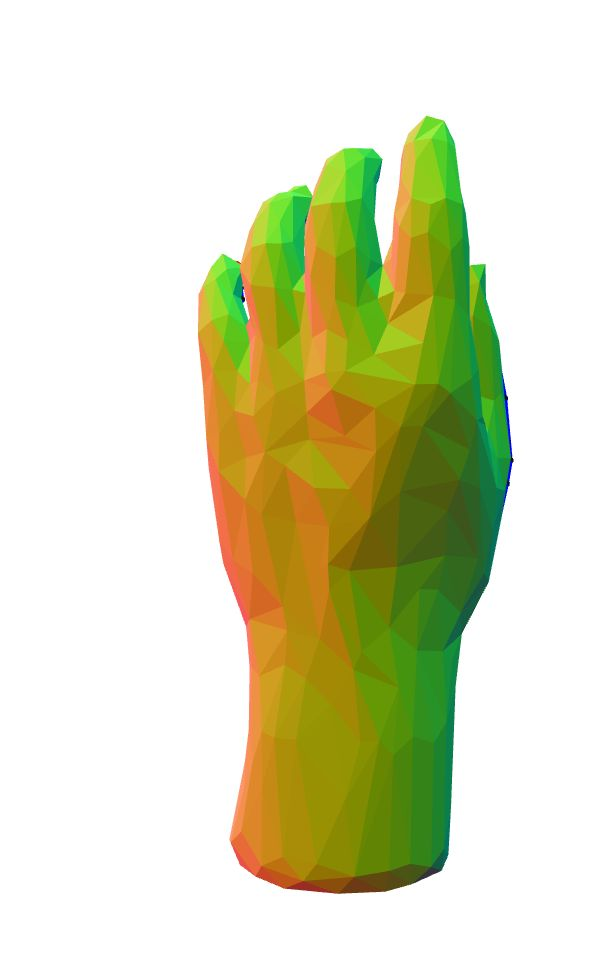

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb tucked under other fingers
fit of correct guess: 1.3448848407008884


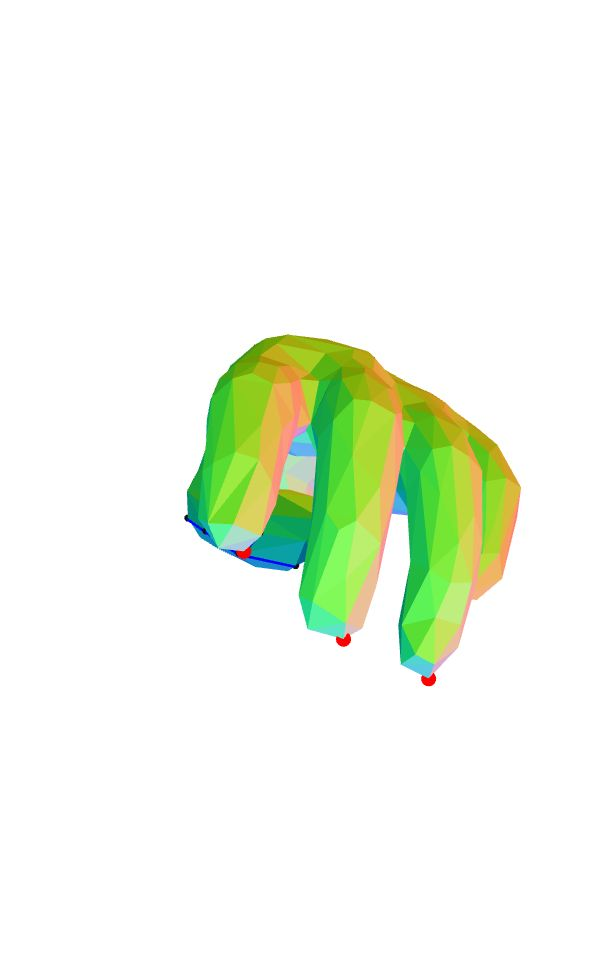

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of hand
fit of correct guess: 0.6541127876842484


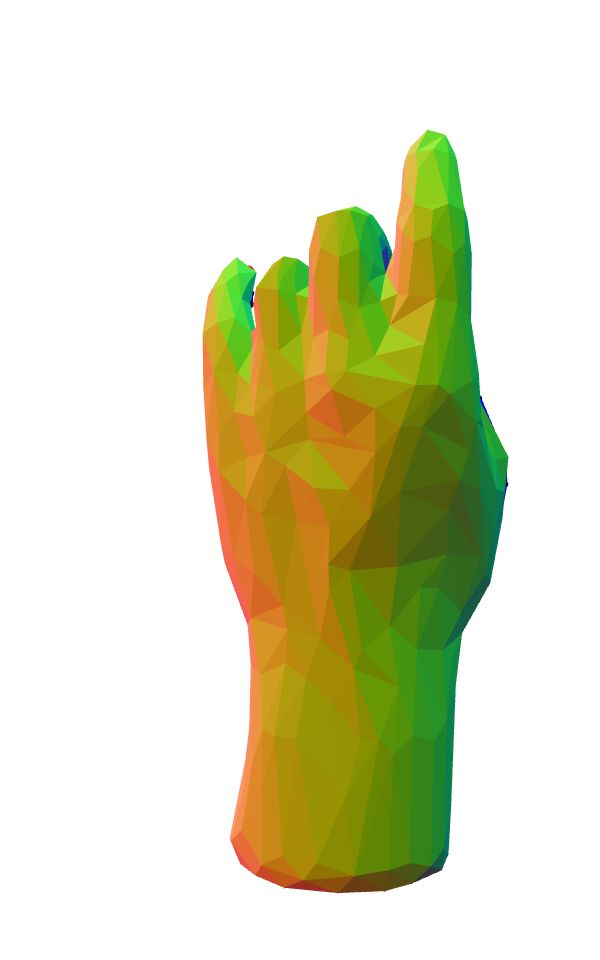

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand; fingers; and thumb are gently clawing a grainy surface like sand;;
fit of correct guess: 1.8470863742844423


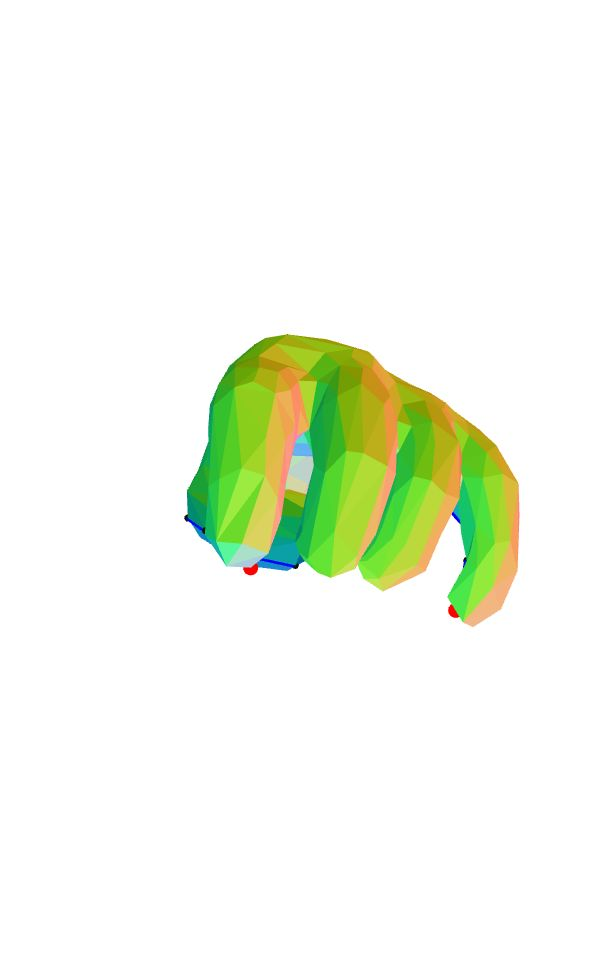

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of left hand with middle finger slightly raised
fit of correct guess: 1.4975312268139789


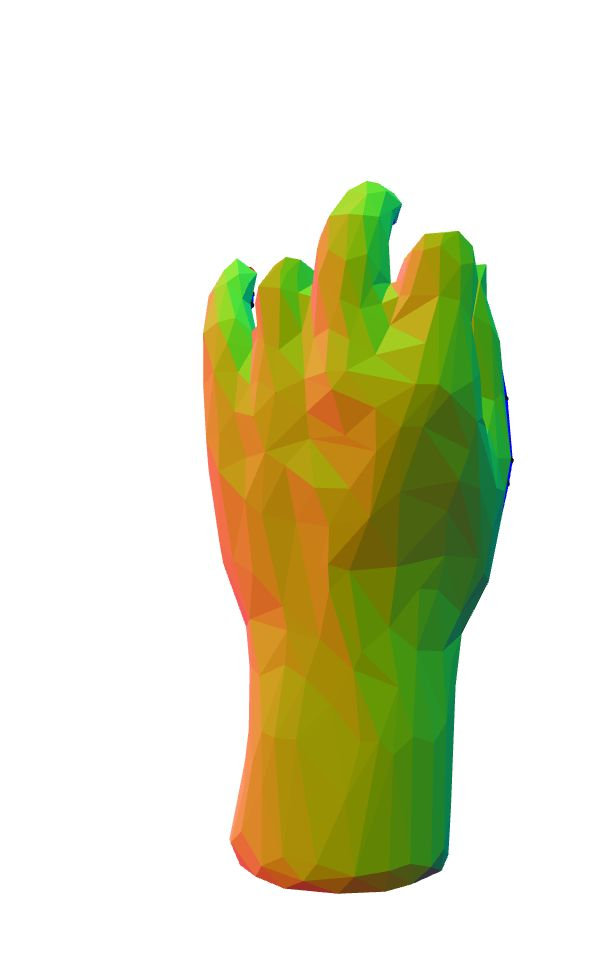

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
This hand looks like it is also reaching for something. Maybe it is about to pet a dog.
fit of correct guess: 3.696880469368002


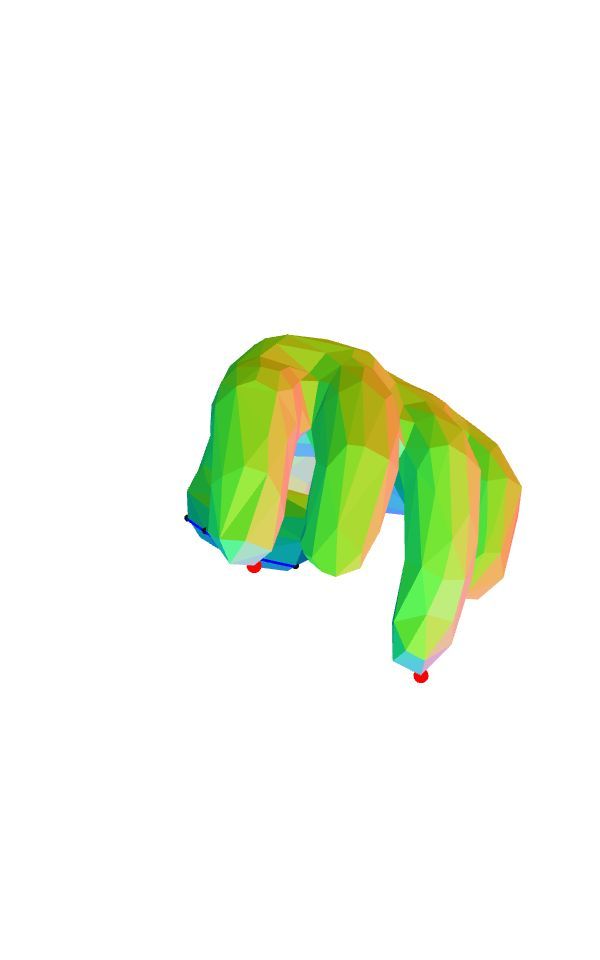

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand model
fit of correct guess: 0.5444197396644912


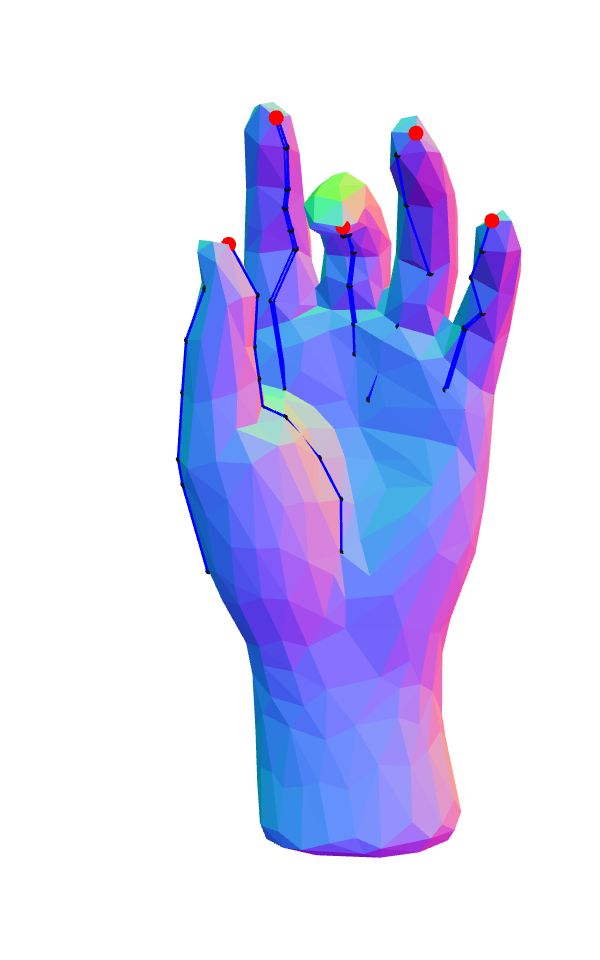

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand upright; fingers curled in; thumb out and middle finger curled tighter than others
fit of correct guess: 2.4236039935344977


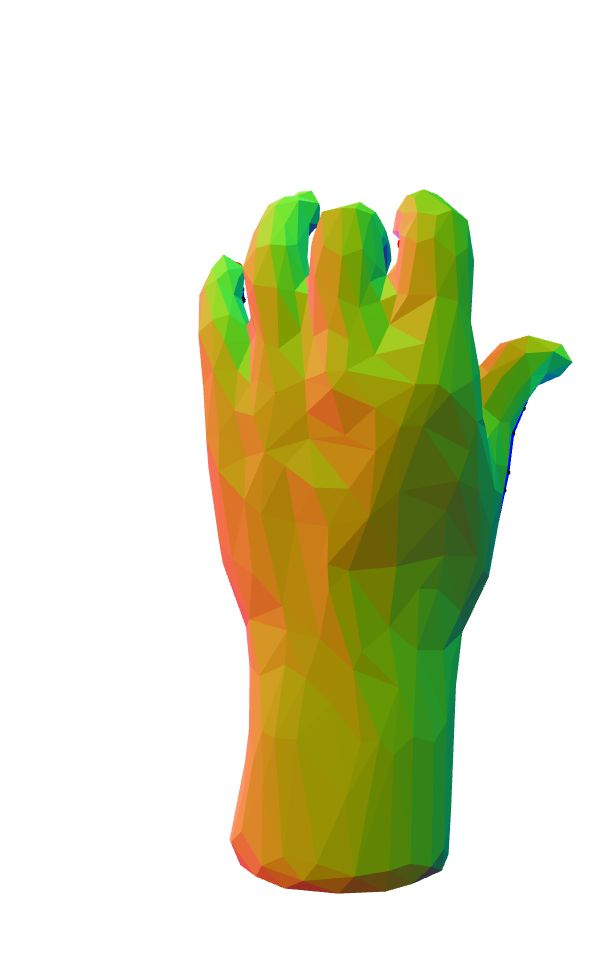

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
side view of fist
fit of correct guess: 1.3018193598844499


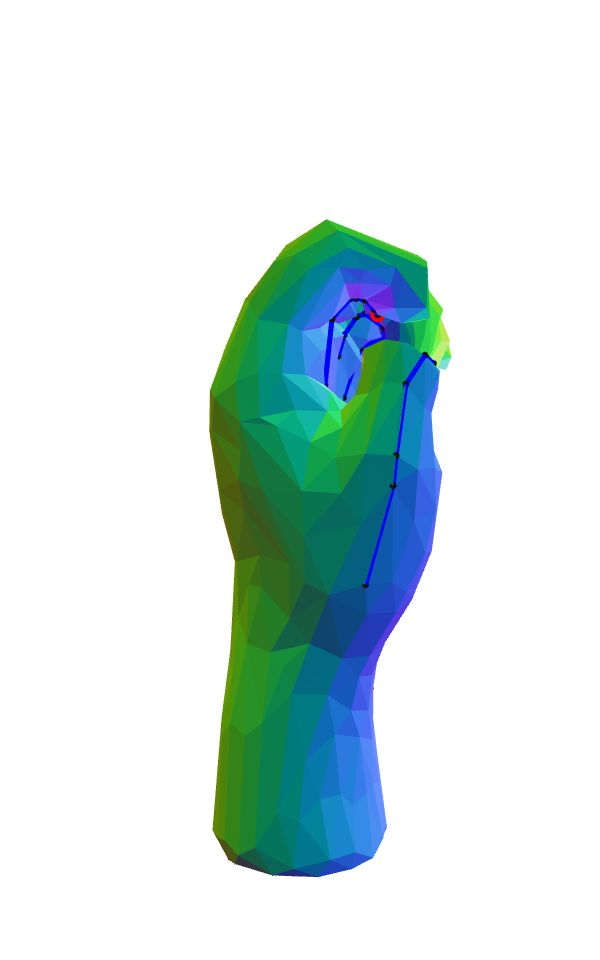

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
peacock hand
fit of correct guess: 0.4703105346525133


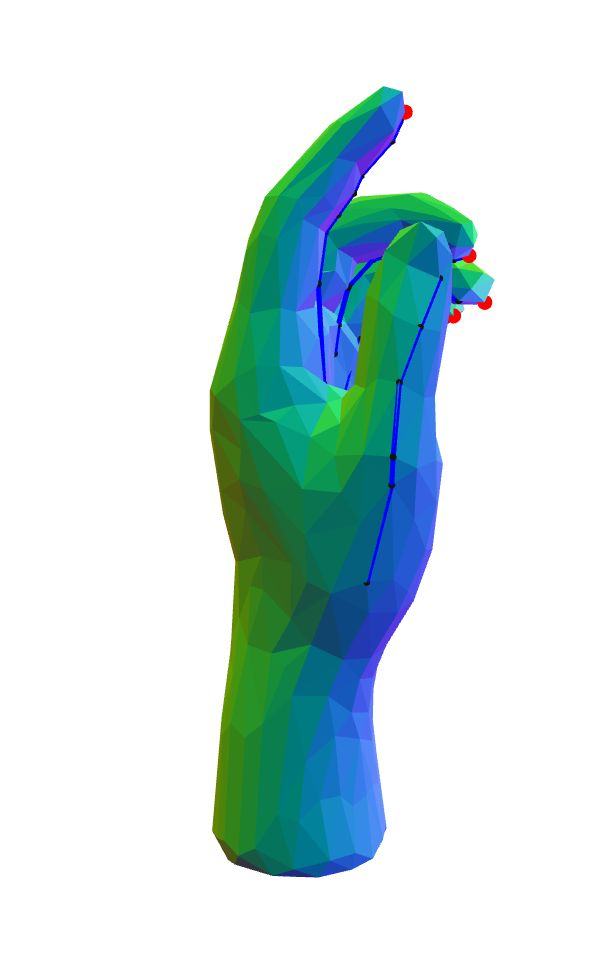

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Side view with thumb and index touching
fit of correct guess: 1.9064338949227824


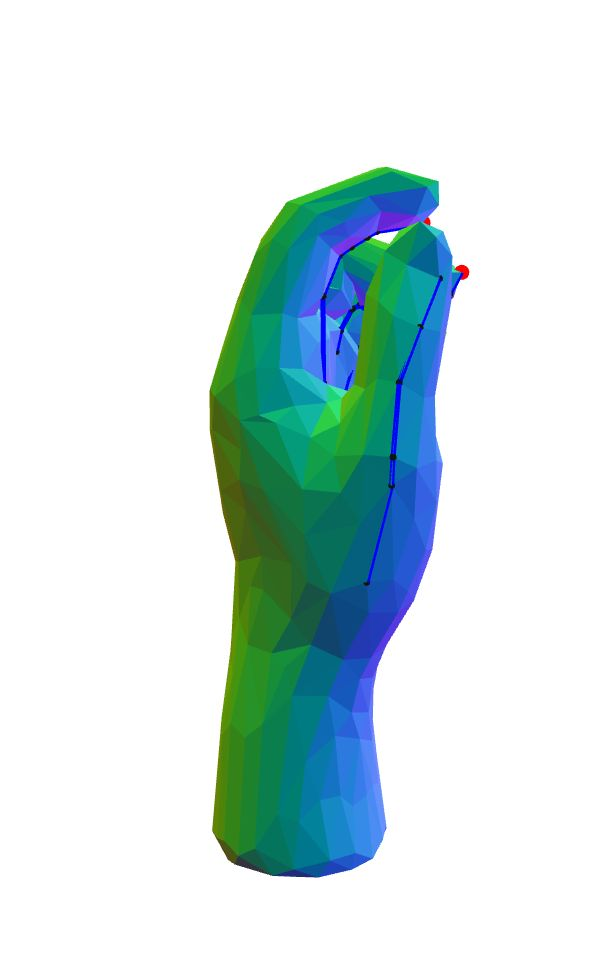

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
drumming their fingers on a desk
fit of correct guess: 1.6323440294782379


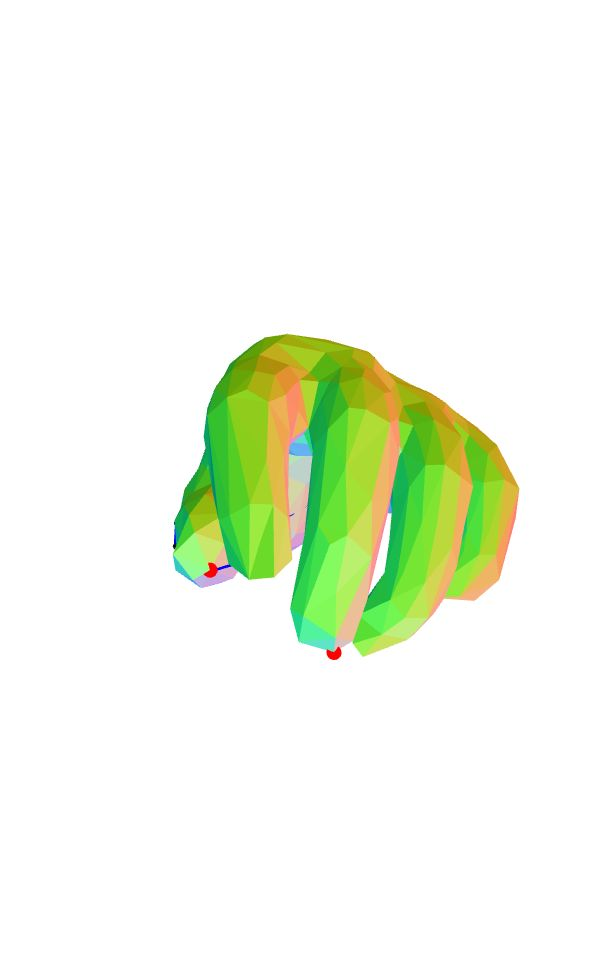

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of left hand with fingers curled down
fit of correct guess: 1.1715105245102242


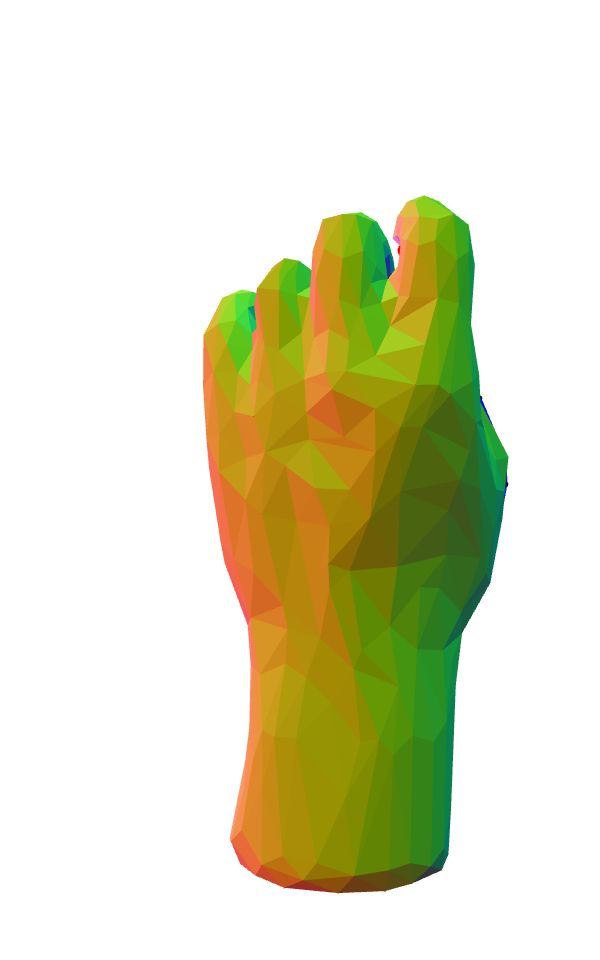

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Walking fingers
fit of correct guess: 0.5245379281056438


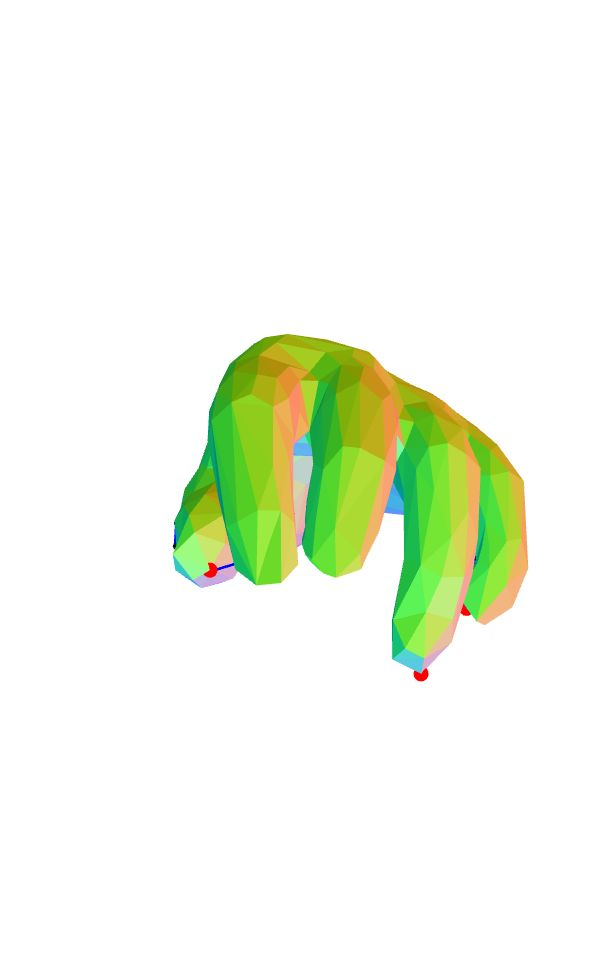

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Left hand; postured as if holding invisible microphone
fit of correct guess: 1.968416857545474


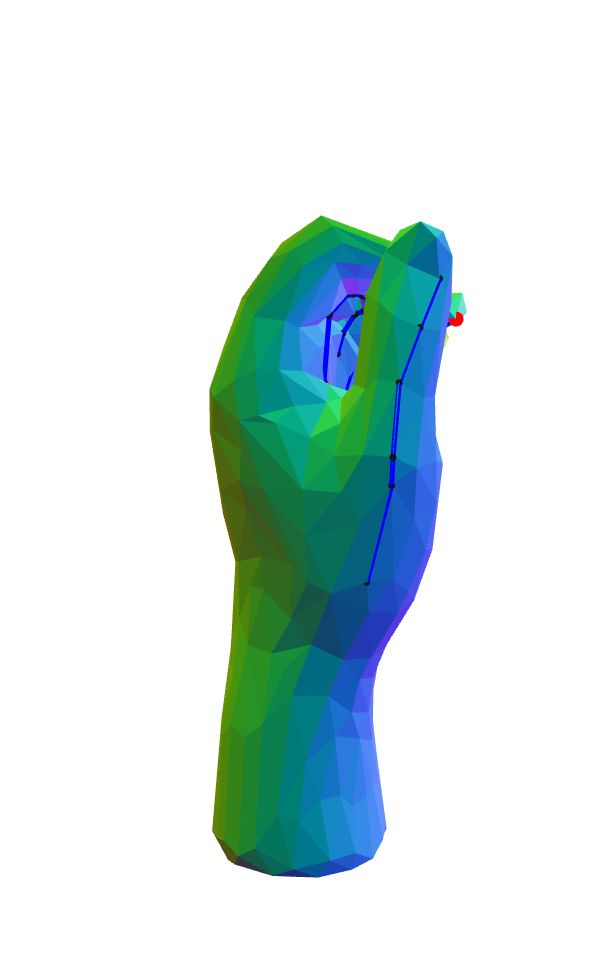

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Tapper - a gesture that resembles someone tapping a key on a keyboard.
fit of correct guess: 2.240008296446939


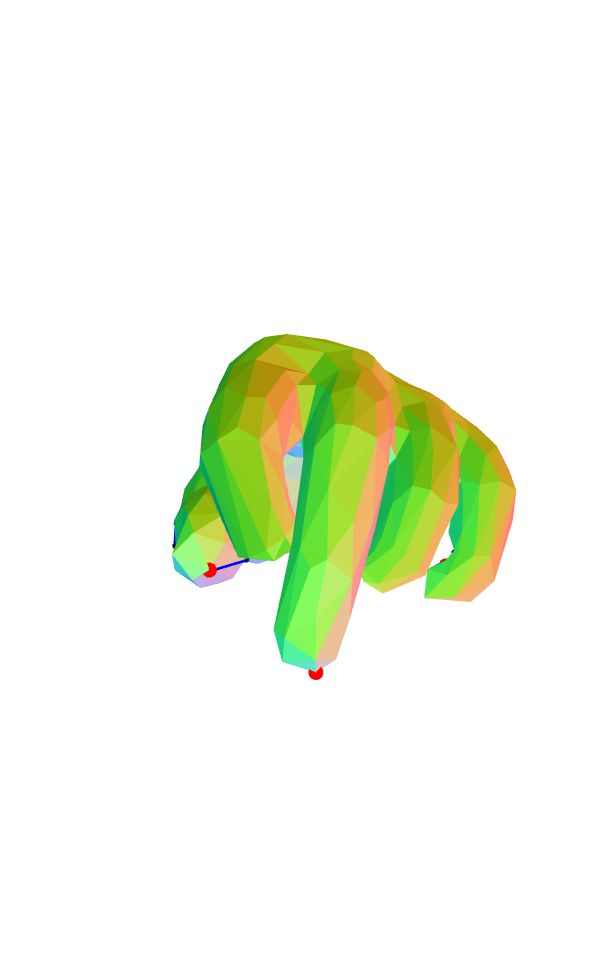

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Peace sign thumb up
fit of correct guess: 1.518688050878683


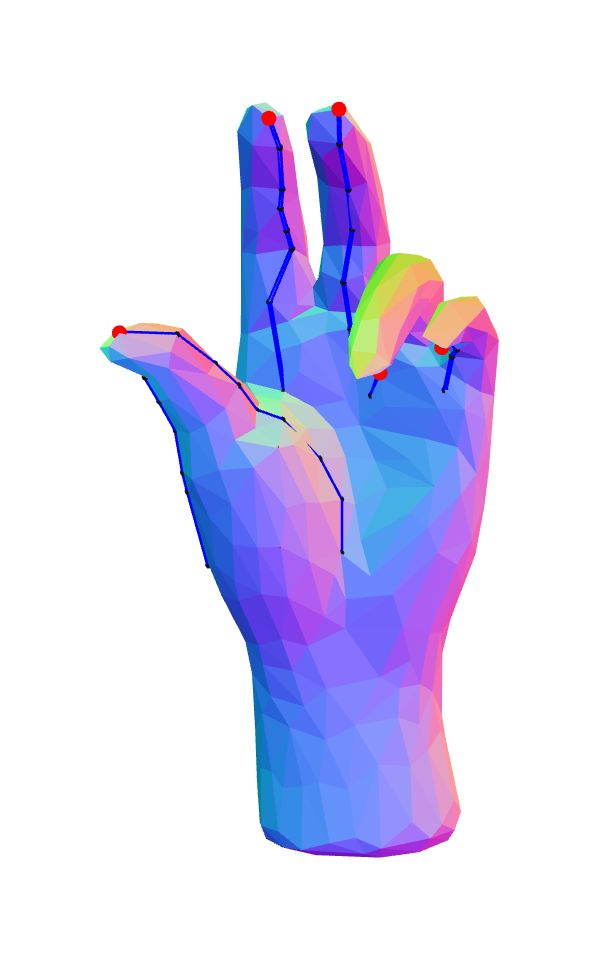

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
reaching pose
fit of correct guess: 0.761755520120428


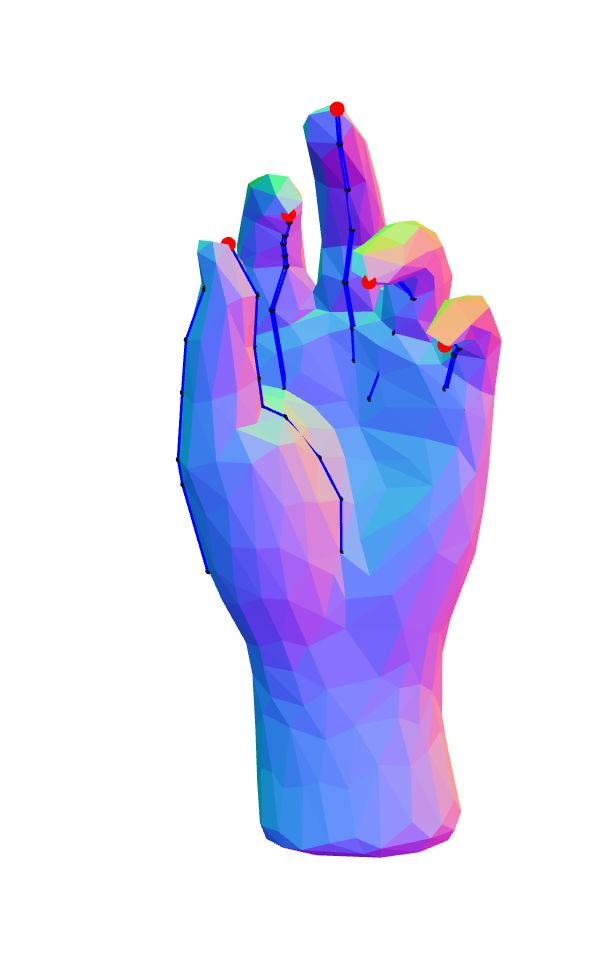

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Open paw shape
fit of correct guess: 1.1777046436409206


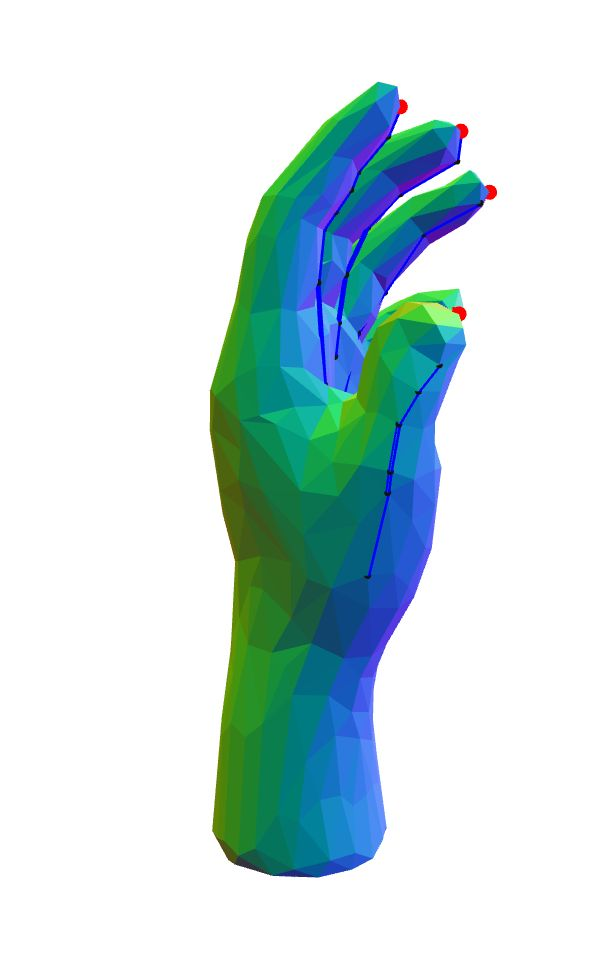

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Reaching outward and away for something
fit of correct guess: 0.9143411273446116


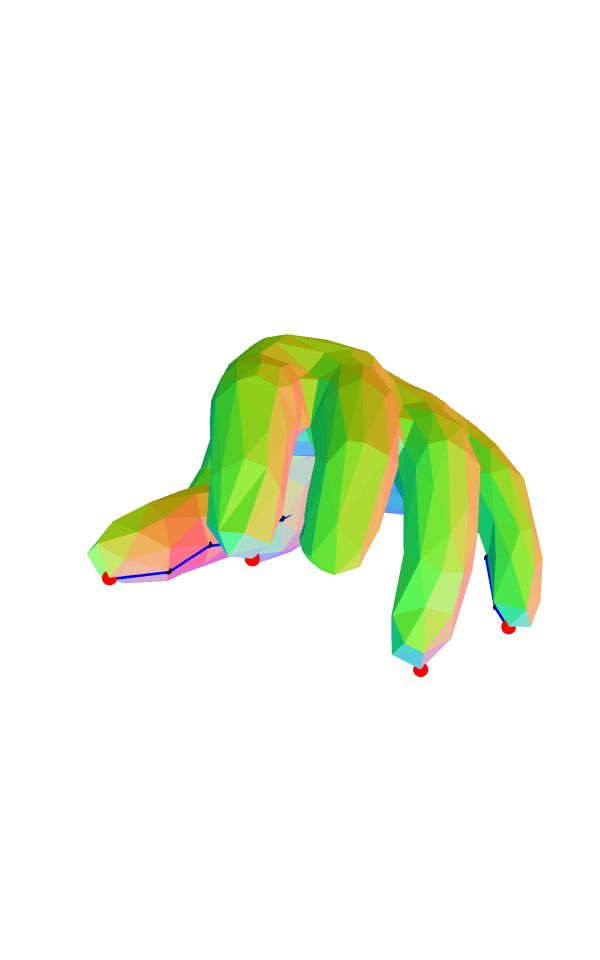

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
holding onto
fit of correct guess: 0.8381240654210955


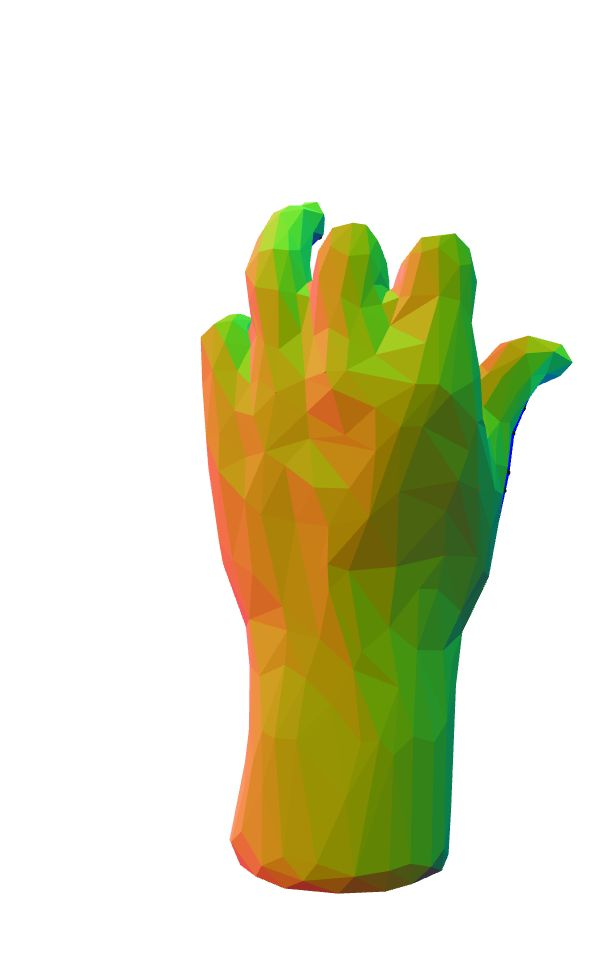

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Middle finger flick
fit of correct guess: 0.8454769344603461


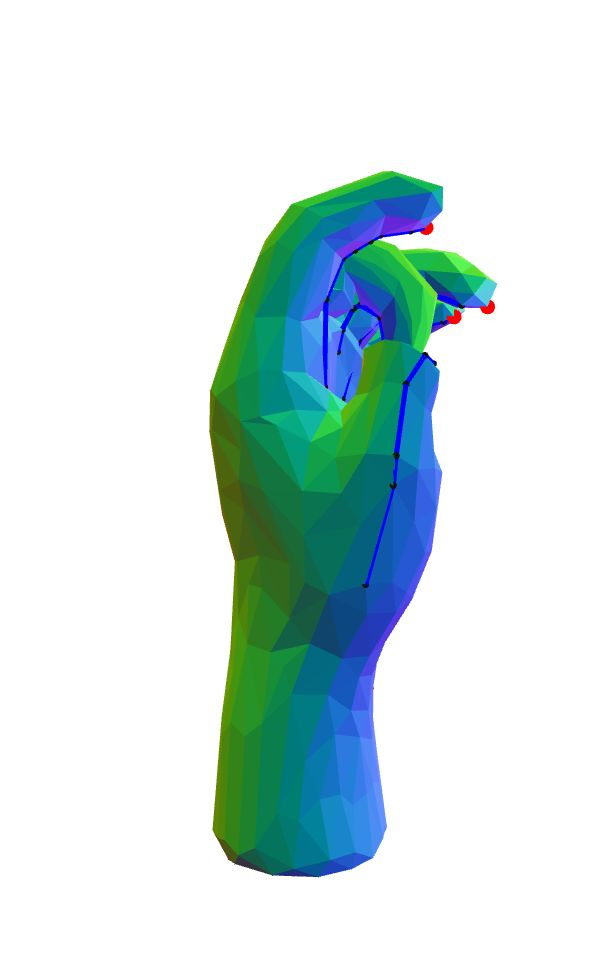

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
claw
fit of correct guess: 0.37193711988601463


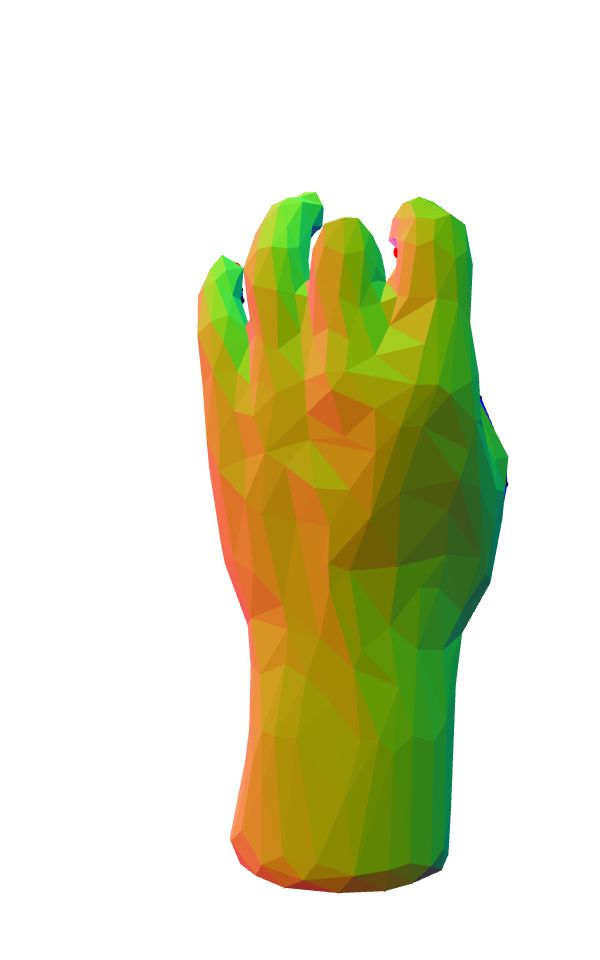

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand with middle and thumb touching
fit of correct guess: 0.7900484757938362


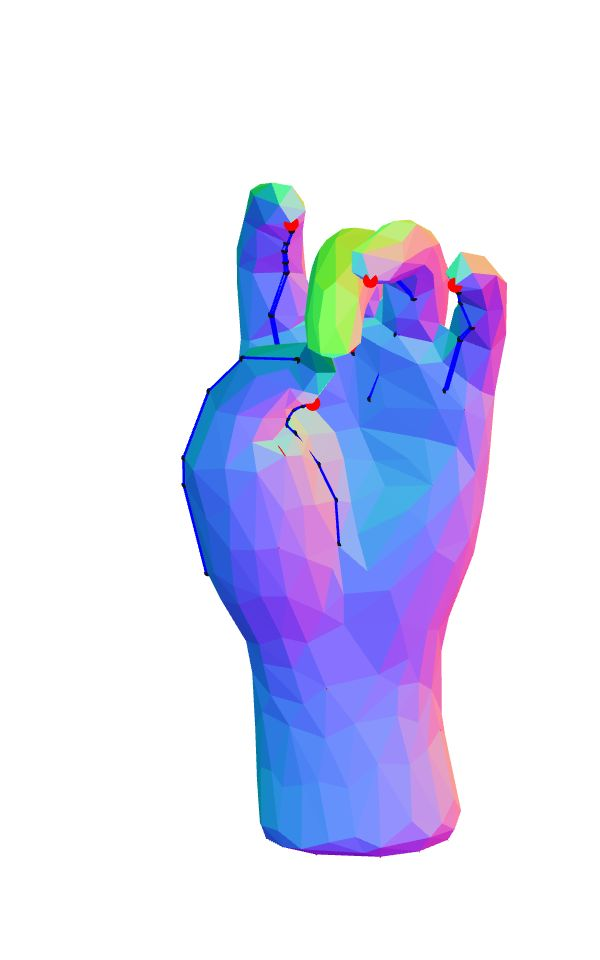

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
I am angry.
fit of correct guess: 0.7627733355989013


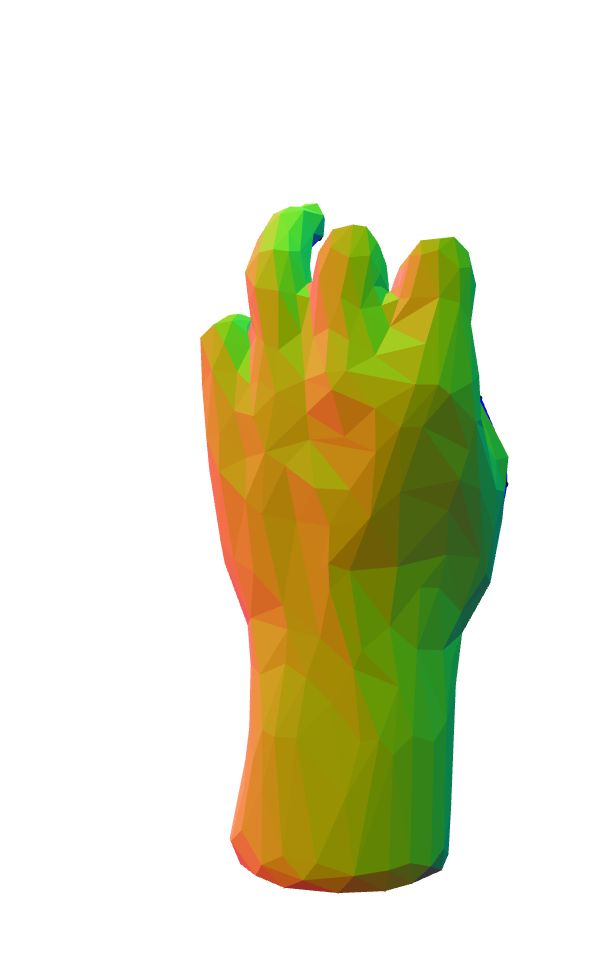

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
all fingers except the thumb is curled into the palm
fit of correct guess: 1.6626280269919336


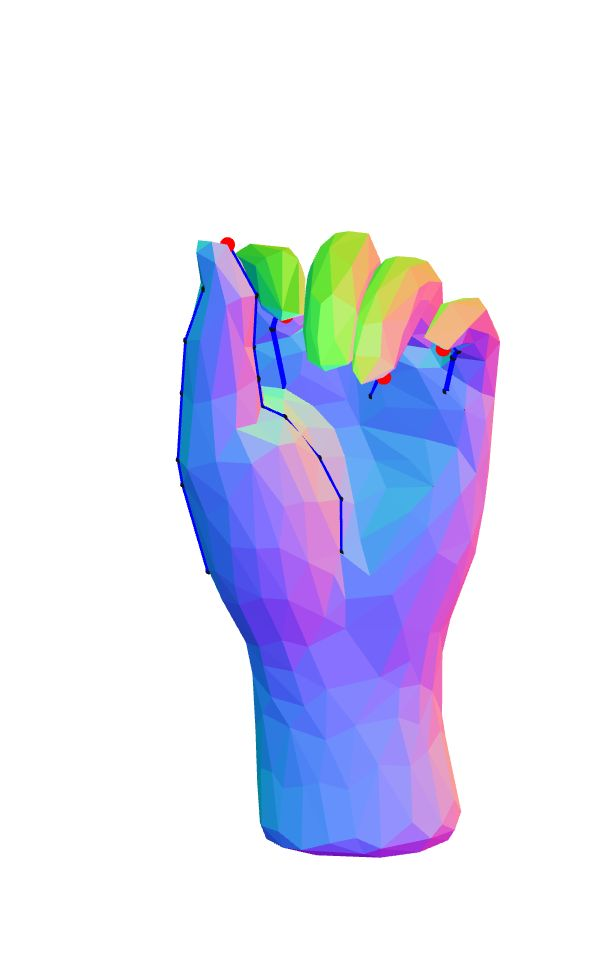

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
musical
fit of correct guess: 0.5101048888222084


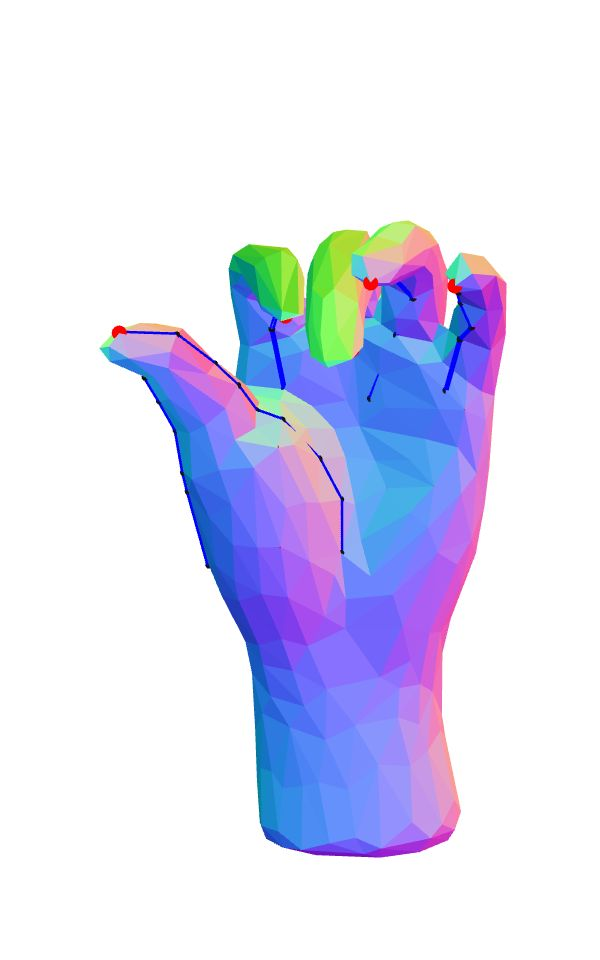

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand reaching for grabbing
fit of correct guess: 1.0353931135750618


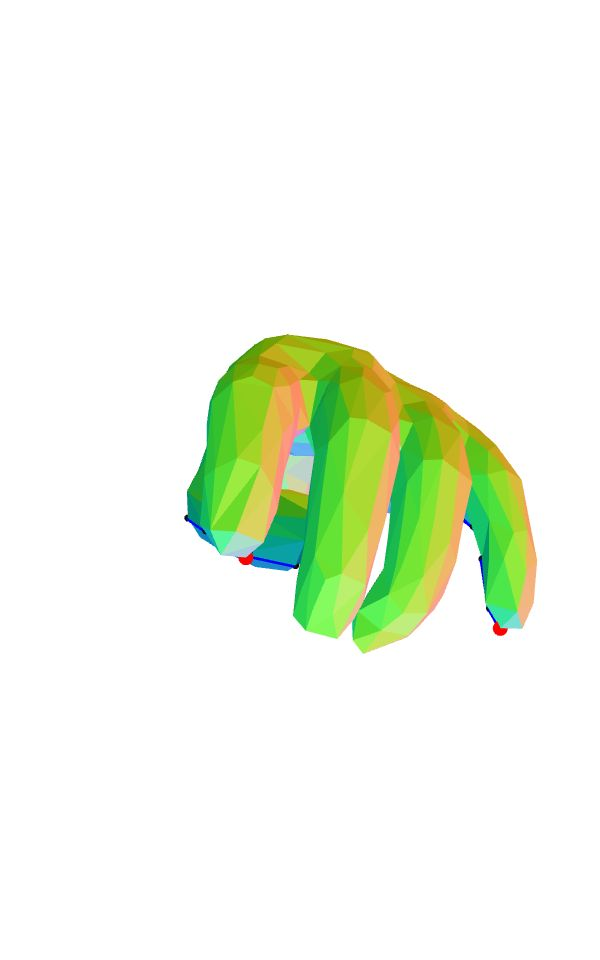

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
a crawling face down left hand
fit of correct guess: 1.5617484630146274


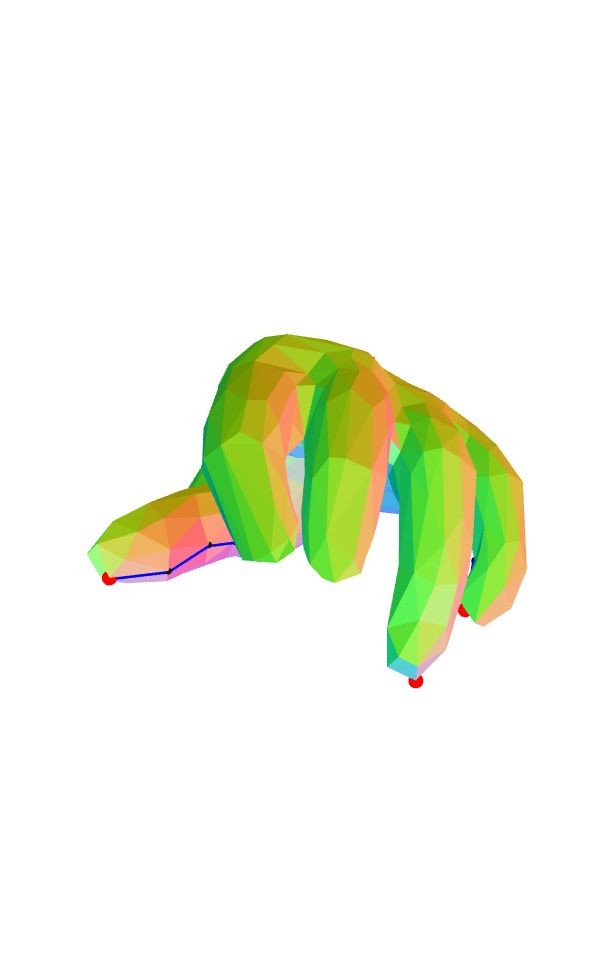

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The hand is bending the middle finger s the the thumb is pushing against it.
fit of correct guess: 0.9465704934190292


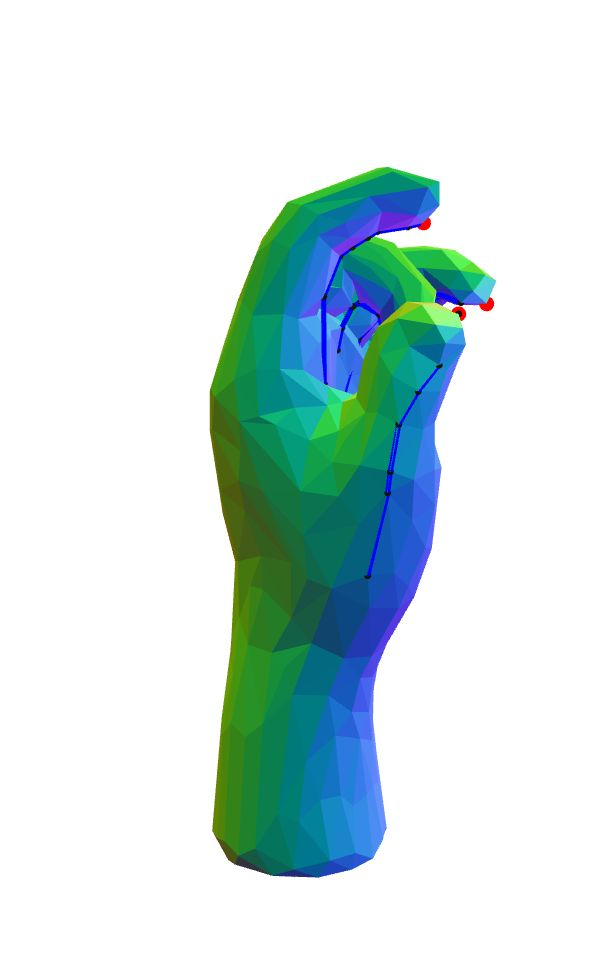

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
ominous
fit of correct guess: 0.3922661085053455


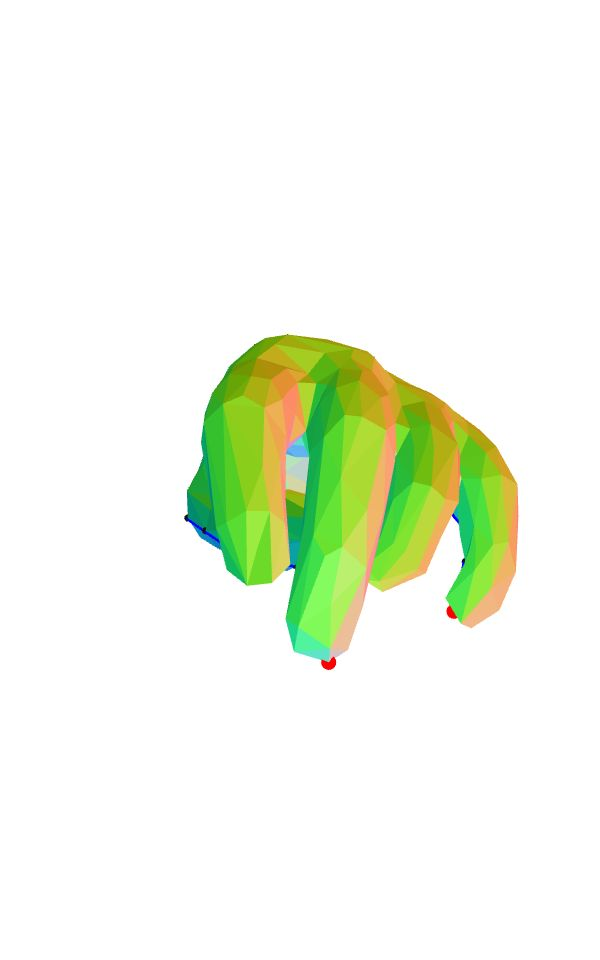

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
okay
fit of correct guess: 0.39233379580512195


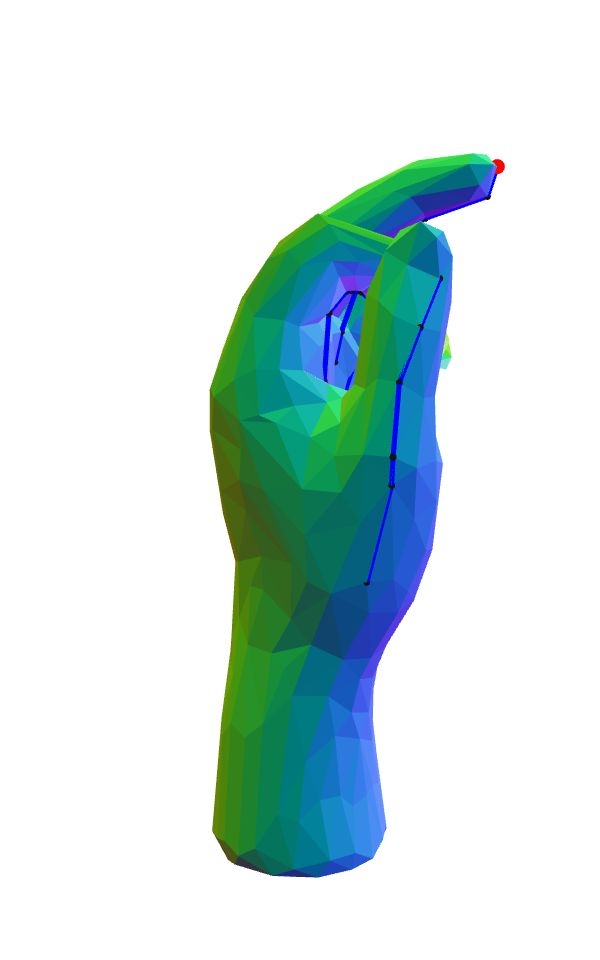

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Vertical hand; palm facing forward; thumb extended; 1st; 3rd; 4th finger flexed.
fit of correct guess: 3.2233949286450163


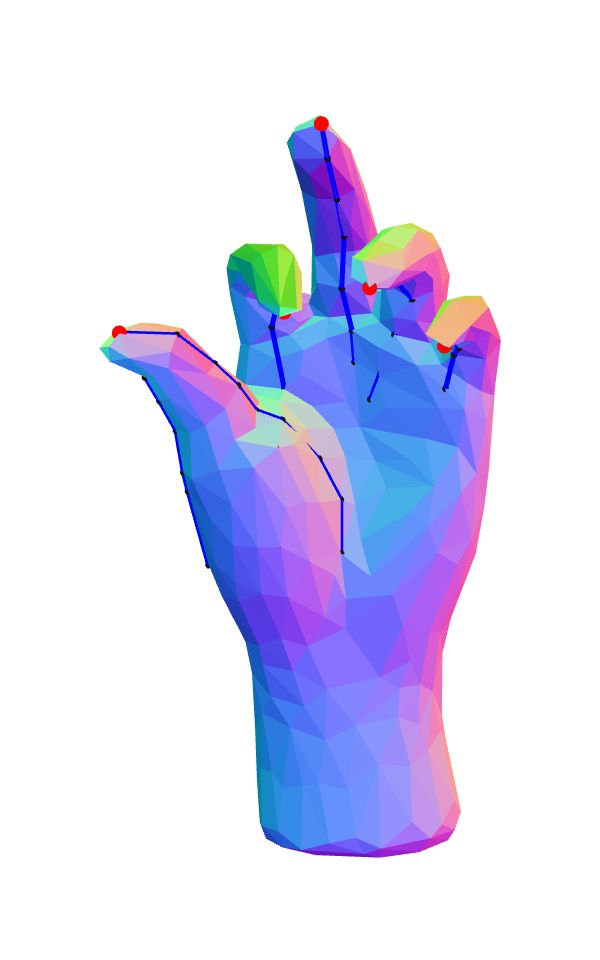

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand held up with fingers slightly bent down and index pointing up and barely bent down .
fit of correct guess: 2.9272572648019897


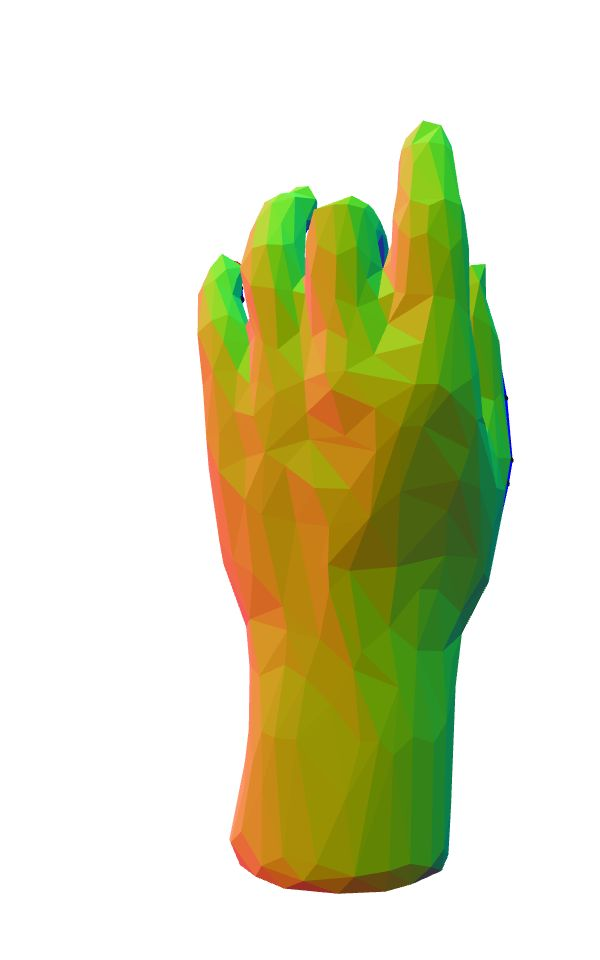

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
creepy
fit of correct guess: 0.3601465319041494


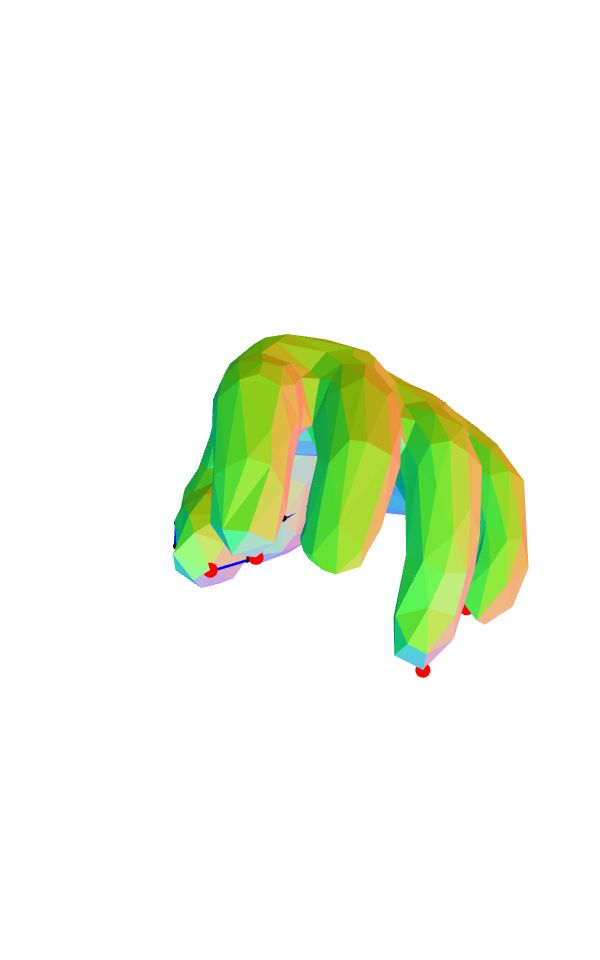

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Fingers very loosely bent down .
fit of correct guess: 1.448843836664972


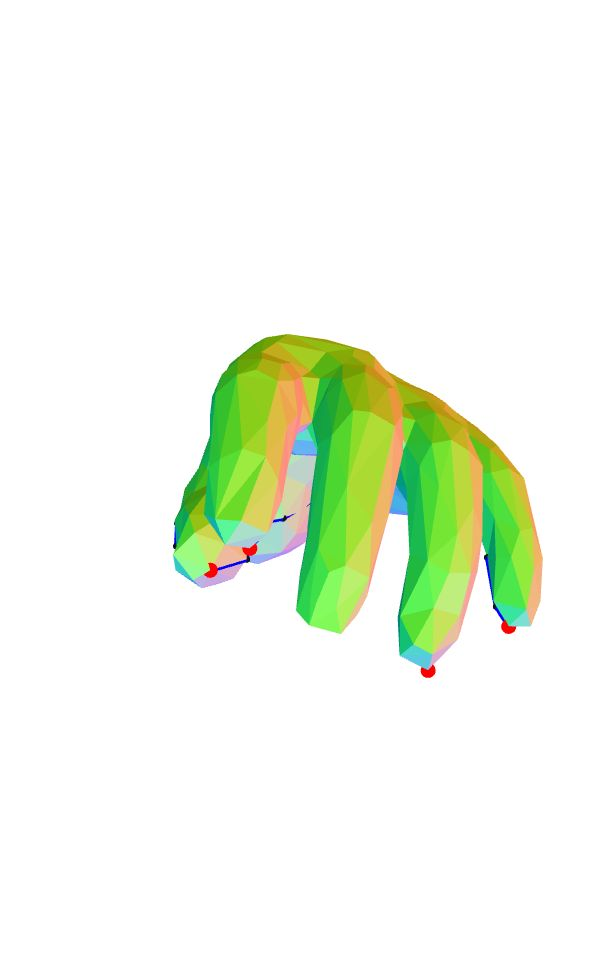

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
I am here.;;
fit of correct guess: 1.010766605817496


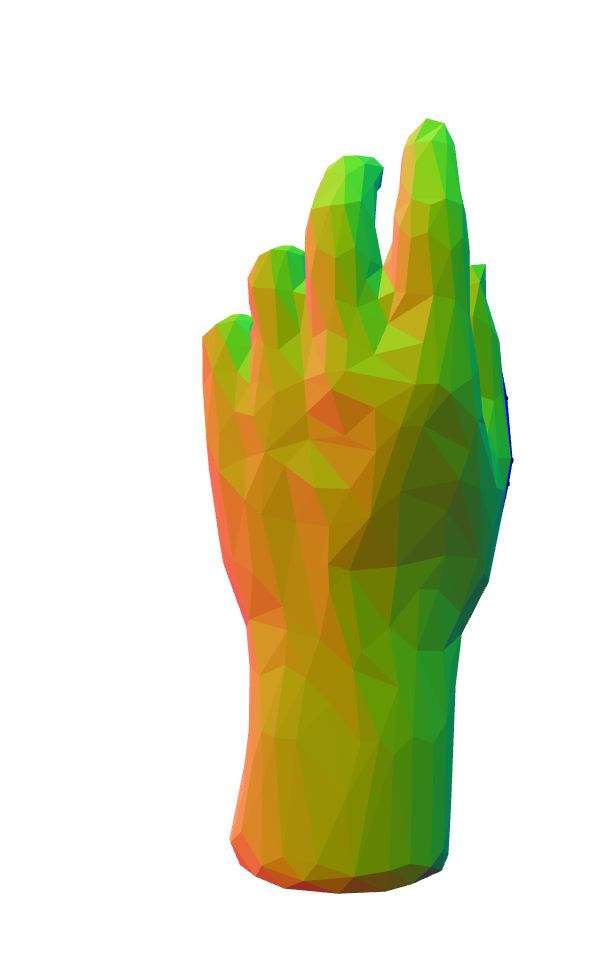

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Almost okay; but still drunk
fit of correct guess: 2.2393543038318993


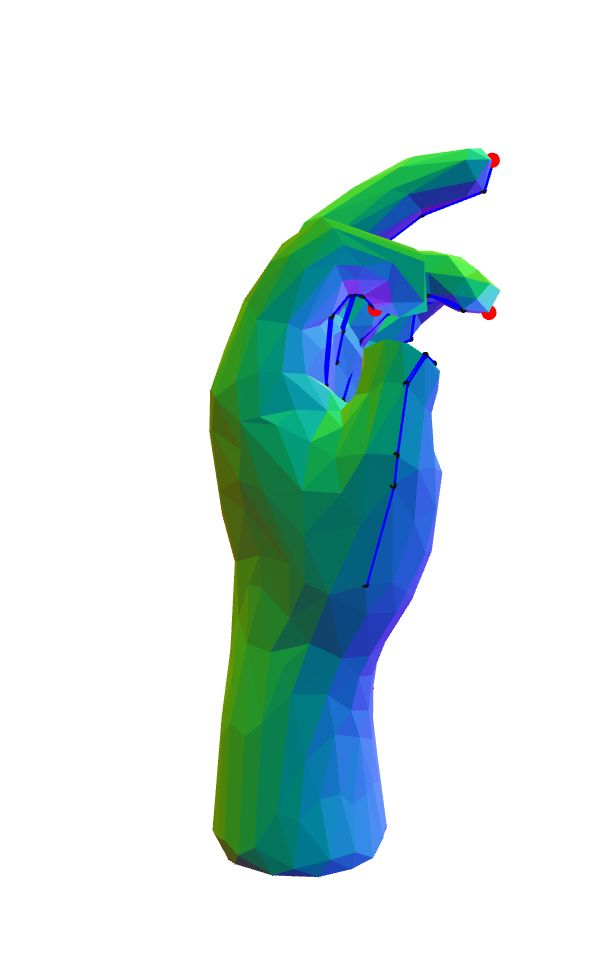

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
tight circle with index finger and thumb
fit of correct guess: 0.9235554009282181


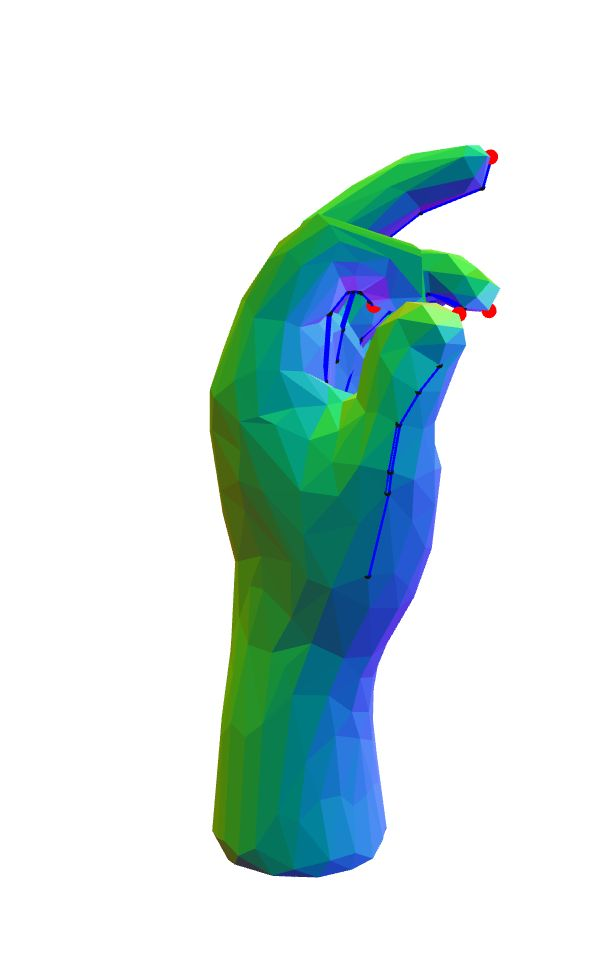

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
About to flip someone off
fit of correct guess: 1.5112057162615677


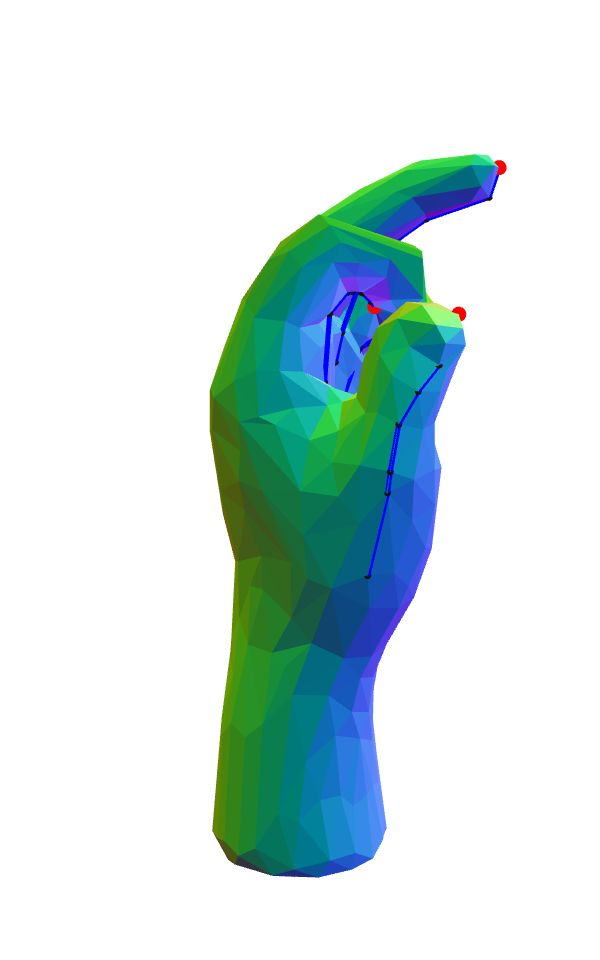

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Having a question
fit of correct guess: 0.473522233442405


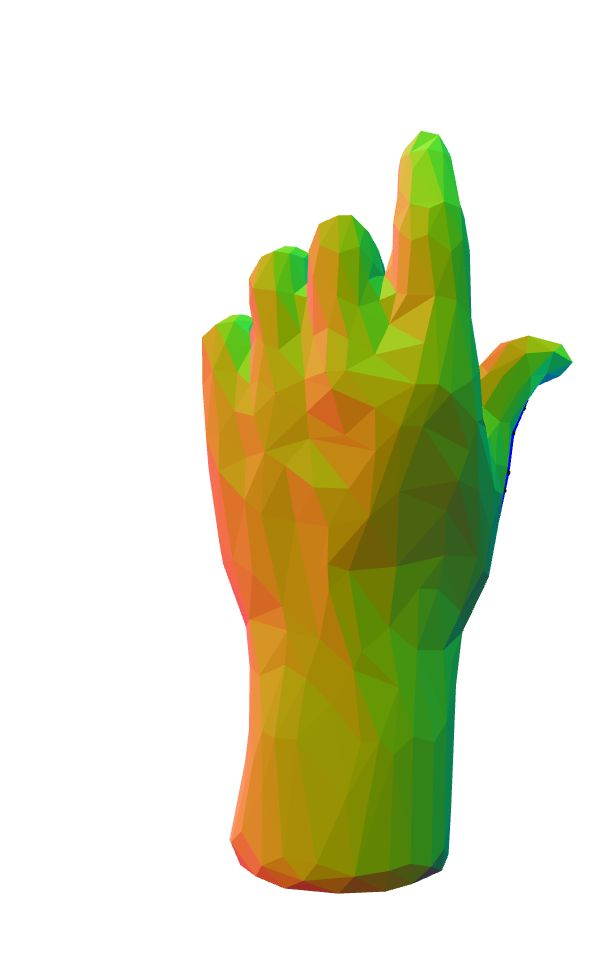

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
making a fist
fit of correct guess: 0.7377874773155315


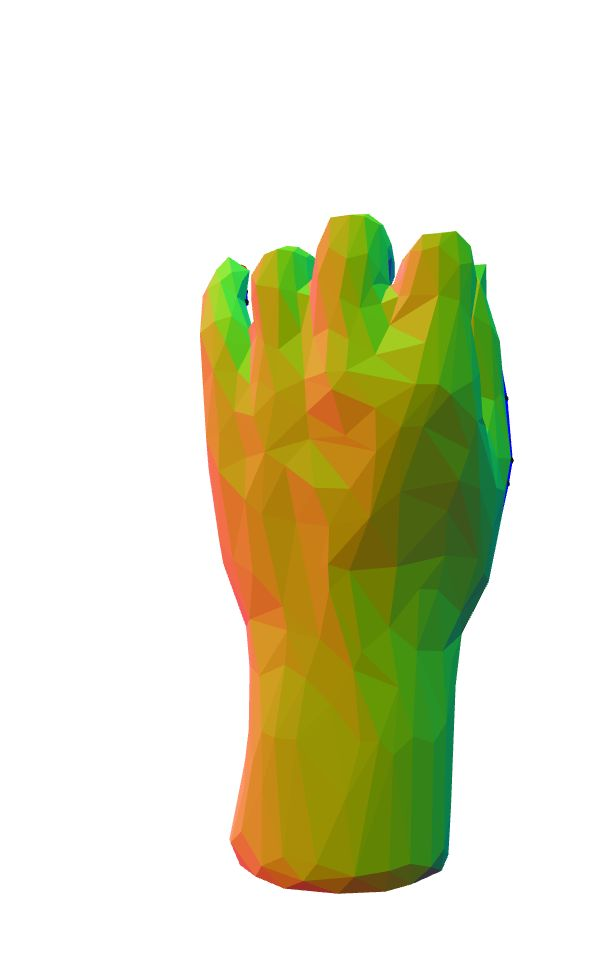

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
side view of fist
fit of correct guess: 0.992033884781917


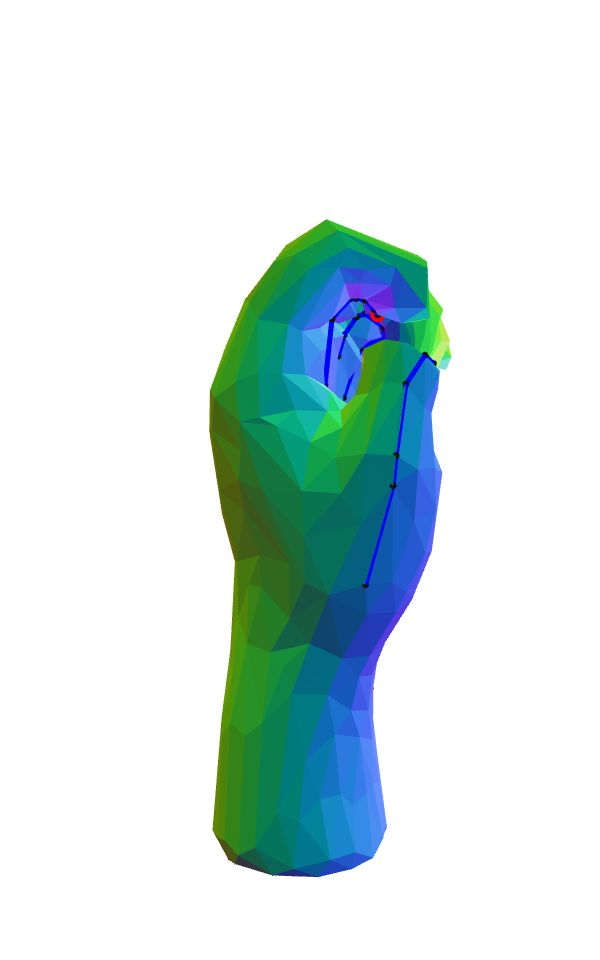

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
about to raise their fingers to sign I love you
fit of correct guess: 2.266833282293164


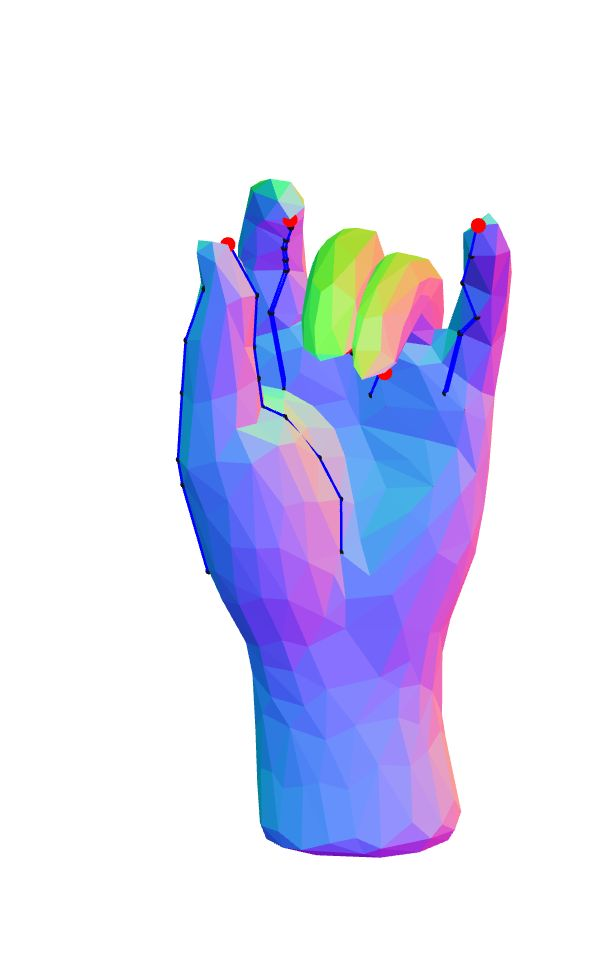

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Pistol pose
fit of correct guess: 0.820362216865768


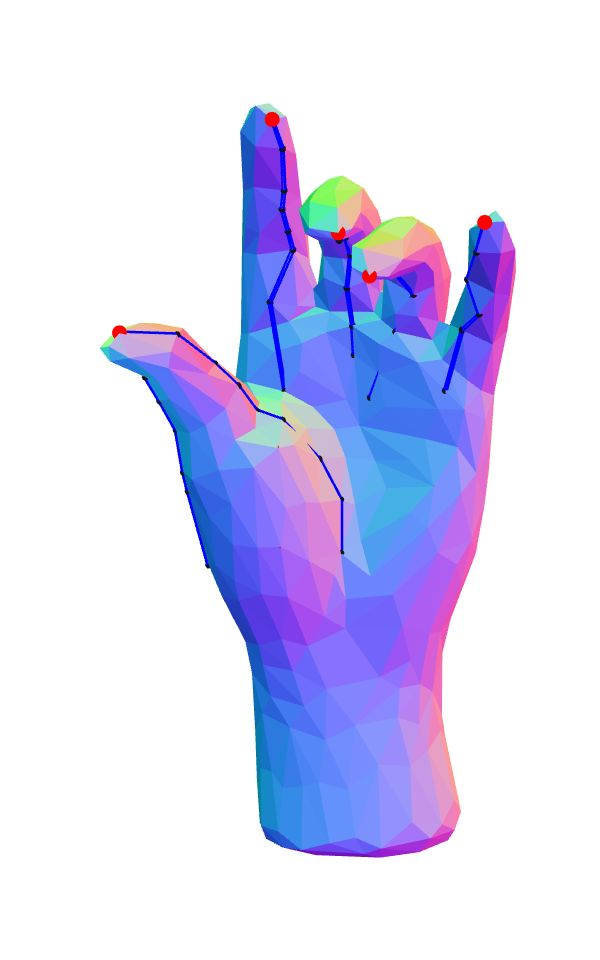

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
front of left hand with all fingers standing up and index finger curled under
fit of correct guess: 2.176736227073341


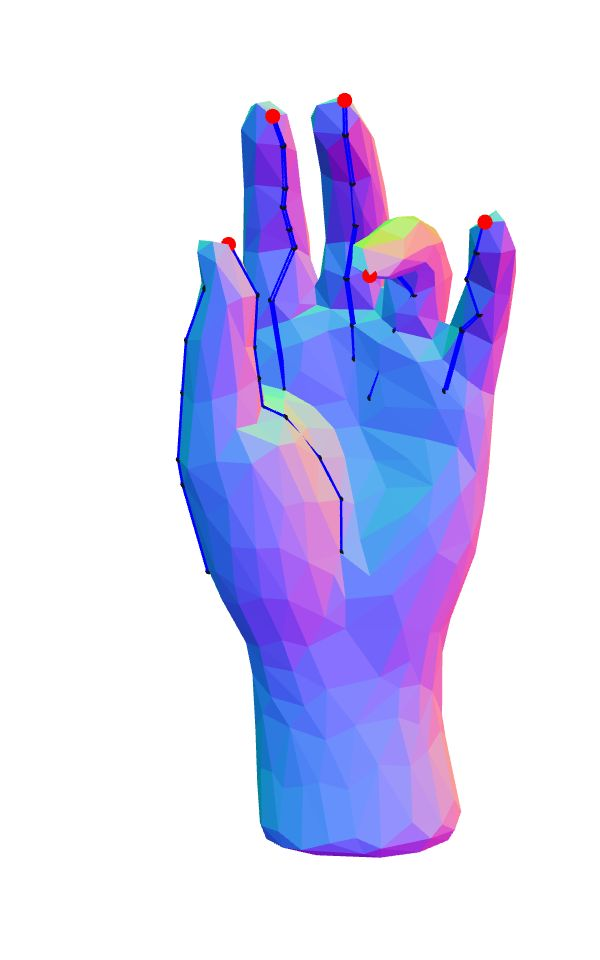

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
The thumb and ring finger are touching.
fit of correct guess: 0.7012822057491813


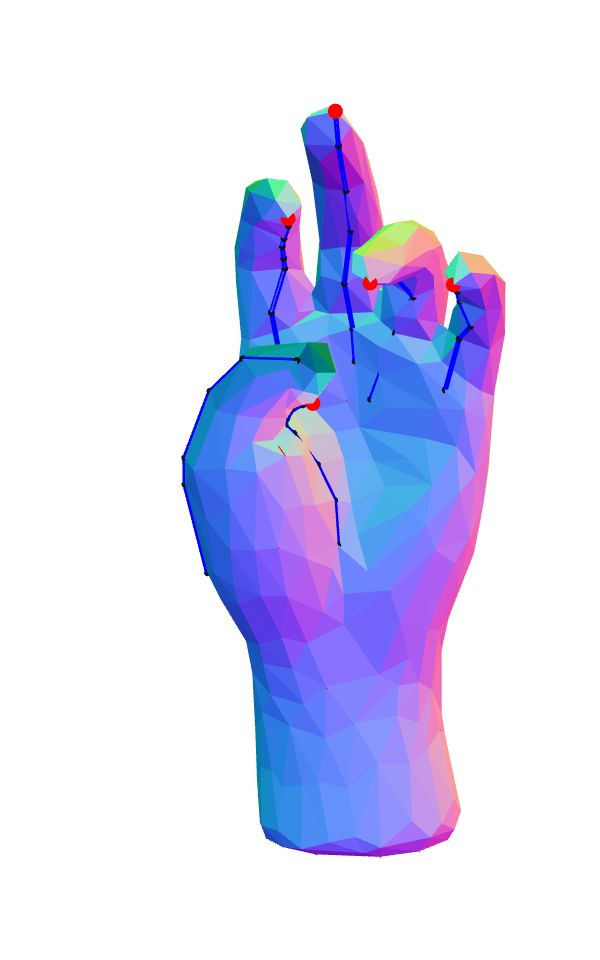

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
vertical hand; second finger and thumb pointing up; rest loosely curled
fit of correct guess: 2.1005009374659642


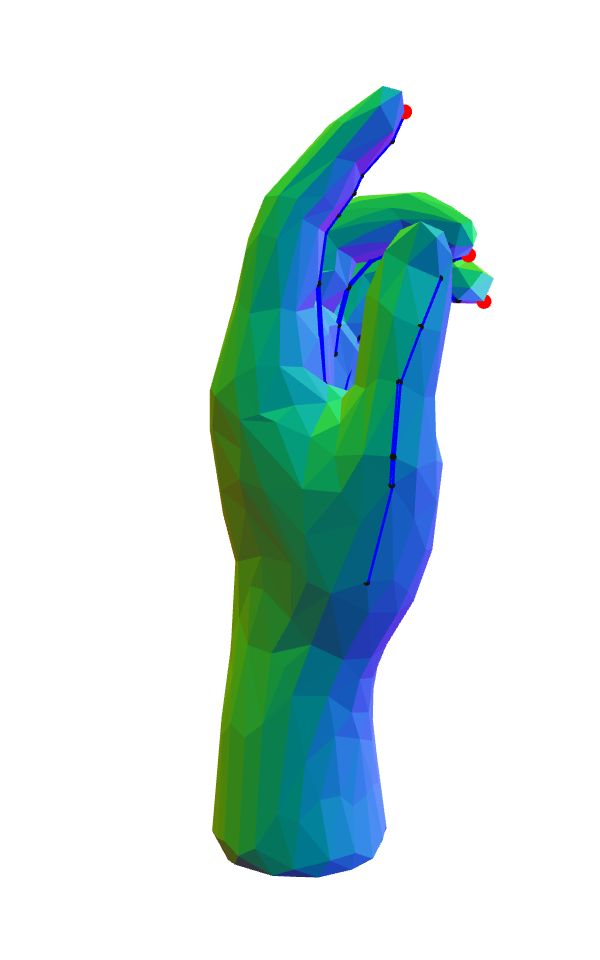

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
This hand looks like it is also reaching for something. Maybe it is about to pet a dog.
fit of correct guess: 0.48449448308087034


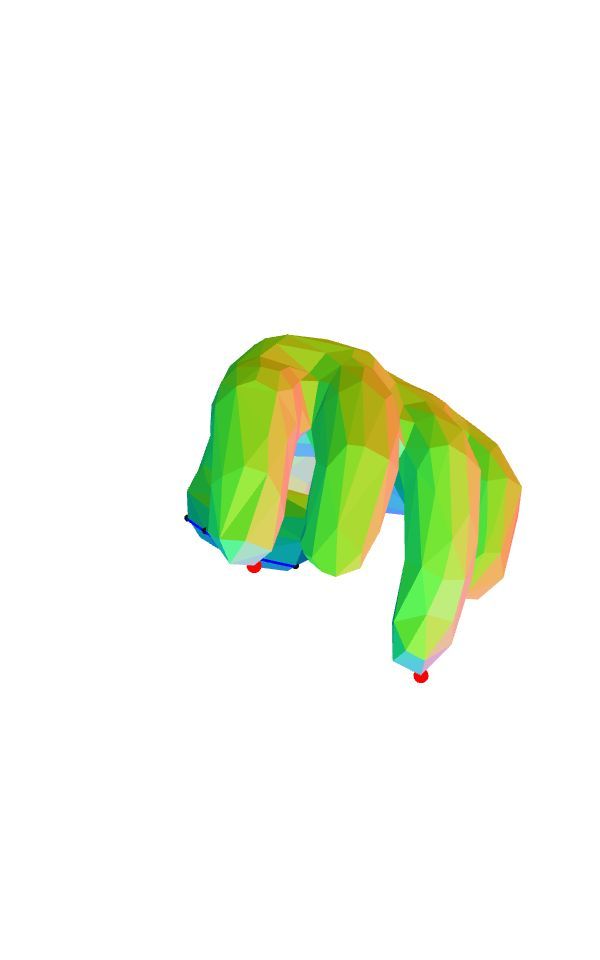

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Walking fingers on table
fit of correct guess: 1.335400836635343


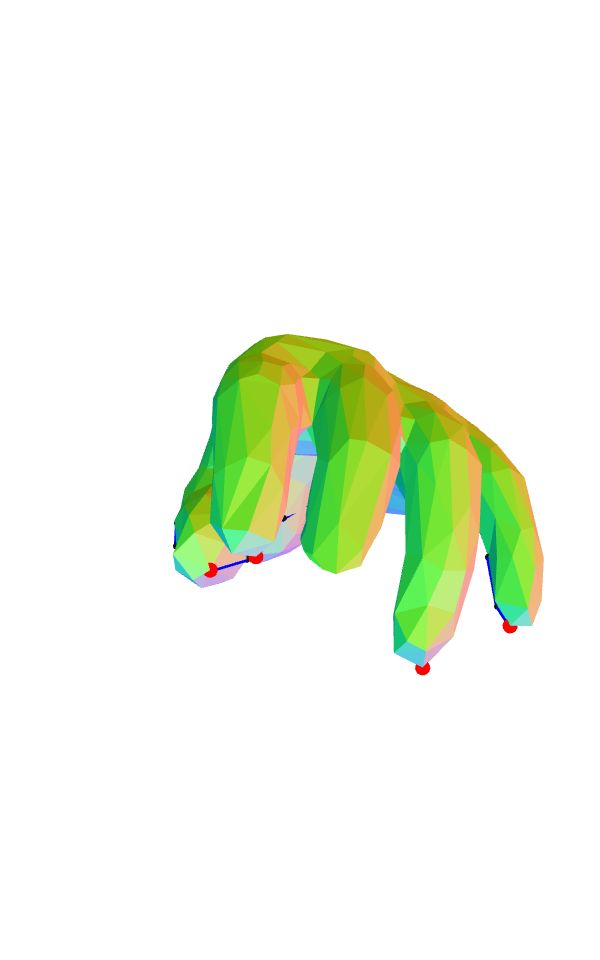

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Fingers bent down loosely.
fit of correct guess: 1.2810149038866872


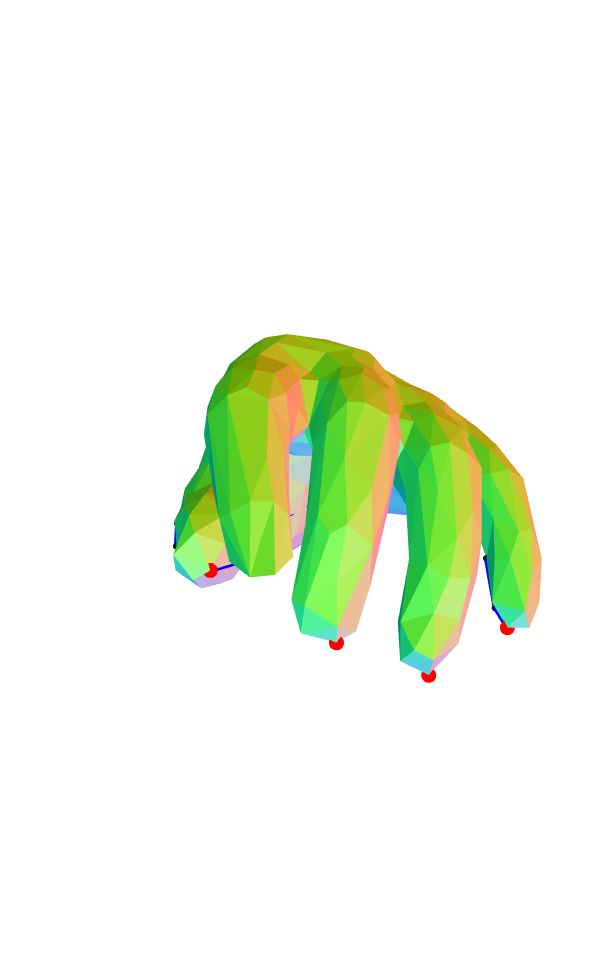

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Vertical hand; palm facing front; thumb extended 2nd finger partially flexed; 3rd finger flexed
fit of correct guess: 3.5058184045537466


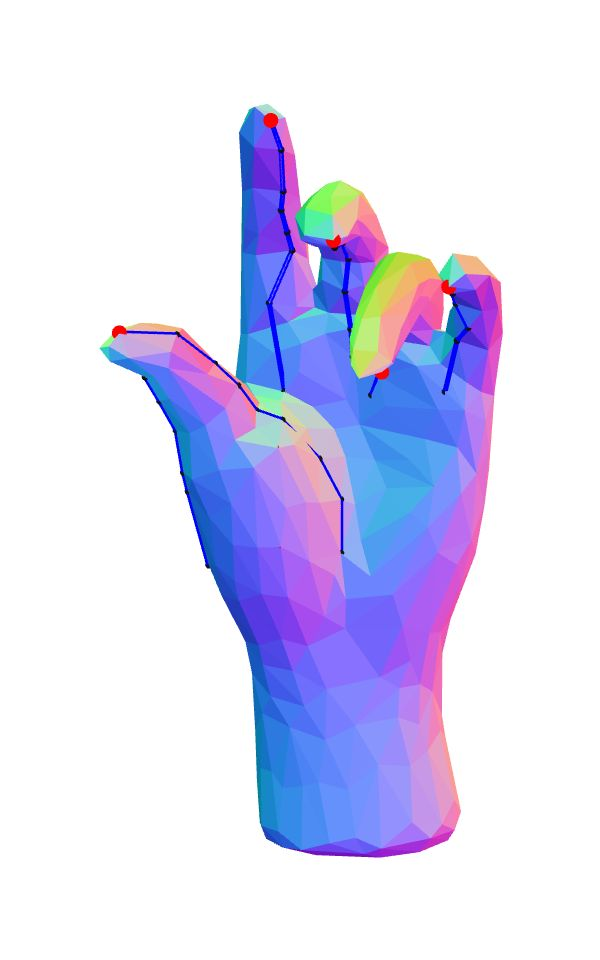

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand raised; palm forward; fingers relaxed
fit of correct guess: 1.2534473193891742


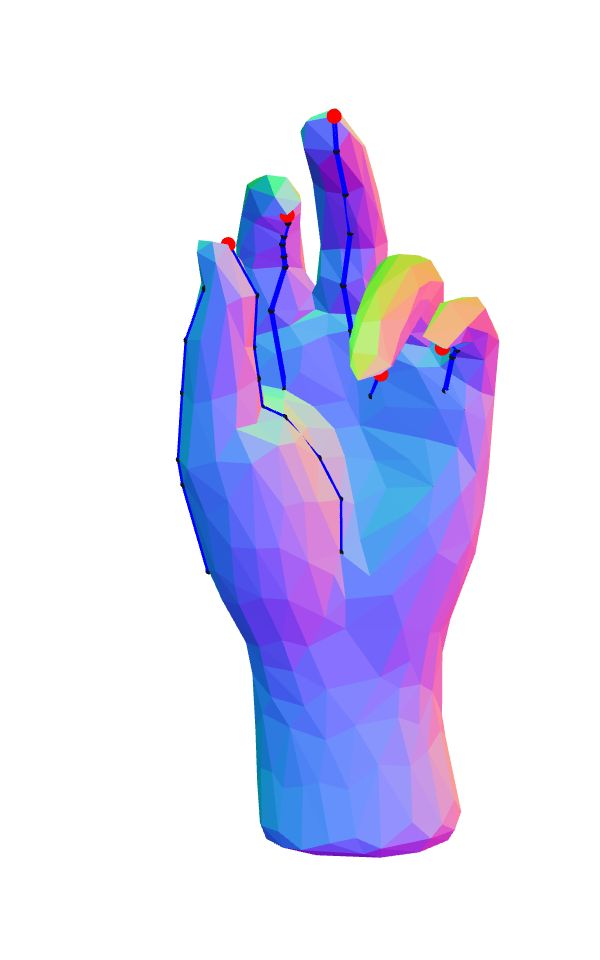

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of hand fingers slightly curled
fit of correct guess: 1.2065704656969318


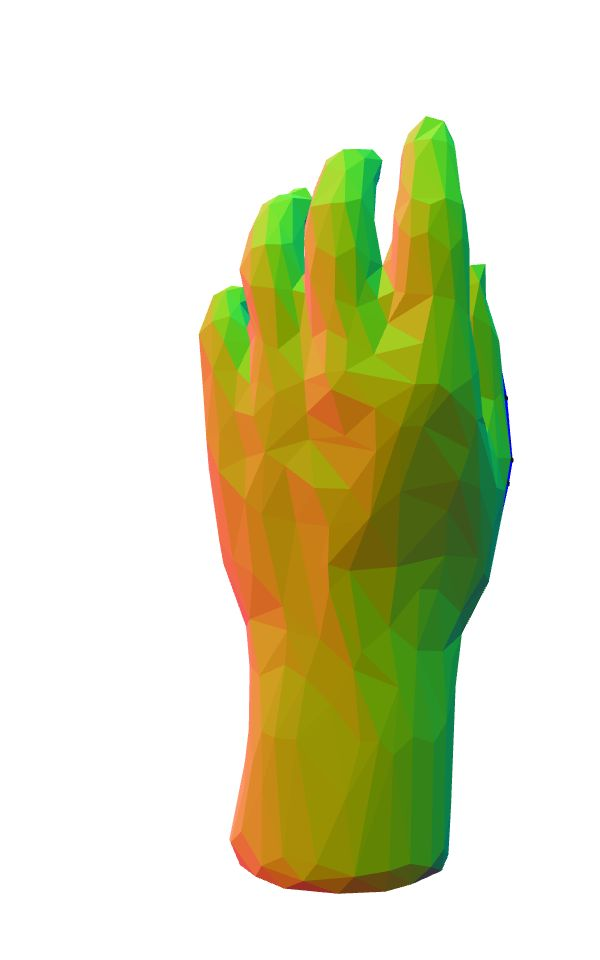

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
looks like three birds sitting in a branch;;
fit of correct guess: 2.1004434007843282


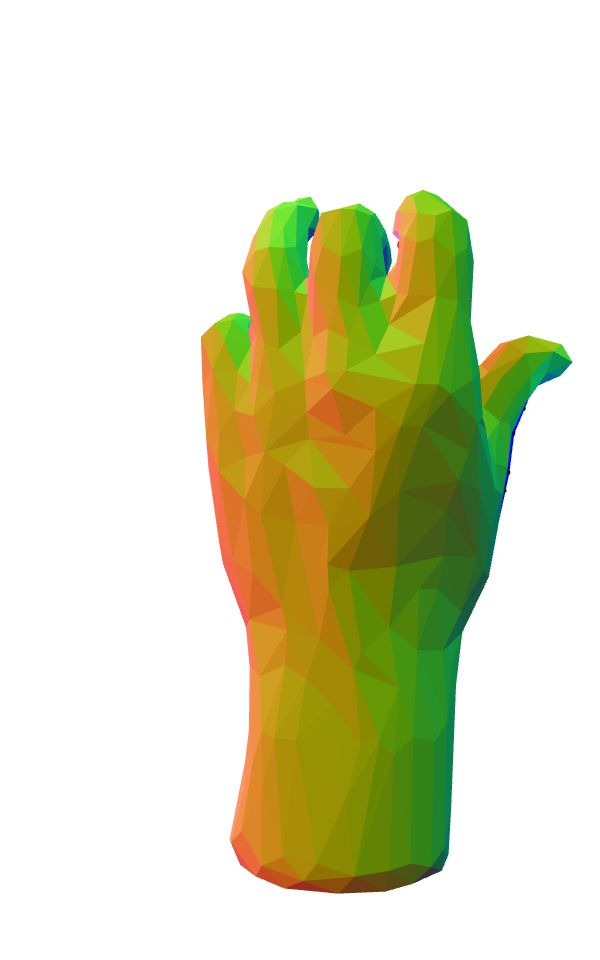

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Holding pull up bar
fit of correct guess: 1.36779219718208


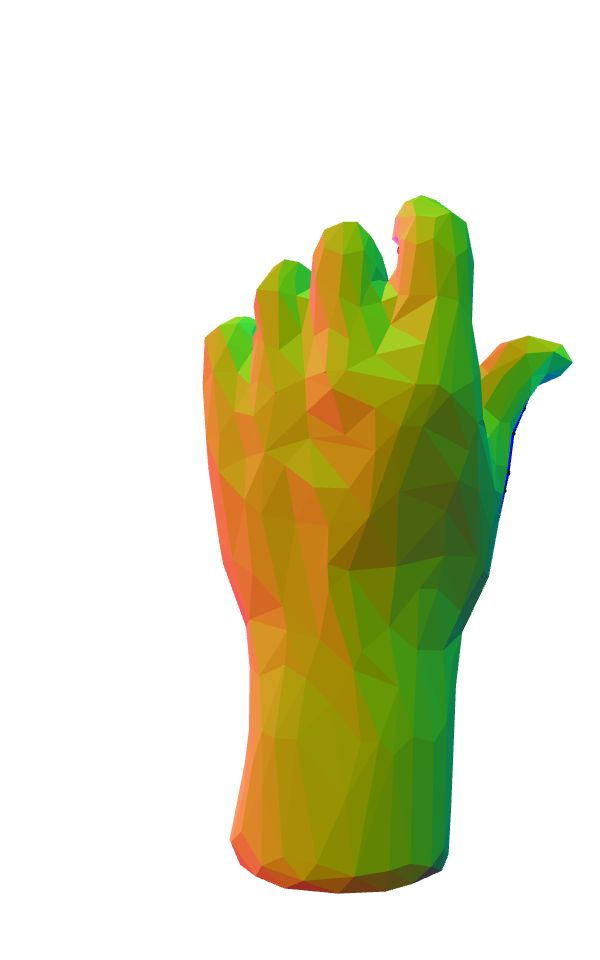

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
middle finger flexed hand
fit of correct guess: 0.7272721498036542


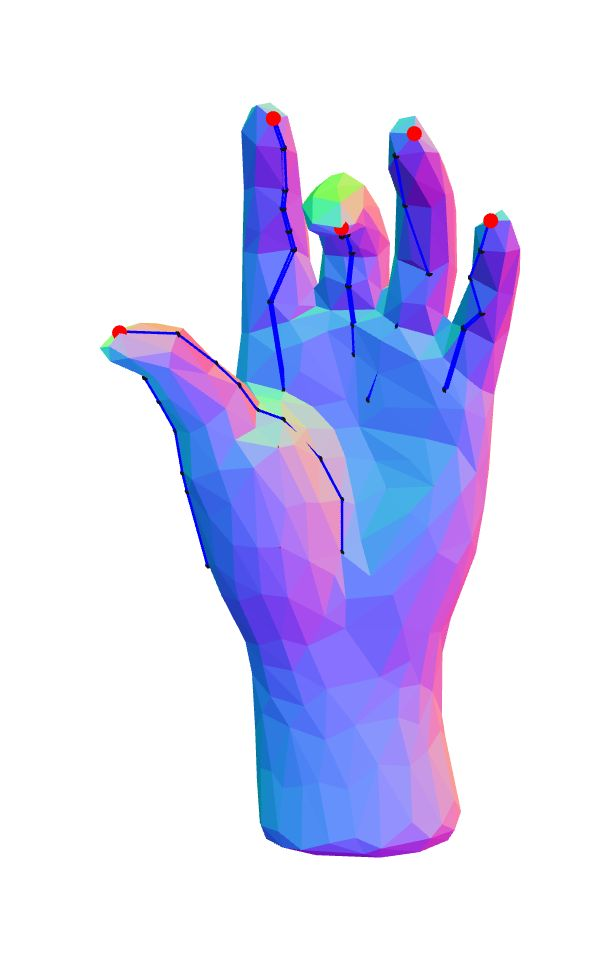

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand away thumb bent in and ring and pinky bent in
fit of correct guess: 2.3150798607241065


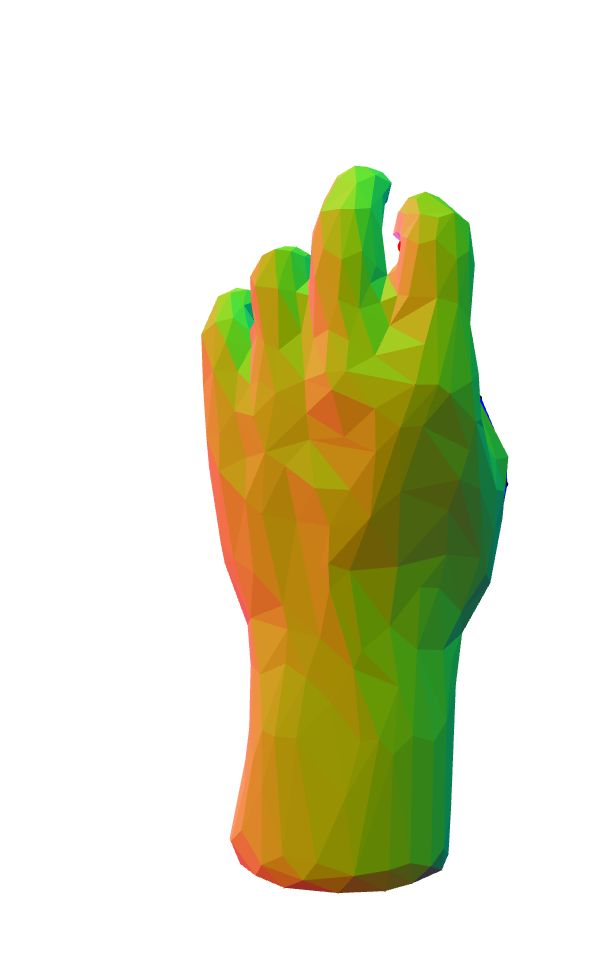

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Thumb tucked
fit of correct guess: 0.5745295929823678


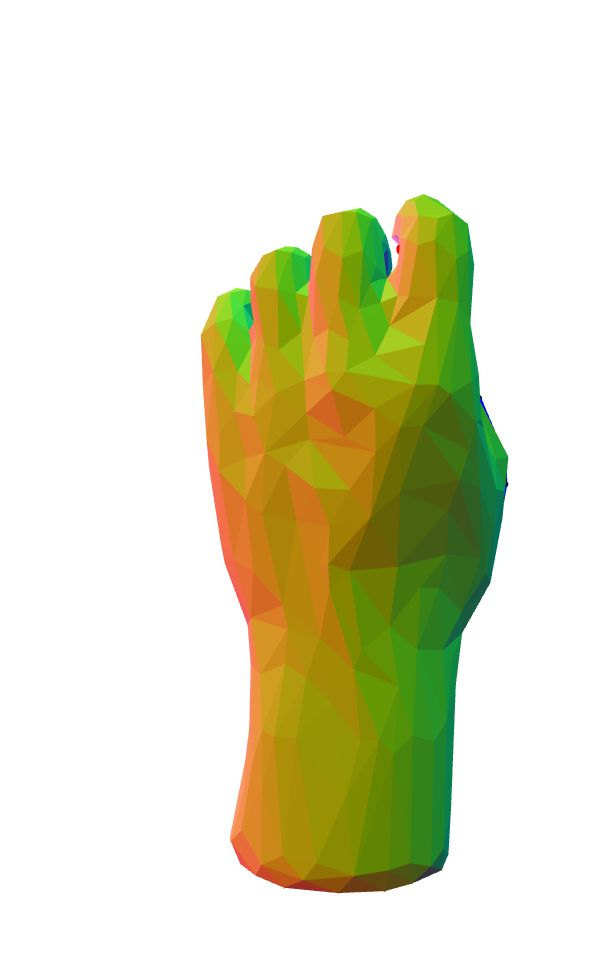

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
middle finger up; other fingers curved
fit of correct guess: 1.322945388158617


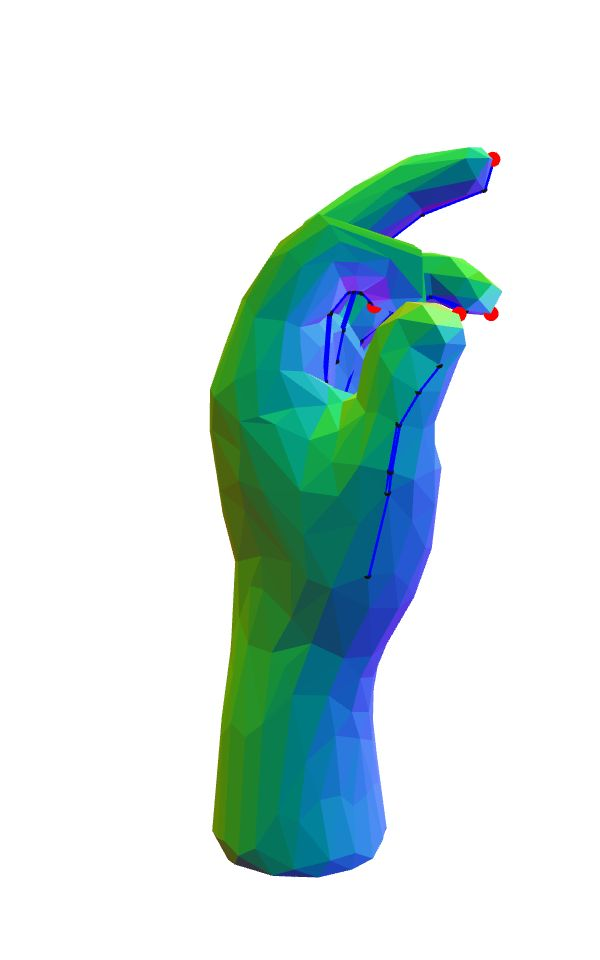

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Pronated hand; distal fingers facing front; thumb flexed
fit of correct guess: 1.985200897184211


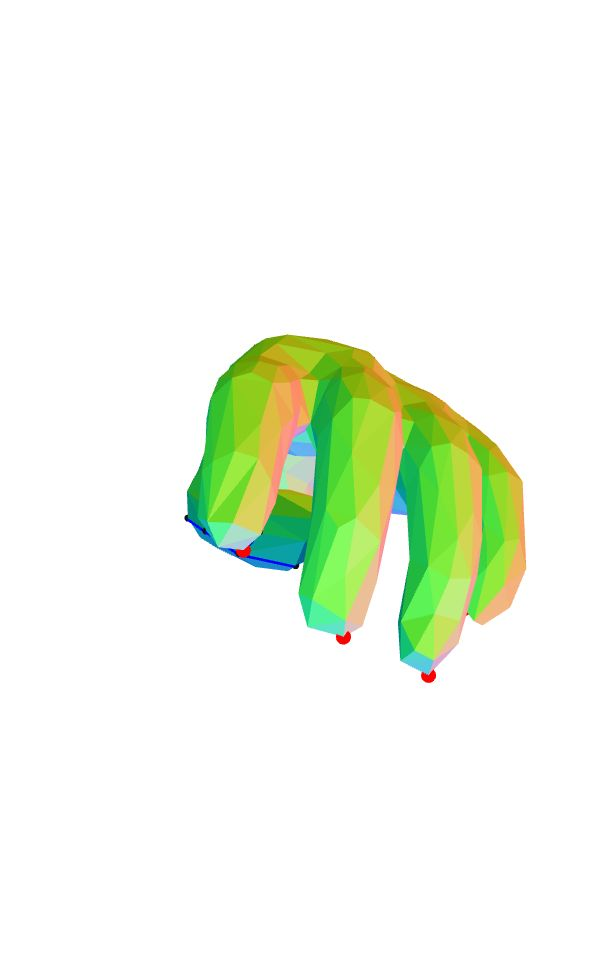

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Hand sideways with thumb and pointer finger bent inwards touching eachother
fit of correct guess: 2.1714517227264167


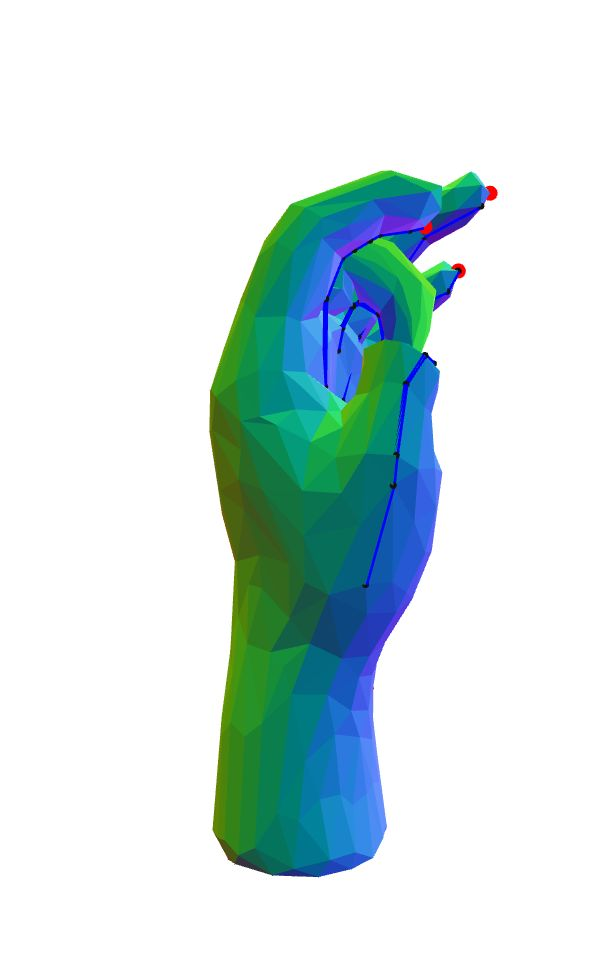

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Left hand; thumb & middle finger bent; index finger straight; ring & pinkie fingers slightly curled
fit of correct guess: 3.016786659168664


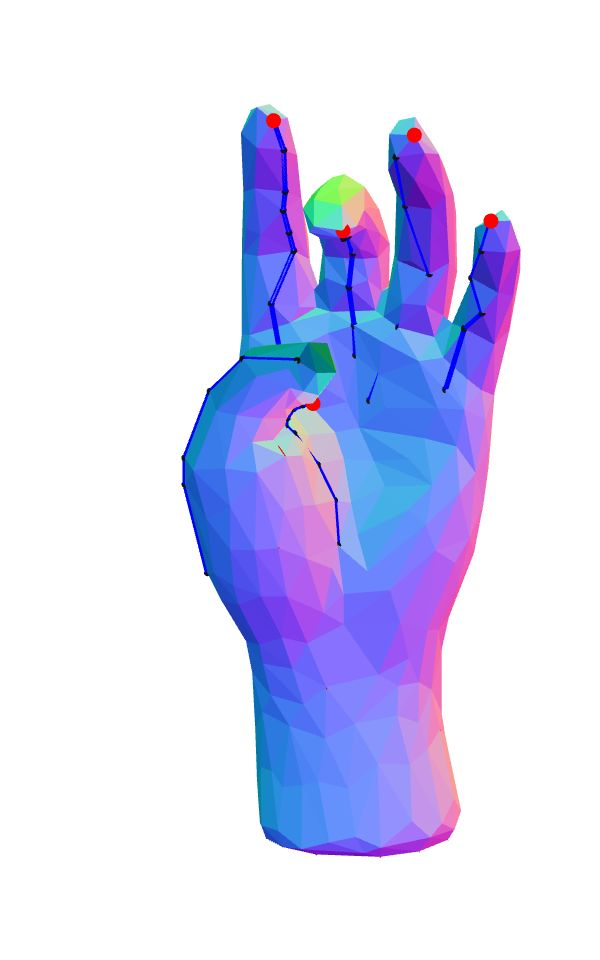

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb cramp and got stuck
fit of correct guess: 1.40190460200081


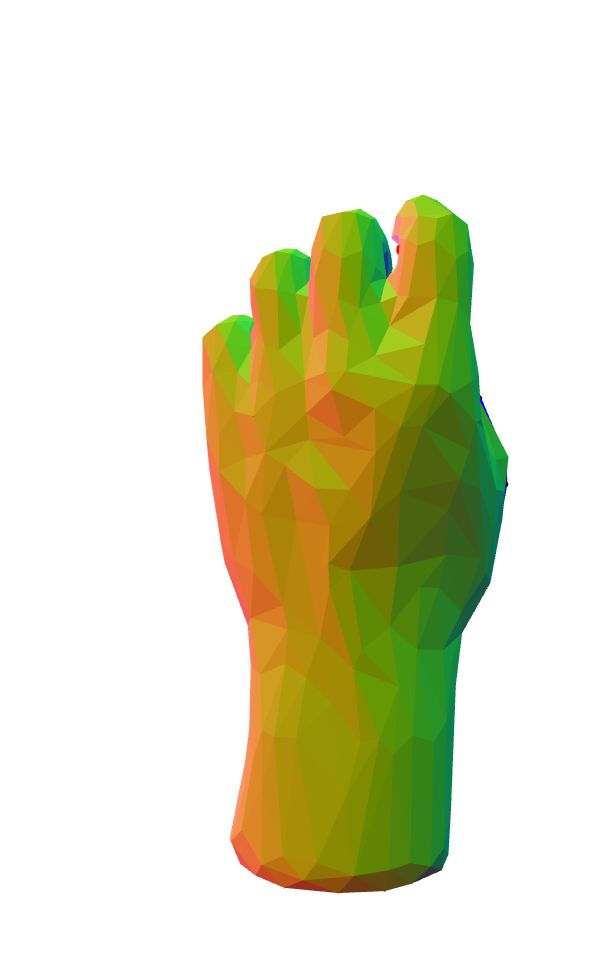

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
lifting something small
fit of correct guess: 0.7360985742333638


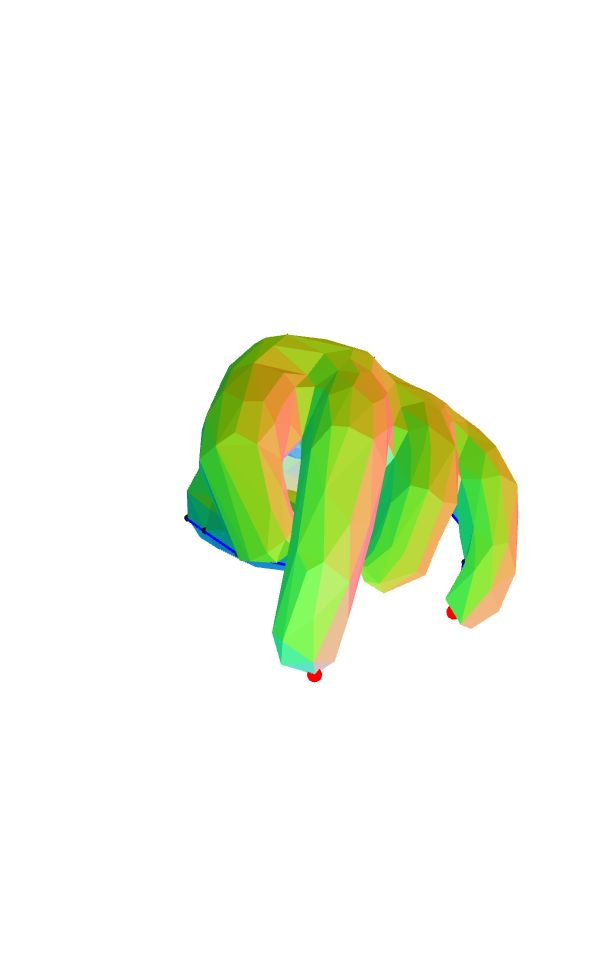

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand raised; palm facing self; ring finger slightly bent
fit of correct guess: 2.095450303243334


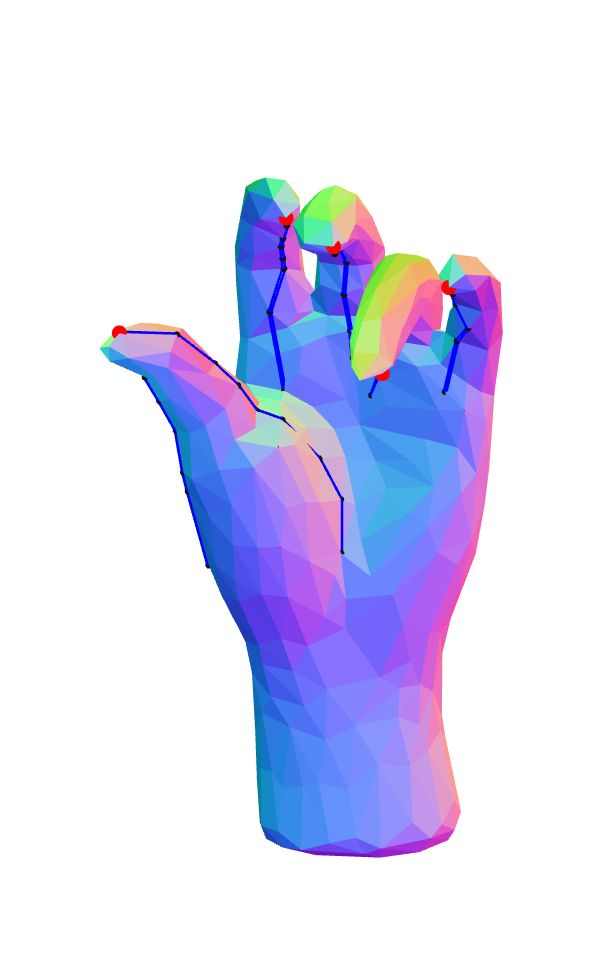

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
left hand facing left with fingers slightly curled downwards
fit of correct guess: 1.7890956409933678


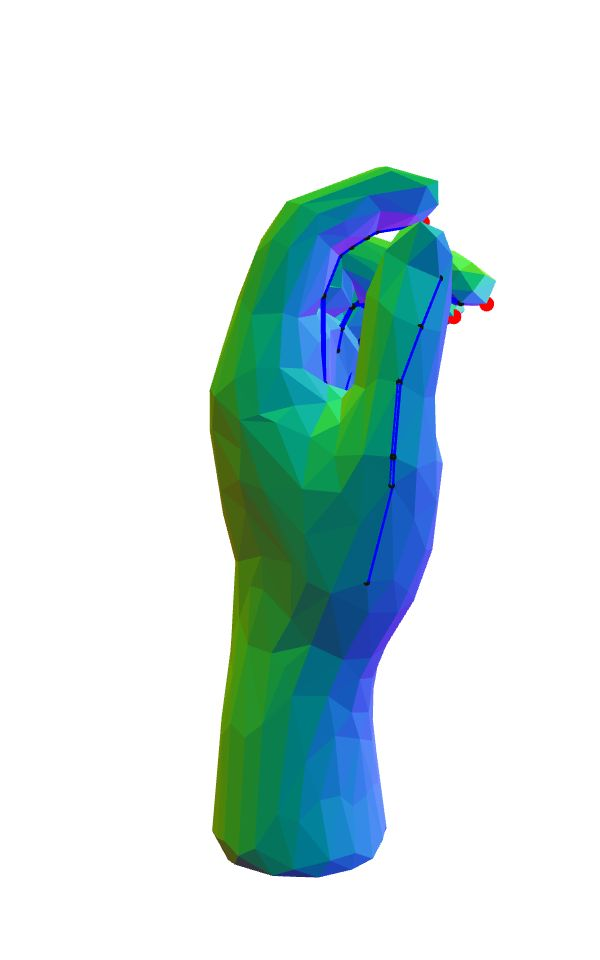

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Palm towards observer; thumb; index fingers straight up; others curled.
fit of correct guess: 3.2496083331671146


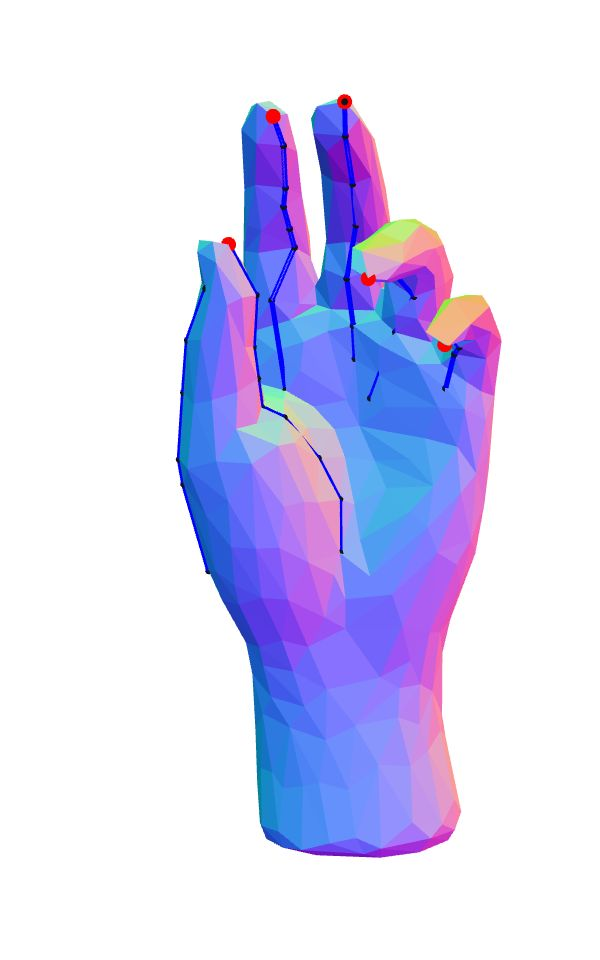

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
a hand waving goodbye
fit of correct guess: 1.0744609993957008


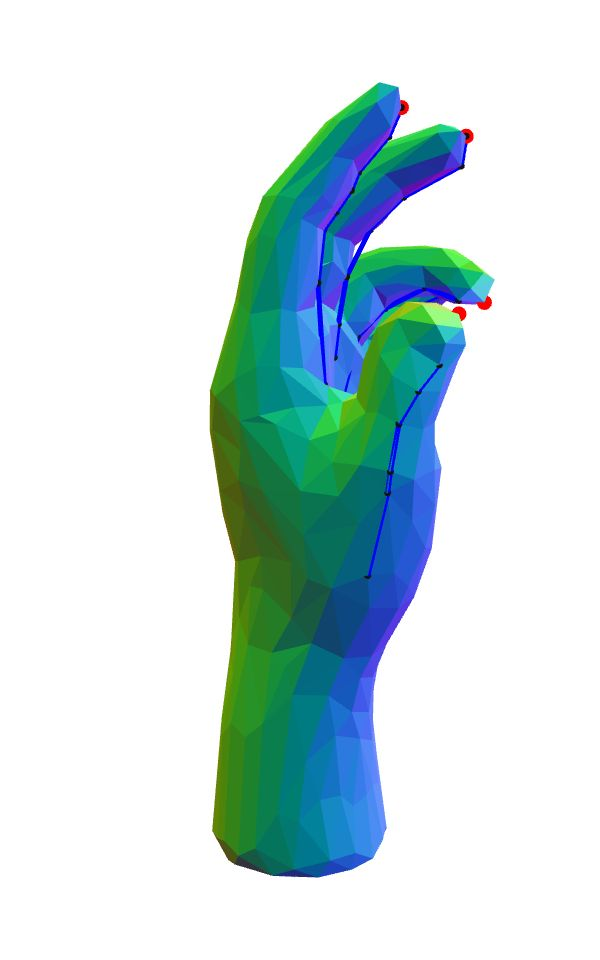

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
hand raised; palm facing self; thumb and index fingers extended; other fingers gently closed
fit of correct guess: 2.7483023565895177


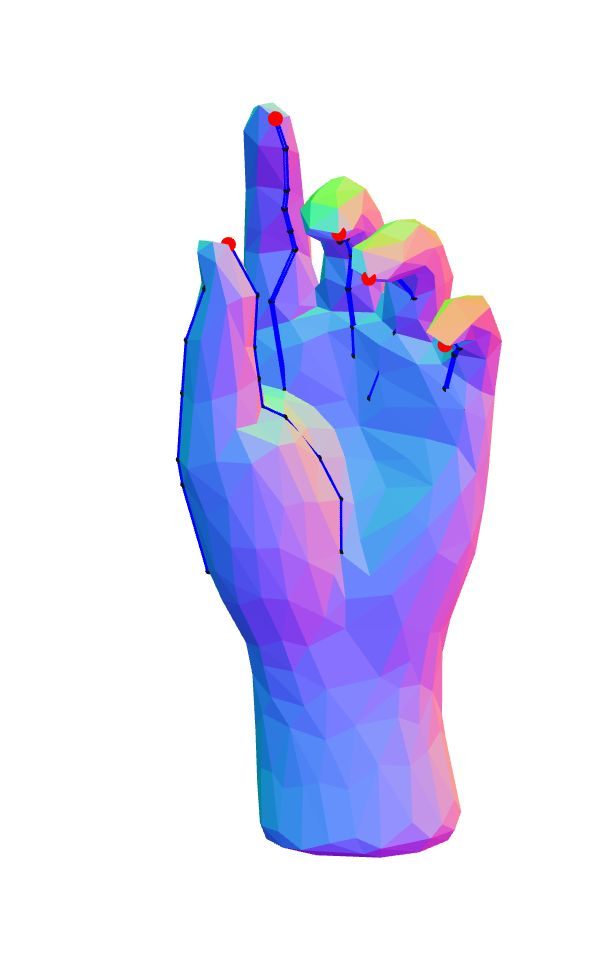

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
A hand position from the front with mostly contracted fingers but more extended middle finger
fit of correct guess: 2.775515782225697


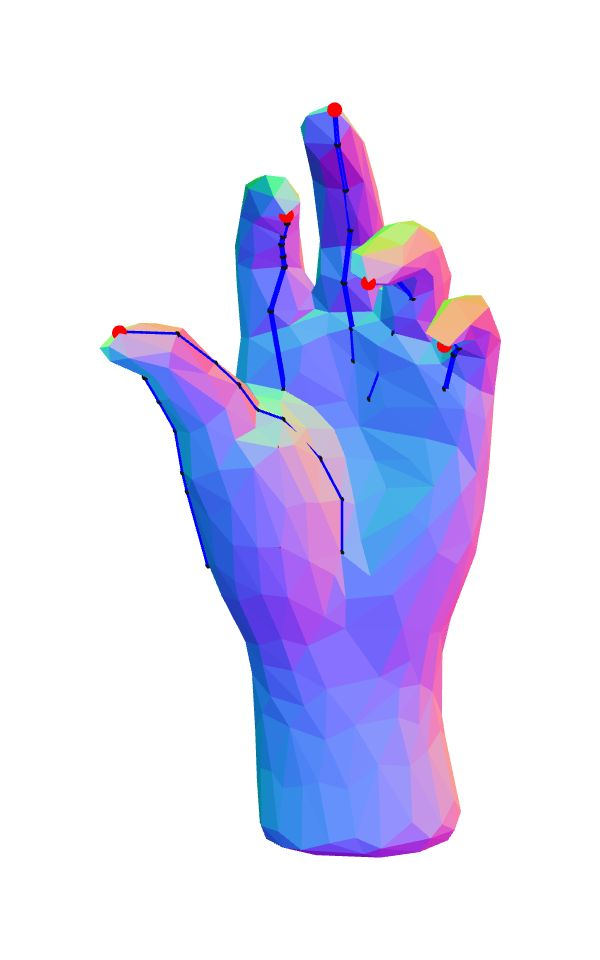

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Meh. Just go away.
fit of correct guess: 0.7835079152047512


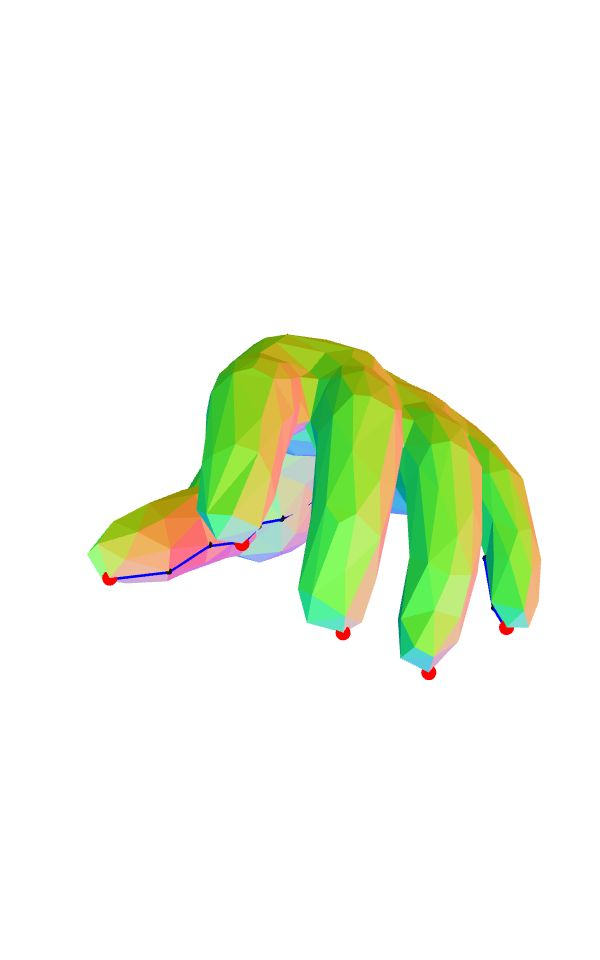

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
thumb and middle finger touching; other fingers sticking up
fit of correct guess: 1.8293162508217882


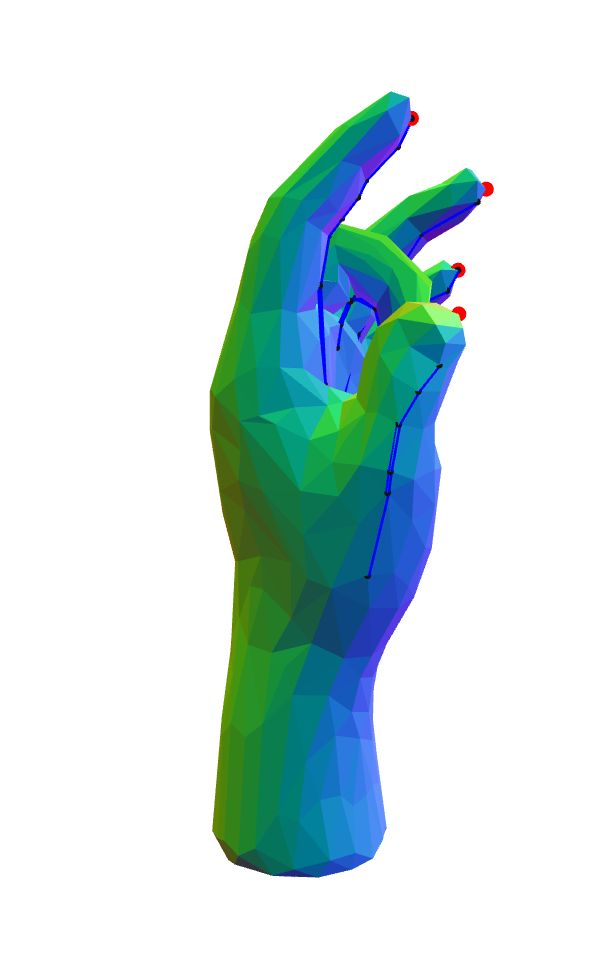

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
crawling left hand
fit of correct guess: 0.8211441989250107


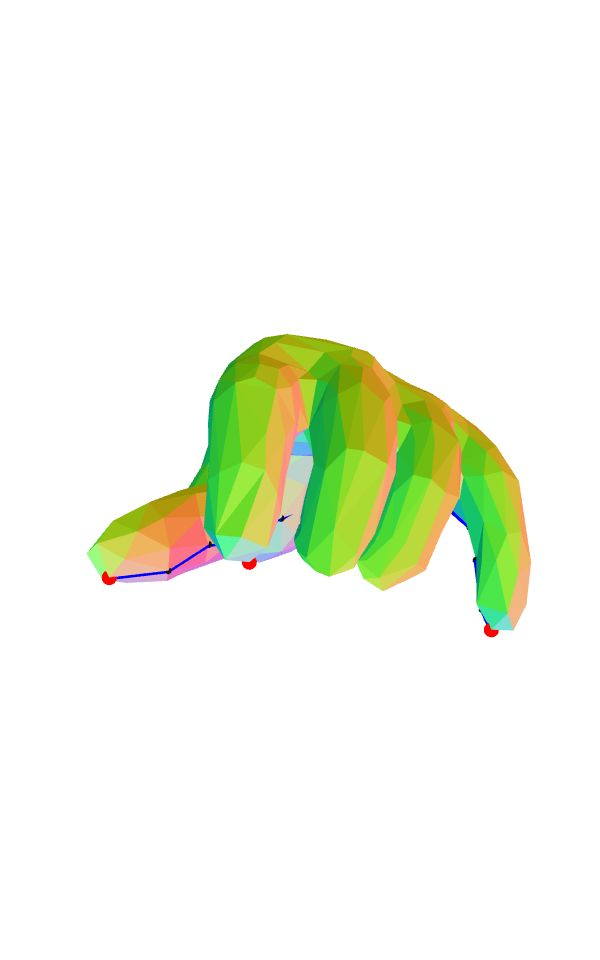

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
This is good or pleasing.
fit of correct guess: 0.9515644496100403


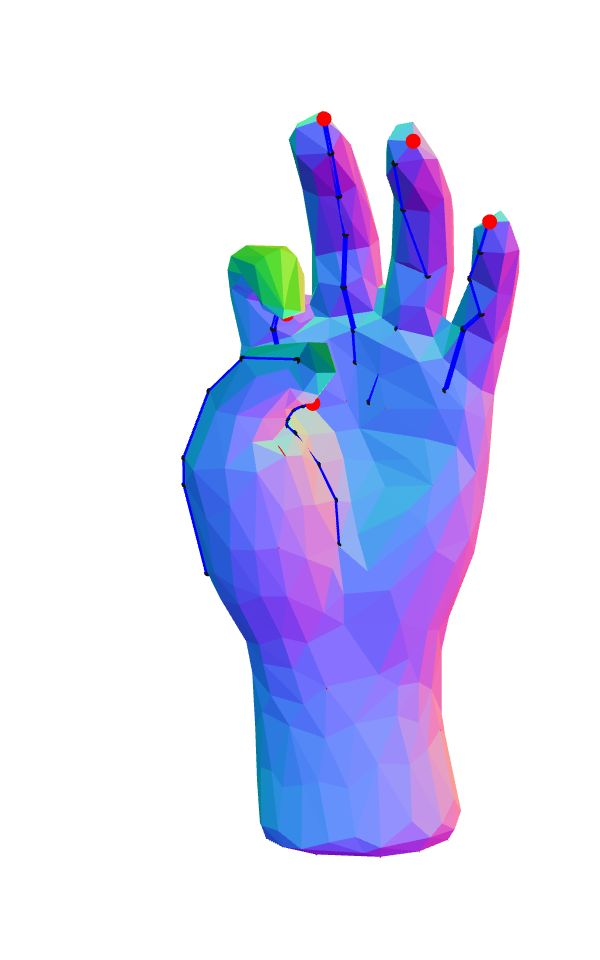

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
About to show a peace sign or count with 3 fingers
fit of correct guess: 2.5634871089117306


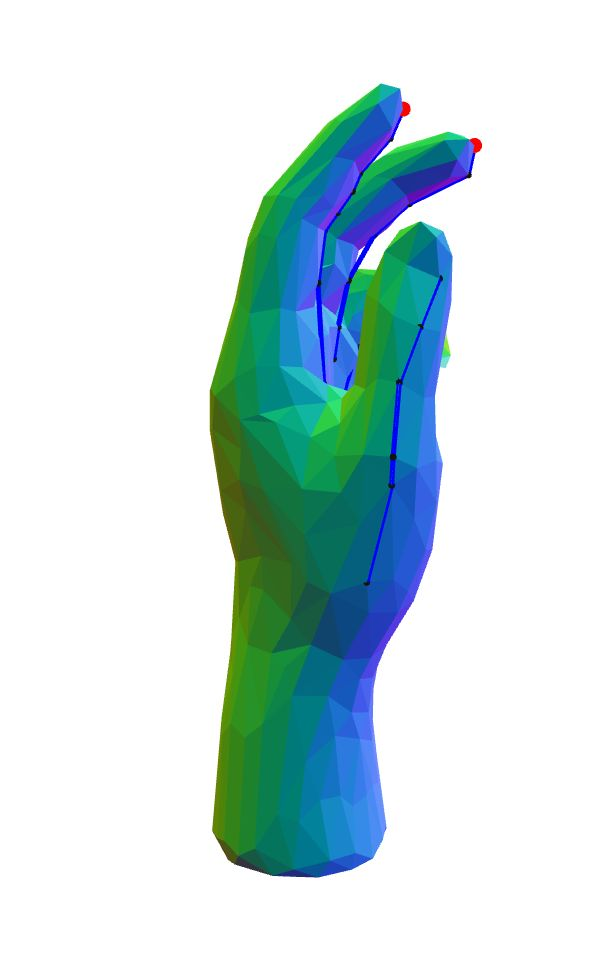

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Pronated hand with distal fingers facing front; thumb bent under palm and third finger flexed
fit of correct guess: 3.1386561285848047


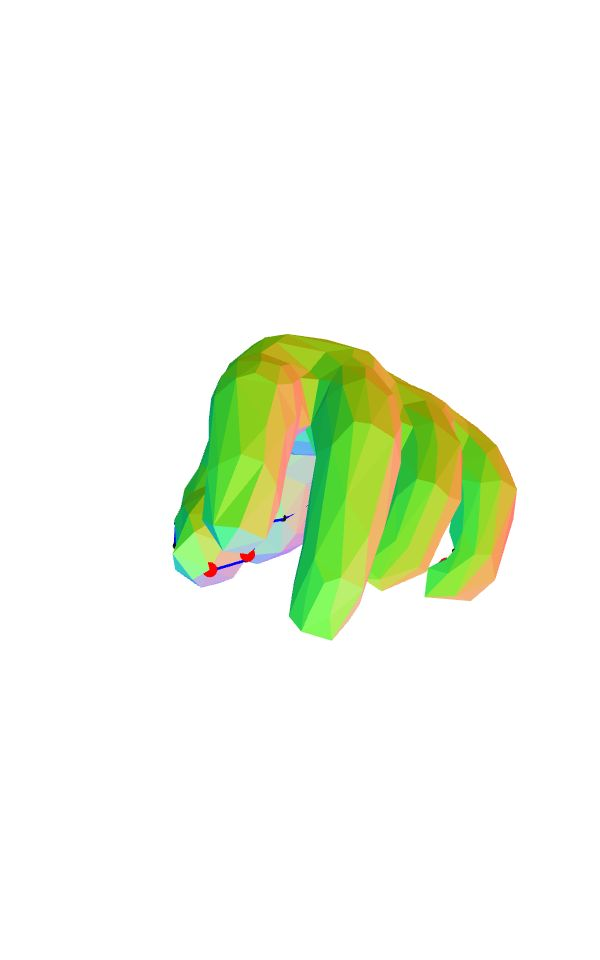

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
back of hand fingers slightly curled
fit of correct guess: 1.3340853224481883


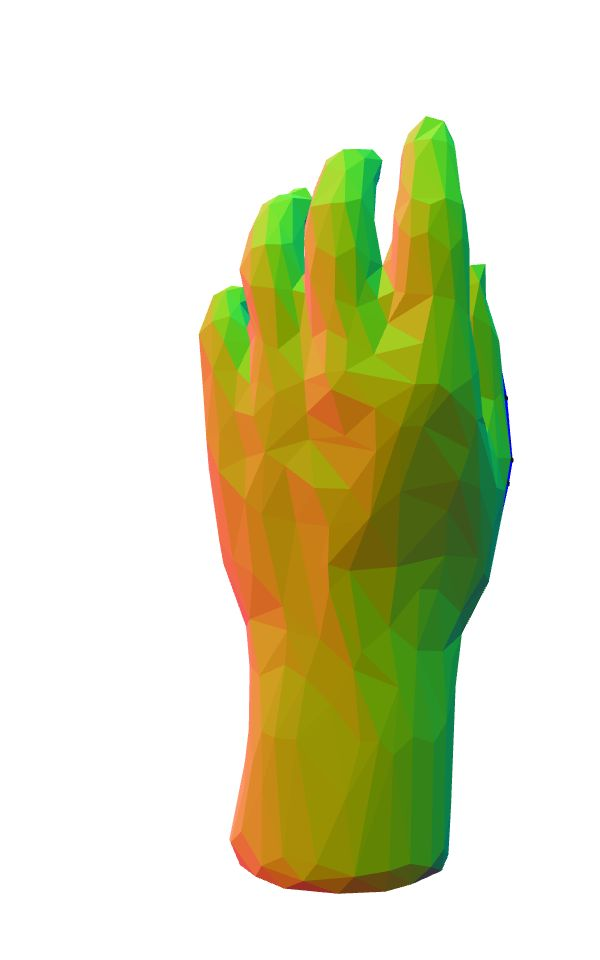

In [96]:
print("Pics that the model got right:")

i = 0
for pose in gold:
    if pose == guess[i]: 
        print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
        poseIDs = np.where(test_data["poseID"] == int(re.findall('\d+', pose)[0]))
        camera_angles = np.where(test_data["camera_angle"] == str(re.findall('\D+', pose)[0]))
        indexes = np.intersect1d(poseIDs, camera_angles)
        print(test_data.iloc[indexes[0]]["description"])
        print("fit of correct guess: " + str(guess_fit[i]))
        display(Image('../data/screenshots-jpg/pic{}.jpg'.format(pose), width=200, height=100))
    i+=1